In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
    FluxPointsEstimator,
    FluxPointsDataset,
    ReflectedRegionsBackgroundMaker,
    plot_spectrum_datasets_off_regions,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis
from itertools import combinations

In [3]:
import scipy.stats as stats
import math

In [4]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [5]:
l = [0.01,0.1,0.2,0.5]
livetime = [10,8,5,4,2] * u.h
n_obs = [100,125,200,250,500]
model_name = ['PowerLaw', 'Cutoff_value = 10GeV', 'Cutoff_value = 100GeV', 'Cutoff_value = 200GeV', 'Cutoff_value = 500GeV']
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 40), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 200), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [6]:
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
rows, cols = (5, 5) 
model = [[0 for i in range(cols)] for j in range(rows)]
print(model) 

[[0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0], [0, 0, 0, 0, 0]]


In [8]:
for i in range(5):
    model_simu = PowerLawSpectralModel(
        index=2.22,
        amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(model_simu) 
    mod = SkyModel(spectral_model=model_simu)
    model[i][0]=mod

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

In [9]:
simu = []
for j in range(4):
    for i in range(5):
        sim = ExpCutoffPowerLawSpectralModel(
            index=2.22,
            amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=l[j] * u.Unit("TeV-1"),
            alpha = 1,
        )
        mod = SkyModel(spectral_model=sim)
        model[i][j+1]=mod
    simu.append(sim)
    print(simu[j])

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-02   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True
ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    inde

In [10]:
obs = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        obs[i][j]=Observation.create(pointing=pointing, livetime=livetime[i], irfs=irfs)
        print(obs[i][j])

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 36000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 28800.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 18000.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 14400.0 s

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 7200.0 s

Info for OBS

In [11]:
dataset = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        dataset_empty = SpectrumDataset.create(
            e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
        )
        maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
        dataset[i][j]=maker.run(dataset_empty, obs[i][j])
        print(dataset[i][j])

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 4417.82

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 3.60e+04 s

    Number of total bins            : 0 
    Number of fit bins              : 39 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 3534.26

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.88e+04 s

    Number of total bins            : 0 
    Number of fit bins 

SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 883.56

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 7.20e+03 s

    Number of total bins            : 0 
    Number of fit bins              : 39 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : nan 
    Total predicted counts          : nan
    Total background counts         : 4417.82

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 3.60e+04 s

    Number of total bins            : 0 
    Number of fit bins  

In [12]:
data = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        dataset[i][j].model = model[i][j]
        dataset[i][j].fake(random_state=42)
        print(dataset[i][j])
        data[i][j]=dataset[i][j]

SpectrumDataset

    Name                            : 1 

    Total counts                    : 4378 
    Total predicted counts          : nan
    Total background counts         : 4417.82

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 3.60e+04 s

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0


SpectrumDataset

    Name                            : 1 

    Total counts                    : 3498 
    Total predicted counts          : nan
    Total background counts         : 3534.26

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.88e+04 s

    Number of total bins            : 39 
    Number of fit b

In [13]:
data_onoff = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        dataset_onoff = SpectrumDatasetOnOff(
            aeff=data[i][j].aeff,
            edisp=data[i][j].edisp,
            models=model[i][j],
            livetime=livetime[i],
            acceptance=1,
            acceptance_off=5,
        )
        dataset_onoff.fake(background_model=data[i][j].background)
        print(dataset_onoff)
        data_onoff[i][j]=dataset_onoff

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 7976 
    Total predicted counts          : 7893.89
    Total off counts                : 22028.00

    Total background counts         : 4405.60

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 33.90

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 6328 
    Total predicted counts          : 6337.23
    Total off counts                : 17733.00

    Total background counts         : 3546.60

    Eff

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 7078 
    Total predicted counts          : 7091.01
    Total off counts                : 22155.00

    Total background counts         : 4431.00

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 26.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 5561 
    Total predicted counts          : 5694.41
    Total off counts                : 17832.00

    Total background counts         : 3566.40

    Eff

In [14]:
%%time
datas = [[0 for i in range(cols)] for j in range(rows)]
for j in range(5):
    for i in range(5):
        datasets = []
        for idx in range(n_obs[i]):
            data_onoff[i][j].fake(random_state=idx, background_model=data[i][j].background)
            data_onoff[i][j].name = f"obs_{idx}"
            datasets.append(data_onoff[i][j].copy())
        datas[i][j]=datasets

CPU times: user 21.2 s, sys: 360 ms, total: 21.5 s
Wall time: 21.5 s


In [15]:
print(*datas[0][0], sep = "\n")
print(*datas[4][4], sep = "\n")

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 8090 
    Total predicted counts          : 7925.69
    Total off counts                : 22187.00

    Total background counts         : 4437.40

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 42.79

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 7834 
    Total predicted counts          : 7917.69
    Total off counts                : 22147.00

    Total background counts         : 4429.4

SpectrumDatasetOnOff

    Name                            : obs_24 

    Total counts                    : 8135 
    Total predicted counts          : 7884.49
    Total off counts                : 21981.00

    Total background counts         : 4396.20

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 41.98

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_25 

    Total counts                    : 7781 
    Total predicted counts          : 7935.29
    Total off counts                : 22235.00

    Total background counts         : 4447

SpectrumDatasetOnOff

    Name                            : obs_51 

    Total counts                    : 7891 
    Total predicted counts          : 7944.89
    Total off counts                : 22283.00

    Total background counts         : 4456.60

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 57.17

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_52 

    Total counts                    : 7792 
    Total predicted counts          : 7934.09
    Total off counts                : 22229.00

    Total background counts         : 4445

SpectrumDatasetOnOff

    Name                            : obs_83 

    Total counts                    : 7930 
    Total predicted counts          : 7971.69
    Total off counts                : 22417.00

    Total background counts         : 4483.40

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 1.00e+01 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 35.21

    Number of parameters            : 3
    Number of free parameters       : 2

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_84 

    Total counts                    : 7778 
    Total predicted counts          : 7912.69
    Total off counts                : 22122.00

    Total background counts         : 4424

SpectrumDatasetOnOff

    Name                            : obs_15 

    Total counts                    : 1411 
    Total predicted counts          : 1407.00
    Total off counts                : 4375.00

    Total background counts         : 875.00

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_16 

    Total counts                    : 1420 
    Total predicted counts          : 1405.60
    Total off counts                : 4368.00

    Total background counts         : 873.60


SpectrumDatasetOnOff

    Name                            : obs_47 

    Total counts                    : 1407 
    Total predicted counts          : 1424.80
    Total off counts                : 4464.00

    Total background counts         : 892.80

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 26.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_48 

    Total counts                    : 1407 
    Total predicted counts          : 1401.60
    Total off counts                : 4348.00

    Total background counts         : 869.60


SpectrumDatasetOnOff

    Name                            : obs_79 

    Total counts                    : 1468 
    Total predicted counts          : 1403.60
    Total off counts                : 4358.00

    Total background counts         : 871.60

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 29.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_80 

    Total counts                    : 1413 
    Total predicted counts          : 1428.00
    Total off counts                : 4480.00

    Total background counts         : 896.00


SpectrumDatasetOnOff

    Name                            : obs_110 

    Total counts                    : 1435 
    Total predicted counts          : 1410.80
    Total off counts                : 4394.00

    Total background counts         : 878.80

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_111 

    Total counts                    : 1398 
    Total predicted counts          : 1415.00
    Total off counts                : 4415.00

    Total background counts         : 883.0

SpectrumDatasetOnOff

    Name                            : obs_140 

    Total counts                    : 1404 
    Total predicted counts          : 1418.40
    Total off counts                : 4432.00

    Total background counts         : 886.40

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_141 

    Total counts                    : 1382 
    Total predicted counts          : 1423.20
    Total off counts                : 4456.00

    Total background counts         : 891.2

SpectrumDatasetOnOff

    Name                            : obs_170 

    Total counts                    : 1393 
    Total predicted counts          : 1437.20
    Total off counts                : 4526.00

    Total background counts         : 905.20

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 39.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_171 

    Total counts                    : 1399 
    Total predicted counts          : 1425.00
    Total off counts                : 4465.00

    Total background counts         : 893.0

SpectrumDatasetOnOff

    Name                            : obs_200 

    Total counts                    : 1494 
    Total predicted counts          : 1391.60
    Total off counts                : 4298.00

    Total background counts         : 859.60

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 34.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_201 

    Total counts                    : 1380 
    Total predicted counts          : 1416.80
    Total off counts                : 4424.00

    Total background counts         : 884.8

SpectrumDatasetOnOff

    Name                            : obs_232 

    Total counts                    : 1393 
    Total predicted counts          : 1399.20
    Total off counts                : 4336.00

    Total background counts         : 867.20

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 46.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_233 

    Total counts                    : 1338 
    Total predicted counts          : 1388.40
    Total off counts                : 4282.00

    Total background counts         : 856.4

SpectrumDatasetOnOff

    Name                            : obs_264 

    Total counts                    : 1443 
    Total predicted counts          : 1417.00
    Total off counts                : 4425.00

    Total background counts         : 885.00

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_265 

    Total counts                    : 1437 
    Total predicted counts          : 1434.00
    Total off counts                : 4510.00

    Total background counts         : 902.0

SpectrumDatasetOnOff

    Name                            : obs_295 

    Total counts                    : 1422 
    Total predicted counts          : 1429.20
    Total off counts                : 4486.00

    Total background counts         : 897.20

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 24.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_296 

    Total counts                    : 1449 
    Total predicted counts          : 1405.00
    Total off counts                : 4365.00

    Total background counts         : 873.0

SpectrumDatasetOnOff

    Name                            : obs_327 

    Total counts                    : 1399 
    Total predicted counts          : 1408.80
    Total off counts                : 4384.00

    Total background counts         : 876.80

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_328 

    Total counts                    : 1439 
    Total predicted counts          : 1415.20
    Total off counts                : 4416.00

    Total background counts         : 883.2

SpectrumDatasetOnOff

    Name                            : obs_359 

    Total counts                    : 1396 
    Total predicted counts          : 1412.60
    Total off counts                : 4403.00

    Total background counts         : 880.60

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 25.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_360 

    Total counts                    : 1399 
    Total predicted counts          : 1389.40
    Total off counts                : 4287.00

    Total background counts         : 857.4

SpectrumDatasetOnOff

    Name                            : obs_390 

    Total counts                    : 1408 
    Total predicted counts          : 1439.60
    Total off counts                : 4538.00

    Total background counts         : 907.60

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_391 

    Total counts                    : 1418 
    Total predicted counts          : 1392.40
    Total off counts                : 4302.00

    Total background counts         : 860.4

SpectrumDatasetOnOff

    Name                            : obs_420 

    Total counts                    : 1374 
    Total predicted counts          : 1432.80
    Total off counts                : 4504.00

    Total background counts         : 900.80

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 24.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_421 

    Total counts                    : 1383 
    Total predicted counts          : 1405.60
    Total off counts                : 4368.00

    Total background counts         : 873.6

SpectrumDatasetOnOff

    Name                            : obs_453 

    Total counts                    : 1395 
    Total predicted counts          : 1401.20
    Total off counts                : 4346.00

    Total background counts         : 869.20

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 32.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_454 

    Total counts                    : 1390 
    Total predicted counts          : 1429.80
    Total off counts                : 4489.00

    Total background counts         : 897.8

SpectrumDatasetOnOff

    Name                            : obs_484 

    Total counts                    : 1478 
    Total predicted counts          : 1451.00
    Total off counts                : 4595.00

    Total background counts         : 919.00

    Effective area min              : 2.80e+04 m2
    Effective area max              : 5.73e+06 m2

    Livetime                        : 2.00e+00 h

    Number of total bins            : 39 
    Number of fit bins              : 39 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_485 

    Total counts                    : 1498 
    Total predicted counts          : 1408.80
    Total off counts                : 4384.00

    Total background counts         : 876.8

/home/rishank/anaconda2/envs/gammapy-0.15/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


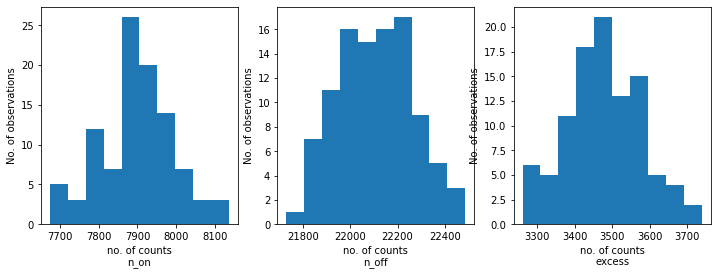

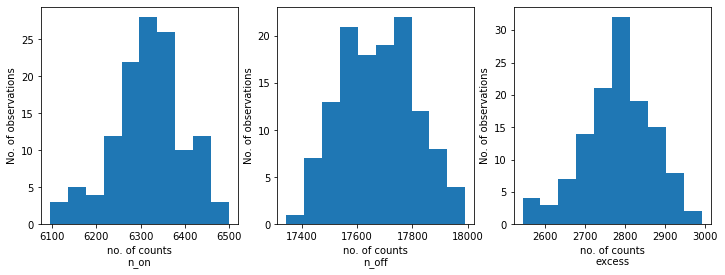

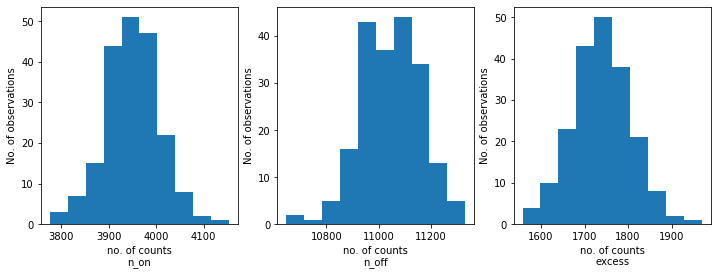

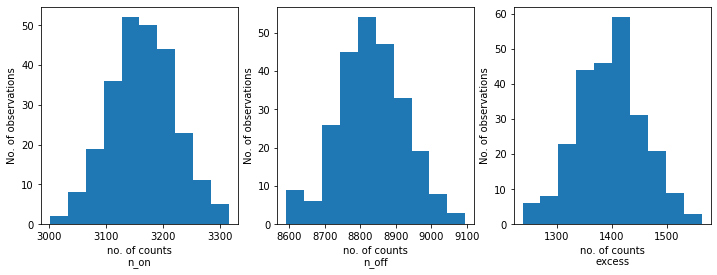

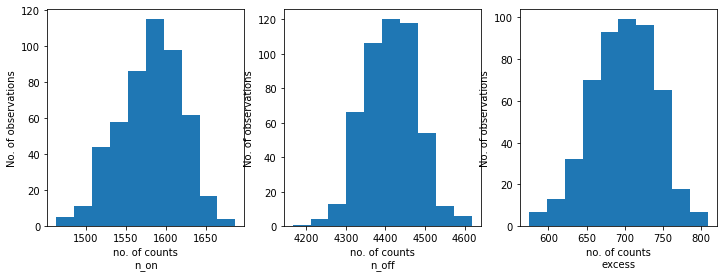

...

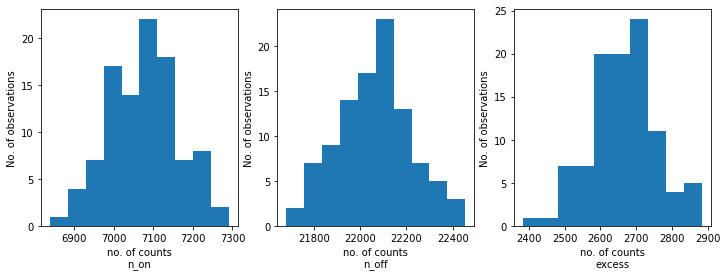

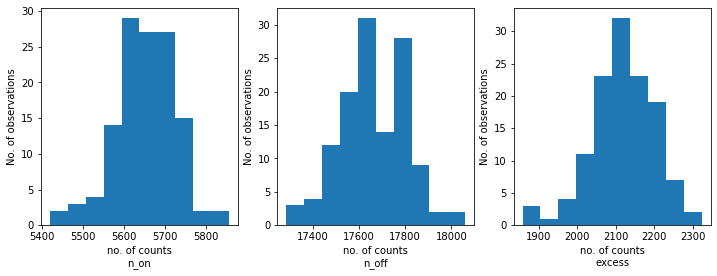

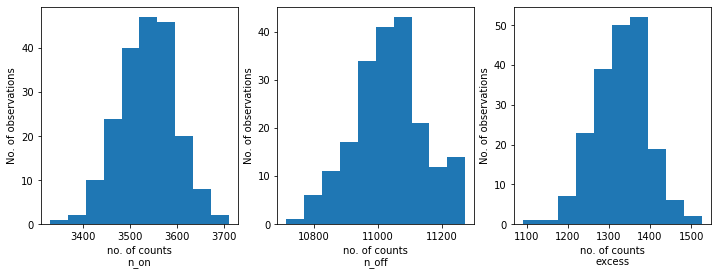

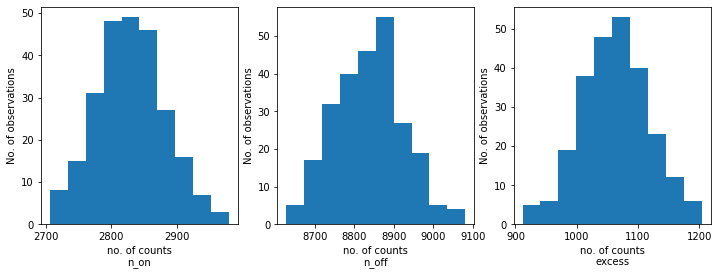

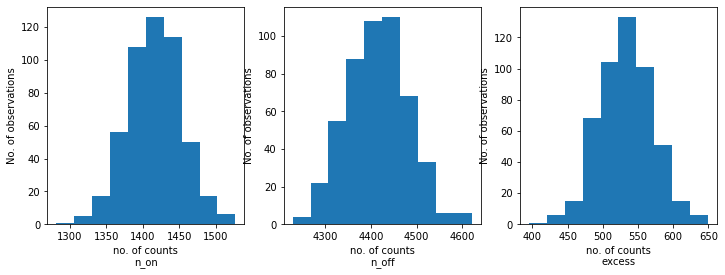

In [16]:
for j in range(5):
    for i in range(5):
        n_on = [dataset.counts.data.sum() for dataset in datas[i][j]]
        n_off = [dataset.counts_off.data.sum() for dataset in datas[i][j]]
        excess = [dataset.excess.data.sum() for dataset in datas[i][j]]
        
        fix, axes = plt.subplots(1, 3, figsize=(12, 4))
        axes[0].hist(n_on)
        axes[0].set_xlabel("no. of counts\nn_on")
        axes[0].set_ylabel("No. of observations")
        axes[1].hist(n_off)
        axes[1].set_xlabel("no. of counts\nn_off")
        axes[1].set_ylabel("No. of observations")
        axes[2].hist(excess)
        axes[2].set_xlabel("no. of counts\nexcess");
        axes[2].set_ylabel("No. of observations")

In [17]:
%%time
res = [[0 for i in range(cols)] for j in range(rows)]
fpes_all = [[0 for i in range(cols)] for j in range(rows)]
model_best_joints_all = [[0 for i in range(cols)] for j in range(rows)]
e_edges = np.logspace(-1.5, 2.0, 10) * u.TeV
for i in range(5):
    results = []
    fpes = []
    model_best_joints = []
    for dataset in datas[i][0]:
        dataset.models = model[i][0].copy()
        fit = Fit([dataset])
        result = fit.run()
        results.append(
            {
                "index": result.parameters["index"].value,
                "amplitude": result.parameters["amplitude"].value,
                "reference":result.parameters["reference"].value,
            }
        )
        print(result.parameters.to_table())
        fpe = FluxPointsEstimator(datasets=[dataset], e_edges=e_edges)
        flux_points = fpe.run()
        print(flux_points.table_formatted)
        fpes.append(flux_points)
        model_best_joint = model[i][0].copy()
        model_best_joint.spectral_model.parameters.covariance = (result.parameters.covariance)
        model_best_joints.append(model_best_joint)
    res[i][0]=results
    fpes_all[i][0]=fpes
    model_best_joints_all[i][0]=model_best_joints

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.242e+00 1.451e-02                nan nan  False
amplitude 1.291e-12 3.089e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.001e-10       1.009e-10       9.931e-11
 0.121  0.072   0.203 ...       6.666e-12       6.704e-12       6.628e-12
 0.307  0.203   0.464 ...       8.878e-13       8.942e-13       8.814e-13
 0.702  0.464   1.061 ...       1.618e-13       1.647e-13       1.590e-13
 1.778  1.061   2.981 ...       1.886e-14       1.927e-14       1.846e-14
 4.507  2.981   6.813 ...       3.276e-15       3.353e-15       3.201e-15
10.300  6.813  15.571 ...       8.

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.753e-11       9.803e-11       9.703e-11
 0.121  0.072   0.203 ...       6.529e-12       6.538e-12       6.520e-12
 0.307  0.203   0.464 ...       8.947e-13       9.014e-13       8.880e-13
 0.702  0.464   1.061 ...       1.522e-13       1.545e-13       1.499e-13
 1.778  1.061   2.981 ...       1.948e-14       1.985e-14       1.912e-14
 4.507  2.981   6.813 ...       3.234e-15       3.327e-15       3.144e-15
10.300  6.813  15.571 ...       8.124e-16       8.426e-16       7.829e-16
26.102 15.571  43.755 ...       1.406e-16       1.477e-16       1.337e-16
66.147 43.755 100.000 ...       3.713e-17       4.109e-17       3.346e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.866e-11       9.917e-11       9.815e-11
 0.121  0.072   0.203 ...       6.704e-12       6.698e-12       6.709e-12
 0.307  0.203   0.464 ...       8.971e-13       9.056e-13       8.887e-13
 0.702  0.464   1.061 ...       1.614e-13       1.637e-13       1.592e-13
 1.778  1.061   2.981 ...       1.910e-14       1.942e-14       1.879e-14
 4.507  2.981   6.813 ...       3.088e-15       3.164e-15       3.014e-15
10.300  6.813  15.571 ...       7.607e-16       7.956e-16       7.273e-16
26.102 15.571  43.755 ...       1.303e-16       1.374e-16       1.234e-16
66.147 43.755 100.000 ...       3.704e-17       4.069e-17       3.356e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.820e-11       9.871e-11       9.768e-11
 0.121  0.072   0.203 ...       6.555e-12       6.594e-12       6.517e-12
 0.307  0.203   0.464 ...       8.875e-13       8.966e-13       8.786e-13
 0.702  0.464   1.061 ...       1.579e-13       1.602e-13       1.557e-13
 1.778  1.061   2.981 ...       2.007e-14       2.049e-14       1.966e-14
 4.507  2.981   6.813 ...       3.216e-15       3.289e-15       3.144e-15
10.300  6.813  15.571 ...       9.010e-16       9.324e-16       8.703e-16
26.102 15.571  43.755 ...       1.422e-16       1.493e-16       1.352e-16
66.147 43.755 100.000 ...       3.397e-17       3.761e-17       3.051e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.730e-11       9.778e-11       9.682e-11
 0.121  0.072   0.203 ...       6.536e-12       6.576e-12       6.497e-12
 0.307  0.203   0.464 ...       8.866e-13       8.954e-13       8.779e-13
 0.702  0.464   1.061 ...       1.622e-13       1.645e-13       1.599e-13
 1.778  1.061   2.981 ...       2.043e-14       2.091e-14       1.996e-14
 4.507  2.981   6.813 ...       3.314e-15       3.388e-15       3.240e-15
10.300  6.813  15.571 ...       8.978e-16       9.278e-16       8.682e-16
26.102 15.571  43.755 ...       1.425e-16       1.495e-16       1.356e-16
66.147 43.755 100.000 ...       3.401e-17       3.769e-17       3.053e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.889e-11       9.939e-11       9.839e-11
 0.121  0.072   0.203 ...       6.651e-12       6.687e-12       6.616e-12
 0.307  0.203   0.464 ...       8.929e-13       8.989e-13       8.869e-13
 0.702  0.464   1.061 ...       1.645e-13       1.673e-13       1.617e-13
 1.778  1.061   2.981 ...       1.930e-14       1.966e-14       1.894e-14
 4.507  2.981   6.813 ...       3.358e-15       3.434e-15       3.282e-15
10.300  6.813  15.571 ...       8.163e-16       8.470e-16       7.863e-16
26.102 15.571  43.755 ...       1.449e-16       1.533e-16       1.369e-16
66.147 43.755 100.000 ...       3.032e-17       3.400e-17       2.686e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.868e-11       9.919e-11       9.818e-11
 0.121  0.072   0.203 ...       6.590e-12       6.588e-12       6.593e-12
 0.307  0.203   0.464 ...       8.951e-13       9.041e-13       8.862e-13
 0.702  0.464   1.061 ...       1.550e-13       1.573e-13       1.528e-13
 1.778  1.061   2.981 ...       1.878e-14       1.912e-14       1.844e-14
 4.507  2.981   6.813 ...       3.183e-15       3.265e-15       3.103e-15
10.300  6.813  15.571 ...       8.299e-16       8.605e-16       8.000e-16
26.102 15.571  43.755 ...       1.288e-16       1.367e-16       1.212e-16
66.147 43.755 100.000 ...       3.862e-17       4.227e-17       3.513e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.887e-11       9.879e-11       9.896e-11
 0.121  0.072   0.203 ...       6.629e-12       6.659e-12       6.598e-12
 0.307  0.203   0.464 ...       9.116e-13       9.170e-13       9.061e-13
 0.702  0.464   1.061 ...       1.568e-13       1.591e-13       1.545e-13
 1.778  1.061   2.981 ...       1.921e-14       1.954e-14       1.888e-14
 4.507  2.981   6.813 ...       3.220e-15       3.304e-15       3.137e-15
10.300  6.813  15.571 ...       7.804e-16       8.153e-16       7.469e-16
26.102 15.571  43.755 ...       1.401e-16       1.472e-16       1.332e-16
66.147 43.755 100.000 ...       4.005e-17       4.370e-17       3.657e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.866e-11       9.940e-11       9.793e-11
 0.121  0.072   0.203 ...       6.546e-12       6.566e-12       6.526e-12
 0.307  0.203   0.464 ...       8.818e-13       8.844e-13       8.790e-13
 0.702  0.464   1.061 ...       1.591e-13       1.613e-13       1.568e-13
 1.778  1.061   2.981 ...       2.033e-14       2.065e-14       2.001e-14
 4.507  2.981   6.813 ...       3.298e-15       3.395e-15       3.203e-15
10.300  6.813  15.571 ...       8.335e-16       8.647e-16       8.031e-16
26.102 15.571  43.755 ...       1.406e-16       1.481e-16       1.334e-16
66.147 43.755 100.000 ...       3.037e-17       3.406e-17       2.690e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.684e-11       9.677e-11       9.693e-11
 0.121  0.072   0.203 ...       6.549e-12       6.589e-12       6.509e-12
 0.307  0.203   0.464 ...       9.025e-13       9.114e-13       8.936e-13
 0.702  0.464   1.061 ...       1.583e-13       1.606e-13       1.561e-13
 1.778  1.061   2.981 ...       1.917e-14       1.948e-14       1.886e-14
 4.507  2.981   6.813 ...       3.473e-15       3.563e-15       3.385e-15
10.300  6.813  15.571 ...       9.367e-16       9.691e-16       9.051e-16
26.102 15.571  43.755 ...       1.529e-16       1.610e-16       1.451e-16
66.147 43.755 100.000 ...       3.042e-17       3.410e-17       2.694e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.816e-11       9.843e-11       9.789e-11
 0.121  0.072   0.203 ...       6.572e-12       6.605e-12       6.540e-12
 0.307  0.203   0.464 ...       8.783e-13       8.859e-13       8.706e-13
 0.702  0.464   1.061 ...       1.576e-13       1.599e-13       1.553e-13
 1.778  1.061   2.981 ...       1.948e-14       1.983e-14       1.915e-14
 4.507  2.981   6.813 ...       3.153e-15       3.229e-15       3.079e-15
10.300  6.813  15.571 ...       8.246e-16       8.617e-16       7.892e-16
26.102 15.571  43.755 ...       1.357e-16       1.428e-16       1.287e-16
66.147 43.755 100.000 ...       3.866e-17       4.231e-17       3.517e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.806e-11       9.858e-11       9.754e-11
 0.121  0.072   0.203 ...       6.517e-12       6.561e-12       6.474e-12
 0.307  0.203   0.464 ...       8.480e-13       8.545e-13       8.415e-13
 0.702  0.464   1.061 ...       1.513e-13       1.536e-13       1.490e-13
 1.778  1.061   2.981 ...       1.969e-14       2.017e-14       1.923e-14
 4.507  2.981   6.813 ...       3.351e-15       3.435e-15       3.269e-15
10.300  6.813  15.571 ...       8.666e-16       8.966e-16       8.371e-16
26.102 15.571  43.755 ...       1.392e-16       1.472e-16       1.316e-16
66.147 43.755 100.000 ...       3.564e-17       3.949e-17       3.203e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.710e-11       9.756e-11       9.663e-11
 0.121  0.072   0.203 ...       6.621e-12       6.667e-12       6.575e-12
 0.307  0.203   0.464 ...       8.802e-13       8.892e-13       8.714e-13
 0.702  0.464   1.061 ...       1.517e-13       1.540e-13       1.495e-13
 1.778  1.061   2.981 ...       1.803e-14       1.834e-14       1.773e-14
 4.507  2.981   6.813 ...       3.466e-15       3.547e-15       3.386e-15
10.300  6.813  15.571 ...       7.818e-16       8.138e-16       7.507e-16
26.102 15.571  43.755 ...       1.306e-16       1.383e-16       1.232e-16
66.147 43.755 100.000 ...       3.865e-17       4.231e-17       3.516e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.664e-11       9.715e-11       9.614e-11
 0.121  0.072   0.203 ...       6.638e-12       6.678e-12       6.598e-12
 0.307  0.203   0.464 ...       9.071e-13       9.124e-13       9.018e-13
 0.702  0.464   1.061 ...       1.591e-13       1.614e-13       1.568e-13
 1.778  1.061   2.981 ...       1.978e-14       2.011e-14       1.944e-14
 4.507  2.981   6.813 ...       3.416e-15       3.498e-15       3.336e-15
10.300  6.813  15.571 ...       9.274e-16       9.593e-16       8.963e-16
26.102 15.571  43.755 ...       1.391e-16       1.461e-16       1.323e-16
66.147 43.755 100.000 ...       3.398e-17       3.765e-17       3.049e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.698e-11       9.749e-11       9.648e-11
 0.121  0.072   0.203 ...       6.621e-12       6.663e-12       6.578e-12
 0.307  0.203   0.464 ...       8.800e-13       8.880e-13       8.720e-13
 0.702  0.464   1.061 ...       1.585e-13       1.608e-13       1.562e-13
 1.778  1.061   2.981 ...       1.894e-14       1.928e-14       1.860e-14
 4.507  2.981   6.813 ...       3.189e-15       3.269e-15       3.110e-15
10.300  6.813  15.571 ...       7.754e-16       8.075e-16       7.443e-16
26.102 15.571  43.755 ...       1.305e-16       1.378e-16       1.233e-16
66.147 43.755 100.000 ...       3.710e-17       4.075e-17       3.362e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.092e-10       1.091e-10       1.093e-10
 0.121  0.072   0.203 ...       7.324e-12       7.368e-12       7.280e-12
 0.307  0.203   0.464 ...       9.799e-13       9.844e-13       9.750e-13
 0.702  0.464   1.061 ...       1.853e-13       1.883e-13       1.824e-13
 1.778  1.061   2.981 ...       2.222e-14       2.263e-14       2.182e-14
 4.507  2.981   6.813 ...       3.634e-15       3.728e-15       3.542e-15
10.300  6.813  15.571 ...       9.702e-16       1.013e-15       9.293e-16
26.102 15.571  43.755 ...       1.533e-16       1.620e-16       1.449e-16
66.147 43.755 100.000 ...       4.655e-17       5.113e-17       4.218e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.111e-10       1.120e-10       1.102e-10
 0.121  0.072   0.203 ...       7.372e-12       7.418e-12       7.326e-12
 0.307  0.203   0.464 ...       9.682e-13       9.710e-13       9.651e-13
 0.702  0.464   1.061 ...       1.779e-13       1.808e-13       1.749e-13
 1.778  1.061   2.981 ...       2.123e-14       2.163e-14       2.084e-14
 4.507  2.981   6.813 ...       3.472e-15       3.566e-15       3.380e-15
10.300  6.813  15.571 ...       9.550e-16       9.950e-16       9.161e-16
26.102 15.571  43.755 ...       1.525e-16       1.616e-16       1.438e-16
66.147 43.755 100.000 ...       3.543e-17       4.001e-17       3.112e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.097e-10       1.104e-10       1.091e-10
 0.121  0.072   0.203 ...       7.268e-12       7.317e-12       7.220e-12
 0.307  0.203   0.464 ...       9.954e-13       1.006e-12       9.847e-13
 0.702  0.464   1.061 ...       1.685e-13       1.717e-13       1.654e-13
 1.778  1.061   2.981 ...       2.122e-14       2.173e-14       2.073e-14
 4.507  2.981   6.813 ...       3.830e-15       3.946e-15       3.718e-15
10.300  6.813  15.571 ...       9.775e-16       1.015e-15       9.406e-16
26.102 15.571  43.755 ...       1.760e-16       1.852e-16       1.670e-16
66.147 43.755 100.000 ...       4.247e-17       4.716e-17       3.805e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.106e-10       1.112e-10       1.100e-10
 0.121  0.072   0.203 ...       7.245e-12       7.287e-12       7.204e-12
 0.307  0.203   0.464 ...       1.012e-12       1.017e-12       1.007e-12
 0.702  0.464   1.061 ...       1.746e-13       1.774e-13       1.718e-13
 1.778  1.061   2.981 ...       2.247e-14       2.287e-14       2.207e-14
 4.507  2.981   6.813 ...       3.319e-15       3.406e-15       3.233e-15
10.300  6.813  15.571 ...       9.302e-16       9.680e-16       8.933e-16
26.102 15.571  43.755 ...       1.456e-16       1.554e-16       1.363e-16
66.147 43.755 100.000 ...       2.995e-17       3.457e-17       2.566e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.112e-10       1.120e-10       1.104e-10
 0.121  0.072   0.203 ...       7.433e-12       7.421e-12       7.445e-12
 0.307  0.203   0.464 ...       1.005e-12       1.016e-12       9.941e-13
 0.702  0.464   1.061 ...       1.702e-13       1.740e-13       1.665e-13
 1.778  1.061   2.981 ...       2.174e-14       2.217e-14       2.132e-14
 4.507  2.981   6.813 ...       3.708e-15       3.805e-15       3.612e-15
10.300  6.813  15.571 ...       9.170e-16       9.572e-16       8.780e-16
26.102 15.571  43.755 ...       1.775e-16       1.864e-16       1.689e-16
66.147 43.755 100.000 ...       5.018e-17       5.475e-17       4.581e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.104e-10       1.110e-10       1.098e-10
 0.121  0.072   0.203 ...       7.343e-12       7.391e-12       7.296e-12
 0.307  0.203   0.464 ...       9.987e-13       1.010e-12       9.876e-13
 0.702  0.464   1.061 ...       1.753e-13       1.781e-13       1.725e-13
 1.778  1.061   2.981 ...       2.246e-14       2.286e-14       2.207e-14
 4.507  2.981   6.813 ...       3.543e-15       3.636e-15       3.450e-15
10.300  6.813  15.571 ...       9.094e-16       9.471e-16       8.725e-16
26.102 15.571  43.755 ...       1.548e-16       1.636e-16       1.462e-16
66.147 43.755 100.000 ...       3.547e-17       4.002e-17       3.119e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.111e-10       1.119e-10       1.103e-10
 0.121  0.072   0.203 ...       7.318e-12       7.365e-12       7.272e-12
 0.307  0.203   0.464 ...       1.028e-12       1.039e-12       1.016e-12
 0.702  0.464   1.061 ...       1.759e-13       1.787e-13       1.731e-13
 1.778  1.061   2.981 ...       2.074e-14       2.113e-14       2.036e-14
 4.507  2.981   6.813 ...       3.520e-15       3.614e-15       3.428e-15
10.300  6.813  15.571 ...       1.033e-15       1.070e-15       9.961e-16
26.102 15.571  43.755 ...       1.568e-16       1.665e-16       1.475e-16
66.147 43.755 100.000 ...       3.788e-17       4.251e-17       3.353e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.098e-10       1.105e-10       1.091e-10
 0.121  0.072   0.203 ...       7.245e-12       7.292e-12       7.198e-12
 0.307  0.203   0.464 ...       1.006e-12       1.015e-12       9.963e-13
 0.702  0.464   1.061 ...       1.768e-13       1.796e-13       1.740e-13
 1.778  1.061   2.981 ...       2.242e-14       2.288e-14       2.197e-14
 4.507  2.981   6.813 ...       3.971e-15       4.066e-15       3.877e-15
10.300  6.813  15.571 ...       9.385e-16       9.813e-16       8.973e-16
26.102 15.571  43.755 ...       1.437e-16       1.526e-16       1.350e-16
66.147 43.755 100.000 ...       4.032e-17       4.491e-17       3.598e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.117e-10       1.124e-10       1.109e-10
 0.121  0.072   0.203 ...       7.354e-12       7.358e-12       7.349e-12
 0.307  0.203   0.464 ...       9.991e-13       1.010e-12       9.881e-13
 0.702  0.464   1.061 ...       1.765e-13       1.794e-13       1.737e-13
 1.778  1.061   2.981 ...       2.166e-14       2.214e-14       2.119e-14
 4.507  2.981   6.813 ...       3.504e-15       3.629e-15       3.383e-15
10.300  6.813  15.571 ...       8.909e-16       9.281e-16       8.545e-16
26.102 15.571  43.755 ...       1.501e-16       1.590e-16       1.415e-16
66.147 43.755 100.000 ...       3.533e-17       4.024e-17       3.084e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.088e-10       1.094e-10       1.082e-10
 0.121  0.072   0.203 ...       7.418e-12       7.433e-12       7.402e-12
 0.307  0.203   0.464 ...       1.019e-12       1.031e-12       1.008e-12
 0.702  0.464   1.061 ...       1.700e-13       1.729e-13       1.671e-13
 1.778  1.061   2.981 ...       2.170e-14       2.210e-14       2.131e-14
 4.507  2.981   6.813 ...       3.315e-15       3.405e-15       3.225e-15
10.300  6.813  15.571 ...       8.152e-16       8.521e-16       7.791e-16
26.102 15.571  43.755 ...       1.670e-16       1.759e-16       1.584e-16
66.147 43.755 100.000 ...       2.990e-17       3.451e-17       2.562e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.081e-10       1.088e-10       1.075e-10
 0.121  0.072   0.203 ...       7.284e-12       7.330e-12       7.238e-12
 0.307  0.203   0.464 ...       1.018e-12       1.027e-12       1.010e-12
 0.702  0.464   1.061 ...       1.817e-13       1.852e-13       1.782e-13
 1.778  1.061   2.981 ...       2.218e-14       2.257e-14       2.179e-14
 4.507  2.981   6.813 ...       3.797e-15       3.894e-15       3.702e-15
10.300  6.813  15.571 ...       9.302e-16       9.680e-16       8.932e-16
26.102 15.571  43.755 ...       1.507e-16       1.594e-16       1.423e-16
66.147 43.755 100.000 ...       3.799e-17       4.255e-17       3.368e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.090e-10       1.096e-10       1.084e-10
 0.121  0.072   0.203 ...       7.413e-12       7.421e-12       7.405e-12
 0.307  0.203   0.464 ...       9.851e-13       9.950e-13       9.753e-13
 0.702  0.464   1.061 ...       1.738e-13       1.766e-13       1.710e-13
 1.778  1.061   2.981 ...       2.142e-14       2.182e-14       2.103e-14
 4.507  2.981   6.813 ...       3.799e-15       3.894e-15       3.704e-15
10.300  6.813  15.571 ...       8.388e-16       8.756e-16       8.028e-16
26.102 15.571  43.755 ...       1.633e-16       1.724e-16       1.545e-16
66.147 43.755 100.000 ...       3.545e-17       4.002e-17       3.114e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.093e-10       1.097e-10       1.090e-10
 0.121  0.072   0.203 ...       7.330e-12       7.379e-12       7.282e-12
 0.307  0.203   0.464 ...       1.021e-12       1.032e-12       1.009e-12
 0.702  0.464   1.061 ...       1.693e-13       1.720e-13       1.667e-13
 1.778  1.061   2.981 ...       2.161e-14       2.201e-14       2.122e-14
 4.507  2.981   6.813 ...       3.672e-15       3.784e-15       3.564e-15
10.300  6.813  15.571 ...       9.646e-16       1.002e-15       9.277e-16
26.102 15.571  43.755 ...       1.658e-16       1.746e-16       1.571e-16
66.147 43.755 100.000 ...       4.026e-17       4.485e-17       3.592e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.082e-10       1.084e-10       1.080e-10
 0.121  0.072   0.203 ...       7.321e-12       7.316e-12       7.327e-12
 0.307  0.203   0.464 ...       1.000e-12       1.011e-12       9.894e-13
 0.702  0.464   1.061 ...       1.801e-13       1.830e-13       1.773e-13
 1.778  1.061   2.981 ...       2.327e-14       2.368e-14       2.286e-14
 4.507  2.981   6.813 ...       3.603e-15       3.696e-15       3.511e-15
10.300  6.813  15.571 ...       8.410e-16       8.755e-16       8.069e-16
26.102 15.571  43.755 ...       1.549e-16       1.643e-16       1.459e-16
66.147 43.755 100.000 ...       4.233e-17       4.735e-17       3.772e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.118e-10       1.125e-10       1.112e-10
 0.121  0.072   0.203 ...       7.336e-12       7.328e-12       7.343e-12
 0.307  0.203   0.464 ...       1.006e-12       1.017e-12       9.946e-13
 0.702  0.464   1.061 ...       1.726e-13       1.756e-13       1.697e-13
 1.778  1.061   2.981 ...       2.152e-14       2.192e-14       2.113e-14
 4.507  2.981   6.813 ...       3.729e-15       3.843e-15       3.619e-15
10.300  6.813  15.571 ...       8.812e-16       9.201e-16       8.434e-16
26.102 15.571  43.755 ...       1.632e-16       1.722e-16       1.544e-16
66.147 43.755 100.000 ...       2.994e-17       3.456e-17       2.565e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.111e-10       1.117e-10       1.104e-10
 0.121  0.072   0.203 ...       7.275e-12       7.278e-12       7.271e-12
 0.307  0.203   0.464 ...       9.708e-13       9.783e-13       9.633e-13
 0.702  0.464   1.061 ...       1.739e-13       1.767e-13       1.711e-13
 1.778  1.061   2.981 ...       2.188e-14       2.233e-14       2.144e-14
 4.507  2.981   6.813 ...       3.830e-15       3.961e-15       3.704e-15
10.300  6.813  15.571 ...       9.455e-16       9.846e-16       9.075e-16
26.102 15.571  43.755 ...       1.487e-16       1.574e-16       1.403e-16
66.147 43.755 100.000 ...       4.027e-17       4.488e-17       3.592e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.086e-10       1.087e-10       1.086e-10
 0.121  0.072   0.203 ...       7.359e-12       7.410e-12       7.309e-12
 0.307  0.203   0.464 ...       9.822e-13       9.936e-13       9.710e-13
 0.702  0.464   1.061 ...       1.695e-13       1.725e-13       1.665e-13
 1.778  1.061   2.981 ...       2.216e-14       2.260e-14       2.173e-14
 4.507  2.981   6.813 ...       3.736e-15       3.833e-15       3.640e-15
10.300  6.813  15.571 ...       9.775e-16       1.015e-15       9.405e-16
26.102 15.571  43.755 ...       1.679e-16       1.768e-16       1.592e-16
66.147 43.755 100.000 ...       3.799e-17       4.255e-17       3.367e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.101e-10       1.108e-10       1.094e-10
 0.121  0.072   0.203 ...       7.303e-12       7.339e-12       7.266e-12
 0.307  0.203   0.464 ...       1.009e-12       1.013e-12       1.004e-12
 0.702  0.464   1.061 ...       1.701e-13       1.731e-13       1.672e-13
 1.778  1.061   2.981 ...       2.140e-14       2.179e-14       2.101e-14
 4.507  2.981   6.813 ...       3.532e-15       3.626e-15       3.439e-15
10.300  6.813  15.571 ...       9.243e-16       9.644e-16       8.854e-16
26.102 15.571  43.755 ...       1.696e-16       1.785e-16       1.610e-16
66.147 43.755 100.000 ...       3.790e-17       4.264e-17       3.349e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.367e-10       1.377e-10       1.358e-10
 0.121  0.072   0.203 ...       9.247e-12       9.248e-12       9.247e-12
 0.307  0.203   0.464 ...       1.269e-12       1.286e-12       1.253e-12
 0.702  0.464   1.061 ...       2.190e-13       2.235e-13       2.145e-13
 1.778  1.061   2.981 ...       2.784e-14       2.862e-14       2.709e-14
 4.507  2.981   6.813 ...       4.446e-15       4.595e-15       4.300e-15
10.300  6.813  15.571 ...       1.203e-15       1.269e-15       1.140e-15
26.102 15.571  43.755 ...       1.921e-16       2.078e-16       1.773e-16
66.147 43.755 100.000 ...       6.073e-17       6.809e-17       5.379e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.390e-10       1.403e-10       1.377e-10
 0.121  0.072   0.203 ...       9.068e-12       9.127e-12       9.010e-12
 0.307  0.203   0.464 ...       1.279e-12       1.290e-12       1.267e-12
 0.702  0.464   1.061 ...       2.268e-13       2.314e-13       2.224e-13
 1.778  1.061   2.981 ...       2.758e-14       2.835e-14       2.683e-14
 4.507  2.981   6.813 ...       4.530e-15       4.706e-15       4.360e-15
10.300  6.813  15.571 ...       1.201e-15       1.262e-15       1.142e-15
26.102 15.571  43.755 ...       1.780e-16       1.918e-16       1.646e-16
66.147 43.755 100.000 ...       3.716e-17       4.463e-17       3.384e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.387e-10       1.386e-10       1.387e-10
 0.121  0.072   0.203 ...       9.384e-12       9.461e-12       9.307e-12
 0.307  0.203   0.464 ...       1.288e-12       1.301e-12       1.276e-12
 0.702  0.464   1.061 ...       2.226e-13       2.272e-13       2.181e-13
 1.778  1.061   2.981 ...       2.738e-14       2.811e-14       2.666e-14
 4.507  2.981   6.813 ...       4.847e-15       5.010e-15       4.688e-15
10.300  6.813  15.571 ...       1.252e-15       1.314e-15       1.191e-15
26.102 15.571  43.755 ...       1.921e-16       2.063e-16       1.785e-16
66.147 43.755 100.000 ...       4.799e-17       5.538e-17       4.113e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.390e-10       1.400e-10       1.380e-10
 0.121  0.072   0.203 ...       9.415e-12       9.510e-12       9.320e-12
 0.307  0.203   0.464 ...       1.186e-12       1.203e-12       1.169e-12
 0.702  0.464   1.061 ...       2.154e-13       2.201e-13       2.108e-13
 1.778  1.061   2.981 ...       2.641e-14       2.704e-14       2.579e-14
 4.507  2.981   6.813 ...       4.937e-15       5.090e-15       4.786e-15
10.300  6.813  15.571 ...       1.257e-15       1.317e-15       1.197e-15
26.102 15.571  43.755 ...       2.337e-16       2.479e-16       2.199e-16
66.147 43.755 100.000 ...       3.041e-17       3.797e-17       2.371e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.352e-10       1.363e-10       1.342e-10
 0.121  0.072   0.203 ...       9.288e-12       9.366e-12       9.210e-12
 0.307  0.203   0.464 ...       1.294e-12       1.313e-12       1.276e-12
 0.702  0.464   1.061 ...       2.261e-13       2.306e-13       2.216e-13
 1.778  1.061   2.981 ...       2.673e-14       2.753e-14       2.596e-14
 4.507  2.981   6.813 ...       4.456e-15       4.603e-15       4.311e-15
10.300  6.813  15.571 ...       1.293e-15       1.356e-15       1.232e-15
26.102 15.571  43.755 ...       2.297e-16       2.439e-16       2.159e-16
66.147 43.755 100.000 ...       3.039e-17       3.793e-17       2.369e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.332e-10       1.343e-10       1.322e-10
 0.121  0.072   0.203 ...       9.357e-12       9.436e-12       9.280e-12
 0.307  0.203   0.464 ...       1.244e-12       1.259e-12       1.230e-12
 0.702  0.464   1.061 ...       2.065e-13       2.113e-13       2.018e-13
 1.778  1.061   2.981 ...       2.723e-14       2.794e-14       2.655e-14
 4.507  2.981   6.813 ...       4.500e-15       4.682e-15       4.326e-15
10.300  6.813  15.571 ...       1.216e-15       1.278e-15       1.157e-15
26.102 15.571  43.755 ...       2.011e-16       2.161e-16       1.868e-16
66.147 43.755 100.000 ...       5.251e-17       6.035e-17       4.537e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.408e-10       1.418e-10       1.398e-10
 0.121  0.072   0.203 ...       9.189e-12       9.230e-12       9.148e-12
 0.307  0.203   0.464 ...       1.238e-12       1.255e-12       1.221e-12
 0.702  0.464   1.061 ...       2.161e-13       2.206e-13       2.117e-13
 1.778  1.061   2.981 ...       2.556e-14       2.618e-14       2.494e-14
 4.507  2.981   6.813 ...       4.756e-15       4.912e-15       4.603e-15
10.300  6.813  15.571 ...       1.201e-15       1.264e-15       1.140e-15
26.102 15.571  43.755 ...       1.566e-16       1.709e-16       1.430e-16
66.147 43.755 100.000 ...       4.788e-17       5.536e-17       4.098e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.385e-10       1.396e-10       1.375e-10
 0.121  0.072   0.203 ...       9.200e-12       9.278e-12       9.123e-12
 0.307  0.203   0.464 ...       1.254e-12       1.271e-12       1.237e-12
 0.702  0.464   1.061 ...       2.297e-13       2.342e-13       2.253e-13
 1.778  1.061   2.981 ...       2.713e-14       2.781e-14       2.647e-14
 4.507  2.981   6.813 ...       4.516e-15       4.667e-15       4.367e-15
10.300  6.813  15.571 ...       1.109e-15       1.168e-15       1.051e-15
26.102 15.571  43.755 ...       2.297e-16       2.440e-16       2.159e-16
66.147 43.755 100.000 ...       5.257e-17       6.012e-17       4.558e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.391e-10       1.400e-10       1.382e-10
 0.121  0.072   0.203 ...       9.350e-12       9.405e-12       9.294e-12
 0.307  0.203   0.464 ...       1.254e-12       1.269e-12       1.239e-12
 0.702  0.464   1.061 ...       2.249e-13       2.294e-13       2.205e-13
 1.778  1.061   2.981 ...       2.859e-14       2.947e-14       2.774e-14
 4.507  2.981   6.813 ...       4.679e-15       4.851e-15       4.512e-15
10.300  6.813  15.571 ...       1.268e-15       1.329e-15       1.208e-15
26.102 15.571  43.755 ...       1.922e-16       2.064e-16       1.786e-16
66.147 43.755 100.000 ...       3.035e-17       3.789e-17       2.366e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.357e-10       1.367e-10       1.347e-10
 0.121  0.072   0.203 ...       9.282e-12       9.371e-12       9.193e-12
 0.307  0.203   0.464 ...       1.242e-12       1.260e-12       1.225e-12
 0.702  0.464   1.061 ...       2.178e-13       2.222e-13       2.134e-13
 1.778  1.061   2.981 ...       2.586e-14       2.671e-14       2.504e-14
 4.507  2.981   6.813 ...       4.738e-15       4.891e-15       4.588e-15
10.300  6.813  15.571 ...       1.146e-15       1.214e-15       1.081e-15
26.102 15.571  43.755 ...       1.673e-16       1.816e-16       1.537e-16
66.147 43.755 100.000 ...       5.672e-17       6.408e-17       4.981e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.388e-10       1.398e-10       1.377e-10
 0.121  0.072   0.203 ...       9.362e-12       9.438e-12       9.285e-12
 0.307  0.203   0.464 ...       1.314e-12       1.333e-12       1.296e-12
 0.702  0.464   1.061 ...       2.102e-13       2.148e-13       2.056e-13
 1.778  1.061   2.981 ...       2.667e-14       2.730e-14       2.605e-14
 4.507  2.981   6.813 ...       4.842e-15       5.004e-15       4.684e-15
10.300  6.813  15.571 ...       9.973e-16       1.057e-15       9.398e-16
26.102 15.571  43.755 ...       1.559e-16       1.701e-16       1.423e-16
66.147 43.755 100.000 ...       7.995e-21       4.630e-17       1.507e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.400e-10       1.399e-10       1.402e-10
 0.121  0.072   0.203 ...       9.331e-12       9.413e-12       9.250e-12
 0.307  0.203   0.464 ...       1.208e-12       1.224e-12       1.191e-12
 0.702  0.464   1.061 ...       2.343e-13       2.391e-13       2.297e-13
 1.778  1.061   2.981 ...       2.795e-14       2.877e-14       2.716e-14
 4.507  2.981   6.813 ...       4.394e-15       4.544e-15       4.246e-15
10.300  6.813  15.571 ...       1.148e-15       1.209e-15       1.089e-15
26.102 15.571  43.755 ...       1.871e-16       2.020e-16       1.730e-16
66.147 43.755 100.000 ...       4.285e-17       5.027e-17       3.602e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.385e-10       1.393e-10       1.378e-10
 0.121  0.072   0.203 ...       9.253e-12       9.331e-12       9.176e-12
 0.307  0.203   0.464 ...       1.265e-12       1.279e-12       1.252e-12
 0.702  0.464   1.061 ...       2.222e-13       2.268e-13       2.177e-13
 1.778  1.061   2.981 ...       2.885e-14       2.948e-14       2.822e-14
 4.507  2.981   6.813 ...       4.912e-15       5.089e-15       4.741e-15
10.300  6.813  15.571 ...       1.062e-15       1.118e-15       1.007e-15
26.102 15.571  43.755 ...       2.180e-16       2.323e-16       2.042e-16
66.147 43.755 100.000 ...       3.719e-17       4.467e-17       3.041e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.382e-10       1.392e-10       1.373e-10
 0.121  0.072   0.203 ...       9.045e-12       9.107e-12       8.985e-12
 0.307  0.203   0.464 ...       1.286e-12       1.304e-12       1.268e-12
 0.702  0.464   1.061 ...       2.283e-13       2.334e-13       2.232e-13
 1.778  1.061   2.981 ...       2.725e-14       2.788e-14       2.663e-14
 4.507  2.981   6.813 ...       4.683e-15       4.834e-15       4.534e-15
10.300  6.813  15.571 ...       9.973e-16       1.058e-15       9.386e-16
26.102 15.571  43.755 ...       2.008e-16       2.158e-16       1.865e-16
66.147 43.755 100.000 ...       4.793e-17       5.558e-17       4.094e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.372e-10       1.383e-10       1.362e-10
 0.121  0.072   0.203 ...       9.287e-12       9.351e-12       9.224e-12
 0.307  0.203   0.464 ...       1.246e-12       1.264e-12       1.228e-12
 0.702  0.464   1.061 ...       2.254e-13       2.302e-13       2.206e-13
 1.778  1.061   2.981 ...       2.647e-14       2.715e-14       2.580e-14
 4.507  2.981   6.813 ...       4.504e-15       4.657e-15       4.354e-15
10.300  6.813  15.571 ...       1.146e-15       1.211e-15       1.083e-15
26.102 15.571  43.755 ...       1.821e-16       1.977e-16       1.675e-16
66.147 43.755 100.000 ...       3.031e-17       3.784e-17       2.362e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.378e-10       1.385e-10       1.371e-10
 0.121  0.072   0.203 ...       9.196e-12       9.255e-12       9.137e-12
 0.307  0.203   0.464 ...       1.263e-12       1.280e-12       1.246e-12
 0.702  0.464   1.061 ...       2.233e-13       2.278e-13       2.188e-13
 1.778  1.061   2.981 ...       2.567e-14       2.628e-14       2.506e-14
 4.507  2.981   6.813 ...       4.735e-15       4.907e-15       4.568e-15
10.300  6.813  15.571 ...       1.228e-15       1.290e-15       1.169e-15
26.102 15.571  43.755 ...       2.095e-16       2.239e-16       1.957e-16
66.147 43.755 100.000 ...       4.292e-17       5.036e-17       3.608e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.383e-10       1.386e-10       1.380e-10
 0.121  0.072   0.203 ...       9.377e-12       9.427e-12       9.327e-12
 0.307  0.203   0.464 ...       1.248e-12       1.265e-12       1.230e-12
 0.702  0.464   1.061 ...       2.292e-13       2.339e-13       2.246e-13
 1.778  1.061   2.981 ...       2.828e-14       2.915e-14       2.743e-14
 4.507  2.981   6.813 ...       4.603e-15       4.762e-15       4.448e-15
10.300  6.813  15.571 ...       1.091e-15       1.150e-15       1.033e-15
26.102 15.571  43.755 ...       1.869e-16       2.025e-16       1.722e-16
66.147 43.755 100.000 ...       5.671e-17       6.407e-17       4.980e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.401e-10       1.411e-10       1.390e-10
 0.121  0.072   0.203 ...       9.401e-12       9.480e-12       9.323e-12
 0.307  0.203   0.464 ...       1.286e-12       1.302e-12       1.270e-12
 0.702  0.464   1.061 ...       2.164e-13       2.209e-13       2.120e-13
 1.778  1.061   2.981 ...       2.766e-14       2.829e-14       2.704e-14
 4.507  2.981   6.813 ...       4.581e-15       4.756e-15       4.412e-15
10.300  6.813  15.571 ...       1.327e-15       1.388e-15       1.268e-15
26.102 15.571  43.755 ...       1.824e-16       1.965e-16       1.688e-16
66.147 43.755 100.000 ...       4.790e-17       5.543e-17       4.098e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.410e-10       1.421e-10       1.400e-10
 0.121  0.072   0.203 ...       9.392e-12       9.455e-12       9.329e-12
 0.307  0.203   0.464 ...       1.237e-12       1.254e-12       1.220e-12
 0.702  0.464   1.061 ...       2.406e-13       2.464e-13       2.349e-13
 1.778  1.061   2.981 ...       2.659e-14       2.721e-14       2.597e-14
 4.507  2.981   6.813 ...       4.628e-15       4.780e-15       4.479e-15
10.300  6.813  15.571 ...       1.149e-15       1.209e-15       1.091e-15
26.102 15.571  43.755 ...       1.915e-16       2.057e-16       1.778e-16
66.147 43.755 100.000 ...       4.283e-17       5.025e-17       3.601e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.379e-10       1.387e-10       1.372e-10
 0.121  0.072   0.203 ...       9.212e-12       9.222e-12       9.203e-12
 0.307  0.203   0.464 ...       1.305e-12       1.323e-12       1.287e-12
 0.702  0.464   1.061 ...       2.313e-13       2.360e-13       2.267e-13
 1.778  1.061   2.981 ...       2.529e-14       2.587e-14       2.471e-14
 4.507  2.981   6.813 ...       4.878e-15       5.049e-15       4.712e-15
10.300  6.813  15.571 ...       1.174e-15       1.235e-15       1.115e-15
26.102 15.571  43.755 ...       2.185e-16       2.328e-16       2.048e-16
66.147 43.755 100.000 ...       5.679e-17       6.416e-17       4.987e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.400e-10       1.410e-10       1.389e-10
 0.121  0.072   0.203 ...       9.381e-12       9.437e-12       9.325e-12
 0.307  0.203   0.464 ...       1.275e-12       1.291e-12       1.259e-12
 0.702  0.464   1.061 ...       2.268e-13       2.314e-13       2.224e-13
 1.778  1.061   2.981 ...       2.793e-14       2.857e-14       2.731e-14
 4.507  2.981   6.813 ...       4.866e-15       5.023e-15       4.712e-15
10.300  6.813  15.571 ...       1.266e-15       1.327e-15       1.207e-15
26.102 15.571  43.755 ...       1.921e-16       2.062e-16       1.785e-16
66.147 43.755 100.000 ...       4.802e-17       5.538e-17       4.117e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.359e-10       1.370e-10       1.349e-10
 0.121  0.072   0.203 ...       9.284e-12       9.366e-12       9.203e-12
 0.307  0.203   0.464 ...       1.291e-12       1.309e-12       1.273e-12
 0.702  0.464   1.061 ...       2.153e-13       2.201e-13       2.106e-13
 1.778  1.061   2.981 ...       2.657e-14       2.720e-14       2.596e-14
 4.507  2.981   6.813 ...       5.054e-15       5.213e-15       4.899e-15
10.300  6.813  15.571 ...       1.243e-15       1.304e-15       1.184e-15
26.102 15.571  43.755 ...       1.924e-16       2.066e-16       1.788e-16
66.147 43.755 100.000 ...       3.038e-17       3.793e-17       2.404e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.355e-10       1.365e-10       1.344e-10
 0.121  0.072   0.203 ...       9.167e-12       9.244e-12       9.091e-12
 0.307  0.203   0.464 ...       1.322e-12       1.341e-12       1.303e-12
 0.702  0.464   1.061 ...       2.261e-13       2.308e-13       2.215e-13
 1.778  1.061   2.981 ...       2.722e-14       2.795e-14       2.651e-14
 4.507  2.981   6.813 ...       4.781e-15       4.934e-15       4.630e-15
10.300  6.813  15.571 ...       1.166e-15       1.234e-15       1.101e-15
26.102 15.571  43.755 ...       2.099e-16       2.245e-16       1.958e-16
66.147 43.755 100.000 ...       4.297e-17       5.041e-17       3.612e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.392e-10       1.401e-10       1.384e-10
 0.121  0.072   0.203 ...       9.393e-12       9.410e-12       9.375e-12
 0.307  0.203   0.464 ...       1.227e-12       1.236e-12       1.216e-12
 0.702  0.464   1.061 ...       2.274e-13       2.324e-13       2.226e-13
 1.778  1.061   2.981 ...       2.499e-14       2.559e-14       2.439e-14
 4.507  2.981   6.813 ...       4.734e-15       4.930e-15       4.547e-15
10.300  6.813  15.571 ...       1.176e-15       1.243e-15       1.112e-15
26.102 15.571  43.755 ...       2.175e-16       2.317e-16       2.037e-16
66.147 43.755 100.000 ...       3.714e-17       4.461e-17       3.387e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.355e-10       1.365e-10       1.345e-10
 0.121  0.072   0.203 ...       9.271e-12       9.362e-12       9.180e-12
 0.307  0.203   0.464 ...       1.236e-12       1.253e-12       1.218e-12
 0.702  0.464   1.061 ...       2.178e-13       2.224e-13       2.133e-13
 1.778  1.061   2.981 ...       2.719e-14       2.786e-14       2.654e-14
 4.507  2.981   6.813 ...       4.977e-15       5.130e-15       4.826e-15
10.300  6.813  15.571 ...       1.135e-15       1.195e-15       1.077e-15
26.102 15.571  43.755 ...       2.143e-16       2.289e-16       2.003e-16
66.147 43.755 100.000 ...       6.090e-17       6.828e-17       5.394e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.386e-10       1.397e-10       1.375e-10
 0.121  0.072   0.203 ...       9.452e-12       9.532e-12       9.372e-12
 0.307  0.203   0.464 ...       1.262e-12       1.273e-12       1.252e-12
 0.702  0.464   1.061 ...       2.163e-13       2.220e-13       2.107e-13
 1.778  1.061   2.981 ...       2.941e-14       3.005e-14       2.879e-14
 4.507  2.981   6.813 ...       4.911e-15       5.069e-15       4.756e-15
10.300  6.813  15.571 ...       1.295e-15       1.355e-15       1.236e-15
26.102 15.571  43.755 ...       1.677e-16       1.820e-16       1.541e-16
66.147 43.755 100.000 ...       6.442e-17       7.177e-17       5.747e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.389e-10       1.399e-10       1.378e-10
 0.121  0.072   0.203 ...       9.192e-12       9.270e-12       9.114e-12
 0.307  0.203   0.464 ...       1.237e-12       1.255e-12       1.219e-12
 0.702  0.464   1.061 ...       2.253e-13       2.299e-13       2.208e-13
 1.778  1.061   2.981 ...       2.782e-14       2.845e-14       2.720e-14
 4.507  2.981   6.813 ...       4.830e-15       4.983e-15       4.680e-15
10.300  6.813  15.571 ...       1.205e-15       1.265e-15       1.146e-15
26.102 15.571  43.755 ...       2.057e-16       2.201e-16       1.918e-16
66.147 43.755 100.000 ...       5.678e-17       6.478e-17       4.951e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.388e-10       1.398e-10       1.378e-10
 0.121  0.072   0.203 ...       9.157e-12       9.182e-12       9.130e-12
 0.307  0.203   0.464 ...       1.260e-12       1.278e-12       1.242e-12
 0.702  0.464   1.061 ...       2.281e-13       2.328e-13       2.234e-13
 1.778  1.061   2.981 ...       2.695e-14       2.769e-14       2.622e-14
 4.507  2.981   6.813 ...       4.847e-15       5.027e-15       4.674e-15
10.300  6.813  15.571 ...       1.283e-15       1.344e-15       1.224e-15
26.102 15.571  43.755 ...       1.827e-16       1.966e-16       1.692e-16
66.147 43.755 100.000 ...       3.718e-17       4.466e-17       3.065e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.573e-10       1.585e-10       1.561e-10
 0.121  0.072   0.203 ...       1.030e-11       1.040e-11       1.020e-11
 0.307  0.203   0.464 ...       1.364e-12       1.377e-12       1.350e-12
 0.702  0.464   1.061 ...       2.402e-13       2.458e-13       2.347e-13
 1.778  1.061   2.981 ...       3.062e-14       3.164e-14       2.964e-14
 4.507  2.981   6.813 ...       5.122e-15       5.313e-15       4.935e-15
10.300  6.813  15.571 ...       1.271e-15       1.346e-15       1.198e-15
26.102 15.571  43.755 ...       1.889e-16       2.067e-16       1.718e-16
66.147 43.755 100.000 ...       6.571e-17       7.495e-17       5.709e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.530e-10       1.543e-10       1.516e-10
 0.121  0.072   0.203 ...       1.043e-11       1.052e-11       1.034e-11
 0.307  0.203   0.464 ...       1.464e-12       1.479e-12       1.449e-12
 0.702  0.464   1.061 ...       2.662e-13       2.735e-13       2.592e-13
 1.778  1.061   2.981 ...       3.180e-14       3.260e-14       3.101e-14
 4.507  2.981   6.813 ...       5.304e-15       5.505e-15       5.108e-15
10.300  6.813  15.571 ...       1.251e-15       1.324e-15       1.179e-15
26.102 15.571  43.755 ...       2.094e-16       2.269e-16       1.926e-16
66.147 43.755 100.000 ...       5.994e-17       6.935e-17       5.127e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.530e-10       1.543e-10       1.517e-10
 0.121  0.072   0.203 ...       1.021e-11       1.023e-11       1.019e-11
 0.307  0.203   0.464 ...       1.371e-12       1.388e-12       1.353e-12
 0.702  0.464   1.061 ...       2.339e-13       2.395e-13       2.284e-13
 1.778  1.061   2.981 ...       2.932e-14       3.022e-14       2.844e-14
 4.507  2.981   6.813 ...       5.284e-15       5.476e-15       5.097e-15
10.300  6.813  15.571 ...       1.344e-15       1.427e-15       1.265e-15
26.102 15.571  43.755 ...       2.463e-16       2.645e-16       2.289e-16
66.147 43.755 100.000 ...       5.382e-17       6.308e-17       4.528e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.549e-10       1.562e-10       1.536e-10
 0.121  0.072   0.203 ...       1.052e-11       1.059e-11       1.046e-11
 0.307  0.203   0.464 ...       1.443e-12       1.459e-12       1.427e-12
 0.702  0.464   1.061 ...       2.510e-13       2.566e-13       2.454e-13
 1.778  1.061   2.981 ...       2.974e-14       3.079e-14       2.874e-14
 4.507  2.981   6.813 ...       5.245e-15       5.446e-15       5.049e-15
10.300  6.813  15.571 ...       1.343e-15       1.419e-15       1.269e-15
26.102 15.571  43.755 ...       2.019e-16       2.217e-16       1.835e-16
66.147 43.755 100.000 ...       5.353e-17       6.279e-17       4.500e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.563e-10       1.577e-10       1.550e-10
 0.121  0.072   0.203 ...       1.027e-11       1.037e-11       1.018e-11
 0.307  0.203   0.464 ...       1.474e-12       1.497e-12       1.451e-12
 0.702  0.464   1.061 ...       2.418e-13       2.481e-13       2.356e-13
 1.778  1.061   2.981 ...       3.028e-14       3.113e-14       2.946e-14
 4.507  2.981   6.813 ...       5.602e-15       5.802e-15       5.407e-15
10.300  6.813  15.571 ...       1.143e-15       1.215e-15       1.072e-15
26.102 15.571  43.755 ...       2.214e-16       2.406e-16       2.033e-16
66.147 43.755 100.000 ...       3.786e-17       4.726e-17       2.951e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.557e-10       1.570e-10       1.544e-10
 0.121  0.072   0.203 ...       1.040e-11       1.048e-11       1.033e-11
 0.307  0.203   0.464 ...       1.361e-12       1.383e-12       1.340e-12
 0.702  0.464   1.061 ...       2.575e-13       2.646e-13       2.505e-13
 1.778  1.061   2.981 ...       3.059e-14       3.140e-14       2.980e-14
 4.507  2.981   6.813 ...       5.158e-15       5.348e-15       4.973e-15
10.300  6.813  15.571 ...       1.485e-15       1.561e-15       1.411e-15
26.102 15.571  43.755 ...       2.223e-16       2.413e-16       2.044e-16
66.147 43.755 100.000 ...       4.654e-17       5.589e-17       3.805e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.522e-10       1.535e-10       1.509e-10
 0.121  0.072   0.203 ...       1.065e-11       1.076e-11       1.055e-11
 0.307  0.203   0.464 ...       1.399e-12       1.410e-12       1.387e-12
 0.702  0.464   1.061 ...       2.496e-13       2.552e-13       2.441e-13
 1.778  1.061   2.981 ...       3.304e-14       3.387e-14       3.222e-14
 4.507  2.981   6.813 ...       5.137e-15       5.326e-15       4.953e-15
10.300  6.813  15.571 ...       1.164e-15       1.236e-15       1.093e-15
26.102 15.571  43.755 ...       2.219e-16       2.398e-16       2.047e-16
66.147 43.755 100.000 ...       5.354e-17       6.307e-17       4.489e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.555e-10       1.570e-10       1.540e-10
 0.121  0.072   0.203 ...       1.008e-11       1.015e-11       1.001e-11
 0.307  0.203   0.464 ...       1.419e-12       1.431e-12       1.406e-12
 0.702  0.464   1.061 ...       2.517e-13       2.573e-13       2.463e-13
 1.778  1.061   2.981 ...       3.177e-14       3.257e-14       3.098e-14
 4.507  2.981   6.813 ...       4.790e-15       4.978e-15       4.605e-15
10.300  6.813  15.571 ...       1.183e-15       1.258e-15       1.109e-15
26.102 15.571  43.755 ...       1.654e-16       1.833e-16       1.484e-16
66.147 43.755 100.000 ...       6.565e-17       7.488e-17       5.704e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.543e-10       1.559e-10       1.528e-10
 0.121  0.072   0.203 ...       1.018e-11       1.022e-11       1.015e-11
 0.307  0.203   0.464 ...       1.390e-12       1.412e-12       1.368e-12
 0.702  0.464   1.061 ...       2.528e-13       2.586e-13       2.472e-13
 1.778  1.061   2.981 ...       3.014e-14       3.098e-14       2.932e-14
 4.507  2.981   6.813 ...       5.610e-15       5.805e-15       5.419e-15
10.300  6.813  15.571 ...       1.186e-15       1.260e-15       1.115e-15
26.102 15.571  43.755 ...       2.029e-16       2.204e-16       1.860e-16
66.147 43.755 100.000 ...       5.985e-17       6.971e-17       5.097e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.542e-10       1.555e-10       1.529e-10
 0.121  0.072   0.203 ...       1.018e-11       1.022e-11       1.013e-11
 0.307  0.203   0.464 ...       1.441e-12       1.464e-12       1.418e-12
 0.702  0.464   1.061 ...       2.357e-13       2.413e-13       2.301e-13
 1.778  1.061   2.981 ...       3.283e-14       3.363e-14       3.204e-14
 4.507  2.981   6.813 ...       5.460e-15       5.652e-15       5.272e-15
10.300  6.813  15.571 ...       1.312e-15       1.387e-15       1.240e-15
26.102 15.571  43.755 ...       2.348e-16       2.529e-16       2.175e-16
66.147 43.755 100.000 ...       7.117e-17       8.041e-17       6.250e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.575e-10       1.588e-10       1.562e-10
 0.121  0.072   0.203 ...       1.027e-11       1.036e-11       1.018e-11
 0.307  0.203   0.464 ...       1.442e-12       1.465e-12       1.420e-12
 0.702  0.464   1.061 ...       2.461e-13       2.517e-13       2.405e-13
 1.778  1.061   2.981 ...       3.025e-14       3.106e-14       2.946e-14
 4.507  2.981   6.813 ...       4.926e-15       5.158e-15       4.705e-15
10.300  6.813  15.571 ...       1.230e-15       1.309e-15       1.153e-15
26.102 15.571  43.755 ...       2.217e-16       2.395e-16       2.046e-16
66.147 43.755 100.000 ...       5.354e-17       6.283e-17       4.501e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.584e-10       1.597e-10       1.571e-10
 0.121  0.072   0.203 ...       1.043e-11       1.052e-11       1.033e-11
 0.307  0.203   0.464 ...       1.349e-12       1.372e-12       1.328e-12
 0.702  0.464   1.061 ...       2.586e-13       2.648e-13       2.526e-13
 1.778  1.061   2.981 ...       3.081e-14       3.168e-14       2.996e-14
 4.507  2.981   6.813 ...       5.441e-15       5.631e-15       5.256e-15
10.300  6.813  15.571 ...       1.451e-15       1.530e-15       1.375e-15
26.102 15.571  43.755 ...       2.027e-16       2.206e-16       1.857e-16
66.147 43.755 100.000 ...       7.096e-17       8.018e-17       6.231e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.496e-10       1.509e-10       1.484e-10
 0.121  0.072   0.203 ...       1.051e-11       1.062e-11       1.041e-11
 0.307  0.203   0.464 ...       1.423e-12       1.443e-12       1.404e-12
 0.702  0.464   1.061 ...       2.441e-13       2.498e-13       2.386e-13
 1.778  1.061   2.981 ...       3.299e-14       3.379e-14       3.220e-14
 4.507  2.981   6.813 ...       5.371e-15       5.563e-15       5.183e-15
10.300  6.813  15.571 ...       1.208e-15       1.281e-15       1.137e-15
26.102 15.571  43.755 ...       1.890e-16       2.068e-16       1.719e-16
66.147 43.755 100.000 ...       6.001e-17       6.941e-17       5.134e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.523e-10       1.536e-10       1.510e-10
 0.121  0.072   0.203 ...       1.041e-11       1.052e-11       1.030e-11
 0.307  0.203   0.464 ...       1.406e-12       1.428e-12       1.384e-12
 0.702  0.464   1.061 ...       2.427e-13       2.484e-13       2.371e-13
 1.778  1.061   2.981 ...       3.079e-14       3.166e-14       2.994e-14
 4.507  2.981   6.813 ...       5.391e-15       5.588e-15       5.198e-15
10.300  6.813  15.571 ...       1.029e-15       1.104e-15       9.565e-16
26.102 15.571  43.755 ...       1.810e-16       1.988e-16       1.640e-16
66.147 43.755 100.000 ...       3.784e-17       4.724e-17       2.950e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.545e-10       1.558e-10       1.532e-10
 0.121  0.072   0.203 ...       1.040e-11       1.048e-11       1.032e-11
 0.307  0.203   0.464 ...       1.415e-12       1.432e-12       1.397e-12
 0.702  0.464   1.061 ...       2.505e-13       2.562e-13       2.449e-13
 1.778  1.061   2.981 ...       2.994e-14       3.088e-14       2.903e-14
 4.507  2.981   6.813 ...       5.152e-15       5.343e-15       4.965e-15
10.300  6.813  15.571 ...       1.225e-15       1.308e-15       1.146e-15
26.102 15.571  43.755 ...       2.338e-16       2.519e-16       2.165e-16
66.147 43.755 100.000 ...       4.641e-17       5.575e-17       3.794e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.542e-10       1.555e-10       1.529e-10
 0.121  0.072   0.203 ...       1.053e-11       1.057e-11       1.050e-11
 0.307  0.203   0.464 ...       1.408e-12       1.430e-12       1.386e-12
 0.702  0.464   1.061 ...       2.511e-13       2.567e-13       2.456e-13
 1.778  1.061   2.981 ...       2.973e-14       3.051e-14       2.895e-14
 4.507  2.981   6.813 ...       5.061e-15       5.252e-15       4.875e-15
10.300  6.813  15.571 ...       1.003e-15       1.078e-15       9.301e-16
26.102 15.571  43.755 ...       2.275e-16       2.453e-16       2.104e-16
66.147 43.755 100.000 ...       4.635e-17       5.560e-17       3.791e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.536e-10       1.548e-10       1.523e-10
 0.121  0.072   0.203 ...       1.017e-11       1.027e-11       1.008e-11
 0.307  0.203   0.464 ...       1.468e-12       1.491e-12       1.444e-12
 0.702  0.464   1.061 ...       2.501e-13       2.556e-13       2.446e-13
 1.778  1.061   2.981 ...       3.061e-14       3.141e-14       2.983e-14
 4.507  2.981   6.813 ...       5.253e-15       5.455e-15       5.057e-15
10.300  6.813  15.571 ...       1.367e-15       1.444e-15       1.293e-15
26.102 15.571  43.755 ...       2.157e-16       2.356e-16       1.972e-16
66.147 43.755 100.000 ...       6.576e-17       7.500e-17       5.713e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.548e-10       1.560e-10       1.536e-10
 0.121  0.072   0.203 ...       1.026e-11       1.032e-11       1.020e-11
 0.307  0.203   0.464 ...       1.456e-12       1.479e-12       1.433e-12
 0.702  0.464   1.061 ...       2.490e-13       2.547e-13       2.435e-13
 1.778  1.061   2.981 ...       2.967e-14       3.046e-14       2.890e-14
 4.507  2.981   6.813 ...       5.312e-15       5.502e-15       5.125e-15
10.300  6.813  15.571 ...       1.537e-15       1.613e-15       1.464e-15
26.102 15.571  43.755 ...       2.029e-16       2.208e-16       1.858e-16
66.147 43.755 100.000 ...       5.370e-17       6.296e-17       5.598e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.571e-10       1.584e-10       1.558e-10
 0.121  0.072   0.203 ...       1.009e-11       1.016e-11       1.002e-11
 0.307  0.203   0.464 ...       1.485e-12       1.510e-12       1.462e-12
 0.702  0.464   1.061 ...       2.384e-13       2.454e-13       2.317e-13
 1.778  1.061   2.981 ...       3.076e-14       3.167e-14       2.988e-14
 4.507  2.981   6.813 ...       5.528e-15       5.732e-15       5.330e-15
10.300  6.813  15.571 ...       1.343e-15       1.419e-15       1.269e-15
26.102 15.571  43.755 ...       2.523e-16       2.702e-16       2.352e-16
66.147 43.755 100.000 ...       5.375e-17       6.298e-17       4.523e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.580e-10       1.592e-10       1.567e-10
 0.121  0.072   0.203 ...       1.011e-11       1.021e-11       1.002e-11
 0.307  0.203   0.464 ...       1.411e-12       1.433e-12       1.389e-12
 0.702  0.464   1.061 ...       2.543e-13       2.605e-13       2.482e-13
 1.778  1.061   2.981 ...       2.917e-14       2.996e-14       2.840e-14
 4.507  2.981   6.813 ...       5.592e-15       5.783e-15       5.405e-15
10.300  6.813  15.571 ...       1.399e-15       1.475e-15       1.324e-15
26.102 15.571  43.755 ...       2.353e-16       2.534e-16       2.180e-16
66.147 43.755 100.000 ...       2.688e-17       3.650e-17       1.918e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.569e-10       1.569e-10       1.569e-10
 0.121  0.072   0.203 ...       1.036e-11       1.045e-11       1.028e-11
 0.307  0.203   0.464 ...       1.421e-12       1.435e-12       1.408e-12
 0.702  0.464   1.061 ...       2.540e-13       2.595e-13       2.486e-13
 1.778  1.061   2.981 ...       2.748e-14       2.823e-14       2.674e-14
 4.507  2.981   6.813 ...       5.144e-15       5.359e-15       4.936e-15
10.300  6.813  15.571 ...       1.305e-15       1.381e-15       1.232e-15
26.102 15.571  43.755 ...       2.157e-16       2.341e-16       1.982e-16
66.147 43.755 100.000 ...       4.635e-17       5.567e-17       3.790e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.601e-10       1.614e-10       1.588e-10
 0.121  0.072   0.203 ...       1.029e-11       1.035e-11       1.022e-11
 0.307  0.203   0.464 ...       1.414e-12       1.436e-12       1.393e-12
 0.702  0.464   1.061 ...       2.478e-13       2.534e-13       2.422e-13
 1.778  1.061   2.981 ...       2.836e-14       2.914e-14       2.759e-14
 4.507  2.981   6.813 ...       4.852e-15       5.046e-15       4.662e-15
10.300  6.813  15.571 ...       1.265e-15       1.341e-15       1.192e-15
26.102 15.571  43.755 ...       2.212e-16       2.389e-16       2.042e-16
66.147 43.755 100.000 ...       5.339e-17       6.269e-17       4.486e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.568e-10       1.582e-10       1.554e-10
 0.121  0.072   0.203 ...       1.014e-11       1.023e-11       1.005e-11
 0.307  0.203   0.464 ...       1.376e-12       1.393e-12       1.359e-12
 0.702  0.464   1.061 ...       2.678e-13       2.735e-13       2.621e-13
 1.778  1.061   2.981 ...       2.977e-14       3.056e-14       2.899e-14
 4.507  2.981   6.813 ...       4.474e-15       4.639e-15       4.309e-15
10.300  6.813  15.571 ...       1.398e-15       1.478e-15       1.321e-15
26.102 15.571  43.755 ...       1.957e-16       2.133e-16       1.788e-16
66.147 43.755 100.000 ...       5.992e-17       6.917e-17       5.134e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.566e-10       1.579e-10       1.553e-10
 0.121  0.072   0.203 ...       1.028e-11       1.038e-11       1.019e-11
 0.307  0.203   0.464 ...       1.371e-12       1.386e-12       1.356e-12
 0.702  0.464   1.061 ...       2.591e-13       2.655e-13       2.529e-13
 1.778  1.061   2.981 ...       3.111e-14       3.200e-14       3.024e-14
 4.507  2.981   6.813 ...       5.119e-15       5.315e-15       4.928e-15
10.300  6.813  15.571 ...       1.056e-15       1.131e-15       9.834e-16
26.102 15.571  43.755 ...       2.398e-16       2.581e-16       2.224e-16
66.147 43.755 100.000 ...       5.997e-17       6.926e-17       5.137e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.533e-10       1.546e-10       1.521e-10
 0.121  0.072   0.203 ...       1.052e-11       1.062e-11       1.042e-11
 0.307  0.203   0.464 ...       1.415e-12       1.437e-12       1.392e-12
 0.702  0.464   1.061 ...       2.484e-13       2.541e-13       2.429e-13
 1.778  1.061   2.981 ...       2.869e-14       2.946e-14       2.793e-14
 4.507  2.981   6.813 ...       5.428e-15       5.620e-15       5.240e-15
10.300  6.813  15.571 ...       1.329e-15       1.404e-15       1.256e-15
26.102 15.571  43.755 ...       2.340e-16       2.542e-16       2.152e-16
66.147 43.755 100.000 ...       3.797e-17       4.740e-17       3.004e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.561e-10       1.573e-10       1.548e-10
 0.121  0.072   0.203 ...       1.052e-11       1.059e-11       1.044e-11
 0.307  0.203   0.464 ...       1.427e-12       1.449e-12       1.404e-12
 0.702  0.464   1.061 ...       2.487e-13       2.544e-13       2.430e-13
 1.778  1.061   2.981 ...       3.262e-14       3.343e-14       3.183e-14
 4.507  2.981   6.813 ...       5.219e-15       5.423e-15       5.021e-15
10.300  6.813  15.571 ...       1.307e-15       1.383e-15       1.234e-15
26.102 15.571  43.755 ...       2.027e-16       2.201e-16       1.859e-16
66.147 43.755 100.000 ...       5.351e-17       6.318e-17       4.480e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.574e-10       1.587e-10       1.562e-10
 0.121  0.072   0.203 ...       1.057e-11       1.067e-11       1.047e-11
 0.307  0.203   0.464 ...       1.408e-12       1.431e-12       1.387e-12
 0.702  0.464   1.061 ...       2.574e-13       2.630e-13       2.518e-13
 1.778  1.061   2.981 ...       3.312e-14       3.391e-14       3.233e-14
 4.507  2.981   6.813 ...       5.722e-15       5.914e-15       5.534e-15
10.300  6.813  15.571 ...       1.288e-15       1.363e-15       1.216e-15
26.102 15.571  43.755 ...       1.960e-16       2.138e-16       1.790e-16
66.147 43.755 100.000 ...       4.647e-17       5.582e-17       3.799e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.575e-10       1.588e-10       1.562e-10
 0.121  0.072   0.203 ...       1.024e-11       1.034e-11       1.014e-11
 0.307  0.203   0.464 ...       1.288e-12       1.305e-12       1.272e-12
 0.702  0.464   1.061 ...       2.502e-13       2.558e-13       2.446e-13
 1.778  1.061   2.981 ...       3.020e-14       3.101e-14       2.941e-14
 4.507  2.981   6.813 ...       5.131e-15       5.323e-15       4.943e-15
10.300  6.813  15.571 ...       1.245e-15       1.322e-15       1.171e-15
26.102 15.571  43.755 ...       2.160e-16       2.339e-16       1.989e-16
66.147 43.755 100.000 ...       7.102e-17       8.025e-17       6.236e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.542e-10       1.554e-10       1.529e-10
 0.121  0.072   0.203 ...       1.005e-11       1.015e-11       9.961e-12
 0.307  0.203   0.464 ...       1.441e-12       1.465e-12       1.418e-12
 0.702  0.464   1.061 ...       2.354e-13       2.413e-13       2.297e-13
 1.778  1.061   2.981 ...       2.918e-14       3.008e-14       2.831e-14
 4.507  2.981   6.813 ...       5.373e-15       5.565e-15       5.186e-15
10.300  6.813  15.571 ...       1.189e-15       1.263e-15       1.118e-15
26.102 15.571  43.755 ...       2.459e-16       2.637e-16       2.287e-16
66.147 43.755 100.000 ...       4.652e-17       5.588e-17       3.804e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.592e-10       1.605e-10       1.579e-10
 0.121  0.072   0.203 ...       1.028e-11       1.037e-11       1.020e-11
 0.307  0.203   0.464 ...       1.378e-12       1.401e-12       1.356e-12
 0.702  0.464   1.061 ...       2.436e-13       2.494e-13       2.378e-13
 1.778  1.061   2.981 ...       3.263e-14       3.342e-14       3.184e-14
 4.507  2.981   6.813 ...       5.494e-15       5.699e-15       5.294e-15
10.300  6.813  15.571 ...       1.381e-15       1.464e-15       1.303e-15
26.102 15.571  43.755 ...       2.113e-16       2.285e-16       1.949e-16
66.147 43.755 100.000 ...       6.008e-17       6.937e-17       5.146e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.535e-10       1.548e-10       1.523e-10
 0.121  0.072   0.203 ...       1.021e-11       1.030e-11       1.012e-11
 0.307  0.203   0.464 ...       1.484e-12       1.508e-12       1.461e-12
 0.702  0.464   1.061 ...       2.609e-13       2.674e-13       2.546e-13
 1.778  1.061   2.981 ...       2.857e-14       2.932e-14       2.783e-14
 4.507  2.981   6.813 ...       4.836e-15       5.012e-15       4.661e-15
10.300  6.813  15.571 ...       1.402e-15       1.477e-15       1.328e-15
26.102 15.571  43.755 ...       2.771e-16       2.949e-16       2.599e-16
66.147 43.755 100.000 ...       5.993e-17       6.948e-17       5.120e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.535e-10       1.551e-10       1.520e-10
 0.121  0.072   0.203 ...       1.027e-11       1.032e-11       1.022e-11
 0.307  0.203   0.464 ...       1.399e-12       1.421e-12       1.377e-12
 0.702  0.464   1.061 ...       2.345e-13       2.416e-13       2.276e-13
 1.778  1.061   2.981 ...       3.090e-14       3.170e-14       3.012e-14
 4.507  2.981   6.813 ...       5.276e-15       5.477e-15       5.080e-15
10.300  6.813  15.571 ...       1.452e-15       1.530e-15       1.377e-15
26.102 15.571  43.755 ...       2.572e-16       2.756e-16       2.396e-16
66.147 43.755 100.000 ...       5.381e-17       6.313e-17       4.524e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.575e-10       1.588e-10       1.561e-10
 0.121  0.072   0.203 ...       1.035e-11       1.044e-11       1.025e-11
 0.307  0.203   0.464 ...       1.429e-12       1.442e-12       1.416e-12
 0.702  0.464   1.061 ...       2.320e-13       2.376e-13       2.266e-13
 1.778  1.061   2.981 ...       3.032e-14       3.116e-14       2.949e-14
 4.507  2.981   6.813 ...       4.672e-15       4.856e-15       4.493e-15
10.300  6.813  15.571 ...       1.325e-15       1.401e-15       1.250e-15
26.102 15.571  43.755 ...       2.393e-16       2.571e-16       2.222e-16
66.147 43.755 100.000 ...       4.636e-17       5.568e-17       3.790e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.538e-10       1.551e-10       1.525e-10
 0.121  0.072   0.203 ...       1.056e-11       1.066e-11       1.046e-11
 0.307  0.203   0.464 ...       1.387e-12       1.408e-12       1.367e-12
 0.702  0.464   1.061 ...       2.439e-13       2.495e-13       2.384e-13
 1.778  1.061   2.981 ...       3.230e-14       3.311e-14       3.150e-14
 4.507  2.981   6.813 ...       5.237e-15       5.473e-15       5.012e-15
10.300  6.813  15.571 ...       1.072e-15       1.148e-15       9.995e-16
26.102 15.571  43.755 ...       2.022e-16       2.217e-16       1.842e-16
66.147 43.755 100.000 ...       3.785e-17       4.726e-17       2.951e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.590e-10       1.599e-10       1.581e-10
 0.121  0.072   0.203 ...       1.051e-11       1.061e-11       1.041e-11
 0.307  0.203   0.464 ...       1.414e-12       1.436e-12       1.392e-12
 0.702  0.464   1.061 ...       2.514e-13       2.571e-13       2.458e-13
 1.778  1.061   2.981 ...       3.110e-14       3.188e-14       3.033e-14
 4.507  2.981   6.813 ...       5.579e-15       5.773e-15       5.388e-15
10.300  6.813  15.571 ...       1.118e-15       1.194e-15       1.045e-15
26.102 15.571  43.755 ...       2.214e-16       2.405e-16       2.035e-16
66.147 43.755 100.000 ...       4.636e-17       5.569e-17       3.790e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.566e-10       1.579e-10       1.554e-10
 0.121  0.072   0.203 ...       1.033e-11       1.036e-11       1.030e-11
 0.307  0.203   0.464 ...       1.376e-12       1.387e-12       1.365e-12
 0.702  0.464   1.061 ...       2.488e-13       2.546e-13       2.432e-13
 1.778  1.061   2.981 ...       3.091e-14       3.176e-14       3.007e-14
 4.507  2.981   6.813 ...       5.643e-15       5.838e-15       5.452e-15
10.300  6.813  15.571 ...       1.288e-15       1.364e-15       1.215e-15
26.102 15.571  43.755 ...       1.887e-16       2.065e-16       1.716e-16
66.147 43.755 100.000 ...       3.792e-17       4.735e-17       2.956e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.286e-10       2.311e-10       2.260e-10
 0.121  0.072   0.203 ...       1.431e-11       1.449e-11       1.413e-11
 0.307  0.203   0.464 ...       1.991e-12       2.032e-12       1.950e-12
 0.702  0.464   1.061 ...       3.472e-13       3.590e-13       3.357e-13
 1.778  1.061   2.981 ...       4.577e-14       4.745e-14       4.414e-14
 4.507  2.981   6.813 ...       7.768e-15       8.151e-15       7.395e-15
10.300  6.813  15.571 ...       2.104e-15       2.257e-15       1.957e-15
26.102 15.571  43.755 ...       2.969e-16       3.329e-16       2.630e-16
66.147 43.755 100.000 ...       1.203e-16       1.388e-16       1.030e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.182e-10       2.211e-10       2.154e-10
 0.121  0.072   0.203 ...       1.462e-11       1.485e-11       1.441e-11
 0.307  0.203   0.464 ...       1.943e-12       1.985e-12       1.902e-12
 0.702  0.464   1.061 ...       2.934e-13       3.047e-13       2.823e-13
 1.778  1.061   2.981 ...       4.419e-14       4.598e-14       4.246e-14
 4.507  2.981   6.813 ...       8.003e-15       8.400e-15       7.618e-15
10.300  6.813  15.571 ...       1.852e-15       2.012e-15       1.701e-15
26.102 15.571  43.755 ...       3.939e-16       4.296e-16       3.597e-16
66.147 43.755 100.000 ...       9.327e-17       1.121e-16       7.623e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.242e-10       2.269e-10       2.217e-10
 0.121  0.072   0.203 ...       1.468e-11       1.487e-11       1.449e-11
 0.307  0.203   0.464 ...       1.962e-12       2.006e-12       1.918e-12
 0.702  0.464   1.061 ...       3.741e-13       3.864e-13       3.621e-13
 1.778  1.061   2.981 ...       4.279e-14       4.466e-14       4.099e-14
 4.507  2.981   6.813 ...       7.590e-15       7.987e-15       7.206e-15
10.300  6.813  15.571 ...       1.679e-15       1.828e-15       1.537e-15
26.102 15.571  43.755 ...       3.773e-16       4.130e-16       3.432e-16
66.147 43.755 100.000 ...       7.569e-17       9.493e-17       5.885e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.201e-10       2.226e-10       2.176e-10
 0.121  0.072   0.203 ...       1.437e-11       1.456e-11       1.418e-11
 0.307  0.203   0.464 ...       1.926e-12       1.969e-12       1.883e-12
 0.702  0.464   1.061 ...       3.326e-13       3.439e-13       3.216e-13
 1.778  1.061   2.981 ...       3.760e-14       3.914e-14       3.610e-14
 4.507  2.981   6.813 ...       8.085e-15       8.469e-15       7.711e-15
10.300  6.813  15.571 ...       1.490e-15       1.642e-15       1.347e-15
26.102 15.571  43.755 ...       3.307e-16       3.665e-16       2.968e-16
66.147 43.755 100.000 ...       5.359e-17       7.276e-17       3.817e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.213e-10       2.239e-10       2.187e-10
 0.121  0.072   0.203 ...       1.478e-11       1.499e-11       1.458e-11
 0.307  0.203   0.464 ...       2.015e-12       2.056e-12       1.974e-12
 0.702  0.464   1.061 ...       3.417e-13       3.533e-13       3.304e-13
 1.778  1.061   2.981 ...       4.291e-14       4.451e-14       4.133e-14
 4.507  2.981   6.813 ...       6.970e-15       7.350e-15       6.601e-15
10.300  6.813  15.571 ...       1.786e-15       1.941e-15       1.638e-15
26.102 15.571  43.755 ...       3.464e-16       3.821e-16       3.125e-16
66.147 43.755 100.000 ...       7.570e-17       9.451e-17       5.901e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.185e-10       2.211e-10       2.159e-10
 0.121  0.072   0.203 ...       1.500e-11       1.513e-11       1.487e-11
 0.307  0.203   0.464 ...       2.049e-12       2.080e-12       2.018e-12
 0.702  0.464   1.061 ...       3.490e-13       3.603e-13       3.379e-13
 1.778  1.061   2.981 ...       3.765e-14       3.912e-14       3.621e-14
 4.507  2.981   6.813 ...       7.834e-15       8.228e-15       7.452e-15
10.300  6.813  15.571 ...       2.097e-15       2.249e-15       1.951e-15
26.102 15.571  43.755 ...       2.970e-16       3.336e-16       2.631e-16
66.147 43.755 100.000 ...       8.831e-20       1.172e-16       6.590e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.157e-10       2.177e-10       2.138e-10
 0.121  0.072   0.203 ...       1.470e-11       1.490e-11       1.450e-11
 0.307  0.203   0.464 ...       1.945e-12       1.990e-12       1.900e-12
 0.702  0.464   1.061 ...       3.010e-13       3.101e-13       2.919e-13
 1.778  1.061   2.981 ...       4.268e-14       4.463e-14       4.082e-14
 4.507  2.981   6.813 ...       7.918e-15       8.302e-15       7.543e-15
10.300  6.813  15.571 ...       1.482e-15       1.635e-15       1.337e-15
26.102 15.571  43.755 ...       2.338e-16       2.699e-16       2.003e-16
66.147 43.755 100.000 ...       9.280e-17       1.115e-16       7.586e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.195e-10       2.220e-10       2.171e-10
 0.121  0.072   0.203 ...       1.491e-11       1.513e-11       1.470e-11
 0.307  0.203   0.464 ...       1.937e-12       1.982e-12       1.893e-12
 0.702  0.464   1.061 ...       3.600e-13       3.713e-13       3.489e-13
 1.778  1.061   2.981 ...       4.123e-14       4.277e-14       3.971e-14
 4.507  2.981   6.813 ...       8.487e-15       8.888e-15       8.098e-15
10.300  6.813  15.571 ...       2.056e-15       2.208e-15       1.910e-15
26.102 15.571  43.755 ...       3.150e-16       3.508e-16       2.812e-16
66.147 43.755 100.000 ...       9.285e-17       1.126e-16       7.545e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.204e-10       2.228e-10       2.180e-10
 0.121  0.072   0.203 ...       1.425e-11       1.444e-11       1.407e-11
 0.307  0.203   0.464 ...       2.104e-12       2.152e-12       2.056e-12
 0.702  0.464   1.061 ...       3.513e-13       3.626e-13       3.403e-13
 1.778  1.061   2.981 ...       4.207e-14       4.375e-14       4.044e-14
 4.507  2.981   6.813 ...       7.049e-15       7.492e-15       6.630e-15
10.300  6.813  15.571 ...       1.624e-15       1.770e-15       1.484e-15
26.102 15.571  43.755 ...       3.776e-16       4.132e-16       3.435e-16
66.147 43.755 100.000 ...       7.576e-17       9.484e-17       5.992e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.184e-10       2.196e-10       2.173e-10
 0.121  0.072   0.203 ...       1.406e-11       1.424e-11       1.388e-11
 0.307  0.203   0.464 ...       2.039e-12       2.085e-12       1.994e-12
 0.702  0.464   1.061 ...       3.557e-13       3.671e-13       3.445e-13
 1.778  1.061   2.981 ...       4.242e-14       4.403e-14       4.084e-14
 4.507  2.981   6.813 ...       7.168e-15       7.553e-15       6.795e-15
10.300  6.813  15.571 ...       1.550e-15       1.702e-15       1.404e-15
26.102 15.571  43.755 ...       3.134e-16       3.522e-16       2.777e-16
66.147 43.755 100.000 ...       5.363e-17       7.281e-17       5.362e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.254e-10       2.280e-10       2.229e-10
 0.121  0.072   0.203 ...       1.484e-11       1.503e-11       1.465e-11
 0.307  0.203   0.464 ...       1.947e-12       1.985e-12       1.909e-12
 0.702  0.464   1.061 ...       3.516e-13       3.631e-13       3.403e-13
 1.778  1.061   2.981 ...       4.165e-14       4.331e-14       4.004e-14
 4.507  2.981   6.813 ...       7.044e-15       7.427e-15       6.671e-15
10.300  6.813  15.571 ...       1.737e-15       1.892e-15       1.589e-15
26.102 15.571  43.755 ...       3.302e-16       3.658e-16       2.963e-16
66.147 43.755 100.000 ...       7.557e-17       9.459e-17       5.883e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.212e-10       2.238e-10       2.186e-10
 0.121  0.072   0.203 ...       1.411e-11       1.430e-11       1.392e-11
 0.307  0.203   0.464 ...       2.041e-12       2.091e-12       1.993e-12
 0.702  0.464   1.061 ...       3.097e-13       3.196e-13       3.000e-13
 1.778  1.061   2.981 ...       4.444e-14       4.608e-14       4.283e-14
 4.507  2.981   6.813 ...       6.377e-15       6.749e-15       6.015e-15
10.300  6.813  15.571 ...       1.415e-15       1.568e-15       1.271e-15
26.102 15.571  43.755 ...       3.626e-16       3.983e-16       3.286e-16
66.147 43.755 100.000 ...       5.363e-17       7.282e-17       5.363e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.250e-10       2.276e-10       2.223e-10
 0.121  0.072   0.203 ...       1.467e-11       1.481e-11       1.453e-11
 0.307  0.203   0.464 ...       2.040e-12       2.082e-12       1.999e-12
 0.702  0.464   1.061 ...       3.609e-13       3.722e-13       3.499e-13
 1.778  1.061   2.981 ...       4.393e-14       4.558e-14       4.233e-14
 4.507  2.981   6.813 ...       6.966e-15       7.344e-15       6.598e-15
10.300  6.813  15.571 ...       1.901e-15       2.057e-15       1.753e-15
26.102 15.571  43.755 ...       3.306e-16       3.666e-16       2.966e-16
66.147 43.755 100.000 ...       8.216e-20       1.174e-16       5.590e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.206e-10       2.219e-10       2.193e-10
 0.121  0.072   0.203 ...       1.478e-11       1.499e-11       1.457e-11
 0.307  0.203   0.464 ...       1.893e-12       1.938e-12       1.850e-12
 0.702  0.464   1.061 ...       3.328e-13       3.452e-13       3.208e-13
 1.778  1.061   2.981 ...       4.446e-14       4.645e-14       4.257e-14
 4.507  2.981   6.813 ...       7.774e-15       8.225e-15       7.348e-15
10.300  6.813  15.571 ...       1.789e-15       1.941e-15       1.643e-15
26.102 15.571  43.755 ...       3.149e-16       3.505e-16       2.814e-16
66.147 43.755 100.000 ...       7.576e-17       9.473e-17       5.997e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.248e-10       2.270e-10       2.226e-10
 0.121  0.072   0.203 ...       1.494e-11       1.509e-11       1.479e-11
 0.307  0.203   0.464 ...       1.934e-12       1.979e-12       1.890e-12
 0.702  0.464   1.061 ...       3.640e-13       3.758e-13       3.525e-13
 1.778  1.061   2.981 ...       4.184e-14       4.345e-14       4.027e-14
 4.507  2.981   6.813 ...       7.494e-15       7.879e-15       7.120e-15
10.300  6.813  15.571 ...       1.730e-15       1.882e-15       1.584e-15
26.102 15.571  43.755 ...       2.332e-16       2.692e-16       1.998e-16
66.147 43.755 100.000 ...       5.346e-17       7.258e-17       5.346e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.202e-10       2.228e-10       2.176e-10
 0.121  0.072   0.203 ...       1.450e-11       1.467e-11       1.433e-11
 0.307  0.203   0.464 ...       2.160e-12       2.208e-12       2.113e-12
 0.702  0.464   1.061 ...       3.659e-13       3.774e-13       3.547e-13
 1.778  1.061   2.981 ...       4.376e-14       4.539e-14       4.217e-14
 4.507  2.981   6.813 ...       7.599e-15       7.980e-15       7.227e-15
10.300  6.813  15.571 ...       1.948e-15       2.101e-15       1.801e-15
26.102 15.571  43.755 ...       2.091e-16       2.453e-16       1.757e-16
66.147 43.755 100.000 ...       5.358e-17       7.275e-17       5.357e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.158e-10       2.183e-10       2.133e-10
 0.121  0.072   0.203 ...       1.420e-11       1.439e-11       1.401e-11
 0.307  0.203   0.464 ...       2.044e-12       2.090e-12       1.999e-12
 0.702  0.464   1.061 ...       3.626e-13       3.738e-13       3.516e-13
 1.778  1.061   2.981 ...       4.474e-14       4.632e-14       4.319e-14
 4.507  2.981   6.813 ...       7.591e-15       7.998e-15       7.198e-15
10.300  6.813  15.571 ...       2.102e-15       2.256e-15       1.954e-15
26.102 15.571  43.755 ...       2.576e-16       2.938e-16       2.238e-16
66.147 43.755 100.000 ...       1.077e-16       1.264e-16       9.058e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.203e-10       2.228e-10       2.179e-10
 0.121  0.072   0.203 ...       1.418e-11       1.436e-11       1.401e-11
 0.307  0.203   0.464 ...       2.013e-12       2.059e-12       1.967e-12
 0.702  0.464   1.061 ...       3.349e-13       3.466e-13       3.235e-13
 1.778  1.061   2.981 ...       4.592e-14       4.757e-14       4.432e-14
 4.507  2.981   6.813 ...       7.140e-15       7.544e-15       6.751e-15
10.300  6.813  15.571 ...       1.909e-15       2.059e-15       1.765e-15
26.102 15.571  43.755 ...       2.565e-16       2.925e-16       2.228e-16
66.147 43.755 100.000 ...       5.365e-17       7.285e-17       3.825e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.180e-10       2.200e-10       2.160e-10
 0.121  0.072   0.203 ...       1.455e-11       1.471e-11       1.438e-11
 0.307  0.203   0.464 ...       1.932e-12       1.977e-12       1.888e-12
 0.702  0.464   1.061 ...       3.805e-13       3.938e-13       3.677e-13
 1.778  1.061   2.981 ...       4.421e-14       4.590e-14       4.257e-14
 4.507  2.981   6.813 ...       8.092e-15       8.540e-15       7.667e-15
10.300  6.813  15.571 ...       1.900e-15       2.059e-15       1.749e-15
26.102 15.571  43.755 ...       3.483e-16       3.846e-16       3.140e-16
66.147 43.755 100.000 ...       5.377e-17       7.301e-17       5.376e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.207e-10       2.233e-10       2.182e-10
 0.121  0.072   0.203 ...       1.486e-11       1.497e-11       1.476e-11
 0.307  0.203   0.464 ...       2.029e-12       2.073e-12       1.986e-12
 0.702  0.464   1.061 ...       3.320e-13       3.434e-13       3.209e-13
 1.778  1.061   2.981 ...       4.598e-14       4.758e-14       4.442e-14
 4.507  2.981   6.813 ...       7.758e-15       8.142e-15       7.385e-15
10.300  6.813  15.571 ...       1.789e-15       1.944e-15       1.641e-15
26.102 15.571  43.755 ...       2.952e-16       3.337e-16       2.599e-16
66.147 43.755 100.000 ...       7.569e-17       9.478e-17       5.890e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.256e-10       2.280e-10       2.232e-10
 0.121  0.072   0.203 ...       1.491e-11       1.505e-11       1.476e-11
 0.307  0.203   0.464 ...       2.057e-12       2.094e-12       2.020e-12
 0.702  0.464   1.061 ...       3.323e-13       3.456e-13       3.195e-13
 1.778  1.061   2.981 ...       4.421e-14       4.581e-14       4.264e-14
 4.507  2.981   6.813 ...       6.849e-15       7.249e-15       6.465e-15
10.300  6.813  15.571 ...       1.894e-15       2.045e-15       1.748e-15
26.102 15.571  43.755 ...       2.554e-16       2.907e-16       2.303e-16
66.147 43.755 100.000 ...       5.335e-17       7.244e-17       3.793e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.184e-10       2.207e-10       2.161e-10
 0.121  0.072   0.203 ...       1.484e-11       1.503e-11       1.465e-11
 0.307  0.203   0.464 ...       2.102e-12       2.148e-12       2.057e-12
 0.702  0.464   1.061 ...       3.761e-13       3.877e-13       3.649e-13
 1.778  1.061   2.981 ...       3.847e-14       3.990e-14       3.705e-14
 4.507  2.981   6.813 ...       7.489e-15       7.883e-15       7.107e-15
10.300  6.813  15.571 ...       1.951e-15       2.103e-15       1.805e-15
26.102 15.571  43.755 ...       2.952e-16       3.318e-16       2.609e-16
66.147 43.755 100.000 ...       5.351e-17       7.266e-17       5.351e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.216e-10       2.242e-10       2.191e-10
 0.121  0.072   0.203 ...       1.440e-11       1.457e-11       1.424e-11
 0.307  0.203   0.464 ...       1.936e-12       1.974e-12       1.899e-12
 0.702  0.464   1.061 ...       3.531e-13       3.644e-13       3.421e-13
 1.778  1.061   2.981 ...       4.494e-14       4.653e-14       4.338e-14
 4.507  2.981   6.813 ...       6.695e-15       7.056e-15       6.343e-15
10.300  6.813  15.571 ...       2.066e-15       2.217e-15       1.923e-15
26.102 15.571  43.755 ...       3.478e-16       3.839e-16       3.135e-16
66.147 43.755 100.000 ...       9.306e-17       1.118e-16       7.608e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.224e-10       2.249e-10       2.199e-10
 0.121  0.072   0.203 ...       1.485e-11       1.506e-11       1.465e-11
 0.307  0.203   0.464 ...       1.905e-12       1.950e-12       1.862e-12
 0.702  0.464   1.061 ...       3.546e-13       3.657e-13       3.438e-13
 1.778  1.061   2.981 ...       4.246e-14       4.404e-14       4.091e-14
 4.507  2.981   6.813 ...       5.982e-15       6.345e-15       5.630e-15
10.300  6.813  15.571 ...       1.668e-15       1.820e-15       1.522e-15
26.102 15.571  43.755 ...       2.325e-16       2.684e-16       1.992e-16
66.147 43.755 100.000 ...       1.065e-16       1.253e-16       8.944e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.226e-10       2.232e-10       2.221e-10
 0.121  0.072   0.203 ...       1.436e-11       1.455e-11       1.418e-11
 0.307  0.203   0.464 ...       1.941e-12       1.986e-12       1.897e-12
 0.702  0.464   1.061 ...       3.777e-13       3.892e-13       3.663e-13
 1.778  1.061   2.981 ...       3.988e-14       4.168e-14       3.814e-14
 4.507  2.981   6.813 ...       6.986e-15       7.370e-15       6.614e-15
10.300  6.813  15.571 ...       1.569e-15       1.715e-15       1.431e-15
26.102 15.571  43.755 ...       2.949e-16       3.322e-16       2.604e-16
66.147 43.755 100.000 ...       5.350e-17       7.264e-17       5.350e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.254e-10       2.281e-10       2.228e-10
 0.121  0.072   0.203 ...       1.452e-11       1.472e-11       1.433e-11
 0.307  0.203   0.464 ...       2.096e-12       2.127e-12       2.065e-12
 0.702  0.464   1.061 ...       3.476e-13       3.595e-13       3.361e-13
 1.778  1.061   2.981 ...       4.368e-14       4.527e-14       4.212e-14
 4.507  2.981   6.813 ...       7.929e-15       8.314e-15       7.555e-15
10.300  6.813  15.571 ...       1.677e-15       1.825e-15       1.534e-15
26.102 15.571  43.755 ...       3.137e-16       3.495e-16       2.798e-16
66.147 43.755 100.000 ...       9.280e-17       1.115e-16       7.587e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.188e-10       2.211e-10       2.165e-10
 0.121  0.072   0.203 ...       1.497e-11       1.515e-11       1.480e-11
 0.307  0.203   0.464 ...       1.930e-12       1.974e-12       1.887e-12
 0.702  0.464   1.061 ...       3.542e-13       3.656e-13       3.431e-13
 1.778  1.061   2.981 ...       4.445e-14       4.604e-14       4.289e-14
 4.507  2.981   6.813 ...       7.836e-15       8.228e-15       7.456e-15
10.300  6.813  15.571 ...       1.340e-15       1.493e-15       1.195e-15
26.102 15.571  43.755 ...       3.145e-16       3.505e-16       2.806e-16
66.147 43.755 100.000 ...       7.572e-17       9.453e-17       6.004e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.255e-10       2.281e-10       2.229e-10
 0.121  0.072   0.203 ...       1.426e-11       1.442e-11       1.409e-11
 0.307  0.203   0.464 ...       1.957e-12       2.001e-12       1.913e-12
 0.702  0.464   1.061 ...       3.734e-13       3.864e-13       3.607e-13
 1.778  1.061   2.981 ...       3.761e-14       3.916e-14       3.609e-14
 4.507  2.981   6.813 ...       7.159e-15       7.539e-15       6.790e-15
10.300  6.813  15.571 ...       1.672e-15       1.825e-15       1.526e-15
26.102 15.571  43.755 ...       1.804e-16       2.167e-16       1.475e-16
66.147 43.755 100.000 ...       5.339e-17       7.249e-17       5.339e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.228e-10       2.235e-10       2.221e-10
 0.121  0.072   0.203 ...       1.510e-11       1.519e-11       1.501e-11
 0.307  0.203   0.464 ...       2.055e-12       2.100e-12       2.012e-12
 0.702  0.464   1.061 ...       3.507e-13       3.620e-13       3.397e-13
 1.778  1.061   2.981 ...       4.127e-14       4.294e-14       3.966e-14
 4.507  2.981   6.813 ...       7.066e-15       7.453e-15       6.692e-15
10.300  6.813  15.571 ...       1.553e-15       1.701e-15       1.412e-15
26.102 15.571  43.755 ...       3.457e-16       3.814e-16       3.119e-16
66.147 43.755 100.000 ...       7.540e-17       9.466e-17       5.968e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.153e-10       2.178e-10       2.127e-10
 0.121  0.072   0.203 ...       1.502e-11       1.518e-11       1.487e-11
 0.307  0.203   0.464 ...       2.126e-12       2.172e-12       2.081e-12
 0.702  0.464   1.061 ...       3.439e-13       3.576e-13       3.307e-13
 1.778  1.061   2.981 ...       4.724e-14       4.902e-14       4.552e-14
 4.507  2.981   6.813 ...       7.940e-15       8.325e-15       7.565e-15
10.300  6.813  15.571 ...       1.675e-15       1.828e-15       1.529e-15
26.102 15.571  43.755 ...       3.633e-16       4.020e-16       3.273e-16
66.147 43.755 100.000 ...       1.318e-16       1.503e-16       1.145e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.205e-10       2.232e-10       2.179e-10
 0.121  0.072   0.203 ...       1.472e-11       1.493e-11       1.451e-11
 0.307  0.203   0.464 ...       1.938e-12       1.971e-12       1.904e-12
 0.702  0.464   1.061 ...       3.374e-13       3.494e-13       3.258e-13
 1.778  1.061   2.981 ...       3.817e-14       3.960e-14       3.675e-14
 4.507  2.981   6.813 ...       8.253e-15       8.660e-15       7.859e-15
10.300  6.813  15.571 ...       2.001e-15       2.156e-15       1.854e-15
26.102 15.571  43.755 ...       4.062e-16       4.420e-16       3.719e-16
66.147 43.755 100.000 ...       5.373e-17       7.295e-17       5.373e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.169e-10       2.191e-10       2.148e-10
 0.121  0.072   0.203 ...       1.469e-11       1.488e-11       1.450e-11
 0.307  0.203   0.464 ...       2.031e-12       2.076e-12       1.988e-12
 0.702  0.464   1.061 ...       3.591e-13       3.705e-13       3.479e-13
 1.778  1.061   2.981 ...       4.585e-14       4.744e-14       4.430e-14
 4.507  2.981   6.813 ...       7.956e-15       8.348e-15       7.575e-15
10.300  6.813  15.571 ...       2.420e-15       2.571e-15       2.273e-15
26.102 15.571  43.755 ...       2.580e-16       2.943e-16       2.241e-16
66.147 43.755 100.000 ...       1.079e-16       1.266e-16       9.071e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.154e-10       2.180e-10       2.128e-10
 0.121  0.072   0.203 ...       1.418e-11       1.437e-11       1.399e-11
 0.307  0.203   0.464 ...       1.914e-12       1.958e-12       1.871e-12
 0.702  0.464   1.061 ...       3.146e-13       3.254e-13       3.040e-13
 1.778  1.061   2.981 ...       4.152e-14       4.329e-14       3.982e-14
 4.507  2.981   6.813 ...       6.787e-15       7.214e-15       6.381e-15
10.300  6.813  15.571 ...       2.052e-15       2.204e-15       1.905e-15
26.102 15.571  43.755 ...       2.348e-16       2.710e-16       2.281e-16
66.147 43.755 100.000 ...       5.378e-17       7.302e-17       5.378e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.212e-10       2.240e-10       2.185e-10
 0.121  0.072   0.203 ...       1.470e-11       1.485e-11       1.455e-11
 0.307  0.203   0.464 ...       1.976e-12       2.021e-12       1.932e-12
 0.702  0.464   1.061 ...       3.354e-13       3.463e-13       3.248e-13
 1.778  1.061   2.981 ...       4.309e-14       4.466e-14       4.154e-14
 4.507  2.981   6.813 ...       6.958e-15       7.359e-15       6.573e-15
10.300  6.813  15.571 ...       1.965e-15       2.115e-15       1.823e-15
26.102 15.571  43.755 ...       3.132e-16       3.491e-16       2.792e-16
66.147 43.755 100.000 ...       7.562e-17       9.457e-17       5.889e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.196e-10       2.222e-10       2.171e-10
 0.121  0.072   0.203 ...       1.472e-11       1.491e-11       1.453e-11
 0.307  0.203   0.464 ...       2.068e-12       2.114e-12       2.022e-12
 0.702  0.464   1.061 ...       3.419e-13       3.534e-13       3.306e-13
 1.778  1.061   2.981 ...       3.990e-14       4.144e-14       3.839e-14
 4.507  2.981   6.813 ...       8.342e-15       8.747e-15       7.951e-15
10.300  6.813  15.571 ...       2.011e-15       2.163e-15       1.866e-15
26.102 15.571  43.755 ...       2.338e-16       2.699e-16       2.003e-16
66.147 43.755 100.000 ...       7.575e-17       9.469e-17       1.071e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.201e-10       2.225e-10       2.178e-10
 0.121  0.072   0.203 ...       1.516e-11       1.538e-11       1.495e-11
 0.307  0.203   0.464 ...       1.912e-12       1.944e-12       1.879e-12
 0.702  0.464   1.061 ...       3.427e-13       3.541e-13       3.316e-13
 1.778  1.061   2.981 ...       4.001e-14       4.157e-14       3.848e-14
 4.507  2.981   6.813 ...       7.575e-15       7.968e-15       7.194e-15
10.300  6.813  15.571 ...       1.728e-15       1.884e-15       1.580e-15
26.102 15.571  43.755 ...       3.127e-16       3.489e-16       2.787e-16
66.147 43.755 100.000 ...       7.542e-17       9.469e-17       5.860e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.135e-10       2.161e-10       2.110e-10
 0.121  0.072   0.203 ...       1.520e-11       1.541e-11       1.501e-11
 0.307  0.203   0.464 ...       1.994e-12       2.032e-12       1.956e-12
 0.702  0.464   1.061 ...       3.771e-13       3.901e-13       3.645e-13
 1.778  1.061   2.981 ...       4.134e-14       4.291e-14       3.981e-14
 4.507  2.981   6.813 ...       7.404e-15       7.791e-15       7.028e-15
10.300  6.813  15.571 ...       1.850e-15       2.002e-15       1.706e-15
26.102 15.571  43.755 ...       3.463e-16       3.820e-16       3.124e-16
66.147 43.755 100.000 ...       7.568e-17       9.449e-17       5.899e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.124e-10       2.146e-10       2.104e-10
 0.121  0.072   0.203 ...       1.476e-11       1.497e-11       1.455e-11
 0.307  0.203   0.464 ...       1.766e-12       1.804e-12       1.729e-12
 0.702  0.464   1.061 ...       3.872e-13       4.004e-13       3.743e-13
 1.778  1.061   2.981 ...       4.312e-14       4.474e-14       4.153e-14
 4.507  2.981   6.813 ...       6.702e-15       7.068e-15       6.346e-15
10.300  6.813  15.571 ...       1.901e-15       2.060e-15       1.750e-15
26.102 15.571  43.755 ...       3.147e-16       3.508e-16       2.807e-16
66.147 43.755 100.000 ...       7.568e-17       9.552e-17       5.863e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.133e-10       2.160e-10       2.107e-10
 0.121  0.072   0.203 ...       1.515e-11       1.541e-11       1.490e-11
 0.307  0.203   0.464 ...       1.977e-12       2.021e-12       1.933e-12
 0.702  0.464   1.061 ...       3.313e-13       3.421e-13       3.208e-13
 1.778  1.061   2.981 ...       3.974e-14       4.130e-14       3.822e-14
 4.507  2.981   6.813 ...       8.098e-15       8.508e-15       7.704e-15
10.300  6.813  15.571 ...       1.676e-15       1.828e-15       1.531e-15
26.102 15.571  43.755 ...       2.561e-16       2.914e-16       2.229e-16
66.147 43.755 100.000 ...       5.347e-17       7.260e-17       3.805e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.178e-10       2.204e-10       2.153e-10
 0.121  0.072   0.203 ...       1.452e-11       1.471e-11       1.434e-11
 0.307  0.203   0.464 ...       2.029e-12       2.075e-12       1.984e-12
 0.702  0.464   1.061 ...       3.597e-13       3.710e-13       3.485e-13
 1.778  1.061   2.981 ...       4.298e-14       4.461e-14       4.138e-14
 4.507  2.981   6.813 ...       6.595e-15       6.969e-15       6.233e-15
10.300  6.813  15.571 ...       1.631e-15       1.779e-15       1.492e-15
26.102 15.571  43.755 ...       3.467e-16       3.823e-16       3.129e-16
66.147 43.755 100.000 ...       5.353e-17       7.269e-17       3.812e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.188e-10       2.217e-10       2.160e-10
 0.121  0.072   0.203 ...       1.435e-11       1.455e-11       1.415e-11
 0.307  0.203   0.464 ...       1.982e-12       2.022e-12       1.942e-12
 0.702  0.464   1.061 ...       3.335e-13       3.461e-13       3.214e-13
 1.778  1.061   2.981 ...       4.438e-14       4.610e-14       4.270e-14
 4.507  2.981   6.813 ...       6.978e-15       7.349e-15       6.615e-15
10.300  6.813  15.571 ...       2.003e-15       2.156e-15       1.856e-15
26.102 15.571  43.755 ...       4.068e-16       4.426e-16       3.726e-16
66.147 43.755 100.000 ...       5.380e-17       7.306e-17       3.841e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.208e-10       2.233e-10       2.183e-10
 0.121  0.072   0.203 ...       1.521e-11       1.530e-11       1.512e-11
 0.307  0.203   0.464 ...       2.093e-12       2.139e-12       2.048e-12
 0.702  0.464   1.061 ...       3.516e-13       3.629e-13       3.407e-13
 1.778  1.061   2.981 ...       4.182e-14       4.378e-14       3.995e-14
 4.507  2.981   6.813 ...       7.599e-15       8.002e-15       7.211e-15
10.300  6.813  15.571 ...       1.898e-15       2.058e-15       1.747e-15
26.102 15.571  43.755 ...       2.090e-16       2.452e-16       1.757e-16
66.147 43.755 100.000 ...       1.417e-16       1.601e-16       1.244e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.080e-10       2.106e-10       2.055e-10
 0.121  0.072   0.203 ...       1.471e-11       1.491e-11       1.451e-11
 0.307  0.203   0.464 ...       2.009e-12       2.055e-12       1.964e-12
 0.702  0.464   1.061 ...       3.457e-13       3.570e-13       3.345e-13
 1.778  1.061   2.981 ...       4.105e-14       4.289e-14       3.928e-14
 4.507  2.981   6.813 ...       6.951e-15       7.373e-15       6.548e-15
10.300  6.813  15.571 ...       1.794e-15       1.946e-15       1.649e-15
26.102 15.571  43.755 ...       2.773e-16       3.133e-16       2.435e-16
66.147 43.755 100.000 ...       1.201e-16       1.386e-16       1.029e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.185e-10       2.212e-10       2.159e-10
 0.121  0.072   0.203 ...       1.465e-11       1.485e-11       1.445e-11
 0.307  0.203   0.464 ...       1.875e-12       1.919e-12       1.832e-12
 0.702  0.464   1.061 ...       3.455e-13       3.571e-13       3.341e-13
 1.778  1.061   2.981 ...       4.723e-14       4.881e-14       4.567e-14
 4.507  2.981   6.813 ...       8.113e-15       8.520e-15       7.721e-15
10.300  6.813  15.571 ...       1.858e-15       2.007e-15       1.715e-15
26.102 15.571  43.755 ...       3.642e-16       4.026e-16       3.283e-16
66.147 43.755 100.000 ...       5.390e-17       7.320e-17       5.390e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.197e-10       2.223e-10       2.172e-10
 0.121  0.072   0.203 ...       1.411e-11       1.434e-11       1.388e-11
 0.307  0.203   0.464 ...       1.802e-12       1.843e-12       1.761e-12
 0.702  0.464   1.061 ...       3.315e-13       3.428e-13       3.205e-13
 1.778  1.061   2.981 ...       4.393e-14       4.577e-14       4.217e-14
 4.507  2.981   6.813 ...       7.427e-15       7.811e-15       7.053e-15
10.300  6.813  15.571 ...       1.752e-15       1.900e-15       1.611e-15
26.102 15.571  43.755 ...       3.941e-16       4.300e-16       3.598e-16
66.147 43.755 100.000 ...       5.394e-17       7.324e-17       5.394e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.127e-10       2.153e-10       2.102e-10
 0.121  0.072   0.203 ...       1.495e-11       1.517e-11       1.474e-11
 0.307  0.203   0.464 ...       1.969e-12       2.005e-12       1.933e-12
 0.702  0.464   1.061 ...       3.190e-13       3.305e-13       3.078e-13
 1.778  1.061   2.981 ...       4.457e-14       4.618e-14       4.300e-14
 4.507  2.981   6.813 ...       7.418e-15       7.808e-15       7.040e-15
10.300  6.813  15.571 ...       2.202e-15       2.353e-15       2.057e-15
26.102 15.571  43.755 ...       3.325e-16       3.684e-16       2.984e-16
66.147 43.755 100.000 ...       5.385e-17       7.312e-17       5.385e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.227e-10       2.252e-10       2.201e-10
 0.121  0.072   0.203 ...       1.461e-11       1.480e-11       1.442e-11
 0.307  0.203   0.464 ...       1.911e-12       1.948e-12       1.875e-12
 0.702  0.464   1.061 ...       3.665e-13       3.784e-13       3.549e-13
 1.778  1.061   2.981 ...       4.156e-14       4.314e-14       4.003e-14
 4.507  2.981   6.813 ...       7.514e-15       7.900e-15       7.138e-15
10.300  6.813  15.571 ...       1.951e-15       2.116e-15       1.796e-15
26.102 15.571  43.755 ...       3.637e-16       3.995e-16       3.295e-16
66.147 43.755 100.000 ...       7.606e-17       9.495e-17       1.035e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.195e-10       2.220e-10       2.169e-10
 0.121  0.072   0.203 ...       1.459e-11       1.482e-11       1.437e-11
 0.307  0.203   0.464 ...       1.843e-12       1.888e-12       1.800e-12
 0.702  0.464   1.061 ...       3.469e-13       3.584e-13       3.356e-13
 1.778  1.061   2.981 ...       4.080e-14       4.271e-14       3.897e-14
 4.507  2.981   6.813 ...       6.689e-15       7.063e-15       6.325e-15
10.300  6.813  15.571 ...       1.803e-15       1.960e-15       1.655e-15
26.102 15.571  43.755 ...       3.783e-16       4.141e-16       3.441e-16
66.147 43.755 100.000 ...       1.075e-16       1.261e-16       9.038e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.084e-10       2.110e-10       2.059e-10
 0.121  0.072   0.203 ...       1.396e-11       1.415e-11       1.376e-11
 0.307  0.203   0.464 ...       2.045e-12       2.095e-12       1.996e-12
 0.702  0.464   1.061 ...       3.167e-13       3.256e-13       3.078e-13
 1.778  1.061   2.981 ...       4.035e-14       4.225e-14       3.854e-14
 4.507  2.981   6.813 ...       7.588e-15       7.976e-15       7.210e-15
10.300  6.813  15.571 ...       1.908e-15       2.060e-15       1.762e-15
26.102 15.571  43.755 ...       3.644e-16       4.002e-16       3.302e-16
66.147 43.755 100.000 ...       5.384e-17       7.311e-17       5.384e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.179e-10       2.205e-10       2.153e-10
 0.121  0.072   0.203 ...       1.458e-11       1.470e-11       1.447e-11
 0.307  0.203   0.464 ...       1.928e-12       1.972e-12       1.885e-12
 0.702  0.464   1.061 ...       3.193e-13       3.307e-13       3.083e-13
 1.778  1.061   2.981 ...       4.155e-14       4.320e-14       3.993e-14
 4.507  2.981   6.813 ...       7.498e-15       7.890e-15       7.118e-15
10.300  6.813  15.571 ...       1.339e-15       1.492e-15       1.195e-15
26.102 15.571  43.755 ...       2.760e-16       3.121e-16       2.422e-16
66.147 43.755 100.000 ...       1.070e-16       1.255e-16       8.992e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.260e-10       2.285e-10       2.234e-10
 0.121  0.072   0.203 ...       1.454e-11       1.473e-11       1.435e-11
 0.307  0.203   0.464 ...       2.046e-12       2.085e-12       2.006e-12
 0.702  0.464   1.061 ...       3.587e-13       3.710e-13       3.468e-13
 1.778  1.061   2.981 ...       4.184e-14       4.343e-14       4.028e-14
 4.507  2.981   6.813 ...       6.844e-15       7.214e-15       6.488e-15
10.300  6.813  15.571 ...       1.898e-15       2.053e-15       1.751e-15
26.102 15.571  43.755 ...       2.556e-16       2.916e-16       2.560e-16
66.147 43.755 100.000 ...       1.070e-16       1.255e-16       8.994e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.220e-10       2.238e-10       2.202e-10
 0.121  0.072   0.203 ...       1.493e-11       1.513e-11       1.474e-11
 0.307  0.203   0.464 ...       2.012e-12       2.057e-12       1.968e-12
 0.702  0.464   1.061 ...       3.389e-13       3.499e-13       3.281e-13
 1.778  1.061   2.981 ...       3.911e-14       4.064e-14       3.761e-14
 4.507  2.981   6.813 ...       8.623e-15       9.005e-15       8.249e-15
10.300  6.813  15.571 ...       1.745e-15       1.896e-15       1.602e-15
26.102 15.571  43.755 ...       2.332e-16       2.692e-16       1.998e-16
66.147 43.755 100.000 ...       7.549e-17       9.456e-17       5.874e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.147e-10       2.174e-10       2.121e-10
 0.121  0.072   0.203 ...       1.523e-11       1.543e-11       1.504e-11
 0.307  0.203   0.464 ...       1.948e-12       1.990e-12       1.906e-12
 0.702  0.464   1.061 ...       3.397e-13       3.502e-13       3.295e-13
 1.778  1.061   2.981 ...       4.401e-14       4.571e-14       4.237e-14
 4.507  2.981   6.813 ...       7.431e-15       7.815e-15       7.059e-15
10.300  6.813  15.571 ...       1.613e-15       1.762e-15       1.470e-15
26.102 15.571  43.755 ...       3.306e-16       3.667e-16       2.966e-16
66.147 43.755 100.000 ...       1.198e-16       1.383e-16       1.026e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.150e-10       2.176e-10       2.125e-10
 0.121  0.072   0.203 ...       1.497e-11       1.520e-11       1.474e-11
 0.307  0.203   0.464 ...       1.970e-12       2.007e-12       1.932e-12
 0.702  0.464   1.061 ...       3.627e-13       3.739e-13       3.517e-13
 1.778  1.061   2.981 ...       4.241e-14       4.437e-14       4.054e-14
 4.507  2.981   6.813 ...       7.917e-15       8.306e-15       7.539e-15
10.300  6.813  15.571 ...       1.793e-15       1.962e-15       1.635e-15
26.102 15.571  43.755 ...       3.778e-16       4.135e-16       3.437e-16
66.147 43.755 100.000 ...       5.368e-17       7.289e-17       3.827e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.163e-10       2.188e-10       2.138e-10
 0.121  0.072   0.203 ...       1.408e-11       1.426e-11       1.389e-11
 0.307  0.203   0.464 ...       2.025e-12       2.070e-12       1.980e-12
 0.702  0.464   1.061 ...       3.259e-13       3.373e-13       3.147e-13
 1.778  1.061   2.981 ...       4.623e-14       4.786e-14       4.464e-14
 4.507  2.981   6.813 ...       7.860e-15       8.245e-15       7.486e-15
10.300  6.813  15.571 ...       1.735e-15       1.886e-15       1.590e-15
26.102 15.571  43.755 ...       2.780e-16       3.142e-16       2.441e-16
66.147 43.755 100.000 ...       5.383e-17       7.309e-17       5.383e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.225e-10       2.250e-10       2.199e-10
 0.121  0.072   0.203 ...       1.461e-11       1.480e-11       1.442e-11
 0.307  0.203   0.464 ...       1.867e-12       1.912e-12       1.823e-12
 0.702  0.464   1.061 ...       3.351e-13       3.466e-13       3.240e-13
 1.778  1.061   2.981 ...       4.329e-14       4.496e-14       4.166e-14
 4.507  2.981   6.813 ...       7.409e-15       7.849e-15       6.990e-15
10.300  6.813  15.571 ...       1.900e-15       2.053e-15       1.753e-15
26.102 15.571  43.755 ...       2.340e-16       2.701e-16       2.317e-16
66.147 43.755 100.000 ...       5.361e-17       7.280e-17       3.820e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.213e-10       2.226e-10       2.201e-10
 0.121  0.072   0.203 ...       1.497e-11       1.507e-11       1.488e-11
 0.307  0.203   0.464 ...       1.985e-12       2.030e-12       1.941e-12
 0.702  0.464   1.061 ...       3.362e-13       3.495e-13       3.235e-13
 1.778  1.061   2.981 ...       4.626e-14       4.821e-14       4.439e-14
 4.507  2.981   6.813 ...       7.962e-15       8.367e-15       7.573e-15
10.300  6.813  15.571 ...       1.846e-15       2.002e-15       1.697e-15
26.102 15.571  43.755 ...       3.628e-16       3.986e-16       3.288e-16
66.147 43.755 100.000 ...       5.366e-17       7.287e-17       3.825e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.210e-10       2.236e-10       2.185e-10
 0.121  0.072   0.203 ...       1.474e-11       1.493e-11       1.456e-11
 0.307  0.203   0.464 ...       1.973e-12       2.009e-12       1.937e-12
 0.702  0.464   1.061 ...       3.497e-13       3.609e-13       3.387e-13
 1.778  1.061   2.981 ...       4.428e-14       4.588e-14       4.272e-14
 4.507  2.981   6.813 ...       6.060e-15       6.442e-15       5.692e-15
10.300  6.813  15.571 ...       1.907e-15       2.058e-15       1.764e-15
26.102 15.571  43.755 ...       2.555e-16       2.910e-16       2.222e-16
66.147 43.755 100.000 ...       9.224e-17       1.120e-16       7.491e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.202e-10       2.230e-10       2.173e-10
 0.121  0.072   0.203 ...       1.446e-11       1.459e-11       1.434e-11
 0.307  0.203   0.464 ...       1.945e-12       1.989e-12       1.901e-12
 0.702  0.464   1.061 ...       3.387e-13       3.504e-13       3.272e-13
 1.778  1.061   2.981 ...       4.312e-14       4.471e-14       4.157e-14
 4.507  2.981   6.813 ...       7.986e-15       8.391e-15       7.594e-15
10.300  6.813  15.571 ...       1.796e-15       1.951e-15       1.649e-15
26.102 15.571  43.755 ...       2.956e-16       3.344e-16       2.601e-16
66.147 43.755 100.000 ...       7.575e-17       9.485e-17       5.895e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.164e-10       2.190e-10       2.139e-10
 0.121  0.072   0.203 ...       1.500e-11       1.522e-11       1.477e-11
 0.307  0.203   0.464 ...       1.989e-12       2.034e-12       1.945e-12
 0.702  0.464   1.061 ...       3.319e-13       3.441e-13       3.200e-13
 1.778  1.061   2.981 ...       4.346e-14       4.517e-14       4.181e-14
 4.507  2.981   6.813 ...       7.265e-15       7.649e-15       6.894e-15
10.300  6.813  15.571 ...       1.553e-15       1.705e-15       1.409e-15
26.102 15.571  43.755 ...       3.466e-16       3.823e-16       3.127e-16
66.147 43.755 100.000 ...       7.574e-17       9.456e-17       5.904e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.196e-10       2.223e-10       2.170e-10
 0.121  0.072   0.203 ...       1.463e-11       1.482e-11       1.444e-11
 0.307  0.203   0.464 ...       1.999e-12       2.042e-12       1.957e-12
 0.702  0.464   1.061 ...       3.326e-13       3.444e-13       3.211e-13
 1.778  1.061   2.981 ...       4.244e-14       4.409e-14       4.084e-14
 4.507  2.981   6.813 ...       7.846e-15       8.236e-15       7.467e-15
10.300  6.813  15.571 ...       1.741e-15       1.892e-15       1.598e-15
26.102 15.571  43.755 ...       2.772e-16       3.132e-16       2.433e-16
66.147 43.755 100.000 ...       1.315e-16       1.500e-16       1.142e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.198e-10       2.223e-10       2.174e-10
 0.121  0.072   0.203 ...       1.485e-11       1.499e-11       1.472e-11
 0.307  0.203   0.464 ...       2.093e-12       2.128e-12       2.057e-12
 0.702  0.464   1.061 ...       3.698e-13       3.812e-13       3.587e-13
 1.778  1.061   2.981 ...       4.625e-14       4.795e-14       4.459e-14
 4.507  2.981   6.813 ...       7.690e-15       8.093e-15       7.300e-15
10.300  6.813  15.571 ...       1.793e-15       1.943e-15       1.650e-15
26.102 15.571  43.755 ...       3.476e-16       3.850e-16       3.125e-16
66.147 43.755 100.000 ...       7.599e-17       9.487e-17       6.011e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.156e-10       2.182e-10       2.131e-10
 0.121  0.072   0.203 ...       1.449e-11       1.461e-11       1.437e-11
 0.307  0.203   0.464 ...       2.123e-12       2.172e-12       2.075e-12
 0.702  0.464   1.061 ...       3.246e-13       3.375e-13       3.122e-13
 1.778  1.061   2.981 ...       4.247e-14       4.407e-14       4.091e-14
 4.507  2.981   6.813 ...       7.231e-15       7.616e-15       6.857e-15
10.300  6.813  15.571 ...       1.899e-15       2.052e-15       1.753e-15
26.102 15.571  43.755 ...       2.763e-16       3.120e-16       2.428e-16
66.147 43.755 100.000 ...       5.352e-17       7.267e-17       5.352e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.272e-10       2.298e-10       2.246e-10
 0.121  0.072   0.203 ...       1.474e-11       1.491e-11       1.457e-11
 0.307  0.203   0.464 ...       1.977e-12       2.020e-12       1.934e-12
 0.702  0.464   1.061 ...       3.224e-13       3.328e-13       3.122e-13
 1.778  1.061   2.981 ...       4.025e-14       4.182e-14       3.872e-14
 4.507  2.981   6.813 ...       7.844e-15       8.243e-15       7.458e-15
10.300  6.813  15.571 ...       1.842e-15       1.995e-15       1.695e-15
26.102 15.571  43.755 ...       2.756e-16       3.137e-16       2.406e-16
66.147 43.755 100.000 ...       7.554e-17       9.466e-17       1.068e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.197e-10       2.216e-10       2.179e-10
 0.121  0.072   0.203 ...       1.476e-11       1.486e-11       1.466e-11
 0.307  0.203   0.464 ...       1.921e-12       1.956e-12       1.885e-12
 0.702  0.464   1.061 ...       3.170e-13       3.287e-13       3.056e-13
 1.778  1.061   2.981 ...       4.380e-14       4.539e-14       4.225e-14
 4.507  2.981   6.813 ...       6.989e-15       7.367e-15       6.622e-15
10.300  6.813  15.571 ...       1.670e-15       1.825e-15       1.523e-15
26.102 15.571  43.755 ...       2.760e-16       3.119e-16       2.424e-16
66.147 43.755 100.000 ...       5.347e-17       7.260e-17       3.805e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.182e-10       2.207e-10       2.157e-10
 0.121  0.072   0.203 ...       1.486e-11       1.504e-11       1.469e-11
 0.307  0.203   0.464 ...       1.964e-12       2.006e-12       1.924e-12
 0.702  0.464   1.061 ...       3.337e-13       3.460e-13       3.218e-13
 1.778  1.061   2.981 ...       4.724e-14       4.887e-14       4.565e-14
 4.507  2.981   6.813 ...       8.175e-15       8.573e-15       7.789e-15
10.300  6.813  15.571 ...       1.675e-15       1.824e-15       1.531e-15
26.102 15.571  43.755 ...       1.816e-16       2.182e-16       2.335e-16
66.147 43.755 100.000 ...       7.599e-17       9.481e-17       5.925e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.193e-10       2.220e-10       2.167e-10
 0.121  0.072   0.203 ...       1.405e-11       1.423e-11       1.388e-11
 0.307  0.203   0.464 ...       2.013e-12       2.058e-12       1.968e-12
 0.702  0.464   1.061 ...       3.313e-13       3.422e-13       3.205e-13
 1.778  1.061   2.981 ...       4.069e-14       4.243e-14       3.901e-14
 4.507  2.981   6.813 ...       6.951e-15       7.348e-15       6.567e-15
10.300  6.813  15.571 ...       1.791e-15       1.945e-15       1.644e-15
26.102 15.571  43.755 ...       3.627e-16       3.984e-16       3.287e-16
66.147 43.755 100.000 ...       7.587e-17       9.473e-17       5.913e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.205e-10       2.231e-10       2.180e-10
 0.121  0.072   0.203 ...       1.449e-11       1.468e-11       1.431e-11
 0.307  0.203   0.464 ...       2.134e-12       2.181e-12       2.088e-12
 0.702  0.464   1.061 ...       3.555e-13       3.670e-13       3.443e-13
 1.778  1.061   2.981 ...       3.882e-14       4.014e-14       3.750e-14
 4.507  2.981   6.813 ...       8.518e-15       8.901e-15       8.144e-15
10.300  6.813  15.571 ...       2.103e-15       2.256e-15       1.956e-15
26.102 15.571  43.755 ...       3.944e-16       4.307e-16       3.601e-16
66.147 43.755 100.000 ...       1.076e-16       1.263e-16       9.048e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.197e-10       2.207e-10       2.187e-10
 0.121  0.072   0.203 ...       1.462e-11       1.478e-11       1.445e-11
 0.307  0.203   0.464 ...       2.024e-12       2.065e-12       1.983e-12
 0.702  0.464   1.061 ...       3.523e-13       3.637e-13       3.412e-13
 1.778  1.061   2.981 ...       4.532e-14       4.730e-14       4.344e-14
 4.507  2.981   6.813 ...       7.684e-15       8.066e-15       7.313e-15
10.300  6.813  15.571 ...       1.905e-15       2.067e-15       1.753e-15
26.102 15.571  43.755 ...       2.089e-16       2.451e-16       1.756e-16
66.147 43.755 100.000 ...       7.570e-17       9.450e-17       5.901e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.218e-10       2.236e-10       2.200e-10
 0.121  0.072   0.203 ...       1.486e-11       1.500e-11       1.472e-11
 0.307  0.203   0.464 ...       2.049e-12       2.094e-12       2.004e-12
 0.702  0.464   1.061 ...       3.342e-13       3.446e-13       3.239e-13
 1.778  1.061   2.981 ...       4.003e-14       4.159e-14       3.851e-14
 4.507  2.981   6.813 ...       6.950e-15       7.334e-15       6.576e-15
10.300  6.813  15.571 ...       1.844e-15       1.996e-15       1.699e-15
26.102 15.571  43.755 ...       3.300e-16       3.658e-16       2.962e-16
66.147 43.755 100.000 ...       9.265e-17       1.113e-16       7.574e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.201e-10       2.223e-10       2.178e-10
 0.121  0.072   0.203 ...       1.421e-11       1.440e-11       1.401e-11
 0.307  0.203   0.464 ...       2.139e-12       2.185e-12       2.093e-12
 0.702  0.464   1.061 ...       3.597e-13       3.714e-13       3.483e-13
 1.778  1.061   2.981 ...       4.710e-14       4.871e-14       4.553e-14
 4.507  2.981   6.813 ...       8.099e-15       8.500e-15       7.711e-15
10.300  6.813  15.571 ...       1.907e-15       2.075e-15       1.751e-15
26.102 15.571  43.755 ...       2.615e-16       2.965e-16       2.297e-16
66.147 43.755 100.000 ...       1.660e-20       1.191e-16       1.969e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

In [18]:
%%time
for j in range(4):
    for i in range(5):
        results = []
        model_best_joints = []
        fpes = []
        for dataset in datas[i][j+1]:
            dataset.models = model[i][j+1].copy()
            fit = Fit([dataset])
            result = fit.run()
            results.append(
                {
                    "index": result.parameters["index"].value,
                    "amplitude": result.parameters["amplitude"].value,
                    "lambda_": result.parameters["lambda_"].value,
                    "reference":result.parameters["reference"].value,
                    "alpha":result.parameters["alpha"].value,
                }
            )
            print(result.parameters.to_table())
            fpe = FluxPointsEstimator(datasets=[dataset], e_edges=e_edges)
            flux_points = fpe.run()
            print(flux_points.table_formatted)
            fpes.append(flux_points)
            model_best_joint = model[i][j+1].copy()
            model_best_joint.spectral_model.parameters.covariance = (result.parameters.covariance)
            model_best_joints.append(model_best_joint)
        res[i][j+1]=results
        fpes_all[i][j+1]=fpes
        model_best_joints_all[i][j+1]=model_best_joints

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.257e+00 1.914e-02                nan nan  False
amplitude 1.261e-12 3.926e-14 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 7.336e-03 5.798e-03          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.001e-10       1.006e-10       9.949e-11
 0.121  0.072   0.203 ...       6.605e-12       6.643e-12       6.568e-12
 0.307  0.203   0.464 ...       8.778e-13       8.865e-13       8.692e-13
 0.702  0.464   1.061 ...       1.595e-13       1.618e-13       1.572e-13
 1.778  1.061   2.981 ...       1.917e-14       1.957e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.736e-11       9.787e-11       9.685e-11
 0.121  0.072   0.203 ...       6.651e-12       6.700e-12       6.603e-12
 0.307  0.203   0.464 ...       8.689e-13       8.723e-13       8.654e-13
 0.702  0.464   1.061 ...       1.572e-13       1.595e-13       1.550e-13
 1.778  1.061   2.981 ...       1.951e-14       1.983e-14       1.920e-14
 4.507  2.981   6.813 ...       3.143e-15       3.219e-15       3.069e-15
10.300  6.813  15.571 ...       7.949e-16       8.313e-16       7.601e-16
26.102 15.571  43.755 ...       1.187e-16       1.256e-16       1.120e-16
66.147 43.755 100.000 ...       1.684e-17       2.023e-17       1.377e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.764e-11       9.805e-11       9.723e-11
 0.121  0.072   0.203 ...       6.549e-12       6.588e-12       6.510e-12
 0.307  0.203   0.464 ...       8.903e-13       8.984e-13       8.824e-13
 0.702  0.464   1.061 ...       1.577e-13       1.600e-13       1.555e-13
 1.778  1.061   2.981 ...       1.940e-14       1.972e-14       1.908e-14
 4.507  2.981   6.813 ...       3.195e-15       3.286e-15       3.106e-15
10.300  6.813  15.571 ...       8.201e-16       8.505e-16       7.904e-16
26.102 15.571  43.755 ...       1.016e-16       1.082e-16       9.512e-17
66.147 43.755 100.000 ...       1.923e-17       2.258e-17       1.616e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.857e-11       9.935e-11       9.779e-11
 0.121  0.072   0.203 ...       6.461e-12       6.499e-12       6.423e-12
 0.307  0.203   0.464 ...       9.052e-13       9.119e-13       8.984e-13
 0.702  0.464   1.061 ...       1.586e-13       1.608e-13       1.563e-13
 1.778  1.061   2.981 ...       1.912e-14       1.952e-14       1.872e-14
 4.507  2.981   6.813 ...       3.383e-15       3.459e-15       3.308e-15
10.300  6.813  15.571 ...       8.257e-16       8.630e-16       7.900e-16
26.102 15.571  43.755 ...       1.201e-16       1.276e-16       1.130e-16
66.147 43.755 100.000 ...       2.487e-17       2.837e-17       2.160e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.001e-10       1.007e-10       9.963e-11
 0.121  0.072   0.203 ...       6.485e-12       6.510e-12       6.460e-12
 0.307  0.203   0.464 ...       8.620e-13       8.709e-13       8.532e-13
 0.702  0.464   1.061 ...       1.569e-13       1.594e-13       1.545e-13
 1.778  1.061   2.981 ...       1.879e-14       1.919e-14       1.839e-14
 4.507  2.981   6.813 ...       3.370e-15       3.446e-15       3.295e-15
10.300  6.813  15.571 ...       8.507e-16       8.813e-16       8.207e-16
26.102 15.571  43.755 ...       1.119e-16       1.189e-16       1.050e-16
66.147 43.755 100.000 ...       2.931e-17       3.320e-17       2.576e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.608e-11       9.659e-11       9.557e-11
 0.121  0.072   0.203 ...       6.565e-12       6.602e-12       6.529e-12
 0.307  0.203   0.464 ...       9.079e-13       9.092e-13       9.065e-13
 0.702  0.464   1.061 ...       1.570e-13       1.593e-13       1.548e-13
 1.778  1.061   2.981 ...       1.893e-14       1.931e-14       1.856e-14
 4.507  2.981   6.813 ...       3.185e-15       3.260e-15       3.111e-15
10.300  6.813  15.571 ...       8.877e-16       9.196e-16       8.566e-16
26.102 15.571  43.755 ...       1.415e-16       1.486e-16       1.346e-16
66.147 43.755 100.000 ...       2.355e-17       2.718e-17       2.018e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.801e-11       9.853e-11       9.750e-11
 0.121  0.072   0.203 ...       6.611e-12       6.651e-12       6.572e-12
 0.307  0.203   0.464 ...       8.853e-13       8.935e-13       8.771e-13
 0.702  0.464   1.061 ...       1.513e-13       1.537e-13       1.489e-13
 1.778  1.061   2.981 ...       1.920e-14       1.952e-14       1.888e-14
 4.507  2.981   6.813 ...       3.133e-15       3.218e-15       3.050e-15
10.300  6.813  15.571 ...       7.962e-16       8.262e-16       7.669e-16
26.102 15.571  43.755 ...       1.218e-16       1.296e-16       1.143e-16
66.147 43.755 100.000 ...       2.028e-17       2.379e-17       1.705e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.744e-11       9.803e-11       9.685e-11
 0.121  0.072   0.203 ...       6.466e-12       6.498e-12       6.434e-12
 0.307  0.203   0.464 ...       8.707e-13       8.797e-13       8.618e-13
 0.702  0.464   1.061 ...       1.512e-13       1.535e-13       1.490e-13
 1.778  1.061   2.981 ...       1.862e-14       1.904e-14       1.821e-14
 4.507  2.981   6.813 ...       3.467e-15       3.552e-15       3.384e-15
10.300  6.813  15.571 ...       7.209e-16       7.504e-16       6.920e-16
26.102 15.571  43.755 ...       1.127e-16       1.196e-16       1.059e-16
66.147 43.755 100.000 ...       2.668e-17       3.014e-17       2.343e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.804e-11       9.861e-11       9.748e-11
 0.121  0.072   0.203 ...       6.445e-12       6.483e-12       6.407e-12
 0.307  0.203   0.464 ...       8.832e-13       8.902e-13       8.763e-13
 0.702  0.464   1.061 ...       1.625e-13       1.651e-13       1.600e-13
 1.778  1.061   2.981 ...       1.916e-14       1.948e-14       1.885e-14
 4.507  2.981   6.813 ...       3.149e-15       3.241e-15       3.059e-15
10.300  6.813  15.571 ...       7.291e-16       7.580e-16       7.007e-16
26.102 15.571  43.755 ...       1.246e-16       1.317e-16       1.176e-16
66.147 43.755 100.000 ...       3.130e-17       3.488e-17       2.793e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.796e-11       9.829e-11       9.763e-11
 0.121  0.072   0.203 ...       6.560e-12       6.598e-12       6.521e-12
 0.307  0.203   0.464 ...       8.950e-13       9.039e-13       8.862e-13
 0.702  0.464   1.061 ...       1.559e-13       1.582e-13       1.536e-13
 1.778  1.061   2.981 ...       1.976e-14       2.014e-14       1.938e-14
 4.507  2.981   6.813 ...       3.252e-15       3.337e-15       3.169e-15
10.300  6.813  15.571 ...       8.269e-16       8.634e-16       7.921e-16
26.102 15.571  43.755 ...       1.230e-16       1.305e-16       1.158e-16
66.147 43.755 100.000 ...       1.998e-17       2.344e-17       1.679e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.693e-11       9.729e-11       9.657e-11
 0.121  0.072   0.203 ...       6.590e-12       6.631e-12       6.550e-12
 0.307  0.203   0.464 ...       8.714e-13       8.732e-13       8.693e-13
 0.702  0.464   1.061 ...       1.549e-13       1.572e-13       1.526e-13
 1.778  1.061   2.981 ...       1.870e-14       1.902e-14       1.838e-14
 4.507  2.981   6.813 ...       3.083e-15       3.160e-15       3.008e-15
10.300  6.813  15.571 ...       7.704e-16       8.052e-16       7.371e-16
26.102 15.571  43.755 ...       1.009e-16       1.079e-16       9.417e-17
66.147 43.755 100.000 ...       2.893e-17       3.244e-17       2.563e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.768e-11       9.767e-11       9.771e-11
 0.121  0.072   0.203 ...       6.557e-12       6.595e-12       6.519e-12
 0.307  0.203   0.464 ...       9.187e-13       9.281e-13       9.095e-13
 0.702  0.464   1.061 ...       1.507e-13       1.532e-13       1.483e-13
 1.778  1.061   2.981 ...       1.902e-14       1.940e-14       1.865e-14
 4.507  2.981   6.813 ...       3.340e-15       3.416e-15       3.265e-15
10.300  6.813  15.571 ...       7.368e-16       7.671e-16       7.072e-16
26.102 15.571  43.755 ...       1.184e-16       1.255e-16       1.116e-16
66.147 43.755 100.000 ...       1.374e-17       1.715e-17       1.071e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.825e-11       9.871e-11       9.779e-11
 0.121  0.072   0.203 ...       6.576e-12       6.615e-12       6.537e-12
 0.307  0.203   0.464 ...       8.860e-13       8.946e-13       8.774e-13
 0.702  0.464   1.061 ...       1.615e-13       1.639e-13       1.592e-13
 1.778  1.061   2.981 ...       1.917e-14       1.952e-14       1.882e-14
 4.507  2.981   6.813 ...       3.317e-15       3.397e-15       3.238e-15
10.300  6.813  15.571 ...       7.335e-16       7.628e-16       7.048e-16
26.102 15.571  43.755 ...       1.214e-16       1.288e-16       1.143e-16
66.147 43.755 100.000 ...       2.461e-17       2.808e-17       2.137e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.789e-11       9.840e-11       9.740e-11
 0.121  0.072   0.203 ...       6.556e-12       6.594e-12       6.518e-12
 0.307  0.203   0.464 ...       8.890e-13       8.914e-13       8.865e-13
 0.702  0.464   1.061 ...       1.597e-13       1.620e-13       1.574e-13
 1.778  1.061   2.981 ...       1.989e-14       2.021e-14       1.958e-14
 4.507  2.981   6.813 ...       3.302e-15       3.384e-15       3.222e-15
10.300  6.813  15.571 ...       6.777e-16       7.075e-16       6.486e-16
26.102 15.571  43.755 ...       1.251e-16       1.330e-16       1.175e-16
66.147 43.755 100.000 ...       2.681e-17       3.029e-17       2.354e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.813e-11       9.870e-11       9.756e-11
 0.121  0.072   0.203 ...       6.428e-12       6.463e-12       6.392e-12
 0.307  0.203   0.464 ...       8.908e-13       8.978e-13       8.838e-13
 0.702  0.464   1.061 ...       1.594e-13       1.618e-13       1.570e-13
 1.778  1.061   2.981 ...       1.951e-14       1.983e-14       1.918e-14
 4.507  2.981   6.813 ...       3.252e-15       3.328e-15       3.178e-15
10.300  6.813  15.571 ...       7.050e-16       7.335e-16       6.770e-16
26.102 15.571  43.755 ...       1.051e-16       1.119e-16       9.849e-17
66.147 43.755 100.000 ...       2.113e-17       2.439e-17       1.810e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.115e-10       1.121e-10       1.108e-10
 0.121  0.072   0.203 ...       7.284e-12       7.317e-12       7.251e-12
 0.307  0.203   0.464 ...       9.963e-13       1.004e-12       9.885e-13
 0.702  0.464   1.061 ...       1.777e-13       1.805e-13       1.749e-13
 1.778  1.061   2.981 ...       2.196e-14       2.235e-14       2.157e-14
 4.507  2.981   6.813 ...       3.863e-15       3.986e-15       3.744e-15
10.300  6.813  15.571 ...       8.816e-16       9.189e-16       8.450e-16
26.102 15.571  43.755 ...       1.497e-16       1.587e-16       1.410e-16
66.147 43.755 100.000 ...       3.725e-17       4.178e-17       3.299e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.121e-10       1.130e-10       1.111e-10
 0.121  0.072   0.203 ...       7.380e-12       7.425e-12       7.335e-12
 0.307  0.203   0.464 ...       9.727e-13       9.838e-13       9.617e-13
 0.702  0.464   1.061 ...       1.748e-13       1.777e-13       1.719e-13
 1.778  1.061   2.981 ...       2.028e-14       2.083e-14       1.975e-14
 4.507  2.981   6.813 ...       3.521e-15       3.623e-15       3.421e-15
10.300  6.813  15.571 ...       8.874e-16       9.310e-16       8.457e-16
26.102 15.571  43.755 ...       1.574e-16       1.662e-16       1.487e-16
66.147 43.755 100.000 ...       3.837e-17       4.300e-17       3.400e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.106e-10       1.113e-10       1.099e-10
 0.121  0.072   0.203 ...       7.344e-12       7.354e-12       7.334e-12
 0.307  0.203   0.464 ...       1.014e-12       1.024e-12       1.004e-12
 0.702  0.464   1.061 ...       1.752e-13       1.780e-13       1.724e-13
 1.778  1.061   2.981 ...       2.156e-14       2.196e-14       2.116e-14
 4.507  2.981   6.813 ...       3.681e-15       3.776e-15       3.588e-15
10.300  6.813  15.571 ...       9.881e-16       1.030e-15       9.476e-16
26.102 15.571  43.755 ...       1.318e-16       1.405e-16       1.234e-16
66.147 43.755 100.000 ...       2.227e-17       2.674e-17       1.886e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.102e-10       1.109e-10       1.095e-10
 0.121  0.072   0.203 ...       7.247e-12       7.294e-12       7.200e-12
 0.307  0.203   0.464 ...       9.712e-13       9.806e-13       9.619e-13
 0.702  0.464   1.061 ...       1.750e-13       1.777e-13       1.723e-13
 1.778  1.061   2.981 ...       2.054e-14       2.098e-14       2.012e-14
 4.507  2.981   6.813 ...       3.483e-15       3.578e-15       3.389e-15
10.300  6.813  15.571 ...       8.879e-16       9.256e-16       8.509e-16
26.102 15.571  43.755 ...       1.406e-16       1.495e-16       1.320e-16
66.147 43.755 100.000 ...       3.501e-17       3.979e-17       3.061e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.102e-10       1.108e-10       1.095e-10
 0.121  0.072   0.203 ...       7.332e-12       7.319e-12       7.344e-12
 0.307  0.203   0.464 ...       9.979e-13       1.009e-12       9.871e-13
 0.702  0.464   1.061 ...       1.715e-13       1.743e-13       1.688e-13
 1.778  1.061   2.981 ...       2.139e-14       2.186e-14       2.094e-14
 4.507  2.981   6.813 ...       3.508e-15       3.602e-15       3.414e-15
10.300  6.813  15.571 ...       7.974e-16       8.347e-16       7.609e-16
26.102 15.571  43.755 ...       1.384e-16       1.472e-16       1.298e-16
66.147 43.755 100.000 ...       2.192e-17       2.632e-17       1.792e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.107e-10       1.113e-10       1.101e-10
 0.121  0.072   0.203 ...       7.393e-12       7.449e-12       7.338e-12
 0.307  0.203   0.464 ...       9.754e-13       9.864e-13       9.645e-13
 0.702  0.464   1.061 ...       1.772e-13       1.800e-13       1.745e-13
 1.778  1.061   2.981 ...       2.072e-14       2.128e-14       2.018e-14
 4.507  2.981   6.813 ...       3.448e-15       3.556e-15       3.343e-15
10.300  6.813  15.571 ...       9.416e-16       9.791e-16       9.050e-16
26.102 15.571  43.755 ...       1.414e-16       1.502e-16       1.330e-16
66.147 43.755 100.000 ...       2.211e-17       2.656e-17       1.808e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.102e-10       1.109e-10       1.096e-10
 0.121  0.072   0.203 ...       7.281e-12       7.337e-12       7.226e-12
 0.307  0.203   0.464 ...       9.291e-13       9.393e-13       9.191e-13
 0.702  0.464   1.061 ...       1.647e-13       1.675e-13       1.620e-13
 1.778  1.061   2.981 ...       1.966e-14       2.005e-14       1.927e-14
 4.507  2.981   6.813 ...       3.585e-15       3.682e-15       3.489e-15
10.300  6.813  15.571 ...       9.412e-16       9.788e-16       9.045e-16
26.102 15.571  43.755 ...       1.236e-16       1.330e-16       1.147e-16
66.147 43.755 100.000 ...       2.221e-17       2.668e-17       1.816e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.105e-10       1.109e-10       1.101e-10
 0.121  0.072   0.203 ...       7.348e-12       7.396e-12       7.300e-12
 0.307  0.203   0.464 ...       1.000e-12       1.011e-12       9.898e-13
 0.702  0.464   1.061 ...       1.754e-13       1.782e-13       1.726e-13
 1.778  1.061   2.981 ...       2.179e-14       2.219e-14       2.140e-14
 4.507  2.981   6.813 ...       3.645e-15       3.741e-15       3.551e-15
10.300  6.813  15.571 ...       8.482e-16       8.848e-16       8.123e-16
26.102 15.571  43.755 ...       1.671e-16       1.759e-16       1.585e-16
66.147 43.755 100.000 ...       2.957e-17       3.414e-17       2.533e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.102e-10       1.110e-10       1.094e-10
 0.121  0.072   0.203 ...       7.203e-12       7.250e-12       7.157e-12
 0.307  0.203   0.464 ...       1.004e-12       1.015e-12       9.924e-13
 0.702  0.464   1.061 ...       1.819e-13       1.847e-13       1.791e-13
 1.778  1.061   2.981 ...       2.225e-14       2.272e-14       2.178e-14
 4.507  2.981   6.813 ...       3.612e-15       3.727e-15       3.499e-15
10.300  6.813  15.571 ...       9.578e-16       9.956e-16       9.208e-16
26.102 15.571  43.755 ...       1.151e-16       1.238e-16       1.067e-16
66.147 43.755 100.000 ...       3.344e-17       3.778e-17       2.937e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.100e-10       1.107e-10       1.093e-10
 0.121  0.072   0.203 ...       7.197e-12       7.204e-12       7.191e-12
 0.307  0.203   0.464 ...       9.743e-13       9.827e-13       9.659e-13
 0.702  0.464   1.061 ...       1.820e-13       1.848e-13       1.793e-13
 1.778  1.061   2.981 ...       2.112e-14       2.154e-14       2.071e-14
 4.507  2.981   6.813 ...       3.581e-15       3.676e-15       3.487e-15
10.300  6.813  15.571 ...       8.212e-16       8.604e-16       7.833e-16
26.102 15.571  43.755 ...       1.075e-16       1.162e-16       9.925e-17
66.147 43.755 100.000 ...       2.948e-17       3.363e-17       2.562e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.106e-10       1.111e-10       1.100e-10
 0.121  0.072   0.203 ...       7.401e-12       7.405e-12       7.396e-12
 0.307  0.203   0.464 ...       9.987e-13       1.010e-12       9.879e-13
 0.702  0.464   1.061 ...       1.689e-13       1.719e-13       1.659e-13
 1.778  1.061   2.981 ...       2.144e-14       2.186e-14       2.101e-14
 4.507  2.981   6.813 ...       3.609e-15       3.707e-15       3.513e-15
10.300  6.813  15.571 ...       9.169e-16       9.545e-16       8.801e-16
26.102 15.571  43.755 ...       1.401e-16       1.491e-16       1.314e-16
66.147 43.755 100.000 ...       3.234e-17       3.701e-17       2.803e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.086e-10       1.092e-10       1.081e-10
 0.121  0.072   0.203 ...       7.253e-12       7.299e-12       7.208e-12
 0.307  0.203   0.464 ...       1.002e-12       1.014e-12       9.907e-13
 0.702  0.464   1.061 ...       1.682e-13       1.711e-13       1.653e-13
 1.778  1.061   2.981 ...       2.060e-14       2.109e-14       2.012e-14
 4.507  2.981   6.813 ...       3.620e-15       3.733e-15       3.509e-15
10.300  6.813  15.571 ...       8.902e-16       9.304e-16       8.514e-16
26.102 15.571  43.755 ...       1.318e-16       1.416e-16       1.227e-16
66.147 43.755 100.000 ...       2.879e-17       3.324e-17       2.467e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.081e-10       1.088e-10       1.075e-10
 0.121  0.072   0.203 ...       7.334e-12       7.382e-12       7.287e-12
 0.307  0.203   0.464 ...       1.007e-12       1.018e-12       9.963e-13
 0.702  0.464   1.061 ...       1.779e-13       1.808e-13       1.750e-13
 1.778  1.061   2.981 ...       2.198e-14       2.244e-14       2.152e-14
 4.507  2.981   6.813 ...       3.651e-15       3.749e-15       3.554e-15
10.300  6.813  15.571 ...       7.916e-16       8.262e-16       7.573e-16
26.102 15.571  43.755 ...       1.412e-16       1.503e-16       1.325e-16
66.147 43.755 100.000 ...       3.116e-17       3.554e-17       2.707e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.107e-10       1.114e-10       1.101e-10
 0.121  0.072   0.203 ...       7.238e-12       7.285e-12       7.192e-12
 0.307  0.203   0.464 ...       9.835e-13       9.920e-13       9.751e-13
 0.702  0.464   1.061 ...       1.738e-13       1.767e-13       1.710e-13
 1.778  1.061   2.981 ...       2.141e-14       2.181e-14       2.101e-14
 4.507  2.981   6.813 ...       3.682e-15       3.778e-15       3.587e-15
10.300  6.813  15.571 ...       9.304e-16       9.682e-16       8.936e-16
26.102 15.571  43.755 ...       1.379e-16       1.477e-16       1.287e-16
66.147 43.755 100.000 ...       1.752e-17       2.187e-17       1.376e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.083e-10       1.089e-10       1.077e-10
 0.121  0.072   0.203 ...       7.361e-12       7.347e-12       7.375e-12
 0.307  0.203   0.464 ...       9.767e-13       9.853e-13       9.680e-13
 0.702  0.464   1.061 ...       1.795e-13       1.826e-13       1.765e-13
 1.778  1.061   2.981 ...       2.169e-14       2.211e-14       2.127e-14
 4.507  2.981   6.813 ...       3.707e-15       3.803e-15       3.613e-15
10.300  6.813  15.571 ...       8.799e-16       9.175e-16       8.432e-16
26.102 15.571  43.755 ...       1.244e-16       1.340e-16       1.153e-16
66.147 43.755 100.000 ...       2.072e-17       2.496e-17       1.692e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.099e-10       1.098e-10       1.100e-10
 0.121  0.072   0.203 ...       7.280e-12       7.327e-12       7.233e-12
 0.307  0.203   0.464 ...       1.020e-12       1.030e-12       1.010e-12
 0.702  0.464   1.061 ...       1.863e-13       1.892e-13       1.833e-13
 1.778  1.061   2.981 ...       2.174e-14       2.215e-14       2.134e-14
 4.507  2.981   6.813 ...       3.530e-15       3.624e-15       3.438e-15
10.300  6.813  15.571 ...       9.031e-16       9.408e-16       8.664e-16
26.102 15.571  43.755 ...       1.379e-16       1.471e-16       1.292e-16
66.147 43.755 100.000 ...       2.779e-17       3.208e-17       2.381e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.082e-10       1.088e-10       1.077e-10
 0.121  0.072   0.203 ...       7.258e-12       7.306e-12       7.209e-12
 0.307  0.203   0.464 ...       9.993e-13       1.009e-12       9.896e-13
 0.702  0.464   1.061 ...       1.747e-13       1.776e-13       1.720e-13
 1.778  1.061   2.981 ...       2.199e-14       2.249e-14       2.150e-14
 4.507  2.981   6.813 ...       3.476e-15       3.569e-15       3.384e-15
10.300  6.813  15.571 ...       8.902e-16       9.282e-16       8.531e-16
26.102 15.571  43.755 ...       1.496e-16       1.588e-16       1.408e-16
66.147 43.755 100.000 ...       3.475e-17       3.940e-17       3.043e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.097e-10       1.103e-10       1.090e-10
 0.121  0.072   0.203 ...       7.211e-12       7.237e-12       7.184e-12
 0.307  0.203   0.464 ...       9.904e-13       1.002e-12       9.793e-13
 0.702  0.464   1.061 ...       1.730e-13       1.759e-13       1.700e-13
 1.778  1.061   2.981 ...       2.220e-14       2.273e-14       2.167e-14
 4.507  2.981   6.813 ...       3.576e-15       3.699e-15       3.458e-15
10.300  6.813  15.571 ...       9.301e-16       9.678e-16       8.933e-16
26.102 15.571  43.755 ...       1.334e-16       1.422e-16       1.249e-16
66.147 43.755 100.000 ...       2.499e-17       2.937e-17       2.098e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.368e-10       1.378e-10       1.358e-10
 0.121  0.072   0.203 ...       9.058e-12       9.131e-12       8.985e-12
 0.307  0.203   0.464 ...       1.270e-12       1.288e-12       1.252e-12
 0.702  0.464   1.061 ...       2.340e-13       2.391e-13       2.290e-13
 1.778  1.061   2.981 ...       2.793e-14       2.859e-14       2.727e-14
 4.507  2.981   6.813 ...       4.154e-15       4.284e-15       4.024e-15
10.300  6.813  15.571 ...       1.162e-15       1.223e-15       1.104e-15
26.102 15.571  43.755 ...       1.721e-16       1.858e-16       1.588e-16
66.147 43.755 100.000 ...       5.958e-17       6.680e-17       5.277e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.396e-10       1.407e-10       1.386e-10
 0.121  0.072   0.203 ...       9.169e-12       9.185e-12       9.154e-12
 0.307  0.203   0.464 ...       1.233e-12       1.250e-12       1.216e-12
 0.702  0.464   1.061 ...       2.211e-13       2.257e-13       2.167e-13
 1.778  1.061   2.981 ...       2.552e-14       2.615e-14       2.491e-14
 4.507  2.981   6.813 ...       4.465e-15       4.617e-15       4.316e-15
10.300  6.813  15.571 ...       1.252e-15       1.312e-15       1.193e-15
26.102 15.571  43.755 ...       1.597e-16       1.751e-16       1.454e-16
66.147 43.755 100.000 ...       1.321e-20       3.406e-17       1.242e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.396e-10       1.406e-10       1.385e-10
 0.121  0.072   0.203 ...       9.027e-12       9.103e-12       8.951e-12
 0.307  0.203   0.464 ...       1.233e-12       1.251e-12       1.215e-12
 0.702  0.464   1.061 ...       2.121e-13       2.168e-13       2.075e-13
 1.778  1.061   2.981 ...       2.635e-14       2.709e-14       2.563e-14
 4.507  2.981   6.813 ...       4.953e-15       5.112e-15       4.797e-15
10.300  6.813  15.571 ...       1.242e-15       1.305e-15       1.182e-15
26.102 15.571  43.755 ...       1.512e-16       1.653e-16       1.377e-16
66.147 43.755 100.000 ...       5.202e-17       5.933e-17       4.519e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.411e-10       1.422e-10       1.400e-10
 0.121  0.072   0.203 ...       9.128e-12       9.202e-12       9.053e-12
 0.307  0.203   0.464 ...       1.269e-12       1.284e-12       1.255e-12
 0.702  0.464   1.061 ...       2.240e-13       2.286e-13       2.194e-13
 1.778  1.061   2.981 ...       2.669e-14       2.732e-14       2.607e-14
 4.507  2.981   6.813 ...       4.233e-15       4.382e-15       4.086e-15
10.300  6.813  15.571 ...       1.116e-15       1.177e-15       1.057e-15
26.102 15.571  43.755 ...       1.403e-16       1.539e-16       1.273e-16
66.147 43.755 100.000 ...       4.419e-20       4.169e-17       4.634e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.383e-10       1.393e-10       1.373e-10
 0.121  0.072   0.203 ...       9.185e-12       9.262e-12       9.108e-12
 0.307  0.203   0.464 ...       1.260e-12       1.277e-12       1.243e-12
 0.702  0.464   1.061 ...       2.232e-13       2.277e-13       2.187e-13
 1.778  1.061   2.981 ...       2.731e-14       2.795e-14       2.668e-14
 4.507  2.981   6.813 ...       4.585e-15       4.753e-15       4.422e-15
10.300  6.813  15.571 ...       1.153e-15       1.214e-15       1.093e-15
26.102 15.571  43.755 ...       2.135e-16       2.280e-16       1.996e-16
66.147 43.755 100.000 ...       4.277e-17       5.017e-17       3.596e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.368e-10       1.379e-10       1.358e-10
 0.121  0.072   0.203 ...       9.351e-12       9.428e-12       9.275e-12
 0.307  0.203   0.464 ...       1.275e-12       1.292e-12       1.259e-12
 0.702  0.464   1.061 ...       2.243e-13       2.288e-13       2.199e-13
 1.778  1.061   2.981 ...       2.888e-14       2.953e-14       2.824e-14
 4.507  2.981   6.813 ...       4.228e-15       4.372e-15       4.085e-15
10.300  6.813  15.571 ...       1.031e-15       1.089e-15       9.742e-16
26.102 15.571  43.755 ...       1.721e-16       1.860e-16       1.586e-16
66.147 43.755 100.000 ...       6.025e-17       6.755e-17       5.337e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.409e-10       1.421e-10       1.397e-10
 0.121  0.072   0.203 ...       9.151e-12       9.219e-12       9.084e-12
 0.307  0.203   0.464 ...       1.325e-12       1.344e-12       1.306e-12
 0.702  0.464   1.061 ...       2.213e-13       2.258e-13       2.168e-13
 1.778  1.061   2.981 ...       2.607e-14       2.669e-14       2.545e-14
 4.507  2.981   6.813 ...       4.302e-15       4.451e-15       4.156e-15
10.300  6.813  15.571 ...       1.228e-15       1.291e-15       1.167e-15
26.102 15.571  43.755 ...       2.036e-16       2.177e-16       1.900e-16
66.147 43.755 100.000 ...       2.973e-17       3.711e-17       2.318e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.381e-10       1.391e-10       1.371e-10
 0.121  0.072   0.203 ...       9.185e-12       9.191e-12       9.179e-12
 0.307  0.203   0.464 ...       1.286e-12       1.302e-12       1.270e-12
 0.702  0.464   1.061 ...       2.195e-13       2.243e-13       2.148e-13
 1.778  1.061   2.981 ...       2.902e-14       2.988e-14       2.819e-14
 4.507  2.981   6.813 ...       4.963e-15       5.116e-15       4.812e-15
10.300  6.813  15.571 ...       1.088e-15       1.152e-15       1.026e-15
26.102 15.571  43.755 ...       1.313e-16       1.448e-16       1.185e-16
66.147 43.755 100.000 ...       1.744e-17       2.368e-17       1.744e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.424e-10       1.434e-10       1.414e-10
 0.121  0.072   0.203 ...       9.281e-12       9.359e-12       9.203e-12
 0.307  0.203   0.464 ...       1.251e-12       1.267e-12       1.236e-12
 0.702  0.464   1.061 ...       2.246e-13       2.291e-13       2.202e-13
 1.778  1.061   2.981 ...       2.685e-14       2.750e-14       2.620e-14
 4.507  2.981   6.813 ...       4.369e-15       4.520e-15       4.221e-15
10.300  6.813  15.571 ...       1.239e-15       1.299e-15       1.180e-15
26.102 15.571  43.755 ...       1.747e-16       1.897e-16       1.606e-16
66.147 43.755 100.000 ...       2.043e-17       2.774e-17       2.043e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.394e-10       1.403e-10       1.385e-10
 0.121  0.072   0.203 ...       9.242e-12       9.287e-12       9.197e-12
 0.307  0.203   0.464 ...       1.266e-12       1.280e-12       1.251e-12
 0.702  0.464   1.061 ...       2.145e-13       2.190e-13       2.100e-13
 1.778  1.061   2.981 ...       2.738e-14       2.801e-14       2.675e-14
 4.507  2.981   6.813 ...       4.025e-15       4.171e-15       3.882e-15
10.300  6.813  15.571 ...       1.011e-15       1.074e-15       9.512e-16
26.102 15.571  43.755 ...       1.788e-16       1.928e-16       1.654e-16
66.147 43.755 100.000 ...       1.070e-20       3.197e-17       8.917e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.398e-10       1.408e-10       1.388e-10
 0.121  0.072   0.203 ...       9.171e-12       9.202e-12       9.140e-12
 0.307  0.203   0.464 ...       1.294e-12       1.311e-12       1.276e-12
 0.702  0.464   1.061 ...       2.314e-13       2.364e-13       2.265e-13
 1.778  1.061   2.981 ...       2.697e-14       2.759e-14       2.637e-14
 4.507  2.981   6.813 ...       5.068e-15       5.223e-15       4.916e-15
10.300  6.813  15.571 ...       1.104e-15       1.170e-15       1.041e-15
26.102 15.571  43.755 ...       1.568e-16       1.721e-16       1.426e-16
66.147 43.755 100.000 ...       2.693e-17       3.362e-17       2.570e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.376e-10       1.387e-10       1.366e-10
 0.121  0.072   0.203 ...       9.416e-12       9.501e-12       9.331e-12
 0.307  0.203   0.464 ...       1.243e-12       1.260e-12       1.225e-12
 0.702  0.464   1.061 ...       2.220e-13       2.265e-13       2.175e-13
 1.778  1.061   2.981 ...       2.769e-14       2.839e-14       2.701e-14
 4.507  2.981   6.813 ...       4.489e-15       4.643e-15       4.338e-15
10.300  6.813  15.571 ...       9.981e-16       1.056e-15       9.416e-16
26.102 15.571  43.755 ...       2.081e-16       2.223e-16       1.945e-16
66.147 43.755 100.000 ...       3.666e-17       4.404e-17       2.997e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.372e-10       1.376e-10       1.368e-10
 0.121  0.072   0.203 ...       9.137e-12       9.213e-12       9.062e-12
 0.307  0.203   0.464 ...       1.315e-12       1.334e-12       1.296e-12
 0.702  0.464   1.061 ...       2.129e-13       2.175e-13       2.084e-13
 1.778  1.061   2.981 ...       2.710e-14       2.774e-14       2.648e-14
 4.507  2.981   6.813 ...       4.563e-15       4.719e-15       4.411e-15
10.300  6.813  15.571 ...       1.132e-15       1.197e-15       1.070e-15
26.102 15.571  43.755 ...       1.796e-16       1.954e-16       1.649e-16
66.147 43.755 100.000 ...       3.513e-17       4.229e-17       2.867e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.363e-10       1.372e-10       1.354e-10
 0.121  0.072   0.203 ...       9.200e-12       9.217e-12       9.183e-12
 0.307  0.203   0.464 ...       1.284e-12       1.301e-12       1.267e-12
 0.702  0.464   1.061 ...       2.297e-13       2.342e-13       2.253e-13
 1.778  1.061   2.981 ...       2.958e-14       3.023e-14       2.894e-14
 4.507  2.981   6.813 ...       4.509e-15       4.657e-15       4.364e-15
10.300  6.813  15.571 ...       1.044e-15       1.103e-15       9.867e-16
26.102 15.571  43.755 ...       1.716e-16       1.855e-16       1.584e-16
66.147 43.755 100.000 ...       2.677e-17       3.345e-17       2.125e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.362e-10       1.372e-10       1.352e-10
 0.121  0.072   0.203 ...       9.434e-12       9.458e-12       9.409e-12
 0.307  0.203   0.464 ...       1.283e-12       1.295e-12       1.271e-12
 0.702  0.464   1.061 ...       2.223e-13       2.268e-13       2.178e-13
 1.778  1.061   2.981 ...       2.702e-14       2.766e-14       2.640e-14
 4.507  2.981   6.813 ...       4.623e-15       4.778e-15       4.471e-15
10.300  6.813  15.571 ...       9.957e-16       1.053e-15       9.396e-16
26.102 15.571  43.755 ...       1.863e-16       2.006e-16       1.726e-16
66.147 43.755 100.000 ...       4.737e-17       5.471e-17       4.056e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.412e-10       1.422e-10       1.401e-10
 0.121  0.072   0.203 ...       9.208e-12       9.248e-12       9.167e-12
 0.307  0.203   0.464 ...       1.214e-12       1.231e-12       1.197e-12
 0.702  0.464   1.061 ...       2.233e-13       2.279e-13       2.188e-13
 1.778  1.061   2.981 ...       2.743e-14       2.812e-14       2.675e-14
 4.507  2.981   6.813 ...       4.808e-15       4.962e-15       4.658e-15
10.300  6.813  15.571 ...       1.075e-15       1.142e-15       1.012e-15
26.102 15.571  43.755 ...       1.610e-16       1.746e-16       1.479e-16
66.147 43.755 100.000 ...       4.542e-17       5.304e-17       3.861e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.386e-10       1.397e-10       1.375e-10
 0.121  0.072   0.203 ...       9.170e-12       9.213e-12       9.126e-12
 0.307  0.203   0.464 ...       1.220e-12       1.229e-12       1.210e-12
 0.702  0.464   1.061 ...       2.203e-13       2.248e-13       2.158e-13
 1.778  1.061   2.981 ...       2.756e-14       2.820e-14       2.692e-14
 4.507  2.981   6.813 ...       4.631e-15       4.788e-15       4.478e-15
10.300  6.813  15.571 ...       1.161e-15       1.222e-15       1.102e-15
26.102 15.571  43.755 ...       2.012e-16       2.156e-16       1.874e-16
66.147 43.755 100.000 ...       4.789e-17       5.554e-17       4.090e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.361e-10       1.369e-10       1.352e-10
 0.121  0.072   0.203 ...       9.313e-12       9.401e-12       9.226e-12
 0.307  0.203   0.464 ...       1.239e-12       1.256e-12       1.223e-12
 0.702  0.464   1.061 ...       2.108e-13       2.155e-13       2.062e-13
 1.778  1.061   2.981 ...       2.689e-14       2.756e-14       2.623e-14
 4.507  2.981   6.813 ...       4.614e-15       4.770e-15       4.462e-15
10.300  6.813  15.571 ...       1.103e-15       1.165e-15       1.044e-15
26.102 15.571  43.755 ...       1.546e-16       1.683e-16       1.414e-16
66.147 43.755 100.000 ...       4.083e-17       4.790e-17       3.433e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.383e-10       1.393e-10       1.373e-10
 0.121  0.072   0.203 ...       9.275e-12       9.351e-12       9.200e-12
 0.307  0.203   0.464 ...       1.302e-12       1.312e-12       1.292e-12
 0.702  0.464   1.061 ...       2.301e-13       2.346e-13       2.256e-13
 1.778  1.061   2.981 ...       2.769e-14       2.833e-14       2.706e-14
 4.507  2.981   6.813 ...       4.798e-15       4.977e-15       4.625e-15
10.300  6.813  15.571 ...       9.822e-16       1.042e-15       9.240e-16
26.102 15.571  43.755 ...       1.928e-16       2.068e-16       1.794e-16
66.147 43.755 100.000 ...       8.521e-21       3.104e-17       5.843e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.385e-10       1.395e-10       1.375e-10
 0.121  0.072   0.203 ...       9.374e-12       9.460e-12       9.289e-12
 0.307  0.203   0.464 ...       1.204e-12       1.222e-12       1.187e-12
 0.702  0.464   1.061 ...       2.213e-13       2.258e-13       2.169e-13
 1.778  1.061   2.981 ...       2.643e-14       2.711e-14       2.576e-14
 4.507  2.981   6.813 ...       4.626e-15       4.795e-15       4.462e-15
10.300  6.813  15.571 ...       1.146e-15       1.206e-15       1.087e-15
26.102 15.571  43.755 ...       1.809e-16       1.957e-16       1.670e-16
66.147 43.755 100.000 ...       3.635e-17       4.361e-17       2.974e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.389e-10       1.401e-10       1.378e-10
 0.121  0.072   0.203 ...       9.451e-12       9.535e-12       9.368e-12
 0.307  0.203   0.464 ...       1.206e-12       1.223e-12       1.189e-12
 0.702  0.464   1.061 ...       2.214e-13       2.259e-13       2.169e-13
 1.778  1.061   2.981 ...       2.782e-14       2.861e-14       2.706e-14
 4.507  2.981   6.813 ...       4.691e-15       4.872e-15       4.517e-15
10.300  6.813  15.571 ...       1.044e-15       1.104e-15       9.861e-16
26.102 15.571  43.755 ...       1.651e-16       1.804e-16       1.509e-16
66.147 43.755 100.000 ...       4.093e-17       4.802e-17       3.442e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.386e-10       1.396e-10       1.375e-10
 0.121  0.072   0.203 ...       9.150e-12       9.227e-12       9.074e-12
 0.307  0.203   0.464 ...       1.242e-12       1.260e-12       1.225e-12
 0.702  0.464   1.061 ...       2.163e-13       2.208e-13       2.119e-13
 1.778  1.061   2.981 ...       2.581e-14       2.662e-14       2.503e-14
 4.507  2.981   6.813 ...       4.465e-15       4.632e-15       4.303e-15
10.300  6.813  15.571 ...       1.214e-15       1.277e-15       1.153e-15
26.102 15.571  43.755 ...       2.137e-16       2.279e-16       2.000e-16
66.147 43.755 100.000 ...       3.041e-17       3.797e-17       4.145e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.391e-10       1.401e-10       1.382e-10
 0.121  0.072   0.203 ...       9.339e-12       9.398e-12       9.281e-12
 0.307  0.203   0.464 ...       1.295e-12       1.306e-12       1.285e-12
 0.702  0.464   1.061 ...       2.183e-13       2.233e-13       2.134e-13
 1.778  1.061   2.981 ...       2.823e-14       2.892e-14       2.755e-14
 4.507  2.981   6.813 ...       4.460e-15       4.638e-15       4.288e-15
10.300  6.813  15.571 ...       1.185e-15       1.247e-15       1.125e-15
26.102 15.571  43.755 ...       1.466e-16       1.603e-16       1.335e-16
66.147 43.755 100.000 ...       2.750e-17       3.433e-17       2.168e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.411e-10       1.421e-10       1.401e-10
 0.121  0.072   0.203 ...       9.097e-12       9.171e-12       9.024e-12
 0.307  0.203   0.464 ...       1.283e-12       1.296e-12       1.271e-12
 0.702  0.464   1.061 ...       2.195e-13       2.240e-13       2.151e-13
 1.778  1.061   2.981 ...       2.750e-14       2.822e-14       2.680e-14
 4.507  2.981   6.813 ...       4.356e-15       4.505e-15       4.209e-15
10.300  6.813  15.571 ...       1.291e-15       1.352e-15       1.232e-15
26.102 15.571  43.755 ...       1.610e-16       1.752e-16       1.475e-16
66.147 43.755 100.000 ...       4.189e-17       4.920e-17       3.520e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.410e-10       1.422e-10       1.399e-10
 0.121  0.072   0.203 ...       9.363e-12       9.434e-12       9.293e-12
 0.307  0.203   0.464 ...       1.258e-12       1.275e-12       1.240e-12
 0.702  0.464   1.061 ...       2.212e-13       2.258e-13       2.167e-13
 1.778  1.061   2.981 ...       2.650e-14       2.713e-14       2.588e-14
 4.507  2.981   6.813 ...       4.296e-15       4.446e-15       4.148e-15
10.300  6.813  15.571 ...       1.088e-15       1.149e-15       1.030e-15
26.102 15.571  43.755 ...       2.008e-16       2.152e-16       1.870e-16
66.147 43.755 100.000 ...       4.836e-17       5.616e-17       4.126e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.402e-10       1.412e-10       1.392e-10
 0.121  0.072   0.203 ...       9.113e-12       9.111e-12       9.116e-12
 0.307  0.203   0.464 ...       1.229e-12       1.239e-12       1.220e-12
 0.702  0.464   1.061 ...       2.219e-13       2.264e-13       2.174e-13
 1.778  1.061   2.981 ...       2.847e-14       2.932e-14       2.764e-14
 4.507  2.981   6.813 ...       4.657e-15       4.809e-15       4.508e-15
10.300  6.813  15.571 ...       1.089e-15       1.152e-15       1.028e-15
26.102 15.571  43.755 ...       1.591e-16       1.730e-16       1.458e-16
66.147 43.755 100.000 ...       4.008e-17       4.703e-17       3.370e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.400e-10       1.410e-10       1.390e-10
 0.121  0.072   0.203 ...       9.442e-12       9.527e-12       9.359e-12
 0.307  0.203   0.464 ...       1.300e-12       1.319e-12       1.282e-12
 0.702  0.464   1.061 ...       2.059e-13       2.113e-13       2.006e-13
 1.778  1.061   2.981 ...       2.663e-14       2.727e-14       2.601e-14
 4.507  2.981   6.813 ...       4.574e-15       4.752e-15       4.402e-15
10.300  6.813  15.571 ...       1.058e-15       1.119e-15       9.989e-16
26.102 15.571  43.755 ...       1.762e-16       1.904e-16       1.626e-16
66.147 43.755 100.000 ...       3.653e-17       4.382e-17       3.041e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.391e-10       1.404e-10       1.378e-10
 0.121  0.072   0.203 ...       9.211e-12       9.265e-12       9.158e-12
 0.307  0.203   0.464 ...       1.240e-12       1.255e-12       1.225e-12
 0.702  0.464   1.061 ...       2.185e-13       2.229e-13       2.141e-13
 1.778  1.061   2.981 ...       2.816e-14       2.879e-14       2.753e-14
 4.507  2.981   6.813 ...       4.611e-15       4.772e-15       4.453e-15
10.300  6.813  15.571 ...       1.043e-15       1.103e-15       9.844e-16
26.102 15.571  43.755 ...       1.326e-16       1.459e-16       1.199e-16
66.147 43.755 100.000 ...       2.546e-17       3.178e-17       1.984e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.501e-10       1.514e-10       1.488e-10
 0.121  0.072   0.203 ...       1.006e-11       1.015e-11       9.960e-12
 0.307  0.203   0.464 ...       1.467e-12       1.493e-12       1.442e-12
 0.702  0.464   1.061 ...       2.431e-13       2.487e-13       2.376e-13
 1.778  1.061   2.981 ...       3.007e-14       3.085e-14       2.931e-14
 4.507  2.981   6.813 ...       5.687e-15       5.880e-15       5.498e-15
10.300  6.813  15.571 ...       1.361e-15       1.437e-15       1.287e-15
26.102 15.571  43.755 ...       1.658e-16       1.828e-16       1.497e-16
66.147 43.755 100.000 ...       6.243e-20       1.981e-17       4.918e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.558e-10       1.571e-10       1.546e-10
 0.121  0.072   0.203 ...       1.020e-11       1.028e-11       1.011e-11
 0.307  0.203   0.464 ...       1.374e-12       1.396e-12       1.353e-12
 0.702  0.464   1.061 ...       2.478e-13       2.535e-13       2.423e-13
 1.778  1.061   2.981 ...       2.986e-14       3.076e-14       2.898e-14
 4.507  2.981   6.813 ...       4.937e-15       5.126e-15       4.752e-15
10.300  6.813  15.571 ...       1.414e-15       1.490e-15       1.340e-15
26.102 15.571  43.755 ...       1.981e-16       2.174e-16       1.802e-16
66.147 43.755 100.000 ...       2.460e-17       3.340e-17       1.719e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.522e-10       1.535e-10       1.509e-10
 0.121  0.072   0.203 ...       1.020e-11       1.027e-11       1.013e-11
 0.307  0.203   0.464 ...       1.349e-12       1.371e-12       1.327e-12
 0.702  0.464   1.061 ...       2.465e-13       2.517e-13       2.414e-13
 1.778  1.061   2.981 ...       2.767e-14       2.845e-14       2.691e-14
 4.507  2.981   6.813 ...       5.218e-15       5.411e-15       5.029e-15
10.300  6.813  15.571 ...       1.186e-15       1.263e-15       1.112e-15
26.102 15.571  43.755 ...       1.808e-16       1.986e-16       1.639e-16
66.147 43.755 100.000 ...       3.756e-17       4.688e-17       3.010e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.533e-10       1.546e-10       1.520e-10
 0.121  0.072   0.203 ...       1.041e-11       1.050e-11       1.032e-11
 0.307  0.203   0.464 ...       1.446e-12       1.469e-12       1.424e-12
 0.702  0.464   1.061 ...       2.511e-13       2.568e-13       2.456e-13
 1.778  1.061   2.981 ...       2.981e-14       3.076e-14       2.889e-14
 4.507  2.981   6.813 ...       5.127e-15       5.322e-15       4.936e-15
10.300  6.813  15.571 ...       1.264e-15       1.342e-15       1.188e-15
26.102 15.571  43.755 ...       2.066e-16       2.260e-16       1.884e-16
66.147 43.755 100.000 ...       3.639e-17       4.543e-17       2.837e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.556e-10       1.568e-10       1.544e-10
 0.121  0.072   0.203 ...       1.036e-11       1.042e-11       1.030e-11
 0.307  0.203   0.464 ...       1.393e-12       1.415e-12       1.371e-12
 0.702  0.464   1.061 ...       2.387e-13       2.445e-13       2.331e-13
 1.778  1.061   2.981 ...       3.067e-14       3.146e-14       2.989e-14
 4.507  2.981   6.813 ...       4.848e-15       5.051e-15       4.651e-15
10.300  6.813  15.571 ...       1.123e-15       1.197e-15       1.053e-15
26.102 15.571  43.755 ...       2.101e-16       2.277e-16       1.934e-16
66.147 43.755 100.000 ...       5.975e-17       6.898e-17       5.120e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.578e-10       1.591e-10       1.565e-10
 0.121  0.072   0.203 ...       1.024e-11       1.033e-11       1.015e-11
 0.307  0.203   0.464 ...       1.406e-12       1.428e-12       1.385e-12
 0.702  0.464   1.061 ...       2.436e-13       2.494e-13       2.379e-13
 1.778  1.061   2.981 ...       3.028e-14       3.112e-14       2.946e-14
 4.507  2.981   6.813 ...       5.347e-15       5.538e-15       5.159e-15
10.300  6.813  15.571 ...       1.181e-15       1.257e-15       1.107e-15
26.102 15.571  43.755 ...       1.970e-16       2.143e-16       1.804e-16
66.147 43.755 100.000 ...       3.442e-17       4.297e-17       2.683e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.527e-10       1.540e-10       1.513e-10
 0.121  0.072   0.203 ...       1.027e-11       1.030e-11       1.024e-11
 0.307  0.203   0.464 ...       1.373e-12       1.387e-12       1.359e-12
 0.702  0.464   1.061 ...       2.623e-13       2.683e-13       2.564e-13
 1.778  1.061   2.981 ...       3.245e-14       3.342e-14       3.150e-14
 4.507  2.981   6.813 ...       5.295e-15       5.484e-15       5.110e-15
10.300  6.813  15.571 ...       1.310e-15       1.394e-15       1.231e-15
26.102 15.571  43.755 ...       2.251e-16       2.428e-16       2.082e-16
66.147 43.755 100.000 ...       3.563e-17       4.449e-17       3.108e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.521e-10       1.526e-10       1.517e-10
 0.121  0.072   0.203 ...       1.033e-11       1.042e-11       1.023e-11
 0.307  0.203   0.464 ...       1.473e-12       1.496e-12       1.451e-12
 0.702  0.464   1.061 ...       2.596e-13       2.653e-13       2.539e-13
 1.778  1.061   2.981 ...       3.283e-14       3.391e-14       3.180e-14
 4.507  2.981   6.813 ...       5.063e-15       5.250e-15       4.880e-15
10.300  6.813  15.571 ...       1.120e-15       1.195e-15       1.048e-15
26.102 15.571  43.755 ...       2.085e-16       2.257e-16       1.920e-16
66.147 43.755 100.000 ...       3.353e-17       4.185e-17       4.742e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.545e-10       1.558e-10       1.532e-10
 0.121  0.072   0.203 ...       1.013e-11       1.022e-11       1.005e-11
 0.307  0.203   0.464 ...       1.380e-12       1.402e-12       1.358e-12
 0.702  0.464   1.061 ...       2.452e-13       2.508e-13       2.396e-13
 1.778  1.061   2.981 ...       3.082e-14       3.165e-14       3.000e-14
 4.507  2.981   6.813 ...       5.053e-15       5.290e-15       4.828e-15
10.300  6.813  15.571 ...       1.381e-15       1.458e-15       1.307e-15
26.102 15.571  43.755 ...       2.273e-16       2.450e-16       2.103e-16
66.147 43.755 100.000 ...       3.684e-17       4.599e-17       2.874e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.536e-10       1.549e-10       1.524e-10
 0.121  0.072   0.203 ...       1.044e-11       1.048e-11       1.040e-11
 0.307  0.203   0.464 ...       1.415e-12       1.437e-12       1.394e-12
 0.702  0.464   1.061 ...       2.508e-13       2.565e-13       2.452e-13
 1.778  1.061   2.981 ...       3.026e-14       3.121e-14       2.933e-14
 4.507  2.981   6.813 ...       5.611e-15       5.809e-15       5.418e-15
10.300  6.813  15.571 ...       1.203e-15       1.283e-15       1.127e-15
26.102 15.571  43.755 ...       1.696e-16       1.868e-16       1.532e-16
66.147 43.755 100.000 ...       3.496e-17       4.367e-17       4.943e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.549e-10       1.562e-10       1.536e-10
 0.121  0.072   0.203 ...       1.028e-11       1.036e-11       1.021e-11
 0.307  0.203   0.464 ...       1.321e-12       1.341e-12       1.302e-12
 0.702  0.464   1.061 ...       2.543e-13       2.599e-13       2.487e-13
 1.778  1.061   2.981 ...       3.230e-14       3.310e-14       3.152e-14
 4.507  2.981   6.813 ...       5.001e-15       5.190e-15       4.817e-15
10.300  6.813  15.571 ...       1.416e-15       1.496e-15       1.339e-15
26.102 15.571  43.755 ...       1.932e-16       2.124e-16       1.753e-16
66.147 43.755 100.000 ...       3.602e-17       4.496e-17       3.082e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.548e-10       1.560e-10       1.536e-10
 0.121  0.072   0.203 ...       1.032e-11       1.038e-11       1.026e-11
 0.307  0.203   0.464 ...       1.472e-12       1.496e-12       1.449e-12
 0.702  0.464   1.061 ...       2.463e-13       2.520e-13       2.406e-13
 1.778  1.061   2.981 ...       3.026e-14       3.123e-14       2.933e-14
 4.507  2.981   6.813 ...       5.231e-15       5.421e-15       5.045e-15
10.300  6.813  15.571 ...       1.163e-15       1.238e-15       1.091e-15
26.102 15.571  43.755 ...       1.949e-16       2.122e-16       1.785e-16
66.147 43.755 100.000 ...       2.305e-17       3.126e-17       1.610e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.571e-10       1.584e-10       1.558e-10
 0.121  0.072   0.203 ...       1.022e-11       1.032e-11       1.013e-11
 0.307  0.203   0.464 ...       1.414e-12       1.436e-12       1.393e-12
 0.702  0.464   1.061 ...       2.465e-13       2.521e-13       2.409e-13
 1.778  1.061   2.981 ...       2.929e-14       3.007e-14       2.852e-14
 4.507  2.981   6.813 ...       5.674e-15       5.878e-15       5.475e-15
10.300  6.813  15.571 ...       1.163e-15       1.238e-15       1.091e-15
26.102 15.571  43.755 ...       1.831e-16       2.012e-16       1.661e-16
66.147 43.755 100.000 ...       2.421e-17       3.287e-17       1.690e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.572e-10       1.585e-10       1.559e-10
 0.121  0.072   0.203 ...       1.036e-11       1.045e-11       1.027e-11
 0.307  0.203   0.464 ...       1.369e-12       1.391e-12       1.348e-12
 0.702  0.464   1.061 ...       2.576e-13       2.632e-13       2.521e-13
 1.778  1.061   2.981 ...       2.995e-14       3.085e-14       2.908e-14
 4.507  2.981   6.813 ...       5.276e-15       5.508e-15       5.054e-15
10.300  6.813  15.571 ...       1.325e-15       1.401e-15       1.251e-15
26.102 15.571  43.755 ...       1.625e-16       1.801e-16       1.459e-16
66.147 43.755 100.000 ...       4.390e-17       5.272e-17       3.589e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.581e-10       1.594e-10       1.568e-10
 0.121  0.072   0.203 ...       1.037e-11       1.046e-11       1.028e-11
 0.307  0.203   0.464 ...       1.440e-12       1.460e-12       1.421e-12
 0.702  0.464   1.061 ...       2.486e-13       2.543e-13       2.430e-13
 1.778  1.061   2.981 ...       2.980e-14       3.059e-14       2.902e-14
 4.507  2.981   6.813 ...       5.247e-15       5.485e-15       5.020e-15
10.300  6.813  15.571 ...       1.120e-15       1.194e-15       1.048e-15
26.102 15.571  43.755 ...       1.949e-16       2.126e-16       1.781e-16
66.147 43.755 100.000 ...       5.278e-17       6.192e-17       4.437e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.576e-10       1.589e-10       1.563e-10
 0.121  0.072   0.203 ...       9.978e-12       1.008e-11       9.882e-12
 0.307  0.203   0.464 ...       1.409e-12       1.430e-12       1.389e-12
 0.702  0.464   1.061 ...       2.543e-13       2.604e-13       2.484e-13
 1.778  1.061   2.981 ...       3.112e-14       3.197e-14       3.029e-14
 4.507  2.981   6.813 ...       4.719e-15       4.900e-15       4.541e-15
10.300  6.813  15.571 ...       1.365e-15       1.441e-15       1.292e-15
26.102 15.571  43.755 ...       1.930e-16       2.113e-16       1.757e-16
66.147 43.755 100.000 ...       1.452e-20       4.197e-17       1.229e-24
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.556e-10       1.569e-10       1.544e-10
 0.121  0.072   0.203 ...       1.060e-11       1.064e-11       1.055e-11
 0.307  0.203   0.464 ...       1.427e-12       1.446e-12       1.408e-12
 0.702  0.464   1.061 ...       2.625e-13       2.681e-13       2.570e-13
 1.778  1.061   2.981 ...       3.018e-14       3.100e-14       2.938e-14
 4.507  2.981   6.813 ...       4.992e-15       5.209e-15       4.783e-15
10.300  6.813  15.571 ...       1.286e-15       1.361e-15       1.213e-15
26.102 15.571  43.755 ...       1.706e-16       1.878e-16       1.542e-16
66.147 43.755 100.000 ...       4.390e-17       5.272e-17       3.589e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.550e-10       1.557e-10       1.543e-10
 0.121  0.072   0.203 ...       1.025e-11       1.034e-11       1.015e-11
 0.307  0.203   0.464 ...       1.397e-12       1.418e-12       1.376e-12
 0.702  0.464   1.061 ...       2.485e-13       2.542e-13       2.429e-13
 1.778  1.061   2.981 ...       2.987e-14       3.067e-14       2.909e-14
 4.507  2.981   6.813 ...       4.928e-15       5.119e-15       4.741e-15
10.300  6.813  15.571 ...       1.002e-15       1.077e-15       9.290e-16
26.102 15.571  43.755 ...       2.269e-16       2.445e-16       2.101e-16
66.147 43.755 100.000 ...       4.543e-17       5.467e-17       3.709e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.537e-10       1.549e-10       1.524e-10
 0.121  0.072   0.203 ...       1.073e-11       1.084e-11       1.063e-11
 0.307  0.203   0.464 ...       1.389e-12       1.411e-12       1.367e-12
 0.702  0.464   1.061 ...       2.633e-13       2.700e-13       2.568e-13
 1.778  1.061   2.981 ...       3.038e-14       3.123e-14       2.954e-14
 4.507  2.981   6.813 ...       5.114e-15       5.317e-15       4.917e-15
10.300  6.813  15.571 ...       1.397e-15       1.475e-15       1.321e-15
26.102 15.571  43.755 ...       1.961e-16       2.140e-16       1.790e-16
66.147 43.755 100.000 ...       6.048e-17       6.982e-17       5.182e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.567e-10       1.568e-10       1.567e-10
 0.121  0.072   0.203 ...       1.020e-11       1.029e-11       1.012e-11
 0.307  0.203   0.464 ...       1.458e-12       1.482e-12       1.435e-12
 0.702  0.464   1.061 ...       2.404e-13       2.463e-13       2.346e-13
 1.778  1.061   2.981 ...       3.072e-14       3.153e-14       2.993e-14
 4.507  2.981   6.813 ...       4.986e-15       5.180e-15       4.797e-15
10.300  6.813  15.571 ...       1.208e-15       1.283e-15       1.135e-15
26.102 15.571  43.755 ...       1.444e-16       1.619e-16       1.279e-16
66.147 43.755 100.000 ...       4.942e-17       5.799e-17       4.155e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.549e-10       1.561e-10       1.536e-10
 0.121  0.072   0.203 ...       1.064e-11       1.076e-11       1.052e-11
 0.307  0.203   0.464 ...       1.387e-12       1.399e-12       1.375e-12
 0.702  0.464   1.061 ...       2.377e-13       2.435e-13       2.321e-13
 1.778  1.061   2.981 ...       3.040e-14       3.119e-14       2.961e-14
 4.507  2.981   6.813 ...       5.453e-15       5.656e-15       5.256e-15
10.300  6.813  15.571 ...       1.121e-15       1.195e-15       1.050e-15
26.102 15.571  43.755 ...       1.887e-16       2.059e-16       1.723e-16
66.147 43.755 100.000 ...       5.191e-20       1.188e-17       5.671e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.558e-10       1.571e-10       1.545e-10
 0.121  0.072   0.203 ...       1.053e-11       1.055e-11       1.050e-11
 0.307  0.203   0.464 ...       1.393e-12       1.404e-12       1.382e-12
 0.702  0.464   1.061 ...       2.420e-13       2.483e-13       2.357e-13
 1.778  1.061   2.981 ...       3.150e-14       3.238e-14       3.065e-14
 4.507  2.981   6.813 ...       5.249e-15       5.448e-15       5.055e-15
10.300  6.813  15.571 ...       1.247e-15       1.322e-15       1.174e-15
26.102 15.571  43.755 ...       2.034e-16       2.208e-16       1.868e-16
66.147 43.755 100.000 ...       5.968e-20       1.217e-17       7.314e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.561e-10       1.574e-10       1.548e-10
 0.121  0.072   0.203 ...       1.053e-11       1.055e-11       1.052e-11
 0.307  0.203   0.464 ...       1.366e-12       1.387e-12       1.344e-12
 0.702  0.464   1.061 ...       2.578e-13       2.635e-13       2.522e-13
 1.778  1.061   2.981 ...       2.915e-14       3.020e-14       2.814e-14
 4.507  2.981   6.813 ...       5.301e-15       5.533e-15       5.079e-15
10.300  6.813  15.571 ...       1.382e-15       1.458e-15       1.308e-15
26.102 15.571  43.755 ...       2.036e-16       2.211e-16       1.869e-16
66.147 43.755 100.000 ...       6.007e-17       6.937e-17       5.145e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.599e-10       1.612e-10       1.586e-10
 0.121  0.072   0.203 ...       1.021e-11       1.022e-11       1.020e-11
 0.307  0.203   0.464 ...       1.413e-12       1.433e-12       1.393e-12
 0.702  0.464   1.061 ...       2.475e-13       2.531e-13       2.420e-13
 1.778  1.061   2.981 ...       2.829e-14       2.927e-14       2.734e-14
 4.507  2.981   6.813 ...       4.900e-15       5.118e-15       4.691e-15
10.300  6.813  15.571 ...       1.342e-15       1.420e-15       1.267e-15
26.102 15.571  43.755 ...       2.353e-16       2.532e-16       2.181e-16
66.147 43.755 100.000 ...       5.467e-17       6.414e-17       4.814e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.563e-10       1.574e-10       1.551e-10
 0.121  0.072   0.203 ...       1.032e-11       1.041e-11       1.022e-11
 0.307  0.203   0.464 ...       1.422e-12       1.443e-12       1.402e-12
 0.702  0.464   1.061 ...       2.592e-13       2.651e-13       2.534e-13
 1.778  1.061   2.981 ...       3.020e-14       3.099e-14       2.941e-14
 4.507  2.981   6.813 ...       4.856e-15       5.045e-15       4.671e-15
10.300  6.813  15.571 ...       1.205e-15       1.284e-15       1.129e-15
26.102 15.571  43.755 ...       2.127e-16       2.302e-16       1.958e-16
66.147 43.755 100.000 ...       3.616e-17       4.511e-17       2.827e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.574e-10       1.580e-10       1.568e-10
 0.121  0.072   0.203 ...       1.065e-11       1.075e-11       1.055e-11
 0.307  0.203   0.464 ...       1.400e-12       1.423e-12       1.378e-12
 0.702  0.464   1.061 ...       2.427e-13       2.482e-13       2.373e-13
 1.778  1.061   2.981 ...       2.960e-14       3.042e-14       2.880e-14
 4.507  2.981   6.813 ...       4.909e-15       5.105e-15       4.718e-15
10.300  6.813  15.571 ...       1.303e-15       1.380e-15       1.230e-15
26.102 15.571  43.755 ...       2.219e-16       2.398e-16       2.048e-16
66.147 43.755 100.000 ...       5.399e-17       6.374e-17       4.521e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.560e-10       1.566e-10       1.554e-10
 0.121  0.072   0.203 ...       1.065e-11       1.077e-11       1.054e-11
 0.307  0.203   0.464 ...       1.423e-12       1.444e-12       1.402e-12
 0.702  0.464   1.061 ...       2.364e-13       2.432e-13       2.298e-13
 1.778  1.061   2.981 ...       2.980e-14       3.070e-14       2.892e-14
 4.507  2.981   6.813 ...       5.546e-15       5.754e-15       5.344e-15
10.300  6.813  15.571 ...       1.065e-15       1.140e-15       9.927e-16
26.102 15.571  43.755 ...       1.309e-16       1.479e-16       1.149e-16
66.147 43.755 100.000 ...       3.158e-17       3.942e-17       4.466e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.540e-10       1.553e-10       1.527e-10
 0.121  0.072   0.203 ...       1.071e-11       1.082e-11       1.060e-11
 0.307  0.203   0.464 ...       1.379e-12       1.401e-12       1.357e-12
 0.702  0.464   1.061 ...       2.588e-13       2.643e-13       2.533e-13
 1.778  1.061   2.981 ...       3.010e-14       3.089e-14       2.931e-14
 4.507  2.981   6.813 ...       4.780e-15       4.991e-15       4.577e-15
10.300  6.813  15.571 ...       1.115e-15       1.192e-15       1.041e-15
26.102 15.571  43.755 ...       1.395e-16       1.564e-16       1.236e-16
66.147 43.755 100.000 ...       2.212e-17       3.003e-17       2.212e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.567e-10       1.580e-10       1.554e-10
 0.121  0.072   0.203 ...       1.033e-11       1.041e-11       1.025e-11
 0.307  0.203   0.464 ...       1.349e-12       1.359e-12       1.338e-12
 0.702  0.464   1.061 ...       2.418e-13       2.475e-13       2.362e-13
 1.778  1.061   2.981 ...       3.015e-14       3.097e-14       2.935e-14
 4.507  2.981   6.813 ...       4.655e-15       4.841e-15       4.472e-15
10.300  6.813  15.571 ...       1.167e-15       1.242e-15       1.095e-15
26.102 15.571  43.755 ...       2.616e-16       2.794e-16       2.444e-16
66.147 43.755 100.000 ...       2.693e-17       3.657e-17       1.927e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.577e-10       1.591e-10       1.564e-10
 0.121  0.072   0.203 ...       1.060e-11       1.070e-11       1.049e-11
 0.307  0.203   0.464 ...       1.369e-12       1.391e-12       1.348e-12
 0.702  0.464   1.061 ...       2.480e-13       2.537e-13       2.424e-13
 1.778  1.061   2.981 ...       3.001e-14       3.084e-14       2.921e-14
 4.507  2.981   6.813 ...       5.445e-15       5.645e-15       5.250e-15
10.300  6.813  15.571 ...       1.249e-15       1.325e-15       1.176e-15
26.102 15.571  43.755 ...       2.022e-16       2.220e-16       1.840e-16
66.147 43.755 100.000 ...       5.371e-17       6.303e-17       4.515e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.596e-10       1.610e-10       1.582e-10
 0.121  0.072   0.203 ...       1.047e-11       1.056e-11       1.039e-11
 0.307  0.203   0.464 ...       1.424e-12       1.445e-12       1.403e-12
 0.702  0.464   1.061 ...       2.489e-13       2.546e-13       2.434e-13
 1.778  1.061   2.981 ...       2.981e-14       3.066e-14       2.897e-14
 4.507  2.981   6.813 ...       5.409e-15       5.599e-15       5.222e-15
10.300  6.813  15.571 ...       1.182e-15       1.260e-15       1.108e-15
26.102 15.571  43.755 ...       1.702e-16       1.875e-16       1.537e-16
66.147 43.755 100.000 ...       4.360e-17       5.237e-17       3.564e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.634e-10       1.647e-10       1.621e-10
 0.121  0.072   0.203 ...       1.053e-11       1.058e-11       1.048e-11
 0.307  0.203   0.464 ...       1.429e-12       1.450e-12       1.408e-12
 0.702  0.464   1.061 ...       2.316e-13       2.383e-13       2.252e-13
 1.778  1.061   2.981 ...       2.924e-14       3.004e-14       2.845e-14
 4.507  2.981   6.813 ...       4.921e-15       5.138e-15       4.713e-15
10.300  6.813  15.571 ...       1.199e-15       1.276e-15       1.125e-15
26.102 15.571  43.755 ...       1.691e-16       1.871e-16       1.521e-16
66.147 43.755 100.000 ...       2.514e-17       3.414e-17       1.759e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.562e-10       1.572e-10       1.553e-10
 0.121  0.072   0.203 ...       1.038e-11       1.046e-11       1.030e-11
 0.307  0.203   0.464 ...       1.390e-12       1.412e-12       1.369e-12
 0.702  0.464   1.061 ...       2.518e-13       2.576e-13       2.462e-13
 1.778  1.061   2.981 ...       3.024e-14       3.106e-14       2.944e-14
 4.507  2.981   6.813 ...       4.757e-15       4.947e-15       4.572e-15
10.300  6.813  15.571 ...       1.160e-15       1.236e-15       1.088e-15
26.102 15.571  43.755 ...       1.655e-16       1.843e-16       1.481e-16
66.147 43.755 100.000 ...       2.306e-17       3.136e-17       2.305e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.531e-10       1.544e-10       1.519e-10
 0.121  0.072   0.203 ...       1.023e-11       1.032e-11       1.015e-11
 0.307  0.203   0.464 ...       1.489e-12       1.513e-12       1.466e-12
 0.702  0.464   1.061 ...       2.385e-13       2.441e-13       2.329e-13
 1.778  1.061   2.981 ...       2.995e-14       3.072e-14       2.919e-14
 4.507  2.981   6.813 ...       5.672e-15       5.868e-15       5.480e-15
10.300  6.813  15.571 ...       1.461e-15       1.536e-15       1.388e-15
26.102 15.571  43.755 ...       1.304e-16       1.472e-16       1.149e-16
66.147 43.755 100.000 ...       3.866e-20       1.067e-17       3.503e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.536e-10       1.548e-10       1.525e-10
 0.121  0.072   0.203 ...       1.059e-11       1.068e-11       1.050e-11
 0.307  0.203   0.464 ...       1.475e-12       1.487e-12       1.462e-12
 0.702  0.464   1.061 ...       2.507e-13       2.566e-13       2.449e-13
 1.778  1.061   2.981 ...       3.229e-14       3.315e-14       3.145e-14
 4.507  2.981   6.813 ...       5.095e-15       5.281e-15       4.912e-15
10.300  6.813  15.571 ...       1.433e-15       1.511e-15       1.357e-15
26.102 15.571  43.755 ...       2.148e-16       2.323e-16       1.980e-16
66.147 43.755 100.000 ...       4.499e-17       5.413e-17       3.674e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.511e-10       1.514e-10       1.509e-10
 0.121  0.072   0.203 ...       1.036e-11       1.049e-11       1.023e-11
 0.307  0.203   0.464 ...       1.316e-12       1.335e-12       1.297e-12
 0.702  0.464   1.061 ...       2.503e-13       2.559e-13       2.448e-13
 1.778  1.061   2.981 ...       3.094e-14       3.173e-14       3.016e-14
 4.507  2.981   6.813 ...       5.283e-15       5.475e-15       5.094e-15
10.300  6.813  15.571 ...       1.418e-15       1.495e-15       1.342e-15
26.102 15.571  43.755 ...       2.031e-16       2.205e-16       1.863e-16
66.147 43.755 100.000 ...       5.940e-17       6.857e-17       5.089e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.149e-10       2.175e-10       2.123e-10
 0.121  0.072   0.203 ...       1.469e-11       1.477e-11       1.460e-11
 0.307  0.203   0.464 ...       1.999e-12       2.037e-12       1.962e-12
 0.702  0.464   1.061 ...       3.429e-13       3.540e-13       3.320e-13
 1.778  1.061   2.981 ...       4.141e-14       4.338e-14       3.954e-14
 4.507  2.981   6.813 ...       6.700e-15       7.076e-15       6.335e-15
10.300  6.813  15.571 ...       2.316e-15       2.467e-15       2.169e-15
26.102 15.571  43.755 ...       1.741e-16       2.092e-16       1.608e-16
66.147 43.755 100.000 ...       6.938e-20       2.330e-17       5.164e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.144e-10       2.170e-10       2.119e-10
 0.121  0.072   0.203 ...       1.477e-11       1.499e-11       1.456e-11
 0.307  0.203   0.464 ...       1.990e-12       2.034e-12       1.946e-12
 0.702  0.464   1.061 ...       3.568e-13       3.681e-13       3.458e-13
 1.778  1.061   2.981 ...       4.145e-14       4.302e-14       3.991e-14
 4.507  2.981   6.813 ...       7.244e-15       7.628e-15       6.871e-15
10.300  6.813  15.571 ...       1.894e-15       2.045e-15       1.750e-15
26.102 15.571  43.755 ...       2.004e-16       2.351e-16       1.685e-16
66.147 43.755 100.000 ...       4.615e-17       6.266e-17       4.615e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.235e-10       2.261e-10       2.208e-10
 0.121  0.072   0.203 ...       1.510e-11       1.530e-11       1.491e-11
 0.307  0.203   0.464 ...       1.886e-12       1.927e-12       1.845e-12
 0.702  0.464   1.061 ...       3.658e-13       3.773e-13       3.546e-13
 1.778  1.061   2.981 ...       4.798e-14       4.960e-14       4.639e-14
 4.507  2.981   6.813 ...       7.063e-15       7.440e-15       6.696e-15
10.300  6.813  15.571 ...       1.908e-15       2.059e-15       1.763e-15
26.102 15.571  43.755 ...       3.622e-16       3.979e-16       3.283e-16
66.147 43.755 100.000 ...       5.355e-17       7.271e-17       5.355e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.236e-10       2.260e-10       2.211e-10
 0.121  0.072   0.203 ...       1.512e-11       1.531e-11       1.493e-11
 0.307  0.203   0.464 ...       2.119e-12       2.156e-12       2.082e-12
 0.702  0.464   1.061 ...       3.707e-13       3.821e-13       3.596e-13
 1.778  1.061   2.981 ...       4.568e-14       4.727e-14       4.413e-14
 4.507  2.981   6.813 ...       7.756e-15       8.193e-15       7.339e-15
10.300  6.813  15.571 ...       1.407e-15       1.559e-15       1.263e-15
26.102 15.571  43.755 ...       3.007e-16       3.346e-16       2.689e-16
66.147 43.755 100.000 ...       6.710e-20       2.291e-17       4.913e-23
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.184e-10       2.207e-10       2.161e-10
 0.121  0.072   0.203 ...       1.436e-11       1.457e-11       1.415e-11
 0.307  0.203   0.464 ...       1.887e-12       1.932e-12       1.843e-12
 0.702  0.464   1.061 ...       3.095e-13       3.211e-13       2.983e-13
 1.778  1.061   2.981 ...       4.022e-14       4.184e-14       3.864e-14
 4.507  2.981   6.813 ...       6.706e-15       7.084e-15       6.340e-15
10.300  6.813  15.571 ...       2.060e-15       2.211e-15       1.915e-15
26.102 15.571  43.755 ...       3.491e-16       3.850e-16       3.149e-16
66.147 43.755 100.000 ...       7.674e-17       9.580e-17       5.982e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.210e-10       2.236e-10       2.184e-10
 0.121  0.072   0.203 ...       1.425e-11       1.444e-11       1.406e-11
 0.307  0.203   0.464 ...       1.974e-12       2.018e-12       1.931e-12
 0.702  0.464   1.061 ...       3.489e-13       3.604e-13       3.377e-13
 1.778  1.061   2.981 ...       3.953e-14       4.109e-14       3.801e-14
 4.507  2.981   6.813 ...       8.342e-15       8.725e-15       7.967e-15
10.300  6.813  15.571 ...       1.625e-15       1.776e-15       1.481e-15
26.102 15.571  43.755 ...       3.480e-16       3.842e-16       3.136e-16
66.147 43.755 100.000 ...       7.534e-17       9.448e-17       5.858e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.071e-10       2.097e-10       2.046e-10
 0.121  0.072   0.203 ...       1.468e-11       1.483e-11       1.453e-11
 0.307  0.203   0.464 ...       2.060e-12       2.106e-12       2.015e-12
 0.702  0.464   1.061 ...       3.605e-13       3.719e-13       3.493e-13
 1.778  1.061   2.981 ...       4.664e-14       4.828e-14       4.504e-14
 4.507  2.981   6.813 ...       7.375e-15       7.753e-15       7.008e-15
10.300  6.813  15.571 ...       2.004e-15       2.155e-15       1.860e-15
26.102 15.571  43.755 ...       2.366e-16       2.718e-16       2.046e-16
66.147 43.755 100.000 ...       4.629e-20       1.992e-17       2.688e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.172e-10       2.198e-10       2.146e-10
 0.121  0.072   0.203 ...       1.467e-11       1.476e-11       1.459e-11
 0.307  0.203   0.464 ...       1.973e-12       2.018e-12       1.929e-12
 0.702  0.464   1.061 ...       3.354e-13       3.468e-13       3.244e-13
 1.778  1.061   2.981 ...       4.186e-14       4.354e-14       4.023e-14
 4.507  2.981   6.813 ...       7.942e-15       8.342e-15       7.556e-15
10.300  6.813  15.571 ...       1.784e-15       1.937e-15       1.638e-15
26.102 15.571  43.755 ...       2.263e-16       2.611e-16       1.940e-16
66.147 43.755 100.000 ...       7.562e-20       2.377e-17       6.013e-23
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.187e-10       2.214e-10       2.160e-10
 0.121  0.072   0.203 ...       1.411e-11       1.431e-11       1.392e-11
 0.307  0.203   0.464 ...       1.991e-12       2.033e-12       1.950e-12
 0.702  0.464   1.061 ...       3.747e-13       3.877e-13       3.622e-13
 1.778  1.061   2.981 ...       4.534e-14       4.692e-14       4.378e-14
 4.507  2.981   6.813 ...       7.953e-15       8.354e-15       7.566e-15
10.300  6.813  15.571 ...       1.796e-15       1.947e-15       1.652e-15
26.102 15.571  43.755 ...       1.787e-16       2.147e-16       1.485e-16
66.147 43.755 100.000 ...       8.703e-17       1.045e-16       7.115e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.138e-10       2.159e-10       2.117e-10
 0.121  0.072   0.203 ...       1.467e-11       1.488e-11       1.448e-11
 0.307  0.203   0.464 ...       1.881e-12       1.922e-12       1.841e-12
 0.702  0.464   1.061 ...       3.274e-13       3.389e-13       3.162e-13
 1.778  1.061   2.981 ...       4.293e-14       4.452e-14       4.137e-14
 4.507  2.981   6.813 ...       8.040e-15       8.425e-15       7.666e-15
10.300  6.813  15.571 ...       1.899e-15       2.066e-15       1.743e-15
26.102 15.571  43.755 ...       2.572e-16       2.932e-16       2.236e-16
66.147 43.755 100.000 ...       9.257e-17       1.112e-16       7.568e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.189e-10       2.214e-10       2.164e-10
 0.121  0.072   0.203 ...       1.463e-11       1.482e-11       1.444e-11
 0.307  0.203   0.464 ...       2.069e-12       2.116e-12       2.023e-12
 0.702  0.464   1.061 ...       3.258e-13       3.368e-13       3.151e-13
 1.778  1.061   2.981 ...       4.000e-14       4.173e-14       3.833e-14
 4.507  2.981   6.813 ...       7.071e-15       7.515e-15       6.652e-15
10.300  6.813  15.571 ...       1.613e-15       1.771e-15       1.466e-15
26.102 15.571  43.755 ...       1.651e-16       1.996e-16       1.345e-16
66.147 43.755 100.000 ...       4.381e-20       2.963e-17       1.619e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.149e-10       2.176e-10       2.123e-10
 0.121  0.072   0.203 ...       1.472e-11       1.492e-11       1.452e-11
 0.307  0.203   0.464 ...       2.014e-12       2.056e-12       1.972e-12
 0.702  0.464   1.061 ...       3.222e-13       3.358e-13       3.092e-13
 1.778  1.061   2.981 ...       4.124e-14       4.281e-14       3.970e-14
 4.507  2.981   6.813 ...       8.101e-15       8.486e-15       7.726e-15
10.300  6.813  15.571 ...       1.678e-15       1.829e-15       1.536e-15
26.102 15.571  43.755 ...       1.299e-16       1.622e-16       1.013e-16
66.147 43.755 100.000 ...       3.823e-20       3.861e-17       9.453e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.208e-10       2.229e-10       2.188e-10
 0.121  0.072   0.203 ...       1.489e-11       1.507e-11       1.471e-11
 0.307  0.203   0.464 ...       2.030e-12       2.075e-12       1.985e-12
 0.702  0.464   1.061 ...       3.584e-13       3.698e-13       3.473e-13
 1.778  1.061   2.981 ...       4.419e-14       4.581e-14       4.261e-14
 4.507  2.981   6.813 ...       6.972e-15       7.361e-15       6.596e-15
10.300  6.813  15.571 ...       1.722e-15       1.872e-15       1.580e-15
26.102 15.571  43.755 ...       4.118e-19       7.574e-17       5.597e-22
66.147 43.755 100.000 ...       4.687e-20       4.732e-17       1.159e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.141e-10       2.168e-10       2.116e-10
 0.121  0.072   0.203 ...       1.525e-11       1.537e-11       1.514e-11
 0.307  0.203   0.464 ...       2.009e-12       2.053e-12       1.966e-12
 0.702  0.464   1.061 ...       3.560e-13       3.673e-13       3.449e-13
 1.778  1.061   2.981 ...       4.513e-14       4.674e-14       4.355e-14
 4.507  2.981   6.813 ...       6.977e-15       7.363e-15       6.604e-15
10.300  6.813  15.571 ...       1.480e-15       1.628e-15       1.341e-15
26.102 15.571  43.755 ...       1.643e-16       1.973e-16       1.589e-16
66.147 43.755 100.000 ...       6.086e-20       5.848e-17       1.581e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.211e-10       2.237e-10       2.186e-10
 0.121  0.072   0.203 ...       1.442e-11       1.461e-11       1.423e-11
 0.307  0.203   0.464 ...       2.027e-12       2.067e-12       1.987e-12
 0.702  0.464   1.061 ...       3.732e-13       3.842e-13       3.625e-13
 1.778  1.061   2.981 ...       4.074e-14       4.231e-14       3.920e-14
 4.507  2.981   6.813 ...       7.430e-15       7.812e-15       7.059e-15
10.300  6.813  15.571 ...       1.740e-15       1.906e-15       1.586e-15
26.102 15.571  43.755 ...       3.478e-16       3.836e-16       3.137e-16
66.147 43.755 100.000 ...       5.403e-17       7.337e-17       5.403e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.202e-10       2.217e-10       2.187e-10
 0.121  0.072   0.203 ...       1.493e-11       1.512e-11       1.474e-11
 0.307  0.203   0.464 ...       2.067e-12       2.104e-12       2.031e-12
 0.702  0.464   1.061 ...       3.642e-13       3.756e-13       3.531e-13
 1.778  1.061   2.981 ...       4.439e-14       4.615e-14       4.270e-14
 4.507  2.981   6.813 ...       7.998e-15       8.388e-15       7.618e-15
10.300  6.813  15.571 ...       1.481e-15       1.633e-15       1.336e-15
26.102 15.571  43.755 ...       3.424e-16       3.776e-16       3.089e-16
66.147 43.755 100.000 ...       5.125e-17       6.959e-17       3.597e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.143e-10       2.168e-10       2.118e-10
 0.121  0.072   0.203 ...       1.468e-11       1.488e-11       1.448e-11
 0.307  0.203   0.464 ...       2.025e-12       2.071e-12       1.980e-12
 0.702  0.464   1.061 ...       3.304e-13       3.408e-13       3.203e-13
 1.778  1.061   2.981 ...       4.490e-14       4.663e-14       4.322e-14
 4.507  2.981   6.813 ...       6.783e-15       7.161e-15       6.415e-15
10.300  6.813  15.571 ...       1.678e-15       1.829e-15       1.534e-15
26.102 15.571  43.755 ...       3.398e-16       3.748e-16       3.064e-16
66.147 43.755 100.000 ...       9.224e-20       2.474e-17       8.595e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.135e-10       2.156e-10       2.114e-10
 0.121  0.072   0.203 ...       1.459e-11       1.479e-11       1.440e-11
 0.307  0.203   0.464 ...       1.916e-12       1.953e-12       1.879e-12
 0.702  0.464   1.061 ...       3.420e-13       3.533e-13       3.310e-13
 1.778  1.061   2.981 ...       4.090e-14       4.278e-14       3.910e-14
 4.507  2.981   6.813 ...       7.610e-15       7.995e-15       7.237e-15
10.300  6.813  15.571 ...       1.731e-15       1.888e-15       1.582e-15
26.102 15.571  43.755 ...       2.507e-16       2.862e-16       2.177e-16
66.147 43.755 100.000 ...       4.953e-17       6.744e-17       3.457e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.168e-10       2.194e-10       2.143e-10
 0.121  0.072   0.203 ...       1.438e-11       1.456e-11       1.421e-11
 0.307  0.203   0.464 ...       1.924e-12       1.965e-12       1.883e-12
 0.702  0.464   1.061 ...       3.629e-13       3.747e-13       3.513e-13
 1.778  1.061   2.981 ...       3.763e-14       3.918e-14       3.612e-14
 4.507  2.981   6.813 ...       7.067e-15       7.494e-15       6.661e-15
10.300  6.813  15.571 ...       1.333e-15       1.485e-15       1.190e-15
26.102 15.571  43.755 ...       2.393e-16       2.729e-16       2.079e-16
66.147 43.755 100.000 ...       4.621e-20       2.134e-17       2.501e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.196e-10       2.222e-10       2.171e-10
 0.121  0.072   0.203 ...       1.467e-11       1.487e-11       1.446e-11
 0.307  0.203   0.464 ...       1.940e-12       1.982e-12       1.898e-12
 0.702  0.464   1.061 ...       3.650e-13       3.757e-13       3.544e-13
 1.778  1.061   2.981 ...       4.084e-14       4.266e-14       3.909e-14
 4.507  2.981   6.813 ...       6.404e-15       6.773e-15       6.045e-15
10.300  6.813  15.571 ...       1.947e-15       2.098e-15       1.801e-15
26.102 15.571  43.755 ...       2.924e-16       3.283e-16       2.587e-16
66.147 43.755 100.000 ...       5.180e-17       7.033e-17       3.642e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.216e-10       2.238e-10       2.195e-10
 0.121  0.072   0.203 ...       1.495e-11       1.515e-11       1.475e-11
 0.307  0.203   0.464 ...       1.924e-12       1.958e-12       1.889e-12
 0.702  0.464   1.061 ...       3.581e-13       3.694e-13       3.470e-13
 1.778  1.061   2.981 ...       4.049e-14       4.239e-14       3.868e-14
 4.507  2.981   6.813 ...       7.066e-15       7.448e-15       6.696e-15
10.300  6.813  15.571 ...       1.789e-15       1.940e-15       1.645e-15
26.102 15.571  43.755 ...       2.476e-16       2.825e-16       2.154e-16
66.147 43.755 100.000 ...       7.465e-20       2.411e-17       5.779e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.159e-10       2.186e-10       2.133e-10
 0.121  0.072   0.203 ...       1.416e-11       1.430e-11       1.403e-11
 0.307  0.203   0.464 ...       1.888e-12       1.932e-12       1.844e-12
 0.702  0.464   1.061 ...       3.572e-13       3.681e-13       3.465e-13
 1.778  1.061   2.981 ...       4.196e-14       4.355e-14       4.040e-14
 4.507  2.981   6.813 ...       6.691e-15       7.072e-15       6.321e-15
10.300  6.813  15.571 ...       1.790e-15       1.956e-15       1.636e-15
26.102 15.571  43.755 ...       2.388e-16       2.724e-16       2.075e-16
66.147 43.755 100.000 ...       4.609e-20       2.061e-17       2.576e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.149e-10       2.176e-10       2.123e-10
 0.121  0.072   0.203 ...       1.442e-11       1.461e-11       1.422e-11
 0.307  0.203   0.464 ...       2.089e-12       2.140e-12       2.040e-12
 0.702  0.464   1.061 ...       3.293e-13       3.388e-13       3.199e-13
 1.778  1.061   2.981 ...       4.429e-14       4.589e-14       4.273e-14
 4.507  2.981   6.813 ...       6.363e-15       6.736e-15       5.999e-15
10.300  6.813  15.571 ...       1.482e-15       1.634e-15       1.337e-15
26.102 15.571  43.755 ...       3.301e-16       3.650e-16       2.973e-16
66.147 43.755 100.000 ...       2.236e-19       9.345e-17       1.199e-22
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.153e-10       2.178e-10       2.128e-10
 0.121  0.072   0.203 ...       1.564e-11       1.584e-11       1.545e-11
 0.307  0.203   0.464 ...       2.090e-12       2.126e-12       2.053e-12
 0.702  0.464   1.061 ...       3.339e-13       3.474e-13       3.210e-13
 1.778  1.061   2.981 ...       4.173e-14       4.354e-14       3.998e-14
 4.507  2.981   6.813 ...       7.672e-15       8.122e-15       7.246e-15
10.300  6.813  15.571 ...       1.619e-15       1.766e-15       1.478e-15
26.102 15.571  43.755 ...       3.149e-16       3.520e-16       2.803e-16
66.147 43.755 100.000 ...       1.096e-16       1.286e-16       9.214e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.186e-10       2.213e-10       2.160e-10
 0.121  0.072   0.203 ...       1.446e-11       1.464e-11       1.429e-11
 0.307  0.203   0.464 ...       2.047e-12       2.088e-12       2.007e-12
 0.702  0.464   1.061 ...       3.421e-13       3.544e-13       3.303e-13
 1.778  1.061   2.981 ...       4.283e-14       4.441e-14       4.128e-14
 4.507  2.981   6.813 ...       7.944e-15       8.336e-15       7.563e-15
10.300  6.813  15.571 ...       1.722e-15       1.880e-15       1.573e-15
26.102 15.571  43.755 ...       2.144e-16       2.486e-16       1.831e-16
66.147 43.755 100.000 ...       3.919e-17       5.327e-17       3.919e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.242e-10       2.268e-10       2.216e-10
 0.121  0.072   0.203 ...       1.503e-11       1.512e-11       1.495e-11
 0.307  0.203   0.464 ...       1.886e-12       1.928e-12       1.845e-12
 0.702  0.464   1.061 ...       3.233e-13       3.358e-13       3.112e-13
 1.778  1.061   2.981 ...       4.542e-14       4.712e-14       4.377e-14
 4.507  2.981   6.813 ...       6.969e-15       7.350e-15       6.600e-15
10.300  6.813  15.571 ...       1.341e-15       1.494e-15       1.197e-15
26.102 15.571  43.755 ...       3.318e-16       3.700e-16       2.964e-16
66.147 43.755 100.000 ...       1.098e-16       1.292e-16       9.215e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.156e-10       2.182e-10       2.131e-10
 0.121  0.072   0.203 ...       1.493e-11       1.518e-11       1.468e-11
 0.307  0.203   0.464 ...       1.843e-12       1.880e-12       1.806e-12
 0.702  0.464   1.061 ...       3.833e-13       3.949e-13       3.720e-13
 1.778  1.061   2.981 ...       4.447e-14       4.630e-14       4.271e-14
 4.507  2.981   6.813 ...       7.778e-15       8.189e-15       7.381e-15
10.300  6.813  15.571 ...       1.839e-15       1.990e-15       1.695e-15
26.102 15.571  43.755 ...       2.146e-16       2.479e-16       1.838e-16
66.147 43.755 100.000 ...       4.173e-20       1.954e-17       2.228e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.172e-10       2.198e-10       2.146e-10
 0.121  0.072   0.203 ...       1.497e-11       1.517e-11       1.476e-11
 0.307  0.203   0.464 ...       2.004e-12       2.049e-12       1.960e-12
 0.702  0.464   1.061 ...       3.711e-13       3.827e-13       3.597e-13
 1.778  1.061   2.981 ...       4.235e-14       4.408e-14       4.067e-14
 4.507  2.981   6.813 ...       7.250e-15       7.658e-15       6.859e-15
10.300  6.813  15.571 ...       1.624e-15       1.771e-15       1.484e-15
26.102 15.571  43.755 ...       3.449e-16       3.804e-16       3.111e-16
66.147 43.755 100.000 ...       5.271e-17       7.156e-17       5.271e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.254e-10       2.280e-10       2.228e-10
 0.121  0.072   0.203 ...       1.464e-11       1.483e-11       1.444e-11
 0.307  0.203   0.464 ...       2.047e-12       2.083e-12       2.011e-12
 0.702  0.464   1.061 ...       3.481e-13       3.595e-13       3.370e-13
 1.778  1.061   2.981 ...       4.596e-14       4.761e-14       4.435e-14
 4.507  2.981   6.813 ...       6.086e-15       6.452e-15       5.731e-15
10.300  6.813  15.571 ...       1.523e-15       1.675e-15       1.379e-15
26.102 15.571  43.755 ...       1.556e-16       1.871e-16       1.448e-16
66.147 43.755 100.000 ...       2.016e-20       1.613e-17       6.296e-24
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.196e-10       2.222e-10       2.171e-10
 0.121  0.072   0.203 ...       1.485e-11       1.500e-11       1.470e-11
 0.307  0.203   0.464 ...       1.908e-12       1.952e-12       1.864e-12
 0.702  0.464   1.061 ...       3.637e-13       3.761e-13       3.516e-13
 1.778  1.061   2.981 ...       4.264e-14       4.441e-14       4.093e-14
 4.507  2.981   6.813 ...       8.082e-15       8.479e-15       7.696e-15
10.300  6.813  15.571 ...       1.611e-15       1.764e-15       1.466e-15
26.102 15.571  43.755 ...       3.303e-16       3.662e-16       2.963e-16
66.147 43.755 100.000 ...       7.548e-17       9.425e-17       6.008e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.288e-10       2.314e-10       2.262e-10
 0.121  0.072   0.203 ...       1.399e-11       1.419e-11       1.380e-11
 0.307  0.203   0.464 ...       2.118e-12       2.167e-12       2.071e-12
 0.702  0.464   1.061 ...       3.421e-13       3.534e-13       3.311e-13
 1.778  1.061   2.981 ...       4.430e-14       4.590e-14       4.275e-14
 4.507  2.981   6.813 ...       6.970e-15       7.370e-15       6.585e-15
10.300  6.813  15.571 ...       1.346e-15       1.497e-15       1.204e-15
26.102 15.571  43.755 ...       2.896e-16       3.247e-16       2.565e-16
66.147 43.755 100.000 ...       4.999e-17       6.795e-17       3.494e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.136e-10       2.162e-10       2.110e-10
 0.121  0.072   0.203 ...       1.498e-11       1.518e-11       1.479e-11
 0.307  0.203   0.464 ...       1.946e-12       1.974e-12       1.918e-12
 0.702  0.464   1.061 ...       3.202e-13       3.327e-13       3.082e-13
 1.778  1.061   2.981 ...       4.523e-14       4.710e-14       4.343e-14
 4.507  2.981   6.813 ...       8.338e-15       8.747e-15       7.944e-15
10.300  6.813  15.571 ...       1.797e-15       1.951e-15       1.651e-15
26.102 15.571  43.755 ...       2.307e-16       2.660e-16       1.979e-16
66.147 43.755 100.000 ...       7.091e-17       8.933e-17       5.500e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.174e-10       2.200e-10       2.148e-10
 0.121  0.072   0.203 ...       1.466e-11       1.486e-11       1.447e-11
 0.307  0.203   0.464 ...       2.075e-12       2.124e-12       2.027e-12
 0.702  0.464   1.061 ...       3.185e-13       3.270e-13       3.100e-13
 1.778  1.061   2.981 ...       3.941e-14       4.101e-14       3.786e-14
 4.507  2.981   6.813 ...       5.817e-15       6.202e-15       5.446e-15
10.300  6.813  15.571 ...       1.899e-15       2.051e-15       1.754e-15
26.102 15.571  43.755 ...       3.323e-16       3.682e-16       2.982e-16
66.147 43.755 100.000 ...       9.500e-17       1.142e-16       7.764e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.163e-10       2.173e-10       2.153e-10
 0.121  0.072   0.203 ...       1.494e-11       1.515e-11       1.473e-11
 0.307  0.203   0.464 ...       1.911e-12       1.954e-12       1.869e-12
 0.702  0.464   1.061 ...       3.796e-13       3.914e-13       3.681e-13
 1.778  1.061   2.981 ...       4.426e-14       4.583e-14       4.273e-14
 4.507  2.981   6.813 ...       8.714e-15       9.112e-15       8.326e-15
10.300  6.813  15.571 ...       2.196e-15       2.350e-15       2.048e-15
26.102 15.571  43.755 ...       3.326e-16       3.683e-16       2.986e-16
66.147 43.755 100.000 ...       9.339e-17       1.122e-16       7.635e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.251e-10       2.265e-10       2.237e-10
 0.121  0.072   0.203 ...       1.499e-11       1.510e-11       1.488e-11
 0.307  0.203   0.464 ...       1.983e-12       2.028e-12       1.939e-12
 0.702  0.464   1.061 ...       3.385e-13       3.496e-13       3.275e-13
 1.778  1.061   2.981 ...       4.235e-14       4.405e-14       4.070e-14
 4.507  2.981   6.813 ...       6.683e-15       7.061e-15       6.317e-15
10.300  6.813  15.571 ...       2.100e-15       2.251e-15       1.956e-15
26.102 15.571  43.755 ...       3.317e-16       3.678e-16       2.976e-16
66.147 43.755 100.000 ...       5.419e-17       7.358e-17       3.908e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.212e-10       2.237e-10       2.187e-10
 0.121  0.072   0.203 ...       1.480e-11       1.499e-11       1.461e-11
 0.307  0.203   0.464 ...       1.963e-12       2.008e-12       1.919e-12
 0.702  0.464   1.061 ...       3.451e-13       3.565e-13       3.340e-13
 1.778  1.061   2.981 ...       4.289e-14       4.450e-14       4.132e-14
 4.507  2.981   6.813 ...       6.178e-15       6.549e-15       5.818e-15
10.300  6.813  15.571 ...       1.553e-15       1.716e-15       1.401e-15
26.102 15.571  43.755 ...       2.717e-16       3.070e-16       2.386e-16
66.147 43.755 100.000 ...       1.761e-19       8.557e-17       8.759e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.152e-10       2.177e-10       2.126e-10
 0.121  0.072   0.203 ...       1.433e-11       1.452e-11       1.414e-11
 0.307  0.203   0.464 ...       2.002e-12       2.048e-12       1.957e-12
 0.702  0.464   1.061 ...       3.496e-13       3.610e-13       3.386e-13
 1.778  1.061   2.981 ...       4.208e-14       4.364e-14       4.056e-14
 4.507  2.981   6.813 ...       8.422e-15       8.807e-15       8.047e-15
10.300  6.813  15.571 ...       1.341e-15       1.494e-15       1.197e-15
26.102 15.571  43.755 ...       3.025e-16       3.371e-16       2.699e-16
66.147 43.755 100.000 ...       7.390e-20       2.325e-17       5.872e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.161e-10       2.187e-10       2.135e-10
 0.121  0.072   0.203 ...       1.484e-11       1.508e-11       1.460e-11
 0.307  0.203   0.464 ...       1.968e-12       2.013e-12       1.924e-12
 0.702  0.464   1.061 ...       3.237e-13       3.367e-13       3.113e-13
 1.778  1.061   2.981 ...       4.306e-14       4.478e-14       4.139e-14
 4.507  2.981   6.813 ...       7.856e-15       8.242e-15       7.482e-15
10.300  6.813  15.571 ...       1.948e-15       2.100e-15       1.802e-15
26.102 15.571  43.755 ...       2.544e-16       2.901e-16       2.210e-16
66.147 43.755 100.000 ...       5.219e-17       7.086e-17       3.669e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.192e-10       2.218e-10       2.167e-10
 0.121  0.072   0.203 ...       1.486e-11       1.505e-11       1.467e-11
 0.307  0.203   0.464 ...       2.065e-12       2.110e-12       2.020e-12
 0.702  0.464   1.061 ...       3.603e-13       3.718e-13       3.491e-13
 1.778  1.061   2.981 ...       4.438e-14       4.611e-14       4.270e-14
 4.507  2.981   6.813 ...       7.786e-15       8.186e-15       7.399e-15
10.300  6.813  15.571 ...       2.039e-15       2.189e-15       1.894e-15
26.102 15.571  43.755 ...       1.351e-16       1.686e-16       1.087e-16
66.147 43.755 100.000 ...       3.964e-20       1.937e-17       2.028e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.091e-10       2.117e-10       2.065e-10
 0.121  0.072   0.203 ...       1.498e-11       1.518e-11       1.479e-11
 0.307  0.203   0.464 ...       1.918e-12       1.963e-12       1.875e-12
 0.702  0.464   1.061 ...       3.699e-13       3.819e-13       3.582e-13
 1.778  1.061   2.981 ...       4.154e-14       4.311e-14       4.000e-14
 4.507  2.981   6.813 ...       6.782e-15       7.164e-15       6.411e-15
10.300  6.813  15.571 ...       1.832e-15       1.986e-15       1.685e-15
26.102 15.571  43.755 ...       2.129e-16       2.457e-16       1.824e-16
66.147 43.755 100.000 ...       3.638e-20       1.918e-17       1.724e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.203e-10       2.229e-10       2.177e-10
 0.121  0.072   0.203 ...       1.448e-11       1.466e-11       1.431e-11
 0.307  0.203   0.464 ...       1.939e-12       1.981e-12       1.898e-12
 0.702  0.464   1.061 ...       3.479e-13       3.592e-13       3.369e-13
 1.778  1.061   2.981 ...       4.163e-14       4.323e-14       4.007e-14
 4.507  2.981   6.813 ...       6.849e-15       7.239e-15       6.470e-15
10.300  6.813  15.571 ...       1.132e-15       1.269e-15       1.015e-15
26.102 15.571  43.755 ...       1.792e-16       2.238e-16       1.397e-16
66.147 43.755 100.000 ...       1.299e-20       1.384e-17       3.043e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.162e-10       2.187e-10       2.138e-10
 0.121  0.072   0.203 ...       1.492e-11       1.506e-11       1.478e-11
 0.307  0.203   0.464 ...       1.943e-12       1.983e-12       1.903e-12
 0.702  0.464   1.061 ...       3.677e-13       3.792e-13       3.564e-13
 1.778  1.061   2.981 ...       3.768e-14       3.919e-14       3.621e-14
 4.507  2.981   6.813 ...       6.869e-15       7.261e-15       6.491e-15
10.300  6.813  15.571 ...       1.998e-15       2.150e-15       1.853e-15
26.102 15.571  43.755 ...       2.554e-16       2.908e-16       2.221e-16
66.147 43.755 100.000 ...       7.501e-17       9.480e-17       5.807e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.193e-10       2.218e-10       2.167e-10
 0.121  0.072   0.203 ...       1.482e-11       1.496e-11       1.467e-11
 0.307  0.203   0.464 ...       1.986e-12       2.024e-12       1.949e-12
 0.702  0.464   1.061 ...       3.639e-13       3.756e-13       3.525e-13
 1.778  1.061   2.981 ...       4.292e-14       4.453e-14       4.135e-14
 4.507  2.981   6.813 ...       7.255e-15       7.634e-15       6.887e-15
10.300  6.813  15.571 ...       1.788e-15       1.940e-15       1.642e-15
26.102 15.571  43.755 ...       2.349e-16       2.711e-16       2.012e-16
66.147 43.755 100.000 ...       1.218e-16       1.406e-16       1.044e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.257e-10       2.283e-10       2.232e-10
 0.121  0.072   0.203 ...       1.424e-11       1.443e-11       1.405e-11
 0.307  0.203   0.464 ...       1.923e-12       1.950e-12       1.895e-12
 0.702  0.464   1.061 ...       3.313e-13       3.414e-13       3.212e-13
 1.778  1.061   2.981 ...       4.421e-14       4.585e-14       4.261e-14
 4.507  2.981   6.813 ...       6.881e-15       7.264e-15       6.512e-15
10.300  6.813  15.571 ...       1.669e-15       1.830e-15       1.517e-15
26.102 15.571  43.755 ...       3.588e-16       2.851e-16       2.794e-16
66.147 43.755 100.000 ...       7.656e-17       9.559e-17       5.967e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.122e-10       2.148e-10       2.097e-10
 0.121  0.072   0.203 ...       1.479e-11       1.499e-11       1.459e-11
 0.307  0.203   0.464 ...       2.085e-12       2.131e-12       2.039e-12
 0.702  0.464   1.061 ...       3.713e-13       3.823e-13       3.605e-13
 1.778  1.061   2.981 ...       3.958e-14       4.112e-14       3.808e-14
 4.507  2.981   6.813 ...       7.045e-15       7.428e-15       6.673e-15
10.300  6.813  15.571 ...       1.751e-15       1.900e-15       1.611e-15
26.102 15.571  43.755 ...       2.940e-16       3.314e-16       2.593e-16
66.147 43.755 100.000 ...       5.300e-17       7.196e-17       5.300e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.183e-10       2.205e-10       2.162e-10
 0.121  0.072   0.203 ...       1.472e-11       1.491e-11       1.454e-11
 0.307  0.203   0.464 ...       2.075e-12       2.117e-12       2.033e-12
 0.702  0.464   1.061 ...       3.701e-13       3.835e-13       3.572e-13
 1.778  1.061   2.981 ...       4.590e-14       4.749e-14       4.434e-14
 4.507  2.981   6.813 ...       6.186e-15       6.567e-15       5.819e-15
10.300  6.813  15.571 ...       1.550e-15       1.699e-15       1.408e-15
26.102 15.571  43.755 ...       2.890e-16       3.240e-16       2.560e-16
66.147 43.755 100.000 ...       4.980e-17       6.777e-17       4.978e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.163e-10       2.187e-10       2.139e-10
 0.121  0.072   0.203 ...       1.489e-11       1.506e-11       1.473e-11
 0.307  0.203   0.464 ...       2.011e-12       2.051e-12       1.971e-12
 0.702  0.464   1.061 ...       3.656e-13       3.767e-13       3.547e-13
 1.778  1.061   2.981 ...       4.379e-14       4.549e-14       4.214e-14
 4.507  2.981   6.813 ...       6.653e-15       7.022e-15       6.297e-15
10.300  6.813  15.571 ...       1.739e-15       1.889e-15       1.596e-15
26.102 15.571  43.755 ...       2.531e-16       2.901e-16       2.195e-16
66.147 43.755 100.000 ...       7.211e-17       9.106e-17       5.585e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.125e-10       2.150e-10       2.099e-10
 0.121  0.072   0.203 ...       1.431e-11       1.449e-11       1.413e-11
 0.307  0.203   0.464 ...       2.113e-12       2.162e-12       2.065e-12
 0.702  0.464   1.061 ...       3.611e-13       3.725e-13       3.500e-13
 1.778  1.061   2.981 ...       4.305e-14       4.474e-14       4.142e-14
 4.507  2.981   6.813 ...       7.236e-15       7.662e-15       6.830e-15
10.300  6.813  15.571 ...       1.562e-15       1.712e-15       1.419e-15
26.102 15.571  43.755 ...       3.783e-16       4.140e-16       3.441e-16
66.147 43.755 100.000 ...       7.618e-17       9.502e-17       5.941e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.236e-10       2.261e-10       2.210e-10
 0.121  0.072   0.203 ...       1.481e-11       1.489e-11       1.472e-11
 0.307  0.203   0.464 ...       1.875e-12       1.919e-12       1.833e-12
 0.702  0.464   1.061 ...       3.238e-13       3.345e-13       3.134e-13
 1.778  1.061   2.981 ...       3.787e-14       3.976e-14       3.607e-14
 4.507  2.981   6.813 ...       6.839e-15       7.231e-15       6.460e-15
10.300  6.813  15.571 ...       1.780e-15       1.931e-15       1.635e-15
26.102 15.571  43.755 ...       1.777e-16       2.135e-16       1.453e-16
66.147 43.755 100.000 ...       5.105e-17       6.993e-17       3.567e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.196e-10       2.217e-10       2.176e-10
 0.121  0.072   0.203 ...       1.438e-11       1.457e-11       1.419e-11
 0.307  0.203   0.464 ...       2.038e-12       2.084e-12       1.993e-12
 0.702  0.464   1.061 ...       3.664e-13       3.782e-13       3.549e-13
 1.778  1.061   2.981 ...       3.967e-14       4.117e-14       3.818e-14
 4.507  2.981   6.813 ...       7.597e-15       8.007e-15       7.203e-15
10.300  6.813  15.571 ...       1.956e-15       2.108e-15       1.812e-15
26.102 15.571  43.755 ...       3.257e-16       3.609e-16       2.923e-16
66.147 43.755 100.000 ...       1.038e-19       2.527e-17       1.066e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.162e-10       2.188e-10       2.136e-10
 0.121  0.072   0.203 ...       1.470e-11       1.487e-11       1.454e-11
 0.307  0.203   0.464 ...       1.906e-12       1.949e-12       1.864e-12
 0.702  0.464   1.061 ...       3.940e-13       4.054e-13       3.827e-13
 1.778  1.061   2.981 ...       4.625e-14       4.818e-14       4.439e-14
 4.507  2.981   6.813 ...       8.372e-15       8.757e-15       7.995e-15
10.300  6.813  15.571 ...       1.660e-15       1.810e-15       1.517e-15
26.102 15.571  43.755 ...       2.007e-16       2.320e-16       1.742e-16
66.147 43.755 100.000 ...       2.242e-20       1.510e-17       8.320e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.223e-10       2.251e-10       2.196e-10
 0.121  0.072   0.203 ...       1.453e-11       1.464e-11       1.442e-11
 0.307  0.203   0.464 ...       2.050e-12       2.095e-12       2.006e-12
 0.702  0.464   1.061 ...       3.560e-13       3.674e-13       3.449e-13
 1.778  1.061   2.981 ...       4.143e-14       4.311e-14       3.979e-14
 4.507  2.981   6.813 ...       7.681e-15       8.072e-15       7.302e-15
10.300  6.813  15.571 ...       1.434e-15       1.578e-15       1.302e-15
26.102 15.571  43.755 ...       2.556e-16       2.616e-16       1.984e-16
66.147 43.755 100.000 ...       5.482e-20       2.236e-17       3.359e-23
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.128e-10       2.136e-10       2.121e-10
 0.121  0.072   0.203 ...       1.475e-11       1.495e-11       1.456e-11
 0.307  0.203   0.464 ...       1.796e-12       1.840e-12       1.752e-12
 0.702  0.464   1.061 ...       3.367e-13       3.480e-13       3.257e-13
 1.778  1.061   2.981 ...       4.122e-14       4.281e-14       3.967e-14
 4.507  2.981   6.813 ...       7.429e-15       7.836e-15       7.038e-15
10.300  6.813  15.571 ...       2.200e-15       2.351e-15       2.055e-15
26.102 15.571  43.755 ...       2.577e-16       2.939e-16       2.238e-16
66.147 43.755 100.000 ...       7.664e-17       9.567e-17       6.013e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.197e-10       2.222e-10       2.173e-10
 0.121  0.072   0.203 ...       1.494e-11       1.517e-11       1.472e-11
 0.307  0.203   0.464 ...       1.853e-12       1.897e-12       1.811e-12
 0.702  0.464   1.061 ...       3.327e-13       3.443e-13       3.214e-13
 1.778  1.061   2.981 ...       4.535e-14       4.694e-14       4.379e-14
 4.507  2.981   6.813 ...       7.333e-15       7.726e-15       6.953e-15
10.300  6.813  15.571 ...       1.613e-15       1.763e-15       1.469e-15
26.102 15.571  43.755 ...       2.751e-16       3.125e-16       2.406e-16
66.147 43.755 100.000 ...       7.456e-17       9.308e-17       5.813e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.192e-10       2.209e-10       2.176e-10
 0.121  0.072   0.203 ...       1.437e-11       1.456e-11       1.418e-11
 0.307  0.203   0.464 ...       2.059e-12       2.105e-12       2.014e-12
 0.702  0.464   1.061 ...       3.574e-13       3.690e-13       3.460e-13
 1.778  1.061   2.981 ...       4.132e-14       4.322e-14       3.950e-14
 4.507  2.981   6.813 ...       7.152e-15       7.543e-15       6.773e-15
10.300  6.813  15.571 ...       1.786e-15       1.945e-15       1.635e-15
26.102 15.571  43.755 ...       2.735e-16       3.091e-16       2.400e-16
66.147 43.755 100.000 ...       5.130e-17       6.964e-17       5.130e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.240e-10       2.265e-10       2.215e-10
 0.121  0.072   0.203 ...       1.522e-11       1.531e-11       1.513e-11
 0.307  0.203   0.464 ...       1.991e-12       2.035e-12       1.948e-12
 0.702  0.464   1.061 ...       3.396e-13       3.511e-13       3.285e-13
 1.778  1.061   2.981 ...       4.414e-14       4.595e-14       4.240e-14
 4.507  2.981   6.813 ...       6.465e-15       6.843e-15       6.099e-15
10.300  6.813  15.571 ...       1.548e-15       1.698e-15       1.404e-15
26.102 15.571  43.755 ...       3.919e-16       4.276e-16       3.578e-16
66.147 43.755 100.000 ...       1.615e-19       2.726e-17       2.393e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.192e-10       2.217e-10       2.168e-10
 0.121  0.072   0.203 ...       1.487e-11       1.507e-11       1.468e-11
 0.307  0.203   0.464 ...       1.905e-12       1.950e-12       1.862e-12
 0.702  0.464   1.061 ...       3.578e-13       3.692e-13       3.466e-13
 1.778  1.061   2.981 ...       4.276e-14       4.447e-14       4.111e-14
 4.507  2.981   6.813 ...       6.400e-15       6.774e-15       6.038e-15
10.300  6.813  15.571 ...       1.666e-15       1.827e-15       1.515e-15
26.102 15.571  43.755 ...       2.769e-16       3.105e-16       2.457e-16
66.147 43.755 100.000 ...       4.945e-17       6.801e-17       3.436e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.165e-10       2.190e-10       2.139e-10
 0.121  0.072   0.203 ...       1.423e-11       1.439e-11       1.407e-11
 0.307  0.203   0.464 ...       1.937e-12       1.982e-12       1.892e-12
 0.702  0.464   1.061 ...       3.507e-13       3.619e-13       3.398e-13
 1.778  1.061   2.981 ...       4.200e-14       4.374e-14       4.032e-14
 4.507  2.981   6.813 ...       7.789e-15       8.178e-15       7.412e-15
10.300  6.813  15.571 ...       1.483e-15       1.635e-15       1.339e-15
26.102 15.571  43.755 ...       2.651e-16       2.996e-16       2.328e-16
66.147 43.755 100.000 ...       6.536e-20       2.278e-17       4.689e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.231e-10       2.256e-10       2.206e-10
 0.121  0.072   0.203 ...       1.498e-11       1.506e-11       1.489e-11
 0.307  0.203   0.464 ...       1.913e-12       1.958e-12       1.870e-12
 0.702  0.464   1.061 ...       3.385e-13       3.497e-13       3.276e-13
 1.778  1.061   2.981 ...       4.292e-14       4.452e-14       4.135e-14
 4.507  2.981   6.813 ...       6.609e-15       7.006e-15       6.231e-15
10.300  6.813  15.571 ...       1.619e-15       1.769e-15       1.477e-15
26.102 15.571  43.755 ...       2.769e-16       3.131e-16       2.430e-16
66.147 43.755 100.000 ...       7.690e-17       9.688e-17       1.086e-16
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.250e-10       2.276e-10       2.225e-10
 0.121  0.072   0.203 ...       1.435e-11       1.455e-11       1.416e-11
 0.307  0.203   0.464 ...       1.915e-12       1.952e-12       1.877e-12
 0.702  0.464   1.061 ...       3.536e-13       3.654e-13       3.420e-13
 1.778  1.061   2.981 ...       4.309e-14       4.466e-14       4.155e-14
 4.507  2.981   6.813 ...       6.487e-15       6.856e-15       6.127e-15
10.300  6.813  15.571 ...       1.896e-15       2.052e-15       1.747e-15
26.102 15.571  43.755 ...       2.533e-16       2.887e-16       2.202e-16
66.147 43.755 100.000 ...       5.153e-17       6.996e-17       5.153e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.239e-10       2.265e-10       2.213e-10
 0.121  0.072   0.203 ...       1.490e-11       1.509e-11       1.470e-11
 0.307  0.203   0.464 ...       2.048e-12       2.092e-12       2.005e-12
 0.702  0.464   1.061 ...       3.667e-13       3.780e-13       3.556e-13
 1.778  1.061   2.981 ...       4.232e-14       4.408e-14       4.062e-14
 4.507  2.981   6.813 ...       7.410e-15       7.799e-15       7.032e-15
10.300  6.813  15.571 ...       1.795e-15       1.945e-15       1.651e-15
26.102 15.571  43.755 ...       2.934e-16       3.296e-16       2.595e-16
66.147 43.755 100.000 ...       5.247e-17       7.124e-17       5.247e-17
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.130e-10       2.156e-10       2.104e-10
 0.121  0.072   0.203 ...       1.514e-11       1.533e-11       1.494e-11
 0.307  0.203   0.464 ...       1.992e-12       2.030e-12       1.954e-12
 0.702  0.464   1.061 ...       3.495e-13       3.609e-13       3.383e-13
 1.778  1.061   2.981 ...       4.363e-14       4.531e-14       4.201e-14
 4.507  2.981   6.813 ...       7.762e-15       8.152e-15       7.383e-15
10.300  6.813  15.571 ...       1.852e-15       2.022e-15       1.696e-15
26.102 15.571  43.755 ...       3.918e-16       4.274e-16       3.576e-16
66.147 43.755 100.000 ...       1.498e-19       2.660e-17       2.109e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.171e-10       2.194e-10       2.148e-10
 0.121  0.072   0.203 ...       1.499e-11       1.521e-11       1.477e-11
 0.307  0.203   0.464 ...       1.915e-12       1.956e-12       1.874e-12
 0.702  0.464   1.061 ...       3.666e-13       3.780e-13       3.554e-13
 1.778  1.061   2.981 ...       4.518e-14       4.680e-14       4.359e-14
 4.507  2.981   6.813 ...       7.429e-15       7.813e-15       7.054e-15
10.300  6.813  15.571 ...       1.779e-15       1.931e-15       1.634e-15
26.102 15.571  43.755 ...       1.948e-16       2.286e-16       1.640e-16
66.147 43.755 100.000 ...       9.417e-20       7.283e-17       2.822e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.102e-10       2.128e-10       2.077e-10
 0.121  0.072   0.203 ...       1.483e-11       1.507e-11       1.458e-11
 0.307  0.203   0.464 ...       1.959e-12       1.999e-12       1.919e-12
 0.702  0.464   1.061 ...       3.354e-13       3.468e-13       3.243e-13
 1.778  1.061   2.981 ...       4.346e-14       4.505e-14       4.191e-14
 4.507  2.981   6.813 ...       7.518e-15       7.902e-15       7.144e-15
10.300  6.813  15.571 ...       1.730e-15       1.895e-15       1.576e-15
26.102 15.571  43.755 ...       3.416e-16       3.767e-16       3.083e-16
66.147 43.755 100.000 ...       1.013e-19       2.498e-17       1.027e-22
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.247e-10       2.273e-10       2.222e-10
 0.121  0.072   0.203 ...       1.477e-11       1.491e-11       1.463e-11
 0.307  0.203   0.464 ...       1.900e-12       1.943e-12       1.859e-12
 0.702  0.464   1.061 ...       3.564e-13       3.681e-13       3.450e-13
 1.778  1.061   2.981 ...       4.502e-14       4.662e-14       4.346e-14
 4.507  2.981   6.813 ...       7.242e-15       7.627e-15       6.869e-15
10.300  6.813  15.571 ...       1.672e-15       1.836e-15       1.520e-15
26.102 15.571  43.755 ...       2.921e-16       3.277e-16       2.587e-16
66.147 43.755 100.000 ...       5.139e-17       6.977e-17       5.139e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.164e-10       2.190e-10       2.140e-10
 0.121  0.072   0.203 ...       1.495e-11       1.513e-11       1.477e-11
 0.307  0.203   0.464 ...       2.112e-12       2.158e-12       2.067e-12
 0.702  0.464   1.061 ...       3.462e-13       3.585e-13       3.342e-13
 1.778  1.061   2.981 ...       4.112e-14       4.268e-14       3.960e-14
 4.507  2.981   6.813 ...       8.177e-15       8.588e-15       7.782e-15
10.300  6.813  15.571 ...       1.665e-15       1.816e-15       1.520e-15
26.102 15.571  43.755 ...       1.981e-16       2.325e-16       1.666e-16
66.147 43.755 100.000 ...       1.415e-19       8.947e-17       3.930e-23
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.193e-10       2.220e-10       2.165e-10
 0.121  0.072   0.203 ...       1.422e-11       1.433e-11       1.410e-11
 0.307  0.203   0.464 ...       2.009e-12       2.054e-12       1.965e-12
 0.702  0.464   1.061 ...       3.525e-13       3.639e-13       3.414e-13
 1.778  1.061   2.981 ...       4.683e-14       4.844e-14       4.525e-14
 4.507  2.981   6.813 ...       6.689e-15       7.054e-15       6.331e-15
10.300  6.813  15.571 ...       1.892e-15       2.047e-15       1.745e-15
26.102 15.571  43.755 ...       2.009e-16       2.357e-16       1.689e-16
66.147 43.755 100.000 ...       4.611e-17       6.261e-17       3.220e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.228e-10       2.255e-10       2.201e-10
 0.121  0.072   0.203 ...       1.479e-11       1.495e-11       1.462e-11
 0.307  0.203   0.464 ...       2.040e-12       2.084e-12       1.997e-12
 0.702  0.464   1.061 ...       3.468e-13       3.581e-13       3.357e-13
 1.778  1.061   2.981 ...       4.102e-14       4.264e-14       3.944e-14
 4.507  2.981   6.813 ...       7.239e-15       7.621e-15       6.869e-15
10.300  6.813  15.571 ...       1.608e-15       1.760e-15       1.463e-15
26.102 15.571  43.755 ...       2.333e-16       2.679e-16       2.015e-16
66.147 43.755 100.000 ...       7.316e-17       9.214e-17       5.679e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.242e-10       2.269e-10       2.217e-10
 0.121  0.072   0.203 ...       1.464e-11       1.483e-11       1.445e-11
 0.307  0.203   0.464 ...       1.946e-12       1.991e-12       1.902e-12
 0.702  0.464   1.061 ...       3.294e-13       3.403e-13       3.187e-13
 1.778  1.061   2.981 ...       3.729e-14       3.883e-14       3.578e-14
 4.507  2.981   6.813 ...       7.394e-15       7.795e-15       7.007e-15
10.300  6.813  15.571 ...       2.007e-15       2.158e-15       1.863e-15
26.102 15.571  43.755 ...       2.560e-16       2.917e-16       2.226e-16
66.147 43.755 100.000 ...       5.364e-17       7.283e-17       3.826e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.183e-10       2.209e-10       2.158e-10
 0.121  0.072   0.203 ...       1.476e-11       1.488e-11       1.464e-11
 0.307  0.203   0.464 ...       1.987e-12       2.025e-12       1.950e-12
 0.702  0.464   1.061 ...       3.892e-13       4.006e-13       3.780e-13
 1.778  1.061   2.981 ...       4.092e-14       4.248e-14       3.940e-14
 4.507  2.981   6.813 ...       6.964e-15       7.407e-15       6.545e-15
10.300  6.813  15.571 ...       1.727e-15       1.886e-15       1.578e-15
26.102 15.571  43.755 ...       2.407e-16       2.745e-16       2.134e-16
66.147 43.755 100.000 ...       5.269e-20       2.156e-17       3.219e-23
   name     value      error        unit      min max frozen
--------- ---------- --------- -------------- --- -

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.242e-10       2.268e-10       2.217e-10
 0.121  0.072   0.203 ...       1.539e-11       1.559e-11       1.520e-11
 0.307  0.203   0.464 ...       1.846e-12       1.888e-12       1.805e-12
 0.702  0.464   1.061 ...       3.259e-13       3.369e-13       3.152e-13
 1.778  1.061   2.981 ...       4.416e-14       4.579e-14       4.257e-14
 4.507  2.981   6.813 ...       6.775e-15       7.188e-15       6.380e-15
10.300  6.813  15.571 ...       1.670e-15       1.823e-15       1.525e-15
26.102 15.571  43.755 ...       3.146e-16       3.518e-16       2.799e-16
66.147 43.755 100.000 ...       9.483e-17       1.140e-16       7.748e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.848e-11       9.904e-11       9.792e-11
 0.121  0.072   0.203 ...       6.634e-12       6.671e-12       6.596e-12
 0.307  0.203   0.464 ...       8.842e-13       8.869e-13       8.812e-13
 0.702  0.464   1.061 ...       1.576e-13       1.599e-13       1.554e-13
 1.778  1.061   2.981 ...       1.817e-14       1.853e-14       1.782e-14
 4.507  2.981   6.813 ...       2.522e-15       2.603e-15       2.443e-15
10.300  6.813  15.571 ...       4.673e-16       4.956e-16       4.399e-16
26.102 15.571  43.755 ...       1.696e-17       2.126e-17       1.305e-17
66.147 43.755 100.000 ...       4.152e-22       8.688e-19       4.960e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.826e-11       9.874e-11       9.777e-11
 0.121  0.072   0.203 ...       6.538e-12       6.575e-12       6.501e-12
 0.307  0.203   0.464 ...       8.895e-13       8.979e-13       8.812e-13
 0.702  0.464   1.061 ...       1.518e-13       1.540e-13       1.496e-13
 1.778  1.061   2.981 ...       1.793e-14       1.828e-14       1.758e-14
 4.507  2.981   6.813 ...       2.633e-15       2.707e-15       2.559e-15
10.300  6.813  15.571 ...       4.632e-16       4.922e-16       4.355e-16
26.102 15.571  43.755 ...       2.754e-17       3.233e-17       2.314e-17
66.147 43.755 100.000 ...       1.010e-21       1.337e-18       1.903e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.901e-11       9.951e-11       9.851e-11
 0.121  0.072   0.203 ...       6.572e-12       6.608e-12       6.536e-12
 0.307  0.203   0.464 ...       8.892e-13       8.950e-13       8.833e-13
 0.702  0.464   1.061 ...       1.562e-13       1.585e-13       1.540e-13
 1.778  1.061   2.981 ...       1.797e-14       1.830e-14       1.764e-14
 4.507  2.981   6.813 ...       2.412e-15       2.504e-15       2.324e-15
10.300  6.813  15.571 ...       4.051e-16       4.324e-16       3.793e-16
26.102 15.571  43.755 ...       2.232e-17       2.619e-17       1.877e-17
66.147 43.755 100.000 ...       2.432e-22       6.722e-19       2.201e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.649e-11       9.701e-11       9.598e-11
 0.121  0.072   0.203 ...       6.483e-12       6.514e-12       6.451e-12
 0.307  0.203   0.464 ...       8.914e-13       9.005e-13       8.823e-13
 0.702  0.464   1.061 ...       1.527e-13       1.550e-13       1.504e-13
 1.778  1.061   2.981 ...       1.849e-14       1.880e-14       1.817e-14
 4.507  2.981   6.813 ...       2.598e-15       2.672e-15       2.526e-15
10.300  6.813  15.571 ...       5.598e-16       5.899e-16       5.309e-16
26.102 15.571  43.755 ...       2.988e-17       3.443e-17       2.577e-17
66.147 43.755 100.000 ...       8.010e-22       1.136e-18       1.408e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.683e-11       9.723e-11       9.642e-11
 0.121  0.072   0.203 ...       6.503e-12       6.529e-12       6.477e-12
 0.307  0.203   0.464 ...       8.793e-13       8.881e-13       8.705e-13
 0.702  0.464   1.061 ...       1.561e-13       1.583e-13       1.538e-13
 1.778  1.061   2.981 ...       1.887e-14       1.925e-14       1.849e-14
 4.507  2.981   6.813 ...       2.660e-15       2.732e-15       2.588e-15
10.300  6.813  15.571 ...       5.964e-16       6.263e-16       5.674e-16
26.102 15.571  43.755 ...       4.461e-17       4.996e-17       3.956e-17
66.147 43.755 100.000 ...       2.784e-21       2.014e-18       9.616e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.866e-11       9.928e-11       9.805e-11
 0.121  0.072   0.203 ...       6.559e-12       6.555e-12       6.563e-12
 0.307  0.203   0.464 ...       8.880e-13       8.963e-13       8.799e-13
 0.702  0.464   1.061 ...       1.598e-13       1.623e-13       1.573e-13
 1.778  1.061   2.981 ...       1.795e-14       1.836e-14       1.756e-14
 4.507  2.981   6.813 ...       2.767e-15       2.849e-15       2.687e-15
10.300  6.813  15.571 ...       4.679e-16       4.981e-16       4.391e-16
26.102 15.571  43.755 ...       2.665e-17       3.141e-17       2.233e-17
66.147 43.755 100.000 ...       2.366e-18       3.260e-18       1.641e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.853e-11       9.900e-11       9.806e-11
 0.121  0.072   0.203 ...       6.534e-12       6.572e-12       6.496e-12
 0.307  0.203   0.464 ...       8.947e-13       8.978e-13       8.914e-13
 0.702  0.464   1.061 ...       1.500e-13       1.522e-13       1.477e-13
 1.778  1.061   2.981 ...       1.745e-14       1.777e-14       1.714e-14
 4.507  2.981   6.813 ...       2.500e-15       2.579e-15       2.423e-15
10.300  6.813  15.571 ...       4.604e-16       4.883e-16       4.336e-16
26.102 15.571  43.755 ...       2.222e-17       2.678e-17       1.812e-17
66.147 43.755 100.000 ...       6.068e-22       1.064e-18       8.622e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.946e-11       9.917e-11       9.979e-11
 0.121  0.072   0.203 ...       6.636e-12       6.677e-12       6.595e-12
 0.307  0.203   0.464 ...       8.795e-13       8.884e-13       8.708e-13
 0.702  0.464   1.061 ...       1.568e-13       1.591e-13       1.545e-13
 1.778  1.061   2.981 ...       1.770e-14       1.803e-14       1.738e-14
 4.507  2.981   6.813 ...       2.557e-15       2.637e-15       2.480e-15
10.300  6.813  15.571 ...       4.975e-16       5.260e-16       4.700e-16
26.102 15.571  43.755 ...       2.709e-17       3.167e-17       2.293e-17
66.147 43.755 100.000 ...       8.264e-22       1.223e-18       1.392e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.702e-11       9.741e-11       9.663e-11
 0.121  0.072   0.203 ...       6.563e-12       6.605e-12       6.522e-12
 0.307  0.203   0.464 ...       8.740e-13       8.828e-13       8.653e-13
 0.702  0.464   1.061 ...       1.554e-13       1.577e-13       1.532e-13
 1.778  1.061   2.981 ...       1.922e-14       1.954e-14       1.890e-14
 4.507  2.981   6.813 ...       2.635e-15       2.714e-15       2.558e-15
10.300  6.813  15.571 ...       4.763e-16       5.064e-16       4.477e-16
26.102 15.571  43.755 ...       1.147e-17       1.557e-17       1.147e-17
66.147 43.755 100.000 ...       3.051e-22       7.073e-19       3.291e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.588e-11       9.639e-11       9.538e-11
 0.121  0.072   0.203 ...       6.558e-12       6.600e-12       6.516e-12
 0.307  0.203   0.464 ...       8.954e-13       8.965e-13       8.941e-13
 0.702  0.464   1.061 ...       1.509e-13       1.532e-13       1.487e-13
 1.778  1.061   2.981 ...       1.767e-14       1.798e-14       1.736e-14
 4.507  2.981   6.813 ...       2.877e-15       2.963e-15       2.794e-15
10.300  6.813  15.571 ...       6.152e-16       6.465e-16       5.851e-16
26.102 15.571  43.755 ...       3.190e-17       3.714e-17       2.735e-17
66.147 43.755 100.000 ...       2.695e-21       2.018e-18       8.993e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.778e-11       9.744e-11       9.816e-11
 0.121  0.072   0.203 ...       6.565e-12       6.561e-12       6.568e-12
 0.307  0.203   0.464 ...       8.732e-13       8.744e-13       8.718e-13
 0.702  0.464   1.061 ...       1.529e-13       1.552e-13       1.507e-13
 1.778  1.061   2.981 ...       1.815e-14       1.855e-14       1.775e-14
 4.507  2.981   6.813 ...       2.505e-15       2.579e-15       2.432e-15
10.300  6.813  15.571 ...       5.159e-16       5.452e-16       4.876e-16
26.102 15.571  43.755 ...       2.907e-17       3.406e-17       2.446e-17
66.147 43.755 100.000 ...       3.205e-18       4.352e-18       2.238e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.749e-11       9.797e-11       9.700e-11
 0.121  0.072   0.203 ...       6.550e-12       6.598e-12       6.504e-12
 0.307  0.203   0.464 ...       8.487e-13       8.576e-13       8.399e-13
 0.702  0.464   1.061 ...       1.486e-13       1.507e-13       1.466e-13
 1.778  1.061   2.981 ...       1.811e-14       1.853e-14       1.771e-14
 4.507  2.981   6.813 ...       2.619e-15       2.694e-15       2.545e-15
10.300  6.813  15.571 ...       5.595e-16       5.886e-16       5.312e-16
26.102 15.571  43.755 ...       4.257e-17       4.810e-17       3.738e-17
66.147 43.755 100.000 ...       3.216e-21       2.224e-18       1.162e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.830e-11       9.868e-11       9.791e-11
 0.121  0.072   0.203 ...       6.639e-12       6.666e-12       6.612e-12
 0.307  0.203   0.464 ...       9.047e-13       9.139e-13       8.956e-13
 0.702  0.464   1.061 ...       1.487e-13       1.509e-13       1.465e-13
 1.778  1.061   2.981 ...       1.672e-14       1.703e-14       1.641e-14
 4.507  2.981   6.813 ...       2.809e-15       2.888e-15       2.731e-15
10.300  6.813  15.571 ...       4.424e-16       4.708e-16       4.150e-16
26.102 15.571  43.755 ...       1.327e-17       1.802e-17       1.102e-17
66.147 43.755 100.000 ...       7.671e-22       1.194e-18       1.229e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.932e-11       1.000e-10       9.862e-11
 0.121  0.072   0.203 ...       6.585e-12       6.608e-12       6.562e-12
 0.307  0.203   0.464 ...       8.867e-13       8.921e-13       8.812e-13
 0.702  0.464   1.061 ...       1.587e-13       1.610e-13       1.565e-13
 1.778  1.061   2.981 ...       1.821e-14       1.854e-14       1.789e-14
 4.507  2.981   6.813 ...       2.878e-15       2.954e-15       2.803e-15
10.300  6.813  15.571 ...       5.149e-16       5.459e-16       4.854e-16
26.102 15.571  43.755 ...       3.523e-17       4.095e-17       3.026e-17
66.147 43.755 100.000 ...       1.823e-21       1.706e-18       4.866e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.800e-11       9.834e-11       9.766e-11
 0.121  0.072   0.203 ...       6.720e-12       6.743e-12       6.697e-12
 0.307  0.203   0.464 ...       8.810e-13       8.882e-13       8.738e-13
 0.702  0.464   1.061 ...       1.532e-13       1.555e-13       1.510e-13
 1.778  1.061   2.981 ...       1.784e-14       1.816e-14       1.752e-14
 4.507  2.981   6.813 ...       2.571e-15       2.656e-15       2.488e-15
10.300  6.813  15.571 ...       4.099e-16       4.377e-16       3.832e-16
26.102 15.571  43.755 ...       1.143e-17       1.552e-17       9.788e-18
66.147 43.755 100.000 ...       2.839e-22       7.253e-19       2.778e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.086e-10       1.089e-10       1.084e-10
 0.121  0.072   0.203 ...       7.166e-12       7.213e-12       7.119e-12
 0.307  0.203   0.464 ...       9.973e-13       1.009e-12       9.861e-13
 0.702  0.464   1.061 ...       1.775e-13       1.804e-13       1.748e-13
 1.778  1.061   2.981 ...       2.041e-14       2.082e-14       1.999e-14
 4.507  2.981   6.813 ...       2.840e-15       2.932e-15       2.749e-15
10.300  6.813  15.571 ...       5.381e-16       5.789e-16       4.999e-16
26.102 15.571  43.755 ...       3.165e-17       3.813e-17       2.572e-17
66.147 43.755 100.000 ...       5.067e-22       1.081e-18       5.940e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.117e-10       1.124e-10       1.111e-10
 0.121  0.072   0.203 ...       7.325e-12       7.374e-12       7.276e-12
 0.307  0.203   0.464 ...       9.595e-13       9.706e-13       9.486e-13
 0.702  0.464   1.061 ...       1.729e-13       1.757e-13       1.701e-13
 1.778  1.061   2.981 ...       1.994e-14       2.042e-14       1.947e-14
 4.507  2.981   6.813 ...       2.710e-15       2.800e-15       2.620e-15
10.300  6.813  15.571 ...       6.183e-16       6.561e-16       5.819e-16
26.102 15.571  43.755 ...       3.675e-17       4.312e-17       3.090e-17
66.147 43.755 100.000 ...       1.800e-21       2.089e-18       3.872e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.113e-10       1.119e-10       1.106e-10
 0.121  0.072   0.203 ...       7.255e-12       7.301e-12       7.209e-12
 0.307  0.203   0.464 ...       9.934e-13       9.985e-13       9.882e-13
 0.702  0.464   1.061 ...       1.625e-13       1.653e-13       1.598e-13
 1.778  1.061   2.981 ...       1.956e-14       1.995e-14       1.917e-14
 4.507  2.981   6.813 ...       3.127e-15       3.222e-15       3.033e-15
10.300  6.813  15.571 ...       5.655e-16       6.026e-16       5.298e-16
26.102 15.571  43.755 ...       4.143e-17       4.786e-17       3.624e-17
66.147 43.755 100.000 ...       3.398e-21       2.778e-18       1.039e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.085e-10       1.086e-10       1.083e-10
 0.121  0.072   0.203 ...       7.300e-12       7.312e-12       7.287e-12
 0.307  0.203   0.464 ...       9.889e-13       9.968e-13       9.811e-13
 0.702  0.464   1.061 ...       1.732e-13       1.760e-13       1.704e-13
 1.778  1.061   2.981 ...       2.088e-14       2.143e-14       2.034e-14
 4.507  2.981   6.813 ...       2.836e-15       2.948e-15       2.729e-15
10.300  6.813  15.571 ...       5.474e-16       5.821e-16       5.142e-16
26.102 15.571  43.755 ...       1.438e-17       1.952e-17       1.229e-17
66.147 43.755 100.000 ...       3.403e-22       9.039e-19       3.203e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.119e-10       1.126e-10       1.112e-10
 0.121  0.072   0.203 ...       7.353e-12       7.397e-12       7.309e-12
 0.307  0.203   0.464 ...       9.859e-13       9.971e-13       9.748e-13
 0.702  0.464   1.061 ...       1.678e-13       1.705e-13       1.651e-13
 1.778  1.061   2.981 ...       2.043e-14       2.094e-14       1.993e-14
 4.507  2.981   6.813 ...       2.924e-15       3.035e-15       2.818e-15
10.300  6.813  15.571 ...       6.259e-16       6.678e-16       5.865e-16
26.102 15.571  43.755 ...       5.392e-17       6.087e-17       4.757e-17
66.147 43.755 100.000 ...       3.686e-21       2.848e-18       1.192e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.082e-10       1.089e-10       1.076e-10
 0.121  0.072   0.203 ...       7.349e-12       7.372e-12       7.326e-12
 0.307  0.203   0.464 ...       1.003e-12       1.013e-12       9.924e-13
 0.702  0.464   1.061 ...       1.719e-13       1.747e-13       1.691e-13
 1.778  1.061   2.981 ...       2.102e-14       2.156e-14       2.050e-14
 4.507  2.981   6.813 ...       2.783e-15       2.874e-15       2.694e-15
10.300  6.813  15.571 ...       5.332e-16       5.690e-16       4.988e-16
26.102 15.571  43.755 ...       3.713e-17       4.356e-17       3.121e-17
66.147 43.755 100.000 ...       9.428e-22       1.492e-18       1.485e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.107e-10       1.107e-10       1.108e-10
 0.121  0.072   0.203 ...       7.347e-12       7.376e-12       7.317e-12
 0.307  0.203   0.464 ...       1.004e-12       1.015e-12       9.923e-13
 0.702  0.464   1.061 ...       1.696e-13       1.724e-13       1.668e-13
 1.778  1.061   2.981 ...       1.913e-14       1.966e-14       1.862e-14
 4.507  2.981   6.813 ...       2.817e-15       2.909e-15       2.726e-15
10.300  6.813  15.571 ...       6.920e-16       7.312e-16       6.543e-16
26.102 15.571  43.755 ...       4.758e-17       5.489e-17       4.368e-17
66.147 43.755 100.000 ...       5.598e-21       3.434e-18       2.280e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.091e-10       1.097e-10       1.085e-10
 0.121  0.072   0.203 ...       7.307e-12       7.354e-12       7.259e-12
 0.307  0.203   0.464 ...       9.925e-13       1.004e-12       9.813e-13
 0.702  0.464   1.061 ...       1.695e-13       1.724e-13       1.667e-13
 1.778  1.061   2.981 ...       2.110e-14       2.158e-14       2.064e-14
 4.507  2.981   6.813 ...       3.206e-15       3.303e-15       3.111e-15
10.300  6.813  15.571 ...       4.860e-16       5.205e-16       4.533e-16
26.102 15.571  43.755 ...       4.368e-20       7.283e-18       6.549e-23
66.147 43.755 100.000 ...       3.803e-22       9.267e-19       3.902e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.119e-10       1.125e-10       1.112e-10
 0.121  0.072   0.203 ...       7.328e-12       7.375e-12       7.283e-12
 0.307  0.203   0.464 ...       9.907e-13       1.002e-12       9.797e-13
 0.702  0.464   1.061 ...       1.728e-13       1.756e-13       1.700e-13
 1.778  1.061   2.981 ...       1.971e-14       2.011e-14       1.932e-14
 4.507  2.981   6.813 ...       2.934e-15       3.029e-15       2.840e-15
10.300  6.813  15.571 ...       5.415e-16       5.781e-16       5.066e-16
26.102 15.571  43.755 ...       3.526e-17       4.370e-17       3.094e-17
66.147 43.755 100.000 ...       2.124e-21       2.269e-18       4.962e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.107e-10       1.104e-10       1.110e-10
 0.121  0.072   0.203 ...       7.319e-12       7.354e-12       7.283e-12
 0.307  0.203   0.464 ...       9.897e-13       9.952e-13       9.841e-13
 0.702  0.464   1.061 ...       1.667e-13       1.695e-13       1.640e-13
 1.778  1.061   2.981 ...       2.002e-14       2.042e-14       1.963e-14
 4.507  2.981   6.813 ...       2.742e-15       2.834e-15       2.652e-15
10.300  6.813  15.571 ...       4.876e-16       5.222e-16       4.541e-16
26.102 15.571  43.755 ...       5.644e-17       6.329e-17       4.999e-17
66.147 43.755 100.000 ...       3.309e-21       2.787e-18       9.814e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.090e-10       1.096e-10       1.084e-10
 0.121  0.072   0.203 ...       7.301e-12       7.351e-12       7.253e-12
 0.307  0.203   0.464 ...       9.976e-13       1.009e-12       9.866e-13
 0.702  0.464   1.061 ...       1.786e-13       1.815e-13       1.758e-13
 1.778  1.061   2.981 ...       2.065e-14       2.108e-14       2.022e-14
 4.507  2.981   6.813 ...       3.078e-15       3.176e-15       2.983e-15
10.300  6.813  15.571 ...       5.468e-16       5.826e-16       5.124e-16
26.102 15.571  43.755 ...       2.208e-17       2.716e-17       1.844e-17
66.147 43.755 100.000 ...       4.604e-22       1.019e-18       5.197e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.109e-10       1.116e-10       1.102e-10
 0.121  0.072   0.203 ...       7.262e-12       7.301e-12       7.224e-12
 0.307  0.203   0.464 ...       9.613e-13       9.722e-13       9.504e-13
 0.702  0.464   1.061 ...       1.668e-13       1.696e-13       1.640e-13
 1.778  1.061   2.981 ...       2.063e-14       2.103e-14       2.024e-14
 4.507  2.981   6.813 ...       2.915e-15       3.022e-15       2.811e-15
10.300  6.813  15.571 ...       5.952e-16       6.340e-16       5.581e-16
26.102 15.571  43.755 ...       4.523e-17       5.212e-17       3.908e-17
66.147 43.755 100.000 ...       3.238e-21       2.702e-18       9.695e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.088e-10       1.094e-10       1.083e-10
 0.121  0.072   0.203 ...       7.183e-12       7.231e-12       7.136e-12
 0.307  0.203   0.464 ...       1.003e-12       1.014e-12       9.914e-13
 0.702  0.464   1.061 ...       1.685e-13       1.713e-13       1.659e-13
 1.778  1.061   2.981 ...       2.007e-14       2.048e-14       1.967e-14
 4.507  2.981   6.813 ...       2.955e-15       3.052e-15       2.860e-15
10.300  6.813  15.571 ...       5.229e-16       5.575e-16       4.901e-16
26.102 15.571  43.755 ...       4.871e-17       5.486e-17       4.231e-17
66.147 43.755 100.000 ...       1.313e-21       1.767e-18       2.433e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.088e-10       1.094e-10       1.082e-10
 0.121  0.072   0.203 ...       7.243e-12       7.290e-12       7.197e-12
 0.307  0.203   0.464 ...       9.888e-13       1.000e-12       9.778e-13
 0.702  0.464   1.061 ...       1.759e-13       1.788e-13       1.731e-13
 1.778  1.061   2.981 ...       2.198e-14       2.238e-14       2.158e-14
 4.507  2.981   6.813 ...       2.963e-15       3.056e-15       2.871e-15
10.300  6.813  15.571 ...       5.089e-16       5.434e-16       4.761e-16
26.102 15.571  43.755 ...       2.246e-17       3.025e-17       1.644e-17
66.147 43.755 100.000 ...       1.338e-22       5.262e-19       8.508e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.114e-10       1.121e-10       1.107e-10
 0.121  0.072   0.203 ...       7.418e-12       7.466e-12       7.371e-12
 0.307  0.203   0.464 ...       9.967e-13       1.008e-12       9.855e-13
 0.702  0.464   1.061 ...       1.681e-13       1.709e-13       1.653e-13
 1.778  1.061   2.981 ...       1.997e-14       2.037e-14       1.958e-14
 4.507  2.981   6.813 ...       3.040e-15       3.134e-15       2.947e-15
10.300  6.813  15.571 ...       4.698e-16       5.061e-16       4.349e-16
26.102 15.571  43.755 ...       4.656e-17       5.299e-17       4.064e-17
66.147 43.755 100.000 ...       2.189e-21       2.300e-18       5.199e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.119e-10       1.125e-10       1.113e-10
 0.121  0.072   0.203 ...       7.316e-12       7.347e-12       7.286e-12
 0.307  0.203   0.464 ...       9.768e-13       9.804e-13       9.730e-13
 0.702  0.464   1.061 ...       1.691e-13       1.718e-13       1.665e-13
 1.778  1.061   2.981 ...       1.992e-14       2.036e-14       1.949e-14
 4.507  2.981   6.813 ...       3.141e-15       3.243e-15       3.042e-15
10.300  6.813  15.571 ...       4.760e-16       5.103e-16       4.434e-16
26.102 15.571  43.755 ...       3.269e-17       3.926e-17       2.672e-17
66.147 43.755 100.000 ...       2.186e-21       2.290e-18       5.210e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.102e-10       1.109e-10       1.094e-10
 0.121  0.072   0.203 ...       7.298e-12       7.301e-12       7.296e-12
 0.307  0.203   0.464 ...       9.600e-13       9.711e-13       9.490e-13
 0.702  0.464   1.061 ...       1.721e-13       1.750e-13       1.694e-13
 1.778  1.061   2.981 ...       2.026e-14       2.067e-14       1.986e-14
 4.507  2.981   6.813 ...       2.984e-15       3.085e-15       2.886e-15
10.300  6.813  15.571 ...       6.042e-16       6.451e-16       5.655e-16
26.102 15.571  43.755 ...       3.972e-17       4.630e-17       3.377e-17
66.147 43.755 100.000 ...       5.168e-18       7.017e-18       3.609e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.113e-10       1.119e-10       1.107e-10
 0.121  0.072   0.203 ...       7.321e-12       7.362e-12       7.279e-12
 0.307  0.203   0.464 ...       9.718e-13       9.811e-13       9.625e-13
 0.702  0.464   1.061 ...       1.697e-13       1.726e-13       1.670e-13
 1.778  1.061   2.981 ...       1.990e-14       2.030e-14       1.950e-14
 4.507  2.981   6.813 ...       3.021e-15       3.123e-15       2.922e-15
10.300  6.813  15.571 ...       5.708e-16       6.098e-16       5.339e-16
26.102 15.571  43.755 ...       2.601e-17       3.247e-17       2.295e-17
66.147 43.755 100.000 ...       1.819e-21       2.087e-18       3.955e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.399e-10       1.408e-10       1.389e-10
 0.121  0.072   0.203 ...       9.330e-12       9.405e-12       9.255e-12
 0.307  0.203   0.464 ...       1.254e-12       1.271e-12       1.238e-12
 0.702  0.464   1.061 ...       2.204e-13       2.250e-13       2.159e-13
 1.778  1.061   2.981 ...       2.505e-14       2.571e-14       2.440e-14
 4.507  2.981   6.813 ...       3.792e-15       3.942e-15       3.645e-15
10.300  6.813  15.571 ...       6.882e-16       7.455e-16       6.337e-16
26.102 15.571  43.755 ...       4.973e-17       5.935e-17       4.097e-17
66.147 43.755 100.000 ...       1.712e-21       2.887e-18       2.530e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.395e-10       1.405e-10       1.384e-10
 0.121  0.072   0.203 ...       9.074e-12       9.140e-12       9.008e-12
 0.307  0.203   0.464 ...       1.290e-12       1.308e-12       1.272e-12
 0.702  0.464   1.061 ...       2.153e-13       2.198e-13       2.108e-13
 1.778  1.061   2.981 ...       2.536e-14       2.602e-14       2.471e-14
 4.507  2.981   6.813 ...       3.816e-15       3.968e-15       3.667e-15
10.300  6.813  15.571 ...       7.079e-16       7.670e-16       6.514e-16
26.102 15.571  43.755 ...       4.974e-17       5.978e-17       4.065e-17
66.147 43.755 100.000 ...       1.971e-21       3.036e-18       3.190e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.405e-10       1.413e-10       1.398e-10
 0.121  0.072   0.203 ...       9.206e-12       9.260e-12       9.152e-12
 0.307  0.203   0.464 ...       1.292e-12       1.310e-12       1.274e-12
 0.702  0.464   1.061 ...       2.148e-13       2.193e-13       2.104e-13
 1.778  1.061   2.981 ...       2.501e-14       2.583e-14       2.422e-14
 4.507  2.981   6.813 ...       4.190e-15       4.343e-15       4.040e-15
10.300  6.813  15.571 ...       7.783e-16       8.374e-16       7.215e-16
26.102 15.571  43.755 ...       5.588e-17       6.712e-17       4.569e-17
66.147 43.755 100.000 ...       4.816e-21       4.498e-18       1.288e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.444e-10       1.455e-10       1.432e-10
 0.121  0.072   0.203 ...       9.416e-12       9.479e-12       9.353e-12
 0.307  0.203   0.464 ...       1.236e-12       1.254e-12       1.219e-12
 0.702  0.464   1.061 ...       2.086e-13       2.131e-13       2.041e-13
 1.778  1.061   2.981 ...       2.405e-14       2.485e-14       2.328e-14
 4.507  2.981   6.813 ...       4.318e-15       4.470e-15       4.169e-15
10.300  6.813  15.571 ...       6.787e-16       7.367e-16       6.232e-16
26.102 15.571  43.755 ...       5.179e-17       6.218e-17       4.585e-17
66.147 43.755 100.000 ...       6.844e-21       5.505e-18       2.126e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.399e-10       1.410e-10       1.389e-10
 0.121  0.072   0.203 ...       9.487e-12       9.567e-12       9.408e-12
 0.307  0.203   0.464 ...       1.248e-12       1.263e-12       1.233e-12
 0.702  0.464   1.061 ...       2.145e-13       2.190e-13       2.101e-13
 1.778  1.061   2.981 ...       2.505e-14       2.572e-14       2.439e-14
 4.507  2.981   6.813 ...       3.648e-15       3.800e-15       3.501e-15
10.300  6.813  15.571 ...       7.203e-16       7.782e-16       6.652e-16
26.102 15.571  43.755 ...       5.606e-17       6.749e-17       7.421e-17
66.147 43.755 100.000 ...       4.676e-21       4.716e-18       1.158e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.384e-10       1.394e-10       1.374e-10
 0.121  0.072   0.203 ...       9.226e-12       9.305e-12       9.149e-12
 0.307  0.203   0.464 ...       1.260e-12       1.278e-12       1.242e-12
 0.702  0.464   1.061 ...       2.025e-13       2.072e-13       1.979e-13
 1.778  1.061   2.981 ...       2.484e-14       2.550e-14       2.419e-14
 4.507  2.981   6.813 ...       3.567e-15       3.722e-15       3.417e-15
10.300  6.813  15.571 ...       7.154e-16       7.767e-16       6.579e-16
26.102 15.571  43.755 ...       5.367e-17       6.463e-17       4.380e-17
66.147 43.755 100.000 ...       3.297e-21       4.049e-18       6.701e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.396e-10       1.406e-10       1.386e-10
 0.121  0.072   0.203 ...       9.005e-12       9.080e-12       8.930e-12
 0.307  0.203   0.464 ...       1.217e-12       1.234e-12       1.201e-12
 0.702  0.464   1.061 ...       2.097e-13       2.141e-13       2.054e-13
 1.778  1.061   2.981 ...       2.376e-14       2.455e-14       2.301e-14
 4.507  2.981   6.813 ...       4.106e-15       4.275e-15       3.943e-15
10.300  6.813  15.571 ...       6.498e-16       7.079e-16       5.938e-16
26.102 15.571  43.755 ...       6.285e-17       7.226e-17       4.901e-17
66.147 43.755 100.000 ...       4.298e-21       4.419e-18       1.044e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.369e-10       1.380e-10       1.359e-10
 0.121  0.072   0.203 ...       9.426e-12       9.506e-12       9.346e-12
 0.307  0.203   0.464 ...       1.259e-12       1.275e-12       1.243e-12
 0.702  0.464   1.061 ...       2.200e-13       2.245e-13       2.155e-13
 1.778  1.061   2.981 ...       2.483e-14       2.553e-14       2.414e-14
 4.507  2.981   6.813 ...       3.606e-15       3.755e-15       3.460e-15
10.300  6.813  15.571 ...       7.067e-16       7.700e-16       6.472e-16
26.102 15.571  43.755 ...       6.537e-17       7.502e-17       6.162e-17
66.147 43.755 100.000 ...       2.186e-21       3.243e-18       3.675e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.398e-10       1.408e-10       1.387e-10
 0.121  0.072   0.203 ...       9.094e-12       9.119e-12       9.068e-12
 0.307  0.203   0.464 ...       1.242e-12       1.260e-12       1.224e-12
 0.702  0.464   1.061 ...       2.104e-13       2.149e-13       2.061e-13
 1.778  1.061   2.981 ...       2.676e-14       2.740e-14       2.613e-14
 4.507  2.981   6.813 ...       3.779e-15       3.929e-15       3.632e-15
10.300  6.813  15.571 ...       8.347e-16       8.935e-16       7.783e-16
26.102 15.571  43.755 ...       5.443e-17       6.534e-17       4.451e-17
66.147 43.755 100.000 ...       3.873e-21       4.098e-18       9.136e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.402e-10       1.411e-10       1.393e-10
 0.121  0.072   0.203 ...       9.356e-12       9.439e-12       9.275e-12
 0.307  0.203   0.464 ...       1.220e-12       1.229e-12       1.211e-12
 0.702  0.464   1.061 ...       2.088e-13       2.134e-13       2.043e-13
 1.778  1.061   2.981 ...       2.452e-14       2.516e-14       2.389e-14
 4.507  2.981   6.813 ...       3.788e-15       3.970e-15       3.614e-15
10.300  6.813  15.571 ...       7.479e-16       8.076e-16       6.910e-16
26.102 15.571  43.755 ...       3.283e-17       4.162e-17       1.487e-17
66.147 43.755 100.000 ...       2.250e-21       3.372e-18       3.743e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.352e-10       1.362e-10       1.342e-10
 0.121  0.072   0.203 ...       9.371e-12       9.451e-12       9.291e-12
 0.307  0.203   0.464 ...       1.282e-12       1.300e-12       1.264e-12
 0.702  0.464   1.061 ...       2.073e-13       2.124e-13       2.024e-13
 1.778  1.061   2.981 ...       2.492e-14       2.568e-14       2.418e-14
 4.507  2.981   6.813 ...       4.035e-15       4.195e-15       3.880e-15
10.300  6.813  15.571 ...       5.847e-16       6.425e-16       5.304e-16
26.102 15.571  43.755 ...       4.669e-20       1.111e-17       4.902e-23
66.147 43.755 100.000 ...       3.430e-22       1.298e-18       2.266e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.403e-10       1.414e-10       1.393e-10
 0.121  0.072   0.203 ...       9.143e-12       9.208e-12       9.079e-12
 0.307  0.203   0.464 ...       1.214e-12       1.231e-12       1.196e-12
 0.702  0.464   1.061 ...       2.250e-13       2.301e-13       2.200e-13
 1.778  1.061   2.981 ...       2.594e-14       2.663e-14       2.526e-14
 4.507  2.981   6.813 ...       3.474e-15       3.623e-15       3.330e-15
10.300  6.813  15.571 ...       6.704e-16       7.273e-16       6.162e-16
26.102 15.571  43.755 ...       5.148e-20       1.154e-17       5.741e-23
66.147 43.755 100.000 ...       4.378e-22       1.456e-18       3.292e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.369e-10       1.379e-10       1.358e-10
 0.121  0.072   0.203 ...       9.211e-12       9.289e-12       9.134e-12
 0.307  0.203   0.464 ...       1.263e-12       1.281e-12       1.246e-12
 0.702  0.464   1.061 ...       2.191e-13       2.237e-13       2.147e-13
 1.778  1.061   2.981 ...       2.633e-14       2.698e-14       2.569e-14
 4.507  2.981   6.813 ...       3.875e-15       4.026e-15       3.727e-15
10.300  6.813  15.571 ...       6.115e-16       6.682e-16       5.572e-16
26.102 15.571  43.755 ...       4.442e-17       5.336e-17       3.650e-17
66.147 43.755 100.000 ...       4.084e-18       5.546e-18       2.852e-18
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.361e-10       1.371e-10       1.351e-10
 0.121  0.072   0.203 ...       9.156e-12       9.235e-12       9.078e-12
 0.307  0.203   0.464 ...       1.253e-12       1.271e-12       1.236e-12
 0.702  0.464   1.061 ...       2.207e-13       2.252e-13       2.162e-13
 1.778  1.061   2.981 ...       2.589e-14       2.653e-14       2.526e-14
 4.507  2.981   6.813 ...       3.713e-15       3.875e-15       3.557e-15
10.300  6.813  15.571 ...       4.543e-16       5.079e-16       4.038e-16
26.102 15.571  43.755 ...       2.452e-20       8.131e-18       1.848e-23
66.147 43.755 100.000 ...       5.021e-23       4.580e-19       1.376e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.412e-10       1.423e-10       1.402e-10
 0.121  0.072   0.203 ...       9.207e-12       9.264e-12       9.149e-12
 0.307  0.203   0.464 ...       1.213e-12       1.230e-12       1.196e-12
 0.702  0.464   1.061 ...       2.219e-13       2.263e-13       2.176e-13
 1.778  1.061   2.981 ...       2.477e-14       2.541e-14       2.415e-14
 4.507  2.981   6.813 ...       3.559e-15       3.715e-15       3.407e-15
10.300  6.813  15.571 ...       7.711e-16       8.301e-16       7.149e-16
26.102 15.571  43.755 ...       8.432e-20       1.462e-17       1.215e-22
66.147 43.755 100.000 ...       2.156e-21       3.295e-18       3.518e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.409e-10       1.417e-10       1.401e-10
 0.121  0.072   0.203 ...       9.383e-12       9.446e-12       9.320e-12
 0.307  0.203   0.464 ...       1.242e-12       1.259e-12       1.224e-12
 0.702  0.464   1.061 ...       2.274e-13       2.326e-13       2.222e-13
 1.778  1.061   2.981 ...       2.511e-14       2.587e-14       2.437e-14
 4.507  2.981   6.813 ...       4.005e-15       4.156e-15       3.857e-15
10.300  6.813  15.571 ...       6.645e-16       7.236e-16       6.089e-16
26.102 15.571  43.755 ...       4.711e-17       5.659e-17       3.847e-17
66.147 43.755 100.000 ...       1.342e-21       2.540e-18       1.766e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.404e-10       1.406e-10       1.403e-10
 0.121  0.072   0.203 ...       9.249e-12       9.321e-12       9.178e-12
 0.307  0.203   0.464 ...       1.268e-12       1.284e-12       1.251e-12
 0.702  0.464   1.061 ...       2.267e-13       2.316e-13       2.219e-13
 1.778  1.061   2.981 ...       2.552e-14       2.627e-14       2.480e-14
 4.507  2.981   6.813 ...       3.868e-15       4.027e-15       3.714e-15
10.300  6.813  15.571 ...       6.530e-16       7.099e-16       5.992e-16
26.102 15.571  43.755 ...       2.365e-17       3.211e-17       1.652e-17
66.147 43.755 100.000 ...       5.239e-22       1.593e-18       4.308e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.390e-10       1.400e-10       1.380e-10
 0.121  0.072   0.203 ...       9.453e-12       9.533e-12       9.373e-12
 0.307  0.203   0.464 ...       1.258e-12       1.271e-12       1.245e-12
 0.702  0.464   1.061 ...       2.137e-13       2.182e-13       2.092e-13
 1.778  1.061   2.981 ...       2.374e-14       2.437e-14       2.313e-14
 4.507  2.981   6.813 ...       3.915e-15       4.073e-15       3.761e-15
10.300  6.813  15.571 ...       8.169e-16       8.755e-16       7.608e-16
26.102 15.571  43.755 ...       6.333e-17       7.429e-17       5.324e-17
66.147 43.755 100.000 ...       3.999e-21       4.299e-18       9.286e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.412e-10       1.422e-10       1.402e-10
 0.121  0.072   0.203 ...       9.156e-12       9.165e-12       9.147e-12
 0.307  0.203   0.464 ...       1.205e-12       1.223e-12       1.188e-12
 0.702  0.464   1.061 ...       2.329e-13       2.374e-13       2.285e-13
 1.778  1.061   2.981 ...       2.498e-14       2.564e-14       2.433e-14
 4.507  2.981   6.813 ...       3.797e-15       3.947e-15       3.650e-15
10.300  6.813  15.571 ...       5.271e-16       5.825e-16       4.753e-16
26.102 15.571  43.755 ...       8.220e-17       9.158e-17       7.338e-17
66.147 43.755 100.000 ...       1.960e-21       3.049e-18       3.140e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.398e-10       1.408e-10       1.388e-10
 0.121  0.072   0.203 ...       9.200e-12       9.243e-12       9.155e-12
 0.307  0.203   0.464 ...       1.239e-12       1.254e-12       1.225e-12
 0.702  0.464   1.061 ...       2.344e-13       2.378e-13       2.309e-13
 1.778  1.061   2.981 ...       2.394e-14       2.457e-14       2.333e-14
 4.507  2.981   6.813 ...       4.032e-15       4.184e-15       3.882e-15
10.300  6.813  15.571 ...       5.774e-16       6.363e-16       5.214e-16
26.102 15.571  43.755 ...       8.492e-17       9.585e-17       7.471e-17
66.147 43.755 100.000 ...       4.438e-21       4.391e-18       1.120e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.386e-10       1.396e-10       1.375e-10
 0.121  0.072   0.203 ...       9.363e-12       9.386e-12       9.339e-12
 0.307  0.203   0.464 ...       1.290e-12       1.303e-12       1.277e-12
 0.702  0.464   1.061 ...       2.236e-13       2.282e-13       2.191e-13
 1.778  1.061   2.981 ...       2.498e-14       2.560e-14       2.436e-14
 4.507  2.981   6.813 ...       3.983e-15       4.134e-15       3.835e-15
10.300  6.813  15.571 ...       7.931e-16       8.513e-16       7.373e-16
26.102 15.571  43.755 ...       6.008e-17       7.049e-17       5.051e-17
66.147 43.755 100.000 ...       2.829e-21       3.540e-18       5.642e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.328e-10       1.338e-10       1.318e-10
 0.121  0.072   0.203 ...       9.209e-12       9.293e-12       9.127e-12
 0.307  0.203   0.464 ...       1.265e-12       1.284e-12       1.247e-12
 0.702  0.464   1.061 ...       2.097e-13       2.143e-13       2.052e-13
 1.778  1.061   2.981 ...       2.492e-14       2.555e-14       2.430e-14
 4.507  2.981   6.813 ...       4.171e-15       4.324e-15       4.022e-15
10.300  6.813  15.571 ...       7.969e-16       8.573e-16       7.394e-16
26.102 15.571  43.755 ...       4.307e-17       5.377e-17       3.748e-17
66.147 43.755 100.000 ...       3.073e-21       3.619e-18       6.511e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.358e-10       1.368e-10       1.348e-10
 0.121  0.072   0.203 ...       9.251e-12       9.323e-12       9.179e-12
 0.307  0.203   0.464 ...       1.274e-12       1.292e-12       1.256e-12
 0.702  0.464   1.061 ...       2.176e-13       2.223e-13       2.130e-13
 1.778  1.061   2.981 ...       2.500e-14       2.574e-14       2.429e-14
 4.507  2.981   6.813 ...       3.711e-15       3.863e-15       3.562e-15
10.300  6.813  15.571 ...       5.841e-16       6.410e-16       5.298e-16
26.102 15.571  43.755 ...       4.926e-17       5.780e-17       4.141e-17
66.147 43.755 100.000 ...       6.704e-22       1.812e-18       6.203e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.431e-10       1.444e-10       1.417e-10
 0.121  0.072   0.203 ...       9.251e-12       9.323e-12       9.180e-12
 0.307  0.203   0.464 ...       1.222e-12       1.240e-12       1.205e-12
 0.702  0.464   1.061 ...       2.259e-13       2.300e-13       2.219e-13
 1.778  1.061   2.981 ...       2.285e-14       2.346e-14       2.225e-14
 4.507  2.981   6.813 ...       3.812e-15       3.963e-15       3.664e-15
10.300  6.813  15.571 ...       7.827e-16       8.435e-16       7.262e-16
26.102 15.571  43.755 ...       4.341e-17       5.419e-17       3.384e-17
66.147 43.755 100.000 ...       3.079e-21       3.912e-18       6.048e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.381e-10       1.390e-10       1.373e-10
 0.121  0.072   0.203 ...       9.426e-12       9.510e-12       9.343e-12
 0.307  0.203   0.464 ...       1.249e-12       1.267e-12       1.231e-12
 0.702  0.464   1.061 ...       2.067e-13       2.108e-13       2.027e-13
 1.778  1.061   2.981 ...       2.463e-14       2.528e-14       2.399e-14
 4.507  2.981   6.813 ...       3.932e-15       4.083e-15       3.785e-15
10.300  6.813  15.571 ...       7.762e-16       8.361e-16       7.189e-16
26.102 15.571  43.755 ...       3.232e-17       4.388e-17       2.617e-17
66.147 43.755 100.000 ...       4.666e-21       4.619e-18       1.177e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.375e-10       1.385e-10       1.365e-10
 0.121  0.072   0.203 ...       9.582e-12       9.705e-12       9.460e-12
 0.307  0.203   0.464 ...       1.218e-12       1.236e-12       1.201e-12
 0.702  0.464   1.061 ...       2.116e-13       2.162e-13       2.071e-13
 1.778  1.061   2.981 ...       2.728e-14       2.792e-14       2.665e-14
 4.507  2.981   6.813 ...       4.039e-15       4.190e-15       3.890e-15
10.300  6.813  15.571 ...       8.223e-16       8.818e-16       7.659e-16
26.102 15.571  43.755 ...       5.650e-17       6.787e-17       4.619e-17
66.147 43.755 100.000 ...       5.347e-21       4.699e-18       1.520e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.402e-10       1.408e-10       1.395e-10
 0.121  0.072   0.203 ...       9.435e-12       9.455e-12       9.414e-12
 0.307  0.203   0.464 ...       1.233e-12       1.251e-12       1.216e-12
 0.702  0.464   1.061 ...       2.248e-13       2.294e-13       2.203e-13
 1.778  1.061   2.981 ...       2.637e-14       2.700e-14       2.574e-14
 4.507  2.981   6.813 ...       3.925e-15       4.076e-15       3.777e-15
10.300  6.813  15.571 ...       7.893e-16       8.480e-16       7.331e-16
26.102 15.571  43.755 ...       5.110e-17       5.692e-17       2.813e-17
66.147 43.755 100.000 ...       2.257e-21       3.198e-18       3.975e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.378e-10       1.384e-10       1.371e-10
 0.121  0.072   0.203 ...       9.086e-12       9.134e-12       9.038e-12
 0.307  0.203   0.464 ...       1.250e-12       1.268e-12       1.232e-12
 0.702  0.464   1.061 ...       2.189e-13       2.237e-13       2.142e-13
 1.778  1.061   2.981 ...       2.505e-14       2.568e-14       2.443e-14
 4.507  2.981   6.813 ...       4.033e-15       4.185e-15       3.885e-15
10.300  6.813  15.571 ...       7.239e-16       7.884e-16       6.639e-16
26.102 15.571  43.755 ...       2.724e-17       3.699e-17       2.250e-17
66.147 43.755 100.000 ...       1.362e-21       2.504e-18       1.844e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.539e-10       1.552e-10       1.526e-10
 0.121  0.072   0.203 ...       1.035e-11       1.045e-11       1.025e-11
 0.307  0.203   0.464 ...       1.426e-12       1.448e-12       1.404e-12
 0.702  0.464   1.061 ...       2.360e-13       2.419e-13       2.302e-13
 1.778  1.061   2.981 ...       2.907e-14       2.997e-14       2.819e-14
 4.507  2.981   6.813 ...       3.948e-15       4.160e-15       3.746e-15
10.300  6.813  15.571 ...       7.519e-16       8.220e-16       6.859e-16
26.102 15.571  43.755 ...       2.708e-17       3.684e-17       1.890e-17
66.147 43.755 100.000 ...       3.253e-22       1.487e-18       1.779e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.524e-10       1.536e-10       1.511e-10
 0.121  0.072   0.203 ...       1.053e-11       1.063e-11       1.043e-11
 0.307  0.203   0.464 ...       1.424e-12       1.442e-12       1.405e-12
 0.702  0.464   1.061 ...       2.650e-13       2.714e-13       2.587e-13
 1.778  1.061   2.981 ...       3.051e-14       3.133e-14       2.970e-14
 4.507  2.981   6.813 ...       4.330e-15       4.549e-15       4.121e-15
10.300  6.813  15.571 ...       7.221e-16       7.933e-16       6.544e-16
26.102 15.571  43.755 ...       3.960e-17       4.944e-17       3.087e-17
66.147 43.755 100.000 ...       4.397e-22       1.613e-18       2.997e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.582e-10       1.595e-10       1.569e-10
 0.121  0.072   0.203 ...       1.023e-11       1.032e-11       1.014e-11
 0.307  0.203   0.464 ...       1.401e-12       1.424e-12       1.379e-12
 0.702  0.464   1.061 ...       2.414e-13       2.470e-13       2.359e-13
 1.778  1.061   2.981 ...       2.668e-14       2.764e-14       2.575e-14
 4.507  2.981   6.813 ...       4.451e-15       4.643e-15       4.263e-15
10.300  6.813  15.571 ...       8.629e-16       9.366e-16       7.942e-16
26.102 15.571  43.755 ...       7.574e-17       9.091e-17       6.194e-17
66.147 43.755 100.000 ...       1.011e-20       7.588e-18       3.368e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.513e-10       1.526e-10       1.500e-10
 0.121  0.072   0.203 ...       1.053e-11       1.064e-11       1.043e-11
 0.307  0.203   0.464 ...       1.442e-12       1.458e-12       1.427e-12
 0.702  0.464   1.061 ...       2.388e-13       2.444e-13       2.332e-13
 1.778  1.061   2.981 ...       2.782e-14       2.867e-14       2.698e-14
 4.507  2.981   6.813 ...       4.215e-15       4.431e-15       4.010e-15
10.300  6.813  15.571 ...       6.544e-16       7.301e-16       5.843e-16
26.102 15.571  43.755 ...       2.785e-17       3.783e-17       1.944e-17
66.147 43.755 100.000 ...       3.871e-22       1.646e-18       2.276e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.568e-10       1.580e-10       1.557e-10
 0.121  0.072   0.203 ...       1.031e-11       1.035e-11       1.026e-11
 0.307  0.203   0.464 ...       1.436e-12       1.460e-12       1.414e-12
 0.702  0.464   1.061 ...       2.377e-13       2.433e-13       2.322e-13
 1.778  1.061   2.981 ...       2.783e-14       2.871e-14       2.696e-14
 4.507  2.981   6.813 ...       4.456e-15       4.682e-15       4.240e-15
10.300  6.813  15.571 ...       7.620e-16       8.335e-16       6.943e-16
26.102 15.571  43.755 ...       1.014e-16       1.157e-16       8.813e-17
66.147 43.755 100.000 ...       6.532e-21       6.260e-18       1.702e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.556e-10       1.568e-10       1.544e-10
 0.121  0.072   0.203 ...       1.046e-11       1.058e-11       1.034e-11
 0.307  0.203   0.464 ...       1.300e-12       1.322e-12       1.279e-12
 0.702  0.464   1.061 ...       2.505e-13       2.562e-13       2.449e-13
 1.778  1.061   2.981 ...       2.884e-14       2.968e-14       2.802e-14
 4.507  2.981   6.813 ...       4.186e-15       4.378e-15       3.999e-15
10.300  6.813  15.571 ...       6.980e-16       7.694e-16       6.302e-16
26.102 15.571  43.755 ...       3.043e-17       4.131e-17       2.125e-17
66.147 43.755 100.000 ...       6.892e-22       2.177e-18       5.456e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.513e-10       1.526e-10       1.500e-10
 0.121  0.072   0.203 ...       1.045e-11       1.055e-11       1.035e-11
 0.307  0.203   0.464 ...       1.418e-12       1.440e-12       1.396e-12
 0.702  0.464   1.061 ...       2.443e-13       2.498e-13       2.389e-13
 1.778  1.061   2.981 ...       3.106e-14       3.187e-14       3.027e-14
 4.507  2.981   6.813 ...       4.089e-15       4.274e-15       3.909e-15
10.300  6.813  15.571 ...       7.874e-16       8.595e-16       7.187e-16
26.102 15.571  43.755 ...       3.042e-17       4.130e-17       2.566e-17
66.147 43.755 100.000 ...       7.211e-22       2.153e-18       6.038e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.534e-10       1.545e-10       1.522e-10
 0.121  0.072   0.203 ...       1.045e-11       1.054e-11       1.035e-11
 0.307  0.203   0.464 ...       1.413e-12       1.433e-12       1.393e-12
 0.702  0.464   1.061 ...       2.468e-13       2.524e-13       2.412e-13
 1.778  1.061   2.981 ...       2.829e-14       2.908e-14       2.751e-14
 4.507  2.981   6.813 ...       3.863e-15       4.063e-15       3.671e-15
10.300  6.813  15.571 ...       5.858e-16       6.630e-16       5.487e-16
26.102 15.571  43.755 ...       3.085e-17       3.990e-17       1.668e-17
66.147 43.755 100.000 ...       4.390e-22       1.791e-18       2.690e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.508e-10       1.521e-10       1.495e-10
 0.121  0.072   0.203 ...       1.050e-11       1.061e-11       1.039e-11
 0.307  0.203   0.464 ...       1.380e-12       1.392e-12       1.367e-12
 0.702  0.464   1.061 ...       2.410e-13       2.467e-13       2.354e-13
 1.778  1.061   2.981 ...       2.936e-14       3.019e-14       2.855e-14
 4.507  2.981   6.813 ...       4.475e-15       4.668e-15       4.287e-15
10.300  6.813  15.571 ...       6.892e-16       7.616e-16       6.209e-16
26.102 15.571  43.755 ...       5.066e-20       1.329e-17       4.826e-23
66.147 43.755 100.000 ...       2.961e-22       1.354e-18       1.619e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.526e-10       1.535e-10       1.518e-10
 0.121  0.072   0.203 ...       1.038e-11       1.044e-11       1.031e-11
 0.307  0.203   0.464 ...       1.403e-12       1.423e-12       1.383e-12
 0.702  0.464   1.061 ...       2.375e-13       2.432e-13       2.319e-13
 1.778  1.061   2.981 ...       2.945e-14       3.030e-14       2.861e-14
 4.507  2.981   6.813 ...       4.268e-15       4.463e-15       4.078e-15
10.300  6.813  15.571 ...       8.110e-16       8.850e-16       7.415e-16
26.102 15.571  43.755 ...       7.156e-17       8.396e-17       6.017e-17
66.147 43.755 100.000 ...       2.192e-21       3.711e-18       3.225e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.513e-10       1.525e-10       1.501e-10
 0.121  0.072   0.203 ...       1.025e-11       1.034e-11       1.015e-11
 0.307  0.203   0.464 ...       1.416e-12       1.439e-12       1.393e-12
 0.702  0.464   1.061 ...       2.411e-13       2.467e-13       2.355e-13
 1.778  1.061   2.981 ...       2.856e-14       2.947e-14       2.767e-14
 4.507  2.981   6.813 ...       4.186e-15       4.375e-15       4.002e-15
10.300  6.813  15.571 ...       7.233e-16       8.002e-16       6.518e-16
26.102 15.571  43.755 ...       2.838e-17       3.876e-17       1.976e-17
66.147 43.755 100.000 ...       4.515e-22       1.714e-18       2.974e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.545e-10       1.558e-10       1.532e-10
 0.121  0.072   0.203 ...       1.024e-11       1.034e-11       1.015e-11
 0.307  0.203   0.464 ...       1.392e-12       1.408e-12       1.376e-12
 0.702  0.464   1.061 ...       2.538e-13       2.606e-13       2.471e-13
 1.778  1.061   2.981 ...       2.921e-14       3.012e-14       2.832e-14
 4.507  2.981   6.813 ...       4.675e-15       4.898e-15       4.463e-15
10.300  6.813  15.571 ...       8.549e-16       9.266e-16       7.865e-16
26.102 15.571  43.755 ...       3.301e-17       4.481e-17       2.306e-17
66.147 43.755 100.000 ...       1.274e-21       2.815e-18       1.441e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.522e-10       1.534e-10       1.509e-10
 0.121  0.072   0.203 ...       1.010e-11       1.020e-11       9.999e-12
 0.307  0.203   0.464 ...       1.415e-12       1.428e-12       1.401e-12
 0.702  0.464   1.061 ...       2.338e-13       2.394e-13       2.282e-13
 1.778  1.061   2.981 ...       3.106e-14       3.207e-14       3.009e-14
 4.507  2.981   6.813 ...       4.261e-15       4.463e-15       4.066e-15
10.300  6.813  15.571 ...       7.134e-16       7.839e-16       6.461e-16
26.102 15.571  43.755 ...       4.817e-20       1.275e-17       4.552e-23
66.147 43.755 100.000 ...       2.343e-22       1.169e-18       1.175e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.545e-10       1.559e-10       1.531e-10
 0.121  0.072   0.203 ...       1.023e-11       1.033e-11       1.014e-11
 0.307  0.203   0.464 ...       1.474e-12       1.497e-12       1.451e-12
 0.702  0.464   1.061 ...       2.296e-13       2.352e-13       2.240e-13
 1.778  1.061   2.981 ...       2.958e-14       3.046e-14       2.872e-14
 4.507  2.981   6.813 ...       4.207e-15       4.407e-15       4.013e-15
10.300  6.813  15.571 ...       6.548e-16       7.245e-16       5.891e-16
26.102 15.571  43.755 ...       2.609e-17       3.558e-17       1.818e-17
66.147 43.755 100.000 ...       2.644e-22       1.317e-18       1.327e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.558e-10       1.571e-10       1.546e-10
 0.121  0.072   0.203 ...       1.061e-11       1.071e-11       1.051e-11
 0.307  0.203   0.464 ...       1.406e-12       1.428e-12       1.384e-12
 0.702  0.464   1.061 ...       2.477e-13       2.535e-13       2.419e-13
 1.778  1.061   2.981 ...       2.798e-14       2.880e-14       2.718e-14
 4.507  2.981   6.813 ...       4.037e-15       4.260e-15       3.827e-15
10.300  6.813  15.571 ...       9.372e-16       1.010e-15       8.671e-16
26.102 15.571  43.755 ...       1.036e-19       1.878e-17       1.430e-22
66.147 43.755 100.000 ...       3.011e-21       4.502e-18       5.019e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.553e-10       1.555e-10       1.552e-10
 0.121  0.072   0.203 ...       1.022e-11       1.032e-11       1.012e-11
 0.307  0.203   0.464 ...       1.355e-12       1.377e-12       1.333e-12
 0.702  0.464   1.061 ...       2.520e-13       2.578e-13       2.463e-13
 1.778  1.061   2.981 ...       2.909e-14       2.993e-14       2.826e-14
 4.507  2.981   6.813 ...       4.021e-15       4.217e-15       3.832e-15
10.300  6.813  15.571 ...       5.907e-16       6.591e-16       5.272e-16
26.102 15.571  43.755 ...       3.647e-17       4.553e-17       2.961e-17
66.147 43.755 100.000 ...       2.383e-22       1.249e-18       1.136e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.537e-10       1.550e-10       1.525e-10
 0.121  0.072   0.203 ...       1.026e-11       1.036e-11       1.017e-11
 0.307  0.203   0.464 ...       1.491e-12       1.515e-12       1.467e-12
 0.702  0.464   1.061 ...       2.491e-13       2.548e-13       2.436e-13
 1.778  1.061   2.981 ...       2.762e-14       2.841e-14       2.684e-14
 4.507  2.981   6.813 ...       4.216e-15       4.412e-15       4.026e-15
10.300  6.813  15.571 ...       6.544e-16       7.248e-16       5.886e-16
26.102 15.571  43.755 ...       2.621e-17       3.574e-17       1.827e-17
66.147 43.755 100.000 ...       2.711e-22       1.261e-18       1.374e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.562e-10       1.575e-10       1.550e-10
 0.121  0.072   0.203 ...       1.054e-11       1.064e-11       1.044e-11
 0.307  0.203   0.464 ...       1.424e-12       1.436e-12       1.412e-12
 0.702  0.464   1.061 ...       2.349e-13       2.401e-13       2.297e-13
 1.778  1.061   2.981 ...       2.704e-14       2.793e-14       2.617e-14
 4.507  2.981   6.813 ...       4.420e-15       4.609e-15       4.236e-15
10.300  6.813  15.571 ...       8.374e-16       9.149e-16       7.651e-16
26.102 15.571  43.755 ...       4.221e-17       5.332e-17       1.866e-17
66.147 43.755 100.000 ...       3.049e-21       4.552e-18       5.092e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.585e-10       1.598e-10       1.572e-10
 0.121  0.072   0.203 ...       1.029e-11       1.039e-11       1.020e-11
 0.307  0.203   0.464 ...       1.426e-12       1.444e-12       1.408e-12
 0.702  0.464   1.061 ...       2.381e-13       2.438e-13       2.326e-13
 1.778  1.061   2.981 ...       2.852e-14       2.940e-14       2.766e-14
 4.507  2.981   6.813 ...       4.074e-15       4.283e-15       3.874e-15
10.300  6.813  15.571 ...       9.060e-16       9.789e-16       8.377e-16
26.102 15.571  43.755 ...       8.275e-17       9.997e-17       6.743e-17
66.147 43.755 100.000 ...       4.341e-21       5.318e-18       8.843e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.574e-10       1.587e-10       1.561e-10
 0.121  0.072   0.203 ...       1.036e-11       1.046e-11       1.026e-11
 0.307  0.203   0.464 ...       1.377e-12       1.393e-12       1.360e-12
 0.702  0.464   1.061 ...       2.360e-13       2.417e-13       2.303e-13
 1.778  1.061   2.981 ...       2.852e-14       2.932e-14       2.774e-14
 4.507  2.981   6.813 ...       4.547e-15       4.744e-15       4.356e-15
10.300  6.813  15.571 ...       8.909e-16       9.653e-16       8.198e-16
26.102 15.571  43.755 ...       4.279e-17       5.400e-17       1.864e-17
66.147 43.755 100.000 ...       3.419e-21       4.584e-18       6.361e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.553e-10       1.566e-10       1.541e-10
 0.121  0.072   0.203 ...       1.026e-11       1.030e-11       1.021e-11
 0.307  0.203   0.464 ...       1.396e-12       1.410e-12       1.382e-12
 0.702  0.464   1.061 ...       2.480e-13       2.538e-13       2.423e-13
 1.778  1.061   2.981 ...       2.527e-14       2.603e-14       2.453e-14
 4.507  2.981   6.813 ...       4.263e-15       4.477e-15       4.057e-15
10.300  6.813  15.571 ...       8.134e-16       8.880e-16       7.423e-16
26.102 15.571  43.755 ...       7.116e-17       8.556e-17       5.813e-17
66.147 43.755 100.000 ...       5.978e-21       6.072e-18       1.469e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.558e-10       1.570e-10       1.546e-10
 0.121  0.072   0.203 ...       1.013e-11       1.023e-11       1.003e-11
 0.307  0.203   0.464 ...       1.369e-12       1.391e-12       1.347e-12
 0.702  0.464   1.061 ...       2.389e-13       2.445e-13       2.334e-13
 1.778  1.061   2.981 ...       2.668e-14       2.754e-14       2.585e-14
 4.507  2.981   6.813 ...       3.960e-15       4.182e-15       3.750e-15
10.300  6.813  15.571 ...       8.777e-16       9.526e-16       8.071e-16
26.102 15.571  43.755 ...       9.335e-17       1.076e-16       8.026e-17
66.147 43.755 100.000 ...       6.373e-21       6.282e-18       1.614e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.559e-10       1.572e-10       1.547e-10
 0.121  0.072   0.203 ...       1.013e-11       1.021e-11       1.004e-11
 0.307  0.203   0.464 ...       1.344e-12       1.367e-12       1.322e-12
 0.702  0.464   1.061 ...       2.606e-13       2.674e-13       2.540e-13
 1.778  1.061   2.981 ...       2.800e-14       2.883e-14       2.720e-14
 4.507  2.981   6.813 ...       3.868e-15       4.054e-15       3.686e-15
10.300  6.813  15.571 ...       6.606e-16       7.362e-16       5.900e-16
26.102 15.571  43.755 ...       6.421e-17       8.045e-17       4.467e-17
66.147 43.755 100.000 ...       6.467e-22       2.114e-18       4.945e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.595e-10       1.608e-10       1.582e-10
 0.121  0.072   0.203 ...       1.030e-11       1.039e-11       1.022e-11
 0.307  0.203   0.464 ...       1.413e-12       1.430e-12       1.395e-12
 0.702  0.464   1.061 ...       2.470e-13       2.526e-13       2.414e-13
 1.778  1.061   2.981 ...       2.867e-14       2.953e-14       2.783e-14
 4.507  2.981   6.813 ...       4.132e-15       4.339e-15       3.934e-15
10.300  6.813  15.571 ...       6.096e-16       6.832e-16       5.399e-16
26.102 15.571  43.755 ...       8.333e-17       8.860e-17       6.813e-17
66.147 43.755 100.000 ...       2.568e-21       4.134e-18       3.977e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.546e-10       1.557e-10       1.536e-10
 0.121  0.072   0.203 ...       1.043e-11       1.048e-11       1.038e-11
 0.307  0.203   0.464 ...       1.368e-12       1.381e-12       1.354e-12
 0.702  0.464   1.061 ...       2.528e-13       2.576e-13       2.480e-13
 1.778  1.061   2.981 ...       2.633e-14       2.711e-14       2.557e-14
 4.507  2.981   6.813 ...       4.487e-15       4.681e-15       4.298e-15
10.300  6.813  15.571 ...       6.517e-16       7.254e-16       5.822e-16
26.102 15.571  43.755 ...       8.373e-17       1.001e-16       6.845e-17
66.147 43.755 100.000 ...       4.640e-21       5.425e-18       9.905e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.519e-10       1.531e-10       1.508e-10
 0.121  0.072   0.203 ...       1.054e-11       1.056e-11       1.052e-11
 0.307  0.203   0.464 ...       1.428e-12       1.449e-12       1.407e-12
 0.702  0.464   1.061 ...       2.496e-13       2.552e-13       2.440e-13
 1.778  1.061   2.981 ...       3.082e-14       3.162e-14       3.003e-14
 4.507  2.981   6.813 ...       4.348e-15       4.569e-15       4.137e-15
10.300  6.813  15.571 ...       7.730e-16       8.458e-16       7.032e-16
26.102 15.571  43.755 ...       7.225e-17       8.443e-17       6.126e-17
66.147 43.755 100.000 ...       2.243e-21       3.698e-18       3.389e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.523e-10       1.526e-10       1.521e-10
 0.121  0.072   0.203 ...       1.036e-11       1.038e-11       1.033e-11
 0.307  0.203   0.464 ...       1.399e-12       1.416e-12       1.382e-12
 0.702  0.464   1.061 ...       2.522e-13       2.578e-13       2.466e-13
 1.778  1.061   2.981 ...       2.977e-14       3.057e-14       2.899e-14
 4.507  2.981   6.813 ...       4.321e-15       4.510e-15       4.138e-15
10.300  6.813  15.571 ...       9.153e-16       9.984e-16       8.381e-16
26.102 15.571  43.755 ...       7.493e-17       8.791e-17       6.299e-17
66.147 43.755 100.000 ...       3.128e-21       4.302e-18       5.671e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.584e-10       1.597e-10       1.571e-10
 0.121  0.072   0.203 ...       1.035e-11       1.045e-11       1.025e-11
 0.307  0.203   0.464 ...       1.369e-12       1.385e-12       1.352e-12
 0.702  0.464   1.061 ...       2.444e-13       2.500e-13       2.388e-13
 1.778  1.061   2.981 ...       2.742e-14       2.835e-14       2.651e-14
 4.507  2.981   6.813 ...       4.109e-15       4.301e-15       3.922e-15
10.300  6.813  15.571 ...       6.466e-16       7.156e-16       5.816e-16
26.102 15.571  43.755 ...       3.765e-20       1.226e-17       2.891e-23
66.147 43.755 100.000 ...       1.694e-22       1.095e-18       6.550e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.592e-10       1.605e-10       1.579e-10
 0.121  0.072   0.203 ...       1.032e-11       1.040e-11       1.024e-11
 0.307  0.203   0.464 ...       1.354e-12       1.375e-12       1.332e-12
 0.702  0.464   1.061 ...       2.344e-13       2.400e-13       2.289e-13
 1.778  1.061   2.981 ...       2.849e-14       2.928e-14       2.770e-14
 4.507  2.981   6.813 ...       4.060e-15       4.267e-15       3.861e-15
10.300  6.813  15.571 ...       6.734e-16       7.525e-16       6.006e-16
26.102 15.571  43.755 ...       5.192e-17       6.304e-17       4.430e-17
66.147 43.755 100.000 ...       2.703e-21       9.171e-18       1.991e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.566e-10       1.579e-10       1.553e-10
 0.121  0.072   0.203 ...       1.030e-11       1.039e-11       1.022e-11
 0.307  0.203   0.464 ...       1.403e-12       1.426e-12       1.381e-12
 0.702  0.464   1.061 ...       2.348e-13       2.399e-13       2.297e-13
 1.778  1.061   2.981 ...       3.045e-14       3.126e-14       2.966e-14
 4.507  2.981   6.813 ...       4.318e-15       4.515e-15       4.128e-15
10.300  6.813  15.571 ...       8.617e-16       9.343e-16       7.924e-16
26.102 15.571  43.755 ...       4.277e-17       5.283e-17       1.062e-18
66.147 43.755 100.000 ...       2.263e-21       3.785e-18       3.372e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.576e-10       1.590e-10       1.561e-10
 0.121  0.072   0.203 ...       1.036e-11       1.045e-11       1.027e-11
 0.307  0.203   0.464 ...       1.437e-12       1.460e-12       1.415e-12
 0.702  0.464   1.061 ...       2.417e-13       2.473e-13       2.362e-13
 1.778  1.061   2.981 ...       2.731e-14       2.810e-14       2.652e-14
 4.507  2.981   6.813 ...       3.944e-15       4.137e-15       3.757e-15
10.300  6.813  15.571 ...       6.934e-16       7.642e-16       6.300e-16
26.102 15.571  43.755 ...       6.200e-17       7.324e-17       5.313e-17
66.147 43.755 100.000 ...       1.608e-21       3.442e-18       1.879e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.586e-10       1.599e-10       1.573e-10
 0.121  0.072   0.203 ...       1.022e-11       1.031e-11       1.013e-11
 0.307  0.203   0.464 ...       1.407e-12       1.428e-12       1.387e-12
 0.702  0.464   1.061 ...       2.362e-13       2.419e-13       2.306e-13
 1.778  1.061   2.981 ...       2.838e-14       2.918e-14       2.761e-14
 4.507  2.981   6.813 ...       4.446e-15       4.639e-15       4.258e-15
10.300  6.813  15.571 ...       6.802e-16       7.518e-16       6.119e-16
26.102 15.571  43.755 ...       5.238e-17       6.541e-17       4.082e-17
66.147 43.755 100.000 ...       2.719e-21       4.284e-18       4.302e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.547e-10       1.560e-10       1.534e-10
 0.121  0.072   0.203 ...       1.035e-11       1.043e-11       1.026e-11
 0.307  0.203   0.464 ...       1.366e-12       1.386e-12       1.345e-12
 0.702  0.464   1.061 ...       2.419e-13       2.474e-13       2.364e-13
 1.778  1.061   2.981 ...       2.802e-14       2.905e-14       2.704e-14
 4.507  2.981   6.813 ...       3.682e-15       3.865e-15       3.504e-15
10.300  6.813  15.571 ...       7.453e-16       8.200e-16       6.749e-16
26.102 15.571  43.755 ...       6.249e-17       7.801e-17       5.149e-17
66.147 43.755 100.000 ...       2.948e-21       4.580e-18       4.732e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.527e-10       1.541e-10       1.513e-10
 0.121  0.072   0.203 ...       1.008e-11       1.018e-11       9.984e-12
 0.307  0.203   0.464 ...       1.383e-12       1.402e-12       1.364e-12
 0.702  0.464   1.061 ...       2.442e-13       2.499e-13       2.386e-13
 1.778  1.061   2.981 ...       3.017e-14       3.109e-14       2.928e-14
 4.507  2.981   6.813 ...       4.223e-15       4.416e-15       4.036e-15
10.300  6.813  15.571 ...       6.613e-16       7.316e-16       5.948e-16
26.102 15.571  43.755 ...       3.881e-17       4.893e-17       3.009e-17
66.147 43.755 100.000 ...       3.747e-22       1.515e-18       2.318e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.549e-10       1.562e-10       1.536e-10
 0.121  0.072   0.203 ...       1.052e-11       1.062e-11       1.042e-11
 0.307  0.203   0.464 ...       1.401e-12       1.423e-12       1.379e-12
 0.702  0.464   1.061 ...       2.417e-13       2.475e-13       2.361e-13
 1.778  1.061   2.981 ...       2.983e-14       3.078e-14       2.891e-14
 4.507  2.981   6.813 ...       4.655e-15       4.861e-15       4.456e-15
10.300  6.813  15.571 ...       8.169e-16       8.972e-16       7.423e-16
26.102 15.571  43.755 ...       5.637e-17       7.037e-17       4.394e-17
66.147 43.755 100.000 ...       4.932e-21       5.431e-18       1.118e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.554e-10       1.567e-10       1.541e-10
 0.121  0.072   0.203 ...       1.030e-11       1.037e-11       1.023e-11
 0.307  0.203   0.464 ...       1.370e-12       1.393e-12       1.348e-12
 0.702  0.464   1.061 ...       2.489e-13       2.548e-13       2.431e-13
 1.778  1.061   2.981 ...       2.866e-14       2.946e-14       2.787e-14
 4.507  2.981   6.813 ...       4.415e-15       4.636e-15       4.204e-15
10.300  6.813  15.571 ...       6.949e-16       7.645e-16       6.293e-16
26.102 15.571  43.755 ...       2.763e-17       3.752e-17       1.929e-17
66.147 43.755 100.000 ...       3.741e-22       1.509e-18       2.224e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.324e-10       2.349e-10       2.299e-10
 0.121  0.072   0.203 ...       1.441e-11       1.459e-11       1.422e-11
 0.307  0.203   0.464 ...       1.918e-12       1.963e-12       1.874e-12
 0.702  0.464   1.061 ...       3.491e-13       3.604e-13       3.380e-13
 1.778  1.061   2.981 ...       4.293e-14       4.475e-14       4.118e-14
 4.507  2.981   6.813 ...       6.874e-15       7.254e-15       6.505e-15
10.300  6.813  15.571 ...       1.068e-15       1.218e-15       9.286e-16
26.102 15.571  43.755 ...       1.153e-16       1.451e-16       9.039e-17
66.147 43.755 100.000 ...       8.766e-21       1.168e-17       1.641e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.244e-10       2.271e-10       2.218e-10
 0.121  0.072   0.203 ...       1.449e-11       1.466e-11       1.433e-11
 0.307  0.203   0.464 ...       2.006e-12       2.052e-12       1.961e-12
 0.702  0.464   1.061 ...       2.920e-13       3.026e-13       2.817e-13
 1.778  1.061   2.981 ...       4.114e-14       4.309e-14       3.929e-14
 4.507  2.981   6.813 ...       7.117e-15       7.498e-15       6.747e-15
10.300  6.813  15.571 ...       7.362e-16       8.862e-16       5.986e-16
26.102 15.571  43.755 ...       1.421e-19       4.514e-17       1.117e-22
66.147 43.755 100.000 ...       2.638e-21       7.185e-18       2.422e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.219e-10       2.247e-10       2.192e-10
 0.121  0.072   0.203 ...       1.453e-11       1.467e-11       1.439e-11
 0.307  0.203   0.464 ...       1.985e-12       2.029e-12       1.940e-12
 0.702  0.464   1.061 ...       3.546e-13       3.657e-13       3.437e-13
 1.778  1.061   2.981 ...       3.795e-14       3.952e-14       3.642e-14
 4.507  2.981   6.813 ...       6.050e-15       6.432e-15       5.682e-15
10.300  6.813  15.571 ...       1.224e-15       1.373e-15       1.083e-15
26.102 15.571  43.755 ...       7.992e-17       1.085e-16       5.626e-17
66.147 43.755 100.000 ...       6.814e-21       1.111e-17       1.042e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.250e-10       2.276e-10       2.224e-10
 0.121  0.072   0.203 ...       1.401e-11       1.420e-11       1.382e-11
 0.307  0.203   0.464 ...       1.987e-12       2.025e-12       1.950e-12
 0.702  0.464   1.061 ...       3.326e-13       3.438e-13       3.216e-13
 1.778  1.061   2.981 ...       3.402e-14       3.559e-14       3.249e-14
 4.507  2.981   6.813 ...       5.912e-15       6.297e-15       5.541e-15
10.300  6.813  15.571 ...       8.572e-16       1.004e-15       7.200e-16
26.102 15.571  43.755 ...       7.414e-17       1.007e-16       5.183e-17
66.147 43.755 100.000 ...       3.525e-21       8.834e-18       3.517e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.143e-10       2.169e-10       2.118e-10
 0.121  0.072   0.203 ...       1.489e-11       1.509e-11       1.470e-11
 0.307  0.203   0.464 ...       1.900e-12       1.945e-12       1.857e-12
 0.702  0.464   1.061 ...       3.340e-13       3.452e-13       3.231e-13
 1.778  1.061   2.981 ...       4.021e-14       4.183e-14       3.863e-14
 4.507  2.981   6.813 ...       5.789e-15       6.168e-15       5.425e-15
10.300  6.813  15.571 ...       5.772e-16       7.262e-16       4.393e-16
26.102 15.571  43.755 ...       5.578e-17       7.574e-17       3.895e-17
66.147 43.755 100.000 ...       5.279e-22       3.329e-18       2.093e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.126e-10       2.152e-10       2.101e-10
 0.121  0.072   0.203 ...       1.497e-11       1.520e-11       1.475e-11
 0.307  0.203   0.464 ...       1.994e-12       2.038e-12       1.950e-12
 0.702  0.464   1.061 ...       3.431e-13       3.545e-13       3.319e-13
 1.778  1.061   2.981 ...       3.639e-14       3.795e-14       3.487e-14
 4.507  2.981   6.813 ...       6.246e-15       6.626e-15       5.879e-15
10.300  6.813  15.571 ...       1.202e-15       1.348e-15       1.065e-15
26.102 15.571  43.755 ...       1.143e-19       3.390e-17       9.630e-23
66.147 43.755 100.000 ...       2.023e-21       6.342e-18       1.613e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.195e-10       2.221e-10       2.169e-10
 0.121  0.072   0.203 ...       1.440e-11       1.460e-11       1.421e-11
 0.307  0.203   0.464 ...       1.843e-12       1.886e-12       1.800e-12
 0.702  0.464   1.061 ...       3.230e-13       3.340e-13       3.122e-13
 1.778  1.061   2.981 ...       3.819e-14       4.004e-14       3.642e-14
 4.507  2.981   6.813 ...       5.694e-15       6.124e-15       5.293e-15
10.300  6.813  15.571 ...       8.581e-16       1.007e-15       7.214e-16
26.102 15.571  43.755 ...       1.298e-19       3.731e-17       1.128e-22
66.147 43.755 100.000 ...       3.690e-21       8.897e-18       3.826e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.170e-10       2.194e-10       2.145e-10
 0.121  0.072   0.203 ...       1.428e-11       1.448e-11       1.409e-11
 0.307  0.203   0.464 ...       1.944e-12       1.986e-12       1.902e-12
 0.702  0.464   1.061 ...       3.562e-13       3.681e-13       3.446e-13
 1.778  1.061   2.981 ...       3.785e-14       3.942e-14       3.632e-14
 4.507  2.981   6.813 ...       6.246e-15       6.647e-15       5.862e-15
10.300  6.813  15.571 ...       1.201e-15       1.349e-15       1.062e-15
26.102 15.571  43.755 ...       1.164e-19       3.309e-17       1.023e-22
66.147 43.755 100.000 ...       1.779e-21       5.692e-18       1.391e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.166e-10       2.193e-10       2.139e-10
 0.121  0.072   0.203 ...       1.448e-11       1.465e-11       1.432e-11
 0.307  0.203   0.464 ...       2.012e-12       2.058e-12       1.967e-12
 0.702  0.464   1.061 ...       3.327e-13       3.448e-13       3.209e-13
 1.778  1.061   2.981 ...       3.965e-14       4.127e-14       3.806e-14
 4.507  2.981   6.813 ...       5.784e-15       6.164e-15       5.420e-15
10.300  6.813  15.571 ...       9.155e-16       1.058e-15       7.832e-16
26.102 15.571  43.755 ...       6.024e-20       2.509e-17       3.616e-23
66.147 43.755 100.000 ...       2.864e-22       2.290e-18       8.942e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.136e-10       2.163e-10       2.110e-10
 0.121  0.072   0.203 ...       1.459e-11       1.473e-11       1.444e-11
 0.307  0.203   0.464 ...       1.983e-12       2.023e-12       1.943e-12
 0.702  0.464   1.061 ...       3.599e-13       3.713e-13       3.487e-13
 1.778  1.061   2.981 ...       4.373e-14       4.535e-14       4.215e-14
 4.507  2.981   6.813 ...       5.143e-15       5.513e-15       4.791e-15
10.300  6.813  15.571 ...       9.269e-16       1.055e-15       8.081e-16
26.102 15.571  43.755 ...       1.757e-20       1.344e-17       5.741e-24
66.147 43.755 100.000 ...       7.544e-24       2.658e-20       4.747e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.314e-10       2.340e-10       2.288e-10
 0.121  0.072   0.203 ...       1.487e-11       1.495e-11       1.479e-11
 0.307  0.203   0.464 ...       2.006e-12       2.048e-12       1.963e-12
 0.702  0.464   1.061 ...       3.239e-13       3.343e-13       3.136e-13
 1.778  1.061   2.981 ...       3.912e-14       4.072e-14       3.757e-14
 4.507  2.981   6.813 ...       5.064e-15       5.439e-15       4.706e-15
10.300  6.813  15.571 ...       9.288e-16       1.072e-15       1.071e-15
26.102 15.571  43.755 ...       7.220e-20       2.984e-17       4.366e-23
66.147 43.755 100.000 ...       7.916e-22       4.106e-18       3.540e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.145e-10       2.171e-10       2.119e-10
 0.121  0.072   0.203 ...       1.457e-11       1.479e-11       1.434e-11
 0.307  0.203   0.464 ...       1.919e-12       1.962e-12       1.876e-12
 0.702  0.464   1.061 ...       3.208e-13       3.323e-13       3.097e-13
 1.778  1.061   2.981 ...       4.158e-14       4.322e-14       3.998e-14
 4.507  2.981   6.813 ...       5.321e-15       5.696e-15       4.963e-15
10.300  6.813  15.571 ...       6.929e-16       8.329e-16       5.645e-16
26.102 15.571  43.755 ...       4.221e-20       2.179e-17       2.044e-23
66.147 43.755 100.000 ...       1.144e-22       1.265e-18       2.261e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.201e-10       2.227e-10       2.176e-10
 0.121  0.072   0.203 ...       1.453e-11       1.470e-11       1.435e-11
 0.307  0.203   0.464 ...       1.972e-12       2.018e-12       1.927e-12
 0.702  0.464   1.061 ...       3.556e-13       3.671e-13       3.442e-13
 1.778  1.061   2.981 ...       4.091e-14       4.252e-14       3.933e-14
 4.507  2.981   6.813 ...       5.812e-15       6.191e-15       5.446e-15
10.300  6.813  15.571 ...       1.218e-15       1.368e-15       1.077e-15
26.102 15.571  43.755 ...       7.478e-17       1.015e-16       5.243e-17
66.147 43.755 100.000 ...       4.348e-21       8.588e-18       5.478e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.205e-10       2.229e-10       2.181e-10
 0.121  0.072   0.203 ...       1.493e-11       1.514e-11       1.473e-11
 0.307  0.203   0.464 ...       1.876e-12       1.918e-12       1.835e-12
 0.702  0.464   1.061 ...       3.176e-13       3.290e-13       3.064e-13
 1.778  1.061   2.981 ...       4.057e-14       4.219e-14       3.900e-14
 4.507  2.981   6.813 ...       5.668e-15       6.103e-15       5.260e-15
10.300  6.813  15.571 ...       9.456e-16       1.091e-15       8.108e-16
26.102 15.571  43.755 ...       9.725e-20       3.253e-17       7.267e-23
66.147 43.755 100.000 ...       1.454e-21       5.594e-18       9.448e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.155e-10       2.181e-10       2.130e-10
 0.121  0.072   0.203 ...       1.451e-11       1.464e-11       1.438e-11
 0.307  0.203   0.464 ...       1.909e-12       1.937e-12       1.880e-12
 0.702  0.464   1.061 ...       3.672e-13       3.787e-13       3.560e-13
 1.778  1.061   2.981 ...       3.876e-14       4.036e-14       3.720e-14
 4.507  2.981   6.813 ...       6.154e-15       6.536e-15       5.785e-15
10.300  6.813  15.571 ...       9.430e-16       1.088e-15       8.083e-16
26.102 15.571  43.755 ...       8.696e-17       1.080e-16       8.305e-17
66.147 43.755 100.000 ...       1.059e-21       4.372e-18       6.415e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.116e-10       2.142e-10       2.090e-10
 0.121  0.072   0.203 ...       1.402e-11       1.419e-11       1.385e-11
 0.307  0.203   0.464 ...       2.135e-12       2.185e-12       2.087e-12
 0.702  0.464   1.061 ...       3.615e-13       3.729e-13       3.504e-13
 1.778  1.061   2.981 ...       3.975e-14       4.132e-14       3.821e-14
 4.507  2.981   6.813 ...       5.570e-15       5.945e-15       5.210e-15
10.300  6.813  15.571 ...       9.873e-16       1.126e-15       8.578e-16
26.102 15.571  43.755 ...       6.114e-17       7.633e-17       4.766e-17
66.147 43.755 100.000 ...       1.190e-22       1.354e-18       2.615e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.250e-10       2.276e-10       2.224e-10
 0.121  0.072   0.203 ...       1.415e-11       1.434e-11       1.396e-11
 0.307  0.203   0.464 ...       1.949e-12       1.995e-12       1.905e-12
 0.702  0.464   1.061 ...       3.542e-13       3.658e-13       3.429e-13
 1.778  1.061   2.981 ...       4.135e-14       4.296e-14       3.978e-14
 4.507  2.981   6.813 ...       6.777e-15       7.159e-15       6.408e-15
10.300  6.813  15.571 ...       1.299e-15       1.446e-15       1.161e-15
26.102 15.571  43.755 ...       1.573e-19       3.690e-17       1.675e-22
66.147 43.755 100.000 ...       3.935e-21       8.132e-18       4.761e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.152e-10       2.178e-10       2.126e-10
 0.121  0.072   0.203 ...       1.453e-11       1.473e-11       1.434e-11
 0.307  0.203   0.464 ...       2.004e-12       2.047e-12       1.961e-12
 0.702  0.464   1.061 ...       3.251e-13       3.395e-13       3.115e-13
 1.778  1.061   2.981 ...       4.435e-14       4.596e-14       4.278e-14
 4.507  2.981   6.813 ...       6.114e-15       6.504e-15       5.738e-15
10.300  6.813  15.571 ...       1.021e-15       1.160e-15       8.950e-16
26.102 15.571  43.755 ...       8.894e-20       4.601e-17       4.298e-23
66.147 43.755 100.000 ...       3.080e-22       2.263e-18       1.048e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.266e-10       2.291e-10       2.241e-10
 0.121  0.072   0.203 ...       1.494e-11       1.509e-11       1.479e-11
 0.307  0.203   0.464 ...       1.910e-12       1.954e-12       1.867e-12
 0.702  0.464   1.061 ...       3.685e-13       3.828e-13       3.548e-13
 1.778  1.061   2.981 ...       4.156e-14       4.319e-14       3.996e-14
 4.507  2.981   6.813 ...       6.372e-15       6.751e-15       6.006e-15
10.300  6.813  15.571 ...       1.130e-15       1.267e-15       1.000e-15
26.102 15.571  43.755 ...       1.204e-16       1.510e-16       1.001e-16
66.147 43.755 100.000 ...       1.217e-20       1.384e-17       2.672e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.285e-10       2.310e-10       2.261e-10
 0.121  0.072   0.203 ...       1.486e-11       1.505e-11       1.468e-11
 0.307  0.203   0.464 ...       2.053e-12       2.082e-12       2.023e-12
 0.702  0.464   1.061 ...       3.289e-13       3.405e-13       3.176e-13
 1.778  1.061   2.981 ...       4.052e-14       4.222e-14       3.888e-14
 4.507  2.981   6.813 ...       5.924e-15       6.304e-15       5.557e-15
10.300  6.813  15.571 ...       1.149e-15       1.297e-15       1.012e-15
26.102 15.571  43.755 ...       8.974e-17       1.128e-16       3.686e-17
66.147 43.755 100.000 ...       2.172e-17       3.002e-17       1.505e-17
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.200e-10       2.223e-10       2.178e-10
 0.121  0.072   0.203 ...       1.484e-11       1.503e-11       1.466e-11
 0.307  0.203   0.464 ...       2.078e-12       2.124e-12       2.032e-12
 0.702  0.464   1.061 ...       3.199e-13       3.311e-13       3.089e-13
 1.778  1.061   2.981 ...       4.273e-14       4.435e-14       4.114e-14
 4.507  2.981   6.813 ...       4.912e-15       5.283e-15       4.557e-15
10.300  6.813  15.571 ...       9.669e-16       1.103e-15       8.400e-16
26.102 15.571  43.755 ...       3.513e-20       1.979e-17       1.559e-23
66.147 43.755 100.000 ...       6.715e-23       5.840e-19       1.043e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.226e-10       2.247e-10       2.205e-10
 0.121  0.072   0.203 ...       1.466e-11       1.485e-11       1.447e-11
 0.307  0.203   0.464 ...       2.027e-12       2.073e-12       1.981e-12
 0.702  0.464   1.061 ...       3.587e-13       3.697e-13       3.480e-13
 1.778  1.061   2.981 ...       3.725e-14       3.883e-14       3.572e-14
 4.507  2.981   6.813 ...       6.218e-15       6.606e-15       5.844e-15
10.300  6.813  15.571 ...       8.896e-16       1.028e-15       7.765e-16
26.102 15.571  43.755 ...       1.062e-16       1.326e-16       8.388e-17
66.147 43.755 100.000 ...       4.237e-21       9.110e-18       4.927e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.284e-10       2.310e-10       2.259e-10
 0.121  0.072   0.203 ...       1.459e-11       1.477e-11       1.440e-11
 0.307  0.203   0.464 ...       1.943e-12       1.984e-12       1.902e-12
 0.702  0.464   1.061 ...       3.561e-13       3.676e-13       3.449e-13
 1.778  1.061   2.981 ...       4.040e-14       4.202e-14       3.881e-14
 4.507  2.981   6.813 ...       5.707e-15       6.086e-15       5.341e-15
10.300  6.813  15.571 ...       1.228e-15       1.383e-15       1.084e-15
26.102 15.571  43.755 ...       1.163e-16       1.452e-16       9.069e-17
66.147 43.755 100.000 ...       8.790e-21       1.216e-17       1.586e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.227e-10       2.250e-10       2.205e-10
 0.121  0.072   0.203 ...       1.488e-11       1.509e-11       1.468e-11
 0.307  0.203   0.464 ...       1.885e-12       1.929e-12       1.843e-12
 0.702  0.464   1.061 ...       3.507e-13       3.618e-13       3.398e-13
 1.778  1.061   2.981 ...       3.986e-14       4.147e-14       3.829e-14
 4.507  2.981   6.813 ...       4.551e-15       4.956e-15       4.181e-15
10.300  6.813  15.571 ...       7.897e-16       9.265e-16       6.639e-16
26.102 15.571  43.755 ...       3.351e-20       2.080e-17       1.349e-23
66.147 43.755 100.000 ...       8.300e-23       7.197e-19       1.284e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.175e-10       2.202e-10       2.149e-10
 0.121  0.072   0.203 ...       1.420e-11       1.438e-11       1.403e-11
 0.307  0.203   0.464 ...       1.928e-12       1.969e-12       1.886e-12
 0.702  0.464   1.061 ...       3.686e-13       3.831e-13       3.547e-13
 1.778  1.061   2.981 ...       3.618e-14       3.775e-14       3.464e-14
 4.507  2.981   6.813 ...       5.826e-15       6.205e-15       5.462e-15
10.300  6.813  15.571 ...       6.815e-16       8.039e-16       5.779e-16
26.102 15.571  43.755 ...       2.099e-20       1.526e-17       7.215e-24
66.147 43.755 100.000 ...       1.467e-23       6.576e-20       1.174e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.236e-10       2.254e-10       2.217e-10
 0.121  0.072   0.203 ...       1.487e-11       1.506e-11       1.468e-11
 0.307  0.203   0.464 ...       2.003e-12       2.048e-12       1.958e-12
 0.702  0.464   1.061 ...       3.387e-13       3.500e-13       3.276e-13
 1.778  1.061   2.981 ...       4.010e-14       4.170e-14       3.854e-14
 4.507  2.981   6.813 ...       6.352e-15       6.755e-15       5.967e-15
10.300  6.813  15.571 ...       1.075e-15       1.224e-15       9.372e-16
26.102 15.571  43.755 ...       1.477e-16       1.789e-16       1.201e-16
66.147 43.755 100.000 ...       1.229e-20       1.395e-17       2.702e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.177e-10       2.186e-10       2.170e-10
 0.121  0.072   0.203 ...       1.425e-11       1.442e-11       1.409e-11
 0.307  0.203   0.464 ...       1.996e-12       2.040e-12       1.952e-12
 0.702  0.464   1.061 ...       3.290e-13       3.404e-13       3.178e-13
 1.778  1.061   2.981 ...       3.998e-14       4.163e-14       3.839e-14
 4.507  2.981   6.813 ...       5.813e-15       6.194e-15       5.447e-15
10.300  6.813  15.571 ...       8.514e-16       9.989e-16       7.158e-16
26.102 15.571  43.755 ...       6.825e-17       9.267e-17       5.639e-17
66.147 43.755 100.000 ...       2.106e-21       6.429e-18       1.725e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.275e-10       2.300e-10       2.249e-10
 0.121  0.072   0.203 ...       1.427e-11       1.446e-11       1.408e-11
 0.307  0.203   0.464 ...       1.974e-12       2.003e-12       1.944e-12
 0.702  0.464   1.061 ...       3.220e-13       3.330e-13       3.112e-13
 1.778  1.061   2.981 ...       3.787e-14       3.948e-14       3.631e-14
 4.507  2.981   6.813 ...       6.049e-15       6.425e-15       5.688e-15
10.300  6.813  15.571 ...       9.520e-16       1.105e-15       8.127e-16
26.102 15.571  43.755 ...       1.446e-19       4.833e-17       1.082e-22
66.147 43.755 100.000 ...       3.427e-21       8.612e-18       3.410e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.278e-10       2.306e-10       2.250e-10
 0.121  0.072   0.203 ...       1.541e-11       1.555e-11       1.528e-11
 0.307  0.203   0.464 ...       1.950e-12       1.991e-12       1.909e-12
 0.702  0.464   1.061 ...       3.730e-13       3.851e-13       3.612e-13
 1.778  1.061   2.981 ...       3.901e-14       4.065e-14       3.741e-14
 4.507  2.981   6.813 ...       5.931e-15       6.305e-15       5.571e-15
10.300  6.813  15.571 ...       1.041e-15       1.190e-15       9.046e-16
26.102 15.571  43.755 ...       6.830e-17       9.381e-17       4.749e-17
66.147 43.755 100.000 ...       2.239e-21       6.908e-18       1.814e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.214e-10       2.231e-10       2.198e-10
 0.121  0.072   0.203 ...       1.475e-11       1.492e-11       1.458e-11
 0.307  0.203   0.464 ...       2.073e-12       2.118e-12       2.028e-12
 0.702  0.464   1.061 ...       3.705e-13       3.836e-13       3.577e-13
 1.778  1.061   2.981 ...       3.982e-14       4.161e-14       3.809e-14
 4.507  2.981   6.813 ...       6.391e-15       6.785e-15       6.014e-15
10.300  6.813  15.571 ...       8.769e-16       1.029e-15       7.998e-16
26.102 15.571  43.755 ...       1.773e-16       2.079e-16       1.523e-16
66.147 43.755 100.000 ...       1.717e-20       1.562e-17       4.712e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.234e-10       2.260e-10       2.208e-10
 0.121  0.072   0.203 ...       1.466e-11       1.484e-11       1.449e-11
 0.307  0.203   0.464 ...       1.889e-12       1.917e-12       1.861e-12
 0.702  0.464   1.061 ...       3.371e-13       3.478e-13       3.265e-13
 1.778  1.061   2.981 ...       3.615e-14       3.782e-14       3.453e-14
 4.507  2.981   6.813 ...       5.697e-15       6.081e-15       5.328e-15
10.300  6.813  15.571 ...       1.165e-15       1.318e-15       1.022e-15
26.102 15.571  43.755 ...       1.895e-16       2.220e-16       1.597e-16
66.147 43.755 100.000 ...       2.808e-20       1.978e-17       9.964e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.151e-10       2.176e-10       2.126e-10
 0.121  0.072   0.203 ...       1.451e-11       1.470e-11       1.432e-11
 0.307  0.203   0.464 ...       2.038e-12       2.084e-12       1.993e-12
 0.702  0.464   1.061 ...       3.420e-13       3.534e-13       3.309e-13
 1.778  1.061   2.981 ...       3.967e-14       4.124e-14       3.813e-14
 4.507  2.981   6.813 ...       6.970e-15       7.352e-15       6.601e-15
10.300  6.813  15.571 ...       1.309e-15       1.460e-15       1.167e-15
26.102 15.571  43.755 ...       8.300e-17       1.127e-16       5.868e-17
66.147 43.755 100.000 ...       9.798e-21       1.230e-17       1.947e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.138e-10       2.163e-10       2.113e-10
 0.121  0.072   0.203 ...       1.399e-11       1.418e-11       1.379e-11
 0.307  0.203   0.464 ...       1.859e-12       1.887e-12       1.831e-12
 0.702  0.464   1.061 ...       3.139e-13       3.241e-13       3.038e-13
 1.778  1.061   2.981 ...       3.966e-14       4.127e-14       3.810e-14
 4.507  2.981   6.813 ...       6.572e-15       6.963e-15       6.194e-15
10.300  6.813  15.571 ...       1.225e-15       1.387e-15       1.077e-15
26.102 15.571  43.755 ...       7.696e-17       1.045e-16       7.695e-17
66.147 43.755 100.000 ...       5.047e-21       9.186e-18       6.903e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.245e-10       2.255e-10       2.236e-10
 0.121  0.072   0.203 ...       1.472e-11       1.482e-11       1.463e-11
 0.307  0.203   0.464 ...       2.022e-12       2.052e-12       1.992e-12
 0.702  0.464   1.061 ...       3.208e-13       3.305e-13       3.112e-13
 1.778  1.061   2.981 ...       3.878e-14       4.037e-14       3.723e-14
 4.507  2.981   6.813 ...       6.757e-15       7.145e-15       6.384e-15
10.300  6.813  15.571 ...       9.543e-16       1.110e-15       8.136e-16
26.102 15.571  43.755 ...       1.248e-19       3.567e-17       1.092e-22
66.147 43.755 100.000 ...       2.844e-21       7.614e-18       2.656e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.173e-10       2.201e-10       2.145e-10
 0.121  0.072   0.203 ...       1.428e-11       1.447e-11       1.409e-11
 0.307  0.203   0.464 ...       2.035e-12       2.066e-12       2.003e-12
 0.702  0.464   1.061 ...       3.294e-13       3.401e-13       3.189e-13
 1.778  1.061   2.981 ...       3.762e-14       3.919e-14       3.608e-14
 4.507  2.981   6.813 ...       6.758e-15       7.158e-15       6.374e-15
10.300  6.813  15.571 ...       1.150e-15       1.301e-15       1.010e-15
26.102 15.571  43.755 ...       9.129e-17       1.145e-16       3.676e-17
66.147 43.755 100.000 ...       7.045e-21       1.093e-17       1.132e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.240e-10       2.266e-10       2.214e-10
 0.121  0.072   0.203 ...       1.454e-11       1.472e-11       1.436e-11
 0.307  0.203   0.464 ...       1.948e-12       1.993e-12       1.904e-12
 0.702  0.464   1.061 ...       3.352e-13       3.471e-13       3.237e-13
 1.778  1.061   2.981 ...       3.826e-14       3.990e-14       3.667e-14
 4.507  2.981   6.813 ...       5.566e-15       5.952e-15       5.196e-15
10.300  6.813  15.571 ...       9.506e-16       1.097e-15       8.144e-16
26.102 15.571  43.755 ...       6.931e-17       9.531e-17       4.819e-17
66.147 43.755 100.000 ...       2.371e-21       7.002e-18       1.964e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.177e-10       2.203e-10       2.151e-10
 0.121  0.072   0.203 ...       1.494e-11       1.508e-11       1.481e-11
 0.307  0.203   0.464 ...       1.933e-12       1.973e-12       1.894e-12
 0.702  0.464   1.061 ...       3.651e-13       3.766e-13       3.540e-13
 1.778  1.061   2.981 ...       3.793e-14       3.951e-14       3.640e-14
 4.507  2.981   6.813 ...       6.337e-15       6.722e-15       5.966e-15
10.300  6.813  15.571 ...       9.477e-16       1.095e-15       8.089e-16
26.102 15.571  43.755 ...       6.915e-17       9.459e-17       5.687e-17
66.147 43.755 100.000 ...       2.423e-21       6.886e-18       2.131e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.137e-10       2.163e-10       2.111e-10
 0.121  0.072   0.203 ...       1.512e-11       1.532e-11       1.493e-11
 0.307  0.203   0.464 ...       1.896e-12       1.941e-12       1.853e-12
 0.702  0.464   1.061 ...       3.656e-13       3.773e-13       3.542e-13
 1.778  1.061   2.981 ...       4.046e-14       4.217e-14       3.880e-14
 4.507  2.981   6.813 ...       5.470e-15       5.843e-15       5.112e-15
10.300  6.813  15.571 ...       1.021e-15       1.164e-15       8.937e-16
26.102 15.571  43.755 ...       5.867e-17       7.967e-17       4.096e-17
66.147 43.755 100.000 ...       3.238e-22       2.420e-18       1.083e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.067e-10       2.090e-10       2.044e-10
 0.121  0.072   0.203 ...       1.489e-11       1.508e-11       1.470e-11
 0.307  0.203   0.464 ...       1.935e-12       1.975e-12       1.895e-12
 0.702  0.464   1.061 ...       3.210e-13       3.321e-13       3.102e-13
 1.778  1.061   2.981 ...       3.760e-14       3.919e-14       3.606e-14
 4.507  2.981   6.813 ...       6.231e-15       6.675e-15       5.814e-15
10.300  6.813  15.571 ...       1.208e-15       1.353e-15       1.070e-15
26.102 15.571  43.755 ...       1.197e-19       3.404e-17       1.052e-22
66.147 43.755 100.000 ...       2.092e-21       6.283e-18       1.741e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.252e-10       2.279e-10       2.226e-10
 0.121  0.072   0.203 ...       1.465e-11       1.471e-11       1.458e-11
 0.307  0.203   0.464 ...       2.007e-12       2.052e-12       1.963e-12
 0.702  0.464   1.061 ...       3.316e-13       3.427e-13       3.208e-13
 1.778  1.061   2.981 ...       4.069e-14       4.229e-14       3.913e-14
 4.507  2.981   6.813 ...       5.407e-15       5.776e-15       5.057e-15
10.300  6.813  15.571 ...       1.262e-15       1.404e-15       1.135e-15
26.102 15.571  43.755 ...       1.206e-16       1.506e-16       1.005e-16
66.147 43.755 100.000 ...       1.140e-20       1.414e-17       2.293e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.142e-10       2.169e-10       2.116e-10
 0.121  0.072   0.203 ...       1.424e-11       1.444e-11       1.405e-11
 0.307  0.203   0.464 ...       2.011e-12       2.045e-12       1.977e-12
 0.702  0.464   1.061 ...       3.154e-13       3.268e-13       3.043e-13
 1.778  1.061   2.981 ...       4.186e-14       4.346e-14       4.030e-14
 4.507  2.981   6.813 ...       6.437e-15       6.823e-15       6.064e-15
10.300  6.813  15.571 ...       1.016e-15       1.162e-15       8.819e-16
26.102 15.571  43.755 ...       8.121e-20       2.793e-17       5.903e-23
66.147 43.755 100.000 ...       5.792e-22       3.166e-18       2.648e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.173e-10       2.197e-10       2.149e-10
 0.121  0.072   0.203 ...       1.491e-11       1.511e-11       1.472e-11
 0.307  0.203   0.464 ...       2.090e-12       2.136e-12       2.044e-12
 0.702  0.464   1.061 ...       3.402e-13       3.519e-13       3.287e-13
 1.778  1.061   2.981 ...       3.882e-14       4.041e-14       3.728e-14
 4.507  2.981   6.813 ...       6.434e-15       6.818e-15       6.063e-15
10.300  6.813  15.571 ...       1.123e-15       1.281e-15       9.804e-16
26.102 15.571  43.755 ...       7.443e-17       9.523e-17       3.630e-17
66.147 43.755 100.000 ...       2.035e-21       6.311e-18       1.641e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.151e-10       2.177e-10       2.125e-10
 0.121  0.072   0.203 ...       1.472e-11       1.488e-11       1.457e-11
 0.307  0.203   0.464 ...       2.071e-12       2.120e-12       2.023e-12
 0.702  0.464   1.061 ...       3.411e-13       3.522e-13       3.303e-13
 1.778  1.061   2.981 ...       3.699e-14       3.883e-14       3.524e-14
 4.507  2.981   6.813 ...       5.074e-15       5.450e-15       4.713e-15
10.300  6.813  15.571 ...       1.110e-15       1.254e-15       9.748e-16
26.102 15.571  43.755 ...       8.788e-20       3.088e-17       6.251e-23
66.147 43.755 100.000 ...       1.038e-21       4.680e-18       5.754e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.143e-10       2.169e-10       2.117e-10
 0.121  0.072   0.203 ...       1.477e-11       1.500e-11       1.454e-11
 0.307  0.203   0.464 ...       1.878e-12       1.920e-12       1.836e-12
 0.702  0.464   1.061 ...       3.402e-13       3.513e-13       3.295e-13
 1.778  1.061   2.981 ...       4.433e-14       4.629e-14       4.246e-14
 4.507  2.981   6.813 ...       6.783e-15       7.175e-15       6.406e-15
10.300  6.813  15.571 ...       1.308e-15       1.456e-15       1.168e-15
26.102 15.571  43.755 ...       3.031e-20       1.252e-16       1.825e-24
66.147 43.755 100.000 ...       6.403e-21       9.938e-18       1.028e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.199e-10       2.224e-10       2.174e-10
 0.121  0.072   0.203 ...       1.413e-11       1.425e-11       1.400e-11
 0.307  0.203   0.464 ...       1.864e-12       1.893e-12       1.834e-12
 0.702  0.464   1.061 ...       3.138e-13       3.251e-13       3.028e-13
 1.778  1.061   2.981 ...       4.024e-14       4.189e-14       3.864e-14
 4.507  2.981   6.813 ...       6.551e-15       6.944e-15       6.172e-15
10.300  6.813  15.571 ...       1.161e-15       1.302e-15       1.034e-15
26.102 15.571  43.755 ...       1.505e-19       4.137e-17       1.368e-22
66.147 43.755 100.000 ...       3.201e-21       7.605e-18       3.369e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.252e-10       2.278e-10       2.227e-10
 0.121  0.072   0.203 ...       1.475e-11       1.494e-11       1.455e-11
 0.307  0.203   0.464 ...       1.949e-12       1.979e-12       1.919e-12
 0.702  0.464   1.061 ...       3.174e-13       3.283e-13       3.067e-13
 1.778  1.061   2.981 ...       3.984e-14       4.143e-14       3.829e-14
 4.507  2.981   6.813 ...       5.708e-15       6.088e-15       5.344e-15
10.300  6.813  15.571 ...       9.950e-16       1.143e-15       8.545e-16
26.102 15.571  43.755 ...       1.575e-16       1.891e-16       1.287e-16
66.147 43.755 100.000 ...       1.959e-20       1.750e-17       5.476e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.198e-10       2.225e-10       2.173e-10
 0.121  0.072   0.203 ...       1.449e-11       1.463e-11       1.435e-11
 0.307  0.203   0.464 ...       1.952e-12       1.996e-12       1.908e-12
 0.702  0.464   1.061 ...       3.374e-13       3.487e-13       3.264e-13
 1.778  1.061   2.981 ...       3.944e-14       4.108e-14       3.785e-14
 4.507  2.981   6.813 ...       6.181e-15       6.560e-15       5.816e-15
10.300  6.813  15.571 ...       1.140e-15       1.289e-15       1.001e-15
26.102 15.571  43.755 ...       7.449e-17       1.019e-16       5.204e-17
66.147 43.755 100.000 ...       4.136e-21       8.631e-18       4.954e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.210e-10       2.231e-10       2.191e-10
 0.121  0.072   0.203 ...       1.466e-11       1.484e-11       1.448e-11
 0.307  0.203   0.464 ...       1.830e-12       1.859e-12       1.801e-12
 0.702  0.464   1.061 ...       3.468e-13       3.566e-13       3.370e-13
 1.778  1.061   2.981 ...       3.558e-14       3.715e-14       3.406e-14
 4.507  2.981   6.813 ...       5.584e-15       6.012e-15       5.182e-15
10.300  6.813  15.571 ...       1.164e-15       1.323e-15       1.017e-15
26.102 15.571  43.755 ...       1.875e-16       2.226e-16       1.564e-16
66.147 43.755 100.000 ...       2.766e-20       1.937e-17       9.869e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.168e-10       2.194e-10       2.143e-10
 0.121  0.072   0.203 ...       1.474e-11       1.494e-11       1.455e-11
 0.307  0.203   0.464 ...       2.031e-12       2.078e-12       1.985e-12
 0.702  0.464   1.061 ...       3.338e-13       3.454e-13       3.226e-13
 1.778  1.061   2.981 ...       3.767e-14       3.923e-14       3.614e-14
 4.507  2.981   6.813 ...       6.905e-15       7.287e-15       6.533e-15
10.300  6.813  15.571 ...       8.214e-16       1.088e-15       5.771e-16
26.102 15.571  43.755 ...       1.074e-19       3.753e-17       7.680e-23
66.147 43.755 100.000 ...       1.120e-21       4.405e-18       6.838e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.233e-10       2.259e-10       2.208e-10
 0.121  0.072   0.203 ...       1.431e-11       1.450e-11       1.411e-11
 0.307  0.203   0.464 ...       1.872e-12       1.903e-12       1.841e-12
 0.702  0.464   1.061 ...       3.101e-13       3.204e-13       2.999e-13
 1.778  1.061   2.981 ...       3.838e-14       4.016e-14       3.667e-14
 4.507  2.981   6.813 ...       6.034e-15       6.416e-15       5.666e-15
10.300  6.813  15.571 ...       8.584e-16       1.007e-15       7.216e-16
26.102 15.571  43.755 ...       7.502e-17       1.022e-16       5.252e-17
66.147 43.755 100.000 ...       4.010e-21       9.141e-18       4.397e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.302e-10       2.328e-10       2.276e-10
 0.121  0.072   0.203 ...       1.422e-11       1.441e-11       1.403e-11
 0.307  0.203   0.464 ...       2.030e-12       2.070e-12       1.990e-12
 0.702  0.464   1.061 ...       3.562e-13       3.704e-13       3.426e-13
 1.778  1.061   2.981 ...       3.885e-14       4.046e-14       3.728e-14
 4.507  2.981   6.813 ...       4.529e-15       4.897e-15       4.179e-15
10.300  6.813  15.571 ...       6.672e-16       7.874e-16       5.693e-16
26.102 15.571  43.755 ...       1.487e-20       1.355e-17       4.073e-24
66.147 43.755 100.000 ...       7.221e-24       2.193e-20       3.914e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.226e-10       2.240e-10       2.213e-10
 0.121  0.072   0.203 ...       1.520e-11       1.540e-11       1.501e-11
 0.307  0.203   0.464 ...       1.992e-12       2.037e-12       1.948e-12
 0.702  0.464   1.061 ...       3.331e-13       3.442e-13       3.223e-13
 1.778  1.061   2.981 ...       3.641e-14       3.799e-14       3.487e-14
 4.507  2.981   6.813 ...       6.397e-15       6.773e-15       6.034e-15
10.300  6.813  15.571 ...       8.289e-16       9.713e-16       6.984e-16
26.102 15.571  43.755 ...       6.801e-20       2.823e-17       4.096e-23
66.147 43.755 100.000 ...       5.700e-22       3.593e-18       2.261e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.150e-10       2.176e-10       2.125e-10
 0.121  0.072   0.203 ...       1.472e-11       1.494e-11       1.450e-11
 0.307  0.203   0.464 ...       2.023e-12       2.068e-12       1.978e-12
 0.702  0.464   1.061 ...       3.134e-13       3.254e-13       3.018e-13
 1.778  1.061   2.981 ...       3.601e-14       3.760e-14       3.446e-14
 4.507  2.981   6.813 ...       5.949e-15       6.336e-15       5.582e-15
10.300  6.813  15.571 ...       8.226e-16       9.713e-16       6.831e-16
26.102 15.571  43.755 ...       6.068e-17       8.339e-17       4.214e-17
66.147 43.755 100.000 ...       9.451e-22       4.534e-18       4.925e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.203e-10       2.228e-10       2.178e-10
 0.121  0.072   0.203 ...       1.451e-11       1.470e-11       1.432e-11
 0.307  0.203   0.464 ...       2.002e-12       2.044e-12       1.960e-12
 0.702  0.464   1.061 ...       3.507e-13       3.628e-13       3.390e-13
 1.778  1.061   2.981 ...       3.716e-14       3.873e-14       3.563e-14
 4.507  2.981   6.813 ...       6.102e-15       6.489e-15       5.729e-15
10.300  6.813  15.571 ...       8.316e-16       9.752e-16       6.993e-16
26.102 15.571  43.755 ...       7.604e-20       2.846e-17       5.078e-23
66.147 43.755 100.000 ...       6.226e-22       3.531e-18       2.745e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.165e-10       2.191e-10       2.139e-10
 0.121  0.072   0.203 ...       1.423e-11       1.431e-11       1.415e-11
 0.307  0.203   0.464 ...       1.983e-12       2.013e-12       1.952e-12
 0.702  0.464   1.061 ...       3.262e-13       3.373e-13       3.153e-13
 1.778  1.061   2.981 ...       4.129e-14       4.288e-14       3.973e-14
 4.507  2.981   6.813 ...       6.944e-15       7.342e-15       6.560e-15
10.300  6.813  15.571 ...       9.510e-16       1.092e-15       8.227e-16
26.102 15.571  43.755 ...       8.916e-20       2.928e-17       6.787e-23
66.147 43.755 100.000 ...       7.779e-22       3.711e-18       4.077e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.188e-10       2.213e-10       2.163e-10
 0.121  0.072   0.203 ...       1.471e-11       1.480e-11       1.462e-11
 0.307  0.203   0.464 ...       1.940e-12       1.975e-12       1.904e-12
 0.702  0.464   1.061 ...       3.259e-13       3.373e-13       3.148e-13
 1.778  1.061   2.981 ...       4.328e-14       4.491e-14       4.169e-14
 4.507  2.981   6.813 ...       5.485e-15       5.861e-15       5.123e-15
10.300  6.813  15.571 ...       1.450e-15       1.396e-15       1.165e-15
26.102 15.571  43.755 ...       1.096e-16       1.367e-16       8.531e-17
66.147 43.755 100.000 ...       5.291e-21       9.795e-18       7.116e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.171e-10       2.195e-10       2.148e-10
 0.121  0.072   0.203 ...       1.477e-11       1.496e-11       1.457e-11
 0.307  0.203   0.464 ...       1.930e-12       1.975e-12       1.886e-12
 0.702  0.464   1.061 ...       3.337e-13       3.449e-13       3.227e-13
 1.778  1.061   2.981 ...       4.266e-14       4.438e-14       4.100e-14
 4.507  2.981   6.813 ...       6.699e-15       7.080e-15       6.330e-15
10.300  6.813  15.571 ...       1.318e-15       1.474e-15       1.173e-15
26.102 15.571  43.755 ...       1.822e-16       1.829e-16       1.420e-16
66.147 43.755 100.000 ...       1.427e-20       1.405e-17       3.620e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.154e-10       2.182e-10       2.127e-10
 0.121  0.072   0.203 ...       1.437e-11       1.457e-11       1.417e-11
 0.307  0.203   0.464 ...       1.812e-12       1.854e-12       1.771e-12
 0.702  0.464   1.061 ...       3.513e-13       3.615e-13       3.413e-13
 1.778  1.061   2.981 ...       4.107e-14       4.269e-14       3.949e-14
 4.507  2.981   6.813 ...       4.439e-15       4.817e-15       4.081e-15
10.300  6.813  15.571 ...       1.354e-15       1.499e-15       1.216e-15
26.102 15.571  43.755 ...       1.196e-19       3.459e-17       1.033e-22
66.147 43.755 100.000 ...       2.283e-21       6.565e-18       1.944e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.252e-10       2.278e-10       2.226e-10
 0.121  0.072   0.203 ...       1.443e-11       1.461e-11       1.426e-11
 0.307  0.203   0.464 ...       1.838e-12       1.882e-12       1.795e-12
 0.702  0.464   1.061 ...       3.300e-13       3.414e-13       3.189e-13
 1.778  1.061   2.981 ...       3.828e-14       3.988e-14       3.673e-14
 4.507  2.981   6.813 ...       6.014e-15       6.437e-15       5.612e-15
10.300  6.813  15.571 ...       1.394e-15       1.544e-15       1.252e-15
26.102 15.571  43.755 ...       1.328e-16       1.658e-16       1.036e-16
66.147 43.755 100.000 ...       2.770e-20       1.937e-17       9.901e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.150e-10       2.176e-10       2.125e-10
 0.121  0.072   0.203 ...       1.458e-11       1.479e-11       1.437e-11
 0.307  0.203   0.464 ...       1.916e-12       1.953e-12       1.880e-12
 0.702  0.464   1.061 ...       3.262e-13       3.376e-13       3.152e-13
 1.778  1.061   2.981 ...       3.936e-14       4.106e-14       3.771e-14
 4.507  2.981   6.813 ...       6.033e-15       6.449e-15       5.640e-15
10.300  6.813  15.571 ...       8.526e-16       9.956e-16       7.213e-16
26.102 15.571  43.755 ...       6.414e-17       8.708e-17       5.360e-17
66.147 43.755 100.000 ...       1.356e-21       5.205e-18       8.830e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.211e-10       2.230e-10       2.193e-10
 0.121  0.072   0.203 ...       1.458e-11       1.478e-11       1.439e-11
 0.307  0.203   0.464 ...       2.032e-12       2.075e-12       1.989e-12
 0.702  0.464   1.061 ...       3.664e-13       3.762e-13       3.566e-13
 1.778  1.061   2.981 ...       3.685e-14       3.841e-14       3.533e-14
 4.507  2.981   6.813 ...       5.977e-15       6.373e-15       5.596e-15
10.300  6.813  15.571 ...       1.042e-15       1.186e-15       9.077e-16
26.102 15.571  43.755 ...       6.429e-17       8.729e-17       4.488e-17
66.147 43.755 100.000 ...       1.388e-21       5.412e-18       8.902e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.154e-10       2.180e-10       2.129e-10
 0.121  0.072   0.203 ...       1.475e-11       1.488e-11       1.462e-11
 0.307  0.203   0.464 ...       2.133e-12       2.179e-12       2.088e-12
 0.702  0.464   1.061 ...       3.538e-13       3.649e-13       3.431e-13
 1.778  1.061   2.981 ...       4.481e-14       4.641e-14       4.324e-14
 4.507  2.981   6.813 ...       6.941e-15       7.323e-15       6.571e-15
10.300  6.813  15.571 ...       1.112e-15       1.256e-15       9.772e-16
26.102 15.571  43.755 ...       9.647e-20       2.924e-17       7.955e-23
66.147 43.755 100.000 ...       8.347e-22       3.689e-18       4.721e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.197e-10       2.223e-10       2.172e-10
 0.121  0.072   0.203 ...       1.454e-11       1.472e-11       1.436e-11
 0.307  0.203   0.464 ...       2.079e-12       2.125e-12       2.033e-12
 0.702  0.464   1.061 ...       3.336e-13       3.449e-13       3.225e-13
 1.778  1.061   2.981 ...       3.872e-14       4.034e-14       3.714e-14
 4.507  2.981   6.813 ...       4.784e-15       5.168e-15       4.415e-15
10.300  6.813  15.571 ...       1.025e-15       1.170e-15       8.904e-16
26.102 15.571  43.755 ...       6.716e-17       9.233e-17       4.663e-17
66.147 43.755 100.000 ...       1.092e-21       4.625e-18       6.149e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.199e-10       2.220e-10       2.178e-10
 0.121  0.072   0.203 ...       1.443e-11       1.460e-11       1.427e-11
 0.307  0.203   0.464 ...       2.139e-12       2.191e-12       2.088e-12
 0.702  0.464   1.061 ...       3.161e-13       3.280e-13       3.046e-13
 1.778  1.061   2.981 ...       3.792e-14       3.955e-14       3.633e-14
 4.507  2.981   6.813 ...       5.411e-15       5.795e-15       5.042e-15
10.300  6.813  15.571 ...       8.354e-16       9.850e-16       7.001e-16
26.102 15.571  43.755 ...       8.418e-20       3.066e-17       5.777e-23
66.147 43.755 100.000 ...       9.845e-22       4.404e-18       5.217e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.123e-10       2.149e-10       2.097e-10
 0.121  0.072   0.203 ...       1.468e-11       1.486e-11       1.451e-11
 0.307  0.203   0.464 ...       1.967e-12       2.010e-12       1.925e-12
 0.702  0.464   1.061 ...       3.224e-13       3.324e-13       3.126e-13
 1.778  1.061   2.981 ...       3.929e-14       4.090e-14       3.771e-14
 4.507  2.981   6.813 ...       4.755e-15       5.181e-15       4.358e-15
10.300  6.813  15.571 ...       7.885e-16       9.251e-16       6.629e-16
26.102 15.571  43.755 ...       3.198e-20       1.984e-17       1.289e-23
66.147 43.755 100.000 ...       6.262e-23       4.982e-19       8.889e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.230e-10       2.256e-10       2.204e-10
 0.121  0.072   0.203 ...       1.468e-11       1.484e-11       1.453e-11
 0.307  0.203   0.464 ...       1.899e-12       1.941e-12       1.857e-12
 0.702  0.464   1.061 ...       3.371e-13       3.484e-13       3.260e-13
 1.778  1.061   2.981 ...       4.351e-14       4.513e-14       4.192e-14
 4.507  2.981   6.813 ...       4.829e-15       5.192e-15       4.479e-15
10.300  6.813  15.571 ...       9.339e-16       1.079e-15       8.001e-16
26.102 15.571  43.755 ...       5.817e-17       7.999e-17       4.038e-17
66.147 43.755 100.000 ...       7.364e-22       3.884e-18       3.491e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.273e-10       2.290e-10       2.257e-10
 0.121  0.072   0.203 ...       1.504e-11       1.522e-11       1.486e-11
 0.307  0.203   0.464 ...       1.942e-12       1.988e-12       1.898e-12
 0.702  0.464   1.061 ...       3.161e-13       3.269e-13       3.056e-13
 1.778  1.061   2.981 ...       3.880e-14       4.045e-14       3.719e-14
 4.507  2.981   6.813 ...       5.448e-15       5.825e-15       5.087e-15
10.300  6.813  15.571 ...       8.587e-16       1.006e-15       7.241e-16
26.102 15.571  43.755 ...       8.521e-17       1.075e-16       3.729e-17
66.147 43.755 100.000 ...       4.144e-21       9.841e-18       4.363e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.245e-10       2.270e-10       2.220e-10
 0.121  0.072   0.203 ...       1.504e-11       1.519e-11       1.488e-11
 0.307  0.203   0.464 ...       2.055e-12       2.100e-12       2.011e-12
 0.702  0.464   1.061 ...       3.498e-13       3.611e-13       3.388e-13
 1.778  1.061   2.981 ...       4.024e-14       4.205e-14       3.850e-14
 4.507  2.981   6.813 ...       6.553e-15       6.934e-15       6.183e-15
10.300  6.813  15.571 ...       1.160e-15       1.313e-15       1.023e-15
26.102 15.571  43.755 ...       1.126e-16       1.406e-16       8.780e-17
66.147 43.755 100.000 ...       6.998e-21       1.092e-17       1.117e-24
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.107e-10       2.134e-10       2.082e-10
 0.121  0.072   0.203 ...       1.479e-11       1.500e-11       1.457e-11
 0.307  0.203   0.464 ...       1.975e-12       2.007e-12       1.942e-12
 0.702  0.464   1.061 ...       3.532e-13       3.645e-13       3.422e-13
 1.778  1.061   2.981 ...       4.066e-14       4.230e-14       3.907e-14
 4.507  2.981   6.813 ...       5.662e-15       6.044e-15       5.295e-15
10.300  6.813  15.571 ...       1.003e-15       1.144e-15       8.714e-16
26.102 15.571  43.755 ...       6.018e-20       2.531e-17       3.576e-23
66.147 43.755 100.000 ...       3.007e-22       2.386e-18       9.471e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.175e-10       2.201e-10       2.149e-10
 0.121  0.072   0.203 ...       1.455e-11       1.467e-11       1.443e-11
 0.307  0.203   0.464 ...       2.100e-12       2.149e-12       2.052e-12
 0.702  0.464   1.061 ...       3.372e-13       3.485e-13       3.262e-13
 1.778  1.061   2.981 ...       3.745e-14       3.923e-14       3.576e-14
 4.507  2.981   6.813 ...       5.361e-15       5.771e-15       4.978e-15
10.300  6.813  15.571 ...       9.089e-16       1.057e-15       7.700e-16
26.102 15.571  43.755 ...       5.899e-17       8.118e-17       4.094e-17
66.147 43.755 100.000 ...       7.986e-22       4.107e-18       3.882e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.251e-10       2.278e-10       2.224e-10
 0.121  0.072   0.203 ...       1.458e-11       1.470e-11       1.445e-11
 0.307  0.203   0.464 ...       2.050e-12       2.088e-12       2.013e-12
 0.702  0.464   1.061 ...       3.378e-13       3.488e-13       3.270e-13
 1.778  1.061   2.981 ...       4.293e-14       4.481e-14       4.113e-14
 4.507  2.981   6.813 ...       6.527e-15       6.959e-15       6.117e-15
10.300  6.813  15.571 ...       1.140e-15       1.291e-15       9.989e-16
26.102 15.571  43.755 ...       1.059e-16       1.323e-16       8.259e-17
66.147 43.755 100.000 ...       4.445e-21       8.706e-18       5.649e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.816e-11       9.857e-11       9.776e-11
 0.121  0.072   0.203 ...       6.534e-12       6.571e-12       6.498e-12
 0.307  0.203   0.464 ...       8.633e-13       8.722e-13       8.545e-13
 0.702  0.464   1.061 ...       1.563e-13       1.586e-13       1.541e-13
 1.778  1.061   2.981 ...       1.601e-14       1.638e-14       1.565e-14
 4.507  2.981   6.813 ...       2.116e-15       2.189e-15       2.044e-15
10.300  6.813  15.571 ...       3.247e-16       3.479e-16       3.025e-16
26.102 15.571  43.755 ...       1.035e-20       3.506e-18       7.644e-24
66.147 43.755 100.000 ...       1.311e-23       1.525e-19       2.820e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.893e-11       9.912e-11       9.875e-11
 0.121  0.072   0.203 ...       6.537e-12       6.555e-12       6.519e-12
 0.307  0.203   0.464 ...       8.689e-13       8.772e-13       8.607e-13
 0.702  0.464   1.061 ...       1.477e-13       1.499e-13       1.455e-13
 1.778  1.061   2.981 ...       1.639e-14       1.670e-14       1.608e-14
 4.507  2.981   6.813 ...       2.164e-15       2.240e-15       2.089e-15
10.300  6.813  15.571 ...       3.600e-16       3.871e-16       3.343e-16
26.102 15.571  43.755 ...       1.426e-17       1.803e-17       1.093e-17
66.147 43.755 100.000 ...       1.243e-22       5.112e-19       7.558e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.752e-11       9.803e-11       9.701e-11
 0.121  0.072   0.203 ...       6.601e-12       6.642e-12       6.560e-12
 0.307  0.203   0.464 ...       8.606e-13       8.694e-13       8.519e-13
 0.702  0.464   1.061 ...       1.488e-13       1.509e-13       1.468e-13
 1.778  1.061   2.981 ...       1.560e-14       1.597e-14       1.523e-14
 4.507  2.981   6.813 ...       2.145e-15       2.221e-15       2.072e-15
10.300  6.813  15.571 ...       2.900e-16       3.152e-16       2.661e-16
26.102 15.571  43.755 ...       8.007e-18       1.050e-17       4.932e-18
66.147 43.755 100.000 ...       1.995e-23       1.969e-19       5.051e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.825e-11       9.879e-11       9.771e-11
 0.121  0.072   0.203 ...       6.587e-12       6.623e-12       6.550e-12
 0.307  0.203   0.464 ...       8.860e-13       8.950e-13       8.771e-13
 0.702  0.464   1.061 ...       1.524e-13       1.546e-13       1.502e-13
 1.778  1.061   2.981 ...       1.641e-14       1.677e-14       1.605e-14
 4.507  2.981   6.813 ...       2.124e-15       2.202e-15       2.049e-15
10.300  6.813  15.571 ...       2.627e-16       2.873e-16       2.394e-16
26.102 15.571  43.755 ...       6.898e-21       2.834e-18       4.196e-24
66.147 43.755 100.000 ...       3.987e-24       2.874e-20       5.125e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.901e-11       9.956e-11       9.846e-11
 0.121  0.072   0.203 ...       6.501e-12       6.538e-12       6.464e-12
 0.307  0.203   0.464 ...       8.952e-13       9.044e-13       8.861e-13
 0.702  0.464   1.061 ...       1.445e-13       1.464e-13       1.427e-13
 1.778  1.061   2.981 ...       1.649e-14       1.682e-14       1.616e-14
 4.507  2.981   6.813 ...       2.162e-15       2.242e-15       2.084e-15
10.300  6.813  15.571 ...       2.961e-16       3.217e-16       2.721e-16
26.102 15.571  43.755 ...       1.211e-20       3.785e-18       9.687e-24
66.147 43.755 100.000 ...       2.068e-23       1.965e-19       5.442e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.911e-11       9.967e-11       9.856e-11
 0.121  0.072   0.203 ...       6.493e-12       6.520e-12       6.465e-12
 0.307  0.203   0.464 ...       8.758e-13       8.842e-13       8.674e-13
 0.702  0.464   1.061 ...       1.448e-13       1.469e-13       1.427e-13
 1.778  1.061   2.981 ...       1.654e-14       1.686e-14       1.623e-14
 4.507  2.981   6.813 ...       2.321e-15       2.395e-15       2.250e-15
10.300  6.813  15.571 ...       2.905e-16       3.182e-16       2.650e-16
26.102 15.571  43.755 ...       1.539e-20       4.245e-18       1.394e-23
66.147 43.755 100.000 ...       4.071e-23       2.849e-19       1.461e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.771e-11       9.843e-11       9.699e-11
 0.121  0.072   0.203 ...       6.448e-12       6.487e-12       6.409e-12
 0.307  0.203   0.464 ...       8.678e-13       8.767e-13       8.589e-13
 0.702  0.464   1.061 ...       1.551e-13       1.573e-13       1.529e-13
 1.778  1.061   2.981 ...       1.740e-14       1.773e-14       1.707e-14
 4.507  2.981   6.813 ...       2.244e-15       2.317e-15       2.172e-15
10.300  6.813  15.571 ...       2.882e-16       3.134e-16       2.644e-16
26.102 15.571  43.755 ...       9.136e-18       1.203e-17       5.090e-18
66.147 43.755 100.000 ...       6.726e-24       6.517e-20       1.163e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.770e-11       9.822e-11       9.718e-11
 0.121  0.072   0.203 ...       6.556e-12       6.592e-12       6.520e-12
 0.307  0.203   0.464 ...       8.881e-13       8.971e-13       8.792e-13
 0.702  0.464   1.061 ...       1.533e-13       1.556e-13       1.511e-13
 1.778  1.061   2.981 ...       1.781e-14       1.824e-14       1.738e-14
 4.507  2.981   6.813 ...       2.105e-15       2.178e-15       2.035e-15
10.300  6.813  15.571 ...       3.154e-16       3.431e-16       2.896e-16
26.102 15.571  43.755 ...       9.062e-21       3.122e-18       6.575e-24
66.147 43.755 100.000 ...       7.190e-24       7.091e-20       1.265e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.834e-11       9.839e-11       9.830e-11
 0.121  0.072   0.203 ...       6.473e-12       6.501e-12       6.444e-12
 0.307  0.203   0.464 ...       8.719e-13       8.809e-13       8.630e-13
 0.702  0.464   1.061 ...       1.472e-13       1.494e-13       1.450e-13
 1.778  1.061   2.981 ...       1.707e-14       1.739e-14       1.676e-14
 4.507  2.981   6.813 ...       2.093e-15       2.166e-15       2.021e-15
10.300  6.813  15.571 ...       3.313e-16       3.595e-16       3.049e-16
26.102 15.571  43.755 ...       1.227e-17       1.535e-17       9.426e-18
66.147 43.755 100.000 ...       4.734e-23       3.032e-19       1.848e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.706e-11       9.752e-11       9.659e-11
 0.121  0.072   0.203 ...       6.466e-12       6.506e-12       6.427e-12
 0.307  0.203   0.464 ...       8.742e-13       8.827e-13       8.657e-13
 0.702  0.464   1.061 ...       1.509e-13       1.532e-13       1.487e-13
 1.778  1.061   2.981 ...       1.667e-14       1.704e-14       1.630e-14
 4.507  2.981   6.813 ...       2.333e-15       2.407e-15       2.260e-15
10.300  6.813  15.571 ...       2.684e-16       2.946e-16       2.432e-16
26.102 15.571  43.755 ...       9.987e-18       1.235e-17       7.959e-18
66.147 43.755 100.000 ...       1.251e-23       1.404e-19       2.784e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.919e-11       9.970e-11       9.868e-11
 0.121  0.072   0.203 ...       6.462e-12       6.500e-12       6.425e-12
 0.307  0.203   0.464 ...       8.536e-13       8.624e-13       8.448e-13
 0.702  0.464   1.061 ...       1.528e-13       1.549e-13       1.507e-13
 1.778  1.061   2.981 ...       1.700e-14       1.739e-14       1.663e-14
 4.507  2.981   6.813 ...       2.122e-15       2.198e-15       2.048e-15
10.300  6.813  15.571 ...       2.929e-16       3.196e-16       2.676e-16
26.102 15.571  43.755 ...       1.057e-17       1.306e-17       8.431e-18
66.147 43.755 100.000 ...       1.691e-23       1.719e-19       4.161e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.718e-11       9.708e-11       9.729e-11
 0.121  0.072   0.203 ...       6.557e-12       6.595e-12       6.519e-12
 0.307  0.203   0.464 ...       8.773e-13       8.863e-13       8.685e-13
 0.702  0.464   1.061 ...       1.501e-13       1.524e-13       1.479e-13
 1.778  1.061   2.981 ...       1.710e-14       1.750e-14       1.671e-14
 4.507  2.981   6.813 ...       2.108e-15       2.181e-15       2.036e-15
10.300  6.813  15.571 ...       3.730e-16       3.990e-16       3.482e-16
26.102 15.571  43.755 ...       9.985e-18       1.257e-17       2.438e-18
66.147 43.755 100.000 ...       5.504e-23       3.237e-19       2.339e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.796e-11       9.767e-11       9.827e-11
 0.121  0.072   0.203 ...       6.526e-12       6.561e-12       6.492e-12
 0.307  0.203   0.464 ...       8.739e-13       8.789e-13       8.689e-13
 0.702  0.464   1.061 ...       1.452e-13       1.474e-13       1.431e-13
 1.778  1.061   2.981 ...       1.596e-14       1.636e-14       1.558e-14
 4.507  2.981   6.813 ...       2.361e-15       2.435e-15       2.288e-15
10.300  6.813  15.571 ...       3.405e-16       3.667e-16       3.160e-16
26.102 15.571  43.755 ...       1.951e-20       4.737e-18       2.010e-23
66.147 43.755 100.000 ...       7.915e-23       3.787e-19       3.887e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.934e-11       9.985e-11       9.882e-11
 0.121  0.072   0.203 ...       6.527e-12       6.565e-12       6.489e-12
 0.307  0.203   0.464 ...       8.726e-13       8.814e-13       8.638e-13
 0.702  0.464   1.061 ...       1.511e-13       1.533e-13       1.489e-13
 1.778  1.061   2.981 ...       1.624e-14       1.661e-14       1.587e-14
 4.507  2.981   6.813 ...       2.221e-15       2.295e-15       2.149e-15
10.300  6.813  15.571 ...       2.840e-16       3.065e-16       2.635e-16
26.102 15.571  43.755 ...       9.050e-21       3.257e-18       6.286e-24
66.147 43.755 100.000 ...       8.712e-24       8.816e-20       1.575e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.753e-11       9.805e-11       9.702e-11
 0.121  0.072   0.203 ...       6.489e-12       6.529e-12       6.450e-12
 0.307  0.203   0.464 ...       8.716e-13       8.794e-13       8.639e-13
 0.702  0.464   1.061 ...       1.503e-13       1.526e-13       1.480e-13
 1.778  1.061   2.981 ...       1.664e-14       1.700e-14       1.628e-14
 4.507  2.981   6.813 ...       2.318e-15       2.392e-15       2.245e-15
10.300  6.813  15.571 ...       2.789e-16       3.071e-16       2.525e-16
26.102 15.571  43.755 ...       5.960e-19       9.869e-18       2.708e-22
66.147 43.755 100.000 ...       1.246e-23       1.286e-19       2.755e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.088e-10       1.093e-10       1.083e-10
 0.121  0.072   0.203 ...       7.400e-12       7.387e-12       7.414e-12
 0.307  0.203   0.464 ...       9.763e-13       9.873e-13       9.653e-13
 0.702  0.464   1.061 ...       1.673e-13       1.701e-13       1.645e-13
 1.778  1.061   2.981 ...       1.907e-14       1.954e-14       1.861e-14
 4.507  2.981   6.813 ...       2.266e-15       2.361e-15       2.174e-15
10.300  6.813  15.571 ...       2.616e-16       2.928e-16       2.325e-16
26.102 15.571  43.755 ...       6.337e-21       3.193e-18       3.143e-24
66.147 43.755 100.000 ...       2.488e-24       1.255e-20       2.241e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.106e-10       1.113e-10       1.100e-10
 0.121  0.072   0.203 ...       7.133e-12       7.167e-12       7.098e-12
 0.307  0.203   0.464 ...       9.989e-13       1.010e-12       9.877e-13
 0.702  0.464   1.061 ...       1.676e-13       1.704e-13       1.648e-13
 1.778  1.061   2.981 ...       1.865e-14       1.905e-14       1.826e-14
 4.507  2.981   6.813 ...       2.440e-15       2.538e-15       2.346e-15
10.300  6.813  15.571 ...       3.109e-16       3.423e-16       2.819e-16
26.102 15.571  43.755 ...       1.784e-21       1.119e-17       3.505e-26
66.147 43.755 100.000 ...       1.294e-23       1.383e-19       2.466e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.114e-10       1.120e-10       1.108e-10
 0.121  0.072   0.203 ...       7.255e-12       7.296e-12       7.215e-12
 0.307  0.203   0.464 ...       1.011e-12       1.023e-12       9.999e-13
 0.702  0.464   1.061 ...       1.664e-13       1.692e-13       1.636e-13
 1.778  1.061   2.981 ...       1.844e-14       1.899e-14       1.792e-14
 4.507  2.981   6.813 ...       2.659e-15       2.751e-15       2.568e-15
10.300  6.813  15.571 ...       3.863e-16       4.236e-16       3.520e-16
26.102 15.571  43.755 ...       1.821e-20       5.309e-18       1.562e-23
66.147 43.755 100.000 ...       4.732e-23       3.492e-19       1.603e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.104e-10       1.111e-10       1.098e-10
 0.121  0.072   0.203 ...       7.200e-12       7.214e-12       7.187e-12
 0.307  0.203   0.464 ...       9.507e-13       9.617e-13       9.399e-13
 0.702  0.464   1.061 ...       1.631e-13       1.659e-13       1.604e-13
 1.778  1.061   2.981 ...       1.856e-14       1.899e-14       1.813e-14
 4.507  2.981   6.813 ...       2.682e-15       2.776e-15       2.590e-15
10.300  6.813  15.571 ...       2.923e-16       3.268e-16       2.602e-16
26.102 15.571  43.755 ...       1.312e-17       1.781e-17       1.148e-17
66.147 43.755 100.000 ...       1.696e-22       6.926e-19       1.038e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.106e-10       1.106e-10       1.107e-10
 0.121  0.072   0.203 ...       7.323e-12       7.371e-12       7.276e-12
 0.307  0.203   0.464 ...       1.007e-12       1.018e-12       9.954e-13
 0.702  0.464   1.061 ...       1.696e-13       1.724e-13       1.669e-13
 1.778  1.061   2.981 ...       1.834e-14       1.874e-14       1.794e-14
 4.507  2.981   6.813 ...       2.197e-15       2.297e-15       2.101e-15
10.300  6.813  15.571 ...       3.351e-16       3.651e-16       3.077e-16
26.102 15.571  43.755 ...       1.322e-17       1.580e-17       1.103e-17
66.147 43.755 100.000 ...       6.043e-24       4.337e-20       7.741e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.099e-10       1.105e-10       1.093e-10
 0.121  0.072   0.203 ...       7.279e-12       7.305e-12       7.252e-12
 0.307  0.203   0.464 ...       9.758e-13       9.872e-13       9.645e-13
 0.702  0.464   1.061 ...       1.558e-13       1.577e-13       1.538e-13
 1.778  1.061   2.981 ...       1.845e-14       1.894e-14       1.797e-14
 4.507  2.981   6.813 ...       2.378e-15       2.471e-15       2.288e-15
10.300  6.813  15.571 ...       3.210e-16       3.545e-16       2.897e-16
26.102 15.571  43.755 ...       1.639e-17       2.045e-17       1.277e-17
66.147 43.755 100.000 ...       7.492e-23       4.671e-19       3.004e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.117e-10       1.124e-10       1.111e-10
 0.121  0.072   0.203 ...       7.200e-12       7.248e-12       7.153e-12
 0.307  0.203   0.464 ...       9.452e-13       9.531e-13       9.373e-13
 0.702  0.464   1.061 ...       1.610e-13       1.637e-13       1.582e-13
 1.778  1.061   2.981 ...       1.773e-14       1.813e-14       1.733e-14
 4.507  2.981   6.813 ...       2.398e-15       2.494e-15       2.305e-15
10.300  6.813  15.571 ...       3.281e-16       3.596e-16       2.990e-16
26.102 15.571  43.755 ...       1.196e-20       4.551e-18       7.861e-24
66.147 43.755 100.000 ...       1.773e-23       2.022e-19       3.609e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.085e-10       1.091e-10       1.079e-10
 0.121  0.072   0.203 ...       7.359e-12       7.355e-12       7.363e-12
 0.307  0.203   0.464 ...       9.870e-13       9.981e-13       9.760e-13
 0.702  0.464   1.061 ...       1.663e-13       1.691e-13       1.636e-13
 1.778  1.061   2.981 ...       1.856e-14       1.896e-14       1.816e-14
 4.507  2.981   6.813 ...       2.426e-15       2.517e-15       2.336e-15
10.300  6.813  15.571 ...       3.161e-16       3.491e-16       2.850e-16
26.102 15.571  43.755 ...       8.243e-18       1.119e-17       8.243e-18
66.147 43.755 100.000 ...       1.063e-23       1.022e-19       1.825e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.117e-10       1.126e-10       1.108e-10
 0.121  0.072   0.203 ...       7.318e-12       7.364e-12       7.272e-12
 0.307  0.203   0.464 ...       9.900e-13       1.001e-12       9.793e-13
 0.702  0.464   1.061 ...       1.661e-13       1.689e-13       1.633e-13
 1.778  1.061   2.981 ...       1.947e-14       1.987e-14       1.908e-14
 4.507  2.981   6.813 ...       2.300e-15       2.390e-15       2.212e-15
10.300  6.813  15.571 ...       4.355e-16       4.691e-16       4.037e-16
26.102 15.571  43.755 ...       1.207e-17       1.640e-17       1.082e-17
66.147 43.755 100.000 ...       1.023e-22       5.367e-19       4.879e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.109e-10       1.115e-10       1.102e-10
 0.121  0.072   0.203 ...       7.372e-12       7.421e-12       7.322e-12
 0.307  0.203   0.464 ...       9.631e-13       9.659e-13       9.601e-13
 0.702  0.464   1.061 ...       1.639e-13       1.667e-13       1.612e-13
 1.778  1.061   2.981 ...       1.813e-14       1.854e-14       1.773e-14
 4.507  2.981   6.813 ...       2.392e-15       2.495e-15       2.294e-15
10.300  6.813  15.571 ...       3.311e-16       3.624e-16       3.021e-16
26.102 15.571  43.755 ...       1.279e-20       4.674e-18       8.742e-24
66.147 43.755 100.000 ...       2.112e-23       2.385e-19       4.675e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.090e-10       1.096e-10       1.083e-10
 0.121  0.072   0.203 ...       7.289e-12       7.317e-12       7.260e-12
 0.307  0.203   0.464 ...       1.007e-12       1.018e-12       9.954e-13
 0.702  0.464   1.061 ...       1.634e-13       1.652e-13       1.615e-13
 1.778  1.061   2.981 ...       1.838e-14       1.878e-14       1.798e-14
 4.507  2.981   6.813 ...       2.377e-15       2.488e-15       2.271e-15
10.300  6.813  15.571 ...       1.815e-16       2.107e-16       1.561e-16
26.102 15.571  43.755 ...       7.409e-18       9.250e-18       5.775e-18
66.147 43.755 100.000 ...       8.294e-25       2.619e-21       4.668e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.100e-10       1.107e-10       1.092e-10
 0.121  0.072   0.203 ...       7.329e-12       7.377e-12       7.281e-12
 0.307  0.203   0.464 ...       9.592e-13       9.704e-13       9.482e-13
 0.702  0.464   1.061 ...       1.763e-13       1.791e-13       1.736e-13
 1.778  1.061   2.981 ...       1.870e-14       1.913e-14       1.828e-14
 4.507  2.981   6.813 ...       2.343e-15       2.434e-15       2.254e-15
10.300  6.813  15.571 ...       2.629e-16       2.968e-16       2.310e-16
26.102 15.571  43.755 ...       6.981e-18       9.247e-18       4.543e-18
66.147 43.755 100.000 ...       3.215e-24       1.854e-20       3.309e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.094e-10       1.103e-10       1.084e-10
 0.121  0.072   0.203 ...       7.293e-12       7.290e-12       7.295e-12
 0.307  0.203   0.464 ...       9.845e-13       9.957e-13       9.735e-13
 0.702  0.464   1.061 ...       1.686e-13       1.714e-13       1.658e-13
 1.778  1.061   2.981 ...       1.955e-14       2.001e-14       1.910e-14
 4.507  2.981   6.813 ...       2.472e-15       2.564e-15       2.381e-15
10.300  6.813  15.571 ...       2.918e-16       3.237e-16       2.612e-16
26.102 15.571  43.755 ...       7.873e-18       1.069e-17       5.497e-18
66.147 43.755 100.000 ...       8.336e-24       7.424e-20       1.325e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.096e-10       1.103e-10       1.089e-10
 0.121  0.072   0.203 ...       7.213e-12       7.238e-12       7.186e-12
 0.307  0.203   0.464 ...       9.820e-13       9.920e-13       9.721e-13
 0.702  0.464   1.061 ...       1.723e-13       1.751e-13       1.696e-13
 1.778  1.061   2.981 ...       1.828e-14       1.876e-14       1.782e-14
 4.507  2.981   6.813 ...       2.466e-15       2.567e-15       2.369e-15
10.300  6.813  15.571 ...       3.132e-16       3.438e-16       2.845e-16
26.102 15.571  43.755 ...       9.592e-18       1.202e-17       7.414e-18
66.147 43.755 100.000 ...       3.592e-24       2.169e-20       3.871e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.074e-10       1.078e-10       1.070e-10
 0.121  0.072   0.203 ...       7.179e-12       7.228e-12       7.130e-12
 0.307  0.203   0.464 ...       9.611e-13       9.705e-13       9.517e-13
 0.702  0.464   1.061 ...       1.709e-13       1.737e-13       1.682e-13
 1.778  1.061   2.981 ...       1.848e-14       1.889e-14       1.807e-14
 4.507  2.981   6.813 ...       2.222e-15       2.312e-15       2.133e-15
10.300  6.813  15.571 ...       3.408e-16       3.728e-16       3.105e-16
26.102 15.571  43.755 ...       8.350e-21       3.592e-18       4.850e-24
66.147 43.755 100.000 ...       4.833e-24       3.369e-20       6.010e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.092e-10       1.098e-10       1.086e-10
 0.121  0.072   0.203 ...       7.258e-12       7.280e-12       7.236e-12
 0.307  0.203   0.464 ...       9.863e-13       9.887e-13       9.837e-13
 0.702  0.464   1.061 ...       1.661e-13       1.689e-13       1.633e-13
 1.778  1.061   2.981 ...       1.873e-14       1.914e-14       1.833e-14
 4.507  2.981   6.813 ...       2.463e-15       2.555e-15       2.372e-15
10.300  6.813  15.571 ...       3.540e-16       3.857e-16       3.243e-16
26.102 15.571  43.755 ...       1.188e-20       4.324e-18       8.165e-24
66.147 43.755 100.000 ...       1.399e-23       1.530e-19       2.731e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.095e-10       1.097e-10       1.094e-10
 0.121  0.072   0.203 ...       7.328e-12       7.344e-12       7.312e-12
 0.307  0.203   0.464 ...       9.952e-13       1.006e-12       9.840e-13
 0.702  0.464   1.061 ...       1.727e-13       1.756e-13       1.699e-13
 1.778  1.061   2.981 ...       1.902e-14       1.943e-14       1.862e-14
 4.507  2.981   6.813 ...       2.336e-15       2.427e-15       2.248e-15
10.300  6.813  15.571 ...       2.924e-16       3.215e-16       2.653e-16
26.102 15.571  43.755 ...       5.584e-21       2.931e-18       2.658e-24
66.147 43.755 100.000 ...       1.595e-24       6.826e-21       1.219e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.379e-10       1.389e-10       1.369e-10
 0.121  0.072   0.203 ...       9.614e-12       9.699e-12       9.530e-12
 0.307  0.203   0.464 ...       1.210e-12       1.227e-12       1.192e-12
 0.702  0.464   1.061 ...       2.220e-13       2.264e-13       2.178e-13
 1.778  1.061   2.981 ...       2.328e-14       2.394e-14       2.264e-14
 4.507  2.981   6.813 ...       2.922e-15       3.066e-15       2.781e-15
10.300  6.813  15.571 ...       2.379e-16       2.916e-16       1.836e-16
26.102 15.571  43.755 ...       5.916e-21       4.440e-18       1.969e-24
66.147 43.755 100.000 ...       1.446e-24       4.033e-21       7.201e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.406e-10       1.416e-10       1.396e-10
 0.121  0.072   0.203 ...       9.458e-12       9.462e-12       9.455e-12
 0.307  0.203   0.464 ...       1.258e-12       1.276e-12       1.240e-12
 0.702  0.464   1.061 ...       2.074e-13       2.119e-13       2.030e-13
 1.778  1.061   2.981 ...       2.337e-14       2.410e-14       2.266e-14
 4.507  2.981   6.813 ...       2.528e-15       2.689e-15       2.375e-15
10.300  6.813  15.571 ...       3.532e-16       3.994e-16       3.125e-16
26.102 15.571  43.755 ...       1.214e-17       1.501e-17       9.811e-18
66.147 43.755 100.000 ...       1.039e-24       2.435e-21       4.335e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.391e-10       1.393e-10       1.388e-10
 0.121  0.072   0.203 ...       9.419e-12       9.483e-12       9.355e-12
 0.307  0.203   0.464 ...       1.270e-12       1.287e-12       1.252e-12
 0.702  0.464   1.061 ...       2.169e-13       2.214e-13       2.125e-13
 1.778  1.061   2.981 ...       2.354e-14       2.417e-14       2.291e-14
 4.507  2.981   6.813 ...       2.678e-15       2.823e-15       2.537e-15
10.300  6.813  15.571 ...       2.676e-16       3.143e-16       2.245e-16
26.102 15.571  43.755 ...       3.111e-21       3.142e-18       7.691e-25
66.147 43.755 100.000 ...       2.273e-25       2.948e-22       5.261e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.391e-10       1.402e-10       1.381e-10
 0.121  0.072   0.203 ...       8.984e-12       9.056e-12       8.913e-12
 0.307  0.203   0.464 ...       1.265e-12       1.283e-12       1.247e-12
 0.702  0.464   1.061 ...       2.108e-13       2.153e-13       2.064e-13
 1.778  1.061   2.981 ...       2.480e-14       2.549e-14       2.412e-14
 4.507  2.981   6.813 ...       3.184e-15       3.331e-15       3.040e-15
10.300  6.813  15.571 ...       3.803e-16       4.281e-16       3.347e-16
26.102 15.571  43.755 ...       1.312e-17       1.781e-17       1.312e-17
66.147 43.755 100.000 ...       1.338e-23       1.060e-19       1.893e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.388e-10       1.398e-10       1.378e-10
 0.121  0.072   0.203 ...       9.096e-12       9.147e-12       9.045e-12
 0.307  0.203   0.464 ...       1.246e-12       1.263e-12       1.230e-12
 0.702  0.464   1.061 ...       2.216e-13       2.261e-13       2.171e-13
 1.778  1.061   2.981 ...       2.564e-14       2.641e-14       2.489e-14
 4.507  2.981   6.813 ...       2.905e-15       3.049e-15       2.765e-15
10.300  6.813  15.571 ...       5.121e-16       5.623e-16       4.651e-16
26.102 15.571  43.755 ...       1.280e-20       6.105e-18       6.709e-24
66.147 43.755 100.000 ...       9.115e-24       6.255e-20       1.115e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.378e-10       1.384e-10       1.372e-10
 0.121  0.072   0.203 ...       9.303e-12       9.375e-12       9.232e-12
 0.307  0.203   0.464 ...       1.249e-12       1.266e-12       1.231e-12
 0.702  0.464   1.061 ...       2.286e-13       2.329e-13       2.243e-13
 1.778  1.061   2.981 ...       2.373e-14       2.448e-14       2.299e-14
 4.507  2.981   6.813 ...       3.123e-15       3.270e-15       2.982e-15
10.300  6.813  15.571 ...       2.930e-16       3.443e-16       2.457e-16
26.102 15.571  43.755 ...       1.019e-17       1.383e-17       1.019e-17
66.147 43.755 100.000 ...       3.228e-24       1.373e-20       2.450e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.379e-10       1.390e-10       1.369e-10
 0.121  0.072   0.203 ...       9.206e-12       9.281e-12       9.131e-12
 0.307  0.203   0.464 ...       1.240e-12       1.251e-12       1.228e-12
 0.702  0.464   1.061 ...       2.085e-13       2.130e-13       2.041e-13
 1.778  1.061   2.981 ...       2.211e-14       2.274e-14       2.148e-14
 4.507  2.981   6.813 ...       2.549e-15       2.696e-15       2.408e-15
10.300  6.813  15.571 ...       3.445e-16       3.932e-16       3.267e-16
26.102 15.571  43.755 ...       4.881e-21       4.137e-18       1.438e-24
66.147 43.755 100.000 ...       9.278e-25       2.076e-21       3.708e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.404e-10       1.415e-10       1.394e-10
 0.121  0.072   0.203 ...       9.568e-12       9.650e-12       9.486e-12
 0.307  0.203   0.464 ...       1.287e-12       1.305e-12       1.269e-12
 0.702  0.464   1.061 ...       2.148e-13       2.193e-13       2.104e-13
 1.778  1.061   2.981 ...       2.314e-14       2.378e-14       2.252e-14
 4.507  2.981   6.813 ...       2.902e-15       3.051e-15       2.758e-15
10.300  6.813  15.571 ...       4.004e-16       4.535e-16       3.500e-16
26.102 15.571  43.755 ...       1.316e-20       6.693e-18       6.470e-24
66.147 43.755 100.000 ...       1.450e-23       1.089e-19       1.945e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.406e-10       1.416e-10       1.396e-10
 0.121  0.072   0.203 ...       9.301e-12       9.380e-12       9.223e-12
 0.307  0.203   0.464 ...       1.196e-12       1.213e-12       1.179e-12
 0.702  0.464   1.061 ...       2.136e-13       2.181e-13       2.093e-13
 1.778  1.061   2.981 ...       2.607e-14       2.674e-14       2.542e-14
 4.507  2.981   6.813 ...       2.981e-15       3.129e-15       2.836e-15
10.300  6.813  15.571 ...       2.104e-16       2.627e-16       1.663e-16
26.102 15.571  43.755 ...       9.801e-21       5.523e-18       4.346e-24
66.147 43.755 100.000 ...       5.003e-24       2.519e-20       4.494e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.338e-10       1.348e-10       1.327e-10
 0.121  0.072   0.203 ...       9.353e-12       9.438e-12       9.269e-12
 0.307  0.203   0.464 ...       1.251e-12       1.268e-12       1.235e-12
 0.702  0.464   1.061 ...       2.163e-13       2.208e-13       2.118e-13
 1.778  1.061   2.981 ...       2.325e-14       2.403e-14       2.249e-14
 4.507  2.981   6.813 ...       3.034e-15       3.189e-15       2.884e-15
10.300  6.813  15.571 ...       3.212e-16       3.679e-16       2.796e-16
26.102 15.571  43.755 ...       5.074e-21       3.940e-18       1.632e-24
66.147 43.755 100.000 ...       7.732e-25       1.754e-21       3.131e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.409e-10       1.422e-10       1.396e-10
 0.121  0.072   0.203 ...       9.280e-12       9.346e-12       9.214e-12
 0.307  0.203   0.464 ...       1.222e-12       1.232e-12       1.213e-12
 0.702  0.464   1.061 ...       2.092e-13       2.137e-13       2.048e-13
 1.778  1.061   2.981 ...       2.375e-14       2.443e-14       2.309e-14
 4.507  2.981   6.813 ...       2.888e-15       3.044e-15       2.740e-15
10.300  6.813  15.571 ...       4.478e-16       5.019e-16       3.974e-16
26.102 15.571  43.755 ...       2.000e-20       8.229e-18       1.215e-23
66.147 43.755 100.000 ...       4.761e-23       5.187e-19       1.092e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.405e-10       1.411e-10       1.399e-10
 0.121  0.072   0.203 ...       9.292e-12       9.372e-12       9.212e-12
 0.307  0.203   0.464 ...       1.137e-12       1.153e-12       1.122e-12
 0.702  0.464   1.061 ...       2.038e-13       2.080e-13       1.996e-13
 1.778  1.061   2.981 ...       2.308e-14       2.375e-14       2.242e-14
 4.507  2.981   6.813 ...       3.212e-15       3.367e-15       3.062e-15
10.300  6.813  15.571 ...       5.194e-16       5.763e-16       4.659e-16
26.102 15.571  43.755 ...       4.207e-17       5.292e-17       3.265e-17
66.147 43.755 100.000 ...       2.227e-21       3.661e-18       3.376e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.375e-10       1.385e-10       1.365e-10
 0.121  0.072   0.203 ...       9.528e-12       9.626e-12       9.431e-12
 0.307  0.203   0.464 ...       1.222e-12       1.238e-12       1.205e-12
 0.702  0.464   1.061 ...       1.963e-13       2.001e-13       1.925e-13
 1.778  1.061   2.981 ...       2.126e-14       2.206e-14       2.050e-14
 4.507  2.981   6.813 ...       3.210e-15       3.358e-15       3.067e-15
10.300  6.813  15.571 ...       3.778e-16       4.354e-16       3.242e-16
26.102 15.571  43.755 ...       2.014e-20       8.505e-18       1.192e-23
66.147 43.755 100.000 ...       5.576e-23       5.881e-19       1.322e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.402e-10       1.413e-10       1.392e-10
 0.121  0.072   0.203 ...       9.291e-12       9.368e-12       9.215e-12
 0.307  0.203   0.464 ...       1.242e-12       1.256e-12       1.227e-12
 0.702  0.464   1.061 ...       2.199e-13       2.244e-13       2.154e-13
 1.778  1.061   2.981 ...       2.432e-14       2.496e-14       2.369e-14
 4.507  2.981   6.813 ...       3.407e-15       3.558e-15       3.259e-15
10.300  6.813  15.571 ...       3.236e-16       3.730e-16       2.814e-16
26.102 15.571  43.755 ...       1.685e-20       7.225e-18       9.823e-24
66.147 43.755 100.000 ...       2.354e-23       2.340e-19       4.181e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.356e-10       1.363e-10       1.349e-10
 0.121  0.072   0.203 ...       9.164e-12       9.196e-12       9.132e-12
 0.307  0.203   0.464 ...       1.192e-12       1.201e-12       1.182e-12
 0.702  0.464   1.061 ...       2.170e-13       2.213e-13       2.127e-13
 1.778  1.061   2.981 ...       2.249e-14       2.323e-14       2.177e-14
 4.507  2.981   6.813 ...       2.872e-15       3.019e-15       2.730e-15
10.300  6.813  15.571 ...       3.390e-16       3.763e-16       2.829e-16
26.102 15.571  43.755 ...       6.556e-21       4.605e-18       2.332e-24
66.147 43.755 100.000 ...       1.754e-24       5.467e-21       9.761e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.371e-10       1.378e-10       1.365e-10
 0.121  0.072   0.203 ...       9.178e-12       9.240e-12       9.117e-12
 0.307  0.203   0.464 ...       1.229e-12       1.245e-12       1.212e-12
 0.702  0.464   1.061 ...       2.155e-13       2.200e-13       2.110e-13
 1.778  1.061   2.981 ...       2.422e-14       2.486e-14       2.360e-14
 4.507  2.981   6.813 ...       3.284e-15       3.432e-15       3.140e-15
10.300  6.813  15.571 ...       3.423e-16       3.920e-16       2.973e-16
26.102 15.571  43.755 ...       1.147e-17       1.557e-17       1.147e-17
66.147 43.755 100.000 ...       6.208e-24       3.530e-20       6.298e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.385e-10       1.396e-10       1.375e-10
 0.121  0.072   0.203 ...       9.058e-12       9.105e-12       9.011e-12
 0.307  0.203   0.464 ...       1.232e-12       1.248e-12       1.216e-12
 0.702  0.464   1.061 ...       2.075e-13       2.119e-13       2.031e-13
 1.778  1.061   2.981 ...       2.291e-14       2.357e-14       2.227e-14
 4.507  2.981   6.813 ...       3.214e-15       3.374e-15       3.059e-15
10.300  6.813  15.571 ...       2.781e-16       3.176e-16       2.223e-16
26.102 15.571  43.755 ...       6.564e-21       4.587e-18       2.347e-24
66.147 43.755 100.000 ...       1.724e-24       5.371e-21       9.585e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.381e-10       1.391e-10       1.370e-10
 0.121  0.072   0.203 ...       9.369e-12       9.452e-12       9.287e-12
 0.307  0.203   0.464 ...       1.232e-12       1.250e-12       1.214e-12
 0.702  0.464   1.061 ...       2.002e-13       2.047e-13       1.959e-13
 1.778  1.061   2.981 ...       2.315e-14       2.390e-14       2.243e-14
 4.507  2.981   6.813 ...       2.980e-15       3.125e-15       2.840e-15
10.300  6.813  15.571 ...       4.461e-20       1.402e-16       2.659e-24
26.102 15.571  43.755 ...       8.169e-18       1.081e-17       5.528e-18
66.147 43.755 100.000 ...       7.014e-25       1.417e-21       2.519e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.368e-10       1.378e-10       1.358e-10
 0.121  0.072   0.203 ...       9.164e-12       9.235e-12       9.093e-12
 0.307  0.203   0.464 ...       1.264e-12       1.283e-12       1.246e-12
 0.702  0.464   1.061 ...       2.108e-13       2.152e-13       2.064e-13
 1.778  1.061   2.981 ...       2.263e-14       2.339e-14       2.190e-14
 4.507  2.981   6.813 ...       3.031e-15       3.178e-15       2.888e-15
10.300  6.813  15.571 ...       3.423e-16       3.859e-16       3.075e-16
26.102 15.571  43.755 ...       6.376e-21       4.568e-18       2.224e-24
66.147 43.755 100.000 ...       1.674e-24       5.066e-21       9.044e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.391e-10       1.401e-10       1.382e-10
 0.121  0.072   0.203 ...       9.120e-12       9.160e-12       9.078e-12
 0.307  0.203   0.464 ...       1.248e-12       1.255e-12       1.240e-12
 0.702  0.464   1.061 ...       2.090e-13       2.135e-13       2.045e-13
 1.778  1.061   2.981 ...       2.254e-14       2.321e-14       2.190e-14
 4.507  2.981   6.813 ...       2.730e-15       2.876e-15       2.589e-15
10.300  6.813  15.571 ...       3.771e-16       4.333e-16       3.531e-16
26.102 15.571  43.755 ...       1.992e-17       2.486e-17       1.742e-17
66.147 43.755 100.000 ...       1.885e-23       1.612e-19       2.877e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.407e-10       1.418e-10       1.396e-10
 0.121  0.072   0.203 ...       9.186e-12       9.256e-12       9.117e-12
 0.307  0.203   0.464 ...       1.235e-12       1.251e-12       1.219e-12
 0.702  0.464   1.061 ...       1.996e-13       2.036e-13       1.955e-13
 1.778  1.061   2.981 ...       2.313e-14       2.377e-14       2.251e-14
 4.507  2.981   6.813 ...       3.253e-15       3.400e-15       3.109e-15
10.300  6.813  15.571 ...       3.816e-16       4.371e-16       3.295e-16
26.102 15.571  43.755 ...       2.166e-20       8.534e-18       1.374e-23
66.147 43.755 100.000 ...       5.843e-23       5.756e-19       1.483e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.338e-10       1.339e-10       1.338e-10
 0.121  0.072   0.203 ...       8.985e-12       9.063e-12       8.908e-12
 0.307  0.203   0.464 ...       1.225e-12       1.242e-12       1.209e-12
 0.702  0.464   1.061 ...       2.072e-13       2.117e-13       2.029e-13
 1.778  1.061   2.981 ...       2.316e-14       2.379e-14       2.253e-14
 4.507  2.981   6.813 ...       2.720e-15       2.881e-15       2.568e-15
10.300  6.813  15.571 ...       2.648e-16       2.994e-16       1.046e-16
26.102 15.571  43.755 ...       5.723e-18       7.770e-18       5.723e-18
66.147 43.755 100.000 ...       1.329e-25       1.427e-22       2.511e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.384e-10       1.394e-10       1.374e-10
 0.121  0.072   0.203 ...       9.217e-12       9.289e-12       9.145e-12
 0.307  0.203   0.464 ...       1.278e-12       1.290e-12       1.266e-12
 0.702  0.464   1.061 ...       2.177e-13       2.222e-13       2.133e-13
 1.778  1.061   2.981 ...       2.371e-14       2.435e-14       2.307e-14
 4.507  2.981   6.813 ...       2.952e-15       3.099e-15       2.810e-15
10.300  6.813  15.571 ...       4.188e-16       4.695e-16       3.712e-16
26.102 15.571  43.755 ...       8.621e-21       5.206e-18       3.568e-24
66.147 43.755 100.000 ...       3.581e-24       1.546e-20       2.760e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.366e-10       1.375e-10       1.357e-10
 0.121  0.072   0.203 ...       9.128e-12       9.206e-12       9.052e-12
 0.307  0.203   0.464 ...       1.270e-12       1.288e-12       1.252e-12
 0.702  0.464   1.061 ...       2.185e-13       2.231e-13       2.140e-13
 1.778  1.061   2.981 ...       2.539e-14       2.605e-14       2.473e-14
 4.507  2.981   6.813 ...       3.211e-15       3.363e-15       3.064e-15
10.300  6.813  15.571 ...       2.480e-16       3.018e-16       1.949e-16
26.102 15.571  43.755 ...       1.060e-17       1.367e-17       3.722e-18
66.147 43.755 100.000 ...       2.542e-24       1.012e-20       1.804e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.391e-10       1.400e-10       1.382e-10
 0.121  0.072   0.203 ...       9.311e-12       9.381e-12       9.242e-12
 0.307  0.203   0.464 ...       1.289e-12       1.308e-12       1.270e-12
 0.702  0.464   1.061 ...       2.006e-13       2.050e-13       1.962e-13
 1.778  1.061   2.981 ...       2.332e-14       2.397e-14       2.268e-14
 4.507  2.981   6.813 ...       3.001e-15       3.146e-15       2.859e-15
10.300  6.813  15.571 ...       2.575e-16       3.016e-16       1.287e-16
26.102 15.571  43.755 ...       9.640e-18       1.310e-17       9.640e-18
66.147 43.755 100.000 ...       2.245e-24       7.636e-21       1.361e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.414e-10       1.425e-10       1.403e-10
 0.121  0.072   0.203 ...       9.372e-12       9.432e-12       9.312e-12
 0.307  0.203   0.464 ...       1.219e-12       1.237e-12       1.202e-12
 0.702  0.464   1.061 ...       2.098e-13       2.142e-13       2.054e-13
 1.778  1.061   2.981 ...       2.242e-14       2.306e-14       2.180e-14
 4.507  2.981   6.813 ...       2.684e-15       2.851e-15       2.526e-15
10.300  6.813  15.571 ...       4.391e-16       4.913e-16       3.905e-16
26.102 15.571  43.755 ...       1.463e-20       7.269e-18       7.356e-24
66.147 43.755 100.000 ...       2.224e-23       1.948e-19       3.477e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.397e-10       1.408e-10       1.387e-10
 0.121  0.072   0.203 ...       9.170e-12       9.244e-12       9.096e-12
 0.307  0.203   0.464 ...       1.163e-12       1.179e-12       1.147e-12
 0.702  0.464   1.061 ...       2.229e-13       2.257e-13       2.200e-13
 1.778  1.061   2.981 ...       2.483e-14       2.560e-14       2.409e-14
 4.507  2.981   6.813 ...       3.131e-15       3.297e-15       2.973e-15
10.300  6.813  15.571 ...       3.677e-16       4.229e-16       3.168e-16
26.102 15.571  43.755 ...       3.423e-17       4.111e-17       2.947e-17
66.147 43.755 100.000 ...       1.500e-22       2.159e-18       6.232e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.425e-10       1.437e-10       1.412e-10
 0.121  0.072   0.203 ...       9.101e-12       9.168e-12       9.034e-12
 0.307  0.203   0.464 ...       1.257e-12       1.276e-12       1.239e-12
 0.702  0.464   1.061 ...       2.110e-13       2.155e-13       2.065e-13
 1.778  1.061   2.981 ...       2.244e-14       2.315e-14       2.174e-14
 4.507  2.981   6.813 ...       2.786e-15       2.951e-15       2.630e-15
10.300  6.813  15.571 ...       4.625e-16       5.158e-16       4.124e-16
26.102 15.571  43.755 ...       1.422e-20       6.944e-18       7.283e-24
66.147 43.755 100.000 ...       1.753e-23       1.445e-19       2.579e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.355e-10       1.365e-10       1.345e-10
 0.121  0.072   0.203 ...       9.180e-12       9.262e-12       9.099e-12
 0.307  0.203   0.464 ...       1.236e-12       1.254e-12       1.218e-12
 0.702  0.464   1.061 ...       2.105e-13       2.151e-13       2.060e-13
 1.778  1.061   2.981 ...       2.342e-14       2.405e-14       2.280e-14
 4.507  2.981   6.813 ...       3.497e-15       3.655e-15       3.345e-15
10.300  6.813  15.571 ...       4.798e-16       5.273e-16       4.369e-16
26.102 15.571  43.755 ...       1.492e-20       6.677e-18       8.337e-24
66.147 43.755 100.000 ...       1.484e-23       1.243e-19       2.217e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.580e-10       1.593e-10       1.567e-10
 0.121  0.072   0.203 ...       1.014e-11       1.022e-11       1.006e-11
 0.307  0.203   0.464 ...       1.382e-12       1.400e-12       1.364e-12
 0.702  0.464   1.061 ...       2.338e-13       2.394e-13       2.282e-13
 1.778  1.061   2.981 ...       2.572e-14       2.653e-14       2.493e-14
 4.507  2.981   6.813 ...       3.360e-15       3.544e-15       3.182e-15
10.300  6.813  15.571 ...       1.804e-16       2.449e-16       1.484e-16
26.102 15.571  43.755 ...       7.465e-21       5.806e-18       2.398e-24
66.147 43.755 100.000 ...       2.076e-24       5.924e-21       1.057e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.564e-10       1.577e-10       1.551e-10
 0.121  0.072   0.203 ...       1.043e-11       1.051e-11       1.034e-11
 0.307  0.203   0.464 ...       1.389e-12       1.411e-12       1.367e-12
 0.702  0.464   1.061 ...       2.323e-13       2.373e-13       2.274e-13
 1.778  1.061   2.981 ...       2.570e-14       2.650e-14       2.492e-14
 4.507  2.981   6.813 ...       3.390e-15       3.588e-15       3.201e-15
10.300  6.813  15.571 ...       5.091e-16       5.710e-16       4.528e-16
26.102 15.571  43.755 ...       1.174e-20       7.427e-18       4.639e-24
66.147 43.755 100.000 ...       8.097e-24       4.065e-20       7.257e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.574e-10       1.587e-10       1.562e-10
 0.121  0.072   0.203 ...       1.025e-11       1.027e-11       1.023e-11
 0.307  0.203   0.464 ...       1.394e-12       1.409e-12       1.379e-12
 0.702  0.464   1.061 ...       2.362e-13       2.420e-13       2.306e-13
 1.778  1.061   2.981 ...       2.839e-14       2.920e-14       2.760e-14
 4.507  2.981   6.813 ...       3.317e-15       3.516e-15       3.128e-15
10.300  6.813  15.571 ...       4.773e-16       5.363e-16       4.258e-16
26.102 15.571  43.755 ...       1.123e-20       6.949e-18       4.534e-24
66.147 43.755 100.000 ...       5.817e-24       2.688e-20       4.798e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.547e-10       1.549e-10       1.545e-10
 0.121  0.072   0.203 ...       1.032e-11       1.041e-11       1.023e-11
 0.307  0.203   0.464 ...       1.429e-12       1.447e-12       1.412e-12
 0.702  0.464   1.061 ...       2.533e-13       2.590e-13       2.478e-13
 1.778  1.061   2.981 ...       2.684e-14       2.764e-14       2.606e-14
 4.507  2.981   6.813 ...       3.554e-15       3.750e-15       3.365e-15
10.300  6.813  15.571 ...       3.599e-16       4.262e-16       3.013e-16
26.102 15.571  43.755 ...       8.405e-21       5.864e-18       3.010e-24
66.147 43.755 100.000 ...       2.348e-24       7.537e-21       1.346e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.522e-10       1.535e-10       1.509e-10
 0.121  0.072   0.203 ...       1.034e-11       1.040e-11       1.029e-11
 0.307  0.203   0.464 ...       1.349e-12       1.371e-12       1.327e-12
 0.702  0.464   1.061 ...       2.270e-13       2.323e-13       2.219e-13
 1.778  1.061   2.981 ...       2.573e-14       2.659e-14       2.489e-14
 4.507  2.981   6.813 ...       3.171e-15       3.353e-15       2.996e-15
10.300  6.813  15.571 ...       4.740e-16       5.362e-16       4.171e-16
26.102 15.571  43.755 ...       1.349e-20       8.093e-18       5.621e-24
66.147 43.755 100.000 ...       1.280e-23       7.707e-20       1.377e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.568e-10       1.577e-10       1.558e-10
 0.121  0.072   0.203 ...       1.013e-11       1.022e-11       1.004e-11
 0.307  0.203   0.464 ...       1.374e-12       1.395e-12       1.354e-12
 0.702  0.464   1.061 ...       2.420e-13       2.466e-13       2.374e-13
 1.778  1.061   2.981 ...       2.437e-14       2.517e-14       2.359e-14
 4.507  2.981   6.813 ...       3.543e-15       3.731e-15       3.360e-15
10.300  6.813  15.571 ...       3.465e-16       4.133e-16       2.857e-16
26.102 15.571  43.755 ...       2.904e-17       3.570e-17       2.384e-17
66.147 43.755 100.000 ...       4.357e-23       4.640e-19       8.282e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.513e-10       1.529e-10       1.497e-10
 0.121  0.072   0.203 ...       1.027e-11       1.036e-11       1.017e-11
 0.307  0.203   0.464 ...       1.398e-12       1.420e-12       1.377e-12
 0.702  0.464   1.061 ...       2.384e-13       2.439e-13       2.330e-13
 1.778  1.061   2.981 ...       2.772e-14       2.856e-14       2.690e-14
 4.507  2.981   6.813 ...       3.731e-15       3.917e-15       3.550e-15
10.300  6.813  15.571 ...       2.772e-18       2.113e-16       5.202e-21
26.102 15.571  43.755 ...       2.108e-17       2.532e-17       1.724e-17
66.147 43.755 100.000 ...       2.785e-24       9.563e-21       1.705e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.546e-10       1.559e-10       1.533e-10
 0.121  0.072   0.203 ...       1.059e-11       1.069e-11       1.049e-11
 0.307  0.203   0.464 ...       1.387e-12       1.409e-12       1.366e-12
 0.702  0.464   1.061 ...       2.256e-13       2.309e-13       2.203e-13
 1.778  1.061   2.981 ...       2.567e-14       2.655e-14       2.482e-14
 4.507  2.981   6.813 ...       3.893e-15       4.091e-15       3.702e-15
10.300  6.813  15.571 ...       5.784e-16       6.467e-16       5.151e-16
26.102 15.571  43.755 ...       3.377e-20       1.243e-17       2.292e-23
66.147 43.755 100.000 ...       1.706e-22       1.202e-18       6.051e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.571e-10       1.584e-10       1.558e-10
 0.121  0.072   0.203 ...       9.919e-12       1.002e-11       9.822e-12
 0.307  0.203   0.464 ...       1.365e-12       1.387e-12       1.343e-12
 0.702  0.464   1.061 ...       2.428e-13       2.484e-13       2.373e-13
 1.778  1.061   2.981 ...       2.781e-14       2.875e-14       2.690e-14
 4.507  2.981   6.813 ...       3.352e-15       3.544e-15       3.169e-15
10.300  6.813  15.571 ...       4.563e-16       5.140e-16       4.027e-16
26.102 15.571  43.755 ...       1.273e-17       1.642e-17       4.536e-18
66.147 43.755 100.000 ...       2.216e-24       6.982e-21       1.244e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.539e-10       1.552e-10       1.526e-10
 0.121  0.072   0.203 ...       1.041e-11       1.051e-11       1.030e-11
 0.307  0.203   0.464 ...       1.324e-12       1.346e-12       1.302e-12
 0.702  0.464   1.061 ...       2.290e-13       2.337e-13       2.243e-13
 1.778  1.061   2.981 ...       2.803e-14       2.883e-14       2.724e-14
 4.507  2.981   6.813 ...       3.497e-15       3.686e-15       3.316e-15
10.300  6.813  15.571 ...       4.592e-16       5.278e-16       4.035e-16
26.102 15.571  43.755 ...       2.597e-20       1.070e-17       1.575e-23
66.147 43.755 100.000 ...       6.868e-23       7.083e-19       1.665e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.541e-10       1.554e-10       1.528e-10
 0.121  0.072   0.203 ...       1.003e-11       1.010e-11       9.959e-12
 0.307  0.203   0.464 ...       1.470e-12       1.497e-12       1.443e-12
 0.702  0.464   1.061 ...       2.277e-13       2.328e-13       2.227e-13
 1.778  1.061   2.981 ...       2.497e-14       2.579e-14       2.416e-14
 4.507  2.981   6.813 ...       3.107e-15       3.291e-15       2.929e-15
10.300  6.813  15.571 ...       4.084e-16       4.599e-16       3.627e-16
26.102 15.571  43.755 ...       4.950e-21       4.755e-18       1.287e-24
66.147 43.755 100.000 ...       6.850e-25       1.202e-21       2.146e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.520e-10       1.532e-10       1.509e-10
 0.121  0.072   0.203 ...       1.041e-11       1.052e-11       1.030e-11
 0.307  0.203   0.464 ...       1.352e-12       1.374e-12       1.330e-12
 0.702  0.464   1.061 ...       2.287e-13       2.343e-13       2.232e-13
 1.778  1.061   2.981 ...       2.590e-14       2.676e-14       2.506e-14
 4.507  2.981   6.813 ...       3.757e-15       3.950e-15       3.571e-15
10.300  6.813  15.571 ...       4.822e-16       5.508e-16       4.183e-16
26.102 15.571  43.755 ...       2.206e-20       9.863e-18       1.234e-23
66.147 43.755 100.000 ...       4.233e-23       4.628e-19       8.267e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.554e-10       1.567e-10       1.542e-10
 0.121  0.072   0.203 ...       1.046e-11       1.053e-11       1.039e-11
 0.307  0.203   0.464 ...       1.389e-12       1.411e-12       1.367e-12
 0.702  0.464   1.061 ...       2.480e-13       2.537e-13       2.424e-13
 1.778  1.061   2.981 ...       2.768e-14       2.855e-14       2.684e-14
 4.507  2.981   6.813 ...       3.172e-15       3.375e-15       2.981e-15
10.300  6.813  15.571 ...       3.930e-16       4.557e-16       3.365e-16
26.102 15.571  43.755 ...       5.934e-21       4.958e-18       1.774e-24
66.147 43.755 100.000 ...       9.241e-25       1.966e-21       3.509e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.512e-10       1.525e-10       1.499e-10
 0.121  0.072   0.203 ...       1.051e-11       1.063e-11       1.039e-11
 0.307  0.203   0.464 ...       1.366e-12       1.378e-12       1.354e-12
 0.702  0.464   1.061 ...       2.369e-13       2.423e-13       2.315e-13
 1.778  1.061   2.981 ...       2.808e-14       2.902e-14       2.717e-14
 4.507  2.981   6.813 ...       3.491e-15       3.676e-15       3.311e-15
10.300  6.813  15.571 ...       4.813e-16       5.406e-16       4.309e-16
26.102 15.571  43.755 ...       1.279e-20       7.442e-18       5.492e-24
66.147 43.755 100.000 ...       8.581e-24       4.669e-20       8.340e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.559e-10       1.559e-10       1.559e-10
 0.121  0.072   0.203 ...       1.050e-11       1.052e-11       1.047e-11
 0.307  0.203   0.464 ...       1.377e-12       1.395e-12       1.358e-12
 0.702  0.464   1.061 ...       2.333e-13       2.389e-13       2.277e-13
 1.778  1.061   2.981 ...       2.561e-14       2.641e-14       2.483e-14
 4.507  2.981   6.813 ...       3.402e-15       3.595e-15       3.217e-15
10.300  6.813  15.571 ...       4.802e-16       5.465e-16       4.191e-16
26.102 15.571  43.755 ...       1.772e-20       9.155e-18       8.572e-24
66.147 43.755 100.000 ...       2.680e-23       2.271e-19       4.054e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.593e-10       1.606e-10       1.581e-10
 0.121  0.072   0.203 ...       1.051e-11       1.055e-11       1.047e-11
 0.307  0.203   0.464 ...       1.408e-12       1.430e-12       1.387e-12
 0.702  0.464   1.061 ...       2.352e-13       2.409e-13       2.296e-13
 1.778  1.061   2.981 ...       2.691e-14       2.776e-14       2.608e-14
 4.507  2.981   6.813 ...       3.713e-15       3.900e-15       3.533e-15
10.300  6.813  15.571 ...       6.593e-16       7.285e-16       5.946e-16
26.102 15.571  43.755 ...       4.673e-20       1.412e-17       3.867e-23
66.147 43.755 100.000 ...       3.958e-22       1.812e-18       2.160e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.521e-10       1.523e-10       1.519e-10
 0.121  0.072   0.203 ...       1.021e-11       1.031e-11       1.011e-11
 0.307  0.203   0.464 ...       1.373e-12       1.394e-12       1.353e-12
 0.702  0.464   1.061 ...       2.222e-13       2.275e-13       2.169e-13
 1.778  1.061   2.981 ...       2.672e-14       2.763e-14       2.584e-14
 4.507  2.981   6.813 ...       3.311e-15       3.493e-15       3.136e-15
10.300  6.813  15.571 ...       3.515e-16       4.214e-16       2.892e-16
26.102 15.571  43.755 ...       1.045e-20       6.991e-18       3.905e-24
66.147 43.755 100.000 ...       5.672e-24       2.456e-20       4.385e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.541e-10       1.554e-10       1.529e-10
 0.121  0.072   0.203 ...       1.016e-11       1.025e-11       1.007e-11
 0.307  0.203   0.464 ...       1.373e-12       1.389e-12       1.356e-12
 0.702  0.464   1.061 ...       2.341e-13       2.396e-13       2.286e-13
 1.778  1.061   2.981 ...       2.794e-14       2.875e-14       2.715e-14
 4.507  2.981   6.813 ...       3.077e-15       3.268e-15       2.895e-15
10.300  6.813  15.571 ...       3.494e-16       4.077e-16       1.798e-16
26.102 15.571  43.755 ...       5.449e-21       4.857e-18       1.527e-24
66.147 43.755 100.000 ...       7.907e-25       1.534e-21       2.737e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.560e-10       1.565e-10       1.555e-10
 0.121  0.072   0.203 ...       1.021e-11       1.024e-11       1.019e-11
 0.307  0.203   0.464 ...       1.330e-12       1.343e-12       1.317e-12
 0.702  0.464   1.061 ...       2.372e-13       2.423e-13       2.323e-13
 1.778  1.061   2.981 ...       2.396e-14       2.475e-14       2.319e-14
 4.507  2.981   6.813 ...       3.358e-15       3.558e-15       3.167e-15
10.300  6.813  15.571 ...       4.329e-16       5.020e-16       3.704e-16
26.102 15.571  43.755 ...       1.997e-20       1.326e-17       7.516e-24
66.147 43.755 100.000 ...       2.177e-23       1.669e-19       2.978e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.557e-10       1.572e-10       1.541e-10
 0.121  0.072   0.203 ...       1.014e-11       1.024e-11       1.005e-11
 0.307  0.203   0.464 ...       1.396e-12       1.419e-12       1.375e-12
 0.702  0.464   1.061 ...       2.485e-13       2.550e-13       2.422e-13
 1.778  1.061   2.981 ...       2.526e-14       2.605e-14       2.449e-14
 4.507  2.981   6.813 ...       3.333e-15       3.516e-15       3.155e-15
10.300  6.813  15.571 ...       6.171e-16       6.828e-16       5.553e-16
26.102 15.571  43.755 ...       1.842e-20       8.925e-18       9.502e-24
66.147 43.755 100.000 ...       2.407e-23       2.070e-19       3.697e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.548e-10       1.558e-10       1.537e-10
 0.121  0.072   0.203 ...       1.049e-11       1.059e-11       1.039e-11
 0.307  0.203   0.464 ...       1.344e-12       1.366e-12       1.322e-12
 0.702  0.464   1.061 ...       2.426e-13       2.482e-13       2.371e-13
 1.778  1.061   2.981 ...       2.622e-14       2.702e-14       2.544e-14
 4.507  2.981   6.813 ...       3.352e-15       3.538e-15       3.172e-15
10.300  6.813  15.571 ...       3.901e-16       4.410e-16       3.436e-16
26.102 15.571  43.755 ...       7.890e-21       5.963e-18       2.608e-24
66.147 43.755 100.000 ...       2.422e-24       7.390e-21       1.319e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.508e-10       1.508e-10       1.508e-10
 0.121  0.072   0.203 ...       1.025e-11       1.035e-11       1.015e-11
 0.307  0.203   0.464 ...       1.323e-12       1.345e-12       1.301e-12
 0.702  0.464   1.061 ...       2.386e-13       2.442e-13       2.330e-13
 1.778  1.061   2.981 ...       2.605e-14       2.685e-14       2.526e-14
 4.507  2.981   6.813 ...       3.119e-15       3.301e-15       2.943e-15
10.300  6.813  15.571 ...       6.565e-23       1.182e-16      -0.000e+00
26.102 15.571  43.755 ...       7.226e-18       9.585e-18       5.029e-18
66.147 43.755 100.000 ...       1.279e-25       1.164e-22       2.036e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.554e-10       1.568e-10       1.541e-10
 0.121  0.072   0.203 ...       1.023e-11       1.033e-11       1.014e-11
 0.307  0.203   0.464 ...       1.402e-12       1.424e-12       1.379e-12
 0.702  0.464   1.061 ...       2.168e-13       2.219e-13       2.117e-13
 1.778  1.061   2.981 ...       2.523e-14       2.603e-14       2.445e-14
 4.507  2.981   6.813 ...       3.426e-15       3.622e-15       3.239e-15
10.300  6.813  15.571 ...       5.219e-16       5.888e-16       4.594e-16
26.102 15.571  43.755 ...       2.049e-20       9.873e-18       1.063e-23
66.147 43.755 100.000 ...       4.076e-23       4.167e-19       7.440e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.481e-10       1.494e-10       1.469e-10
 0.121  0.072   0.203 ...       1.061e-11       1.075e-11       1.048e-11
 0.307  0.203   0.464 ...       1.431e-12       1.454e-12       1.408e-12
 0.702  0.464   1.061 ...       2.297e-13       2.339e-13       2.255e-13
 1.778  1.061   2.981 ...       2.698e-14       2.783e-14       2.615e-14
 4.507  2.981   6.813 ...       3.585e-15       3.770e-15       3.406e-15
10.300  6.813  15.571 ...       4.621e-16       5.177e-16       4.112e-16
26.102 15.571  43.755 ...       7.574e-21       5.598e-18       2.560e-24
66.147 43.755 100.000 ...       1.785e-24       5.067e-21       9.043e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.546e-10       1.559e-10       1.533e-10
 0.121  0.072   0.203 ...       9.928e-12       1.000e-11       9.856e-12
 0.307  0.203   0.464 ...       1.400e-12       1.423e-12       1.377e-12
 0.702  0.464   1.061 ...       2.367e-13       2.421e-13       2.314e-13
 1.778  1.061   2.981 ...       2.676e-14       2.759e-14       2.594e-14
 4.507  2.981   6.813 ...       4.106e-15       4.298e-15       3.920e-15
10.300  6.813  15.571 ...       3.001e-16       3.945e-16       3.003e-16
26.102 15.571  43.755 ...       1.879e-17       2.551e-17       1.312e-17
66.147 43.755 100.000 ...       3.277e-23       3.322e-19       5.929e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.554e-10       1.557e-10       1.551e-10
 0.121  0.072   0.203 ...       1.034e-11       1.043e-11       1.026e-11
 0.307  0.203   0.464 ...       1.362e-12       1.384e-12       1.341e-12
 0.702  0.464   1.061 ...       2.243e-13       2.296e-13       2.190e-13
 1.778  1.061   2.981 ...       2.824e-14       2.904e-14       2.744e-14
 4.507  2.981   6.813 ...       2.925e-15       3.108e-15       2.748e-15
10.300  6.813  15.571 ...       3.163e-16       3.797e-16       2.584e-16
26.102 15.571  43.755 ...       8.527e-21       6.253e-18       2.905e-24
66.147 43.755 100.000 ...       3.104e-24       1.044e-20       1.864e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.570e-10       1.581e-10       1.559e-10
 0.121  0.072   0.203 ...       1.047e-11       1.057e-11       1.037e-11
 0.307  0.203   0.464 ...       1.309e-12       1.331e-12       1.287e-12
 0.702  0.464   1.061 ...       2.306e-13       2.362e-13       2.252e-13
 1.778  1.061   2.981 ...       2.647e-14       2.735e-14       2.561e-14
 4.507  2.981   6.813 ...       3.691e-15       3.880e-15       3.508e-15
10.300  6.813  15.571 ...       4.569e-16       5.258e-16       3.933e-16
26.102 15.571  43.755 ...       3.410e-20       1.255e-17       2.316e-23
66.147 43.755 100.000 ...       1.778e-22       1.221e-18       6.408e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.529e-10       1.540e-10       1.518e-10
 0.121  0.072   0.203 ...       1.026e-11       1.035e-11       1.017e-11
 0.307  0.203   0.464 ...       1.379e-12       1.401e-12       1.357e-12
 0.702  0.464   1.061 ...       2.428e-13       2.487e-13       2.370e-13
 1.778  1.061   2.981 ...       2.538e-14       2.616e-14       2.461e-14
 4.507  2.981   6.813 ...       3.650e-15       3.845e-15       3.463e-15
10.300  6.813  15.571 ...       4.803e-16       5.542e-16       4.118e-16
26.102 15.571  43.755 ...       2.082e-17       2.826e-17       1.453e-17
66.147 43.755 100.000 ...       5.983e-23       6.474e-19       1.383e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.542e-10       1.555e-10       1.530e-10
 0.121  0.072   0.203 ...       1.003e-11       1.012e-11       9.940e-12
 0.307  0.203   0.464 ...       1.416e-12       1.433e-12       1.400e-12
 0.702  0.464   1.061 ...       2.346e-13       2.394e-13       2.297e-13
 1.778  1.061   2.981 ...       2.810e-14       2.892e-14       2.730e-14
 4.507  2.981   6.813 ...       2.870e-15       3.049e-15       2.698e-15
10.300  6.813  15.571 ...       3.508e-16       4.130e-16       2.940e-16
26.102 15.571  43.755 ...       5.460e-21       4.861e-18       1.532e-24
66.147 43.755 100.000 ...       7.983e-25       1.552e-21       2.772e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.548e-10       1.561e-10       1.536e-10
 0.121  0.072   0.203 ...       1.054e-11       1.062e-11       1.046e-11
 0.307  0.203   0.464 ...       1.416e-12       1.435e-12       1.397e-12
 0.702  0.464   1.061 ...       2.391e-13       2.448e-13       2.336e-13
 1.778  1.061   2.981 ...       2.608e-14       2.701e-14       2.519e-14
 4.507  2.981   6.813 ...       3.770e-15       3.958e-15       3.589e-15
10.300  6.813  15.571 ...       5.556e-16       6.251e-16       4.900e-16
26.102 15.571  43.755 ...       2.587e-20       1.055e-17       1.586e-23
66.147 43.755 100.000 ...       6.545e-23       6.827e-19       1.569e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.575e-10       1.588e-10       1.562e-10
 0.121  0.072   0.203 ...       1.008e-11       1.017e-11       9.995e-12
 0.307  0.203   0.464 ...       1.408e-12       1.423e-12       1.392e-12
 0.702  0.464   1.061 ...       2.394e-13       2.450e-13       2.339e-13
 1.778  1.061   2.981 ...       2.680e-14       2.762e-14       2.600e-14
 4.507  2.981   6.813 ...       3.552e-15       3.742e-15       3.368e-15
10.300  6.813  15.571 ...       5.597e-16       6.262e-16       4.980e-16
26.102 15.571  43.755 ...       2.142e-20       9.665e-18       1.186e-23
66.147 43.755 100.000 ...       3.839e-23       4.033e-19       7.199e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.581e-10       1.581e-10       1.580e-10
 0.121  0.072   0.203 ...       1.056e-11       1.065e-11       1.047e-11
 0.307  0.203   0.464 ...       1.380e-12       1.401e-12       1.359e-12
 0.702  0.464   1.061 ...       2.278e-13       2.337e-13       2.221e-13
 1.778  1.061   2.981 ...       2.689e-14       2.771e-14       2.608e-14
 4.507  2.981   6.813 ...       3.961e-15       4.184e-15       3.750e-15
10.300  6.813  15.571 ...       7.010e-16       7.722e-16       6.339e-16
26.102 15.571  43.755 ...       6.406e-20       1.606e-17       6.386e-23
66.147 43.755 100.000 ...       9.385e-22       2.757e-18       7.989e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.544e-10       1.556e-10       1.533e-10
 0.121  0.072   0.203 ...       1.058e-11       1.064e-11       1.051e-11
 0.307  0.203   0.464 ...       1.450e-12       1.463e-12       1.437e-12
 0.702  0.464   1.061 ...       2.243e-13       2.296e-13       2.192e-13
 1.778  1.061   2.981 ...       2.559e-14       2.638e-14       2.482e-14
 4.507  2.981   6.813 ...       3.049e-15       3.231e-15       2.873e-15
10.300  6.813  15.571 ...       3.997e-16       4.627e-16       3.415e-16
26.102 15.571  43.755 ...       6.329e-21       5.587e-18       1.791e-24
66.147 43.755 100.000 ...       1.621e-24       3.893e-21       6.949e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.594e-10       1.605e-10       1.584e-10
 0.121  0.072   0.203 ...       1.054e-11       1.062e-11       1.046e-11
 0.307  0.203   0.464 ...       1.422e-12       1.444e-12       1.399e-12
 0.702  0.464   1.061 ...       2.395e-13       2.448e-13       2.342e-13
 1.778  1.061   2.981 ...       2.777e-14       2.882e-14       2.677e-14
 4.507  2.981   6.813 ...       3.494e-15       3.679e-15       3.314e-15
10.300  6.813  15.571 ...       6.955e-16       7.643e-16       6.315e-16
26.102 15.571  43.755 ...       2.877e-17       3.906e-17       2.009e-17
66.147 43.755 100.000 ...       4.473e-22       1.927e-18       2.596e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.569e-10       1.582e-10       1.557e-10
 0.121  0.072   0.203 ...       1.059e-11       1.060e-11       1.058e-11
 0.307  0.203   0.464 ...       1.404e-12       1.421e-12       1.386e-12
 0.702  0.464   1.061 ...       2.281e-13       2.334e-13       2.228e-13
 1.778  1.061   2.981 ...       2.521e-14       2.608e-14       2.436e-14
 4.507  2.981   6.813 ...       3.710e-15       3.900e-15       3.527e-15
10.300  6.813  15.571 ...       4.023e-16       4.645e-16       3.463e-16
26.102 15.571  43.755 ...       2.051e-20       9.841e-18       1.068e-23
66.147 43.755 100.000 ...       4.135e-23       4.242e-19       7.575e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.519e-10       1.532e-10       1.507e-10
 0.121  0.072   0.203 ...       1.045e-11       1.055e-11       1.035e-11
 0.307  0.203   0.464 ...       1.395e-12       1.418e-12       1.373e-12
 0.702  0.464   1.061 ...       2.375e-13       2.431e-13       2.321e-13
 1.778  1.061   2.981 ...       2.681e-14       2.762e-14       2.602e-14
 4.507  2.981   6.813 ...       2.359e-15       2.526e-15       2.196e-15
10.300  6.813  15.571 ...       4.468e-16       5.027e-16       3.948e-16
26.102 15.571  43.755 ...       3.087e-21       3.648e-18       6.521e-25
66.147 43.755 100.000 ...       1.709e-25       1.714e-22       3.059e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.170e-10       2.196e-10       2.144e-10
 0.121  0.072   0.203 ...       1.394e-11       1.412e-11       1.376e-11
 0.307  0.203   0.464 ...       1.945e-12       1.989e-12       1.903e-12
 0.702  0.464   1.061 ...       3.689e-13       3.771e-13       3.606e-13
 1.778  1.061   2.981 ...       3.689e-14       3.853e-14       3.530e-14
 4.507  2.981   6.813 ...       4.329e-15       4.729e-15       3.956e-15
10.300  6.813  15.571 ...       6.686e-19       1.635e-16       6.833e-22
26.102 15.571  43.755 ...       3.689e-21       6.461e-18       5.245e-25
66.147 43.755 100.000 ...       1.302e-25       7.492e-23       1.338e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.253e-10       2.279e-10       2.227e-10
 0.121  0.072   0.203 ...       1.474e-11       1.491e-11       1.456e-11
 0.307  0.203   0.464 ...       1.837e-12       1.880e-12       1.795e-12
 0.702  0.464   1.061 ...       3.343e-13       3.457e-13       3.231e-13
 1.778  1.061   2.981 ...       3.498e-14       3.683e-14       3.322e-14
 4.507  2.981   6.813 ...       6.213e-15       6.613e-15       5.832e-15
10.300  6.813  15.571 ...       7.248e-16       8.724e-16       5.895e-16
26.102 15.571  43.755 ...       8.992e-20       3.260e-17       6.199e-23
66.147 43.755 100.000 ...       1.420e-21       5.830e-18       8.652e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.160e-10       2.186e-10       2.134e-10
 0.121  0.072   0.203 ...       1.431e-11       1.450e-11       1.412e-11
 0.307  0.203   0.464 ...       1.836e-12       1.881e-12       1.792e-12
 0.702  0.464   1.061 ...       3.289e-13       3.401e-13       3.179e-13
 1.778  1.061   2.981 ...       3.898e-14       4.075e-14       3.728e-14
 4.507  2.981   6.813 ...       4.825e-15       5.195e-15       4.471e-15
10.300  6.813  15.571 ...       8.917e-19       1.817e-16       1.094e-21
26.102 15.571  43.755 ...       1.124e-20       1.200e-17       2.628e-24
66.147 43.755 100.000 ...       3.481e-24       7.572e-21       1.352e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.151e-10       2.178e-10       2.126e-10
 0.121  0.072   0.203 ...       1.462e-11       1.482e-11       1.442e-11
 0.307  0.203   0.464 ...       2.022e-12       2.066e-12       1.979e-12
 0.702  0.464   1.061 ...       3.344e-13       3.465e-13       3.227e-13
 1.778  1.061   2.981 ...       4.010e-14       4.206e-14       3.824e-14
 4.507  2.981   6.813 ...       4.496e-15       4.863e-15       4.147e-15
10.300  6.813  15.571 ...       3.328e-16       4.519e-16       2.793e-16
26.102 15.571  43.755 ...       4.605e-21       7.093e-18       7.454e-25
66.147 43.755 100.000 ...       2.216e-25       1.633e-22       2.916e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.260e-10       2.286e-10       2.235e-10
 0.121  0.072   0.203 ...       1.509e-11       1.515e-11       1.502e-11
 0.307  0.203   0.464 ...       1.940e-12       1.979e-12       1.900e-12
 0.702  0.464   1.061 ...       3.300e-13       3.412e-13       3.191e-13
 1.778  1.061   2.981 ...       3.634e-14       3.795e-14       3.477e-14
 4.507  2.981   6.813 ...       4.929e-15       5.306e-15       4.568e-15
10.300  6.813  15.571 ...       7.433e-16       8.777e-16       6.314e-16
26.102 15.571  43.755 ...       5.749e-17       7.807e-17       4.923e-17
66.147 43.755 100.000 ...       5.991e-22       3.882e-18       2.311e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.218e-10       2.234e-10       2.204e-10
 0.121  0.072   0.203 ...       1.454e-11       1.469e-11       1.439e-11
 0.307  0.203   0.464 ...       1.966e-12       2.011e-12       1.922e-12
 0.702  0.464   1.061 ...       3.382e-13       3.493e-13       3.273e-13
 1.778  1.061   2.981 ...       3.781e-14       3.951e-14       3.616e-14
 4.507  2.981   6.813 ...       4.149e-15       4.523e-15       3.788e-15
10.300  6.813  15.571 ...       8.703e-16       1.005e-15       7.471e-16
26.102 15.571  43.755 ...       2.745e-20       1.896e-17       9.934e-24
66.147 43.755 100.000 ...       4.689e-23       3.136e-19       5.596e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.204e-10       2.230e-10       2.179e-10
 0.121  0.072   0.203 ...       1.431e-11       1.446e-11       1.416e-11
 0.307  0.203   0.464 ...       2.000e-12       2.045e-12       1.955e-12
 0.702  0.464   1.061 ...       3.297e-13       3.409e-13       3.187e-13
 1.778  1.061   2.981 ...       3.451e-14       3.607e-14       3.299e-14
 4.507  2.981   6.813 ...       6.111e-15       6.492e-15       5.744e-15
10.300  6.813  15.571 ...       8.197e-16       9.602e-16       6.914e-16
26.102 15.571  43.755 ...       5.296e-20       2.482e-17       2.825e-23
66.147 43.755 100.000 ...       2.486e-22       2.268e-18       6.813e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.188e-10       2.210e-10       2.166e-10
 0.121  0.072   0.203 ...       1.457e-11       1.476e-11       1.439e-11
 0.307  0.203   0.464 ...       1.940e-12       1.982e-12       1.898e-12
 0.702  0.464   1.061 ...       3.137e-13       3.245e-13       3.031e-13
 1.778  1.061   2.981 ...       3.508e-14       3.666e-14       3.354e-14
 4.507  2.981   6.813 ...       4.527e-15       4.899e-15       4.173e-15
10.300  6.813  15.571 ...       7.814e-19       1.793e-16       8.515e-22
26.102 15.571  43.755 ...       9.271e-21       1.150e-17       1.866e-24
66.147 43.755 100.000 ...       2.598e-24       4.616e-21       8.241e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.307e-10       2.334e-10       2.282e-10
 0.121  0.072   0.203 ...       1.451e-11       1.470e-11       1.432e-11
 0.307  0.203   0.464 ...       1.994e-12       2.039e-12       1.949e-12
 0.702  0.464   1.061 ...       3.299e-13       3.410e-13       3.191e-13
 1.778  1.061   2.981 ...       3.603e-14       3.763e-14       3.448e-14
 4.507  2.981   6.813 ...       4.506e-15       4.924e-15       4.119e-15
10.300  6.813  15.571 ...       9.258e-16       1.068e-15       7.942e-16
26.102 15.571  43.755 ...       6.412e-20       2.894e-17       3.550e-23
66.147 43.755 100.000 ...       6.190e-22       4.010e-18       2.388e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.189e-10       2.208e-10       2.171e-10
 0.121  0.072   0.203 ...       1.448e-11       1.466e-11       1.431e-11
 0.307  0.203   0.464 ...       2.019e-12       2.065e-12       1.974e-12
 0.702  0.464   1.061 ...       3.278e-13       3.390e-13       3.170e-13
 1.778  1.061   2.981 ...       3.121e-14       3.277e-14       2.970e-14
 4.507  2.981   6.813 ...       4.363e-15       4.735e-15       4.009e-15
10.300  6.813  15.571 ...       4.847e-16       6.147e-16       3.630e-16
26.102 15.571  43.755 ...       7.802e-21       1.066e-17       1.424e-24
66.147 43.755 100.000 ...       1.709e-24       2.486e-21       4.438e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.100e-10       2.126e-10       2.074e-10
 0.121  0.072   0.203 ...       1.433e-11       1.452e-11       1.414e-11
 0.307  0.203   0.464 ...       2.019e-12       2.056e-12       1.982e-12
 0.702  0.464   1.061 ...       3.525e-13       3.640e-13       3.412e-13
 1.778  1.061   2.981 ...       3.861e-14       4.026e-14       3.701e-14
 4.507  2.981   6.813 ...       4.635e-15       4.989e-15       4.298e-15
10.300  6.813  15.571 ...       3.197e-16       4.377e-16       2.707e-16
26.102 15.571  43.755 ...       3.189e-21       5.875e-18       4.309e-25
66.147 43.755 100.000 ...       8.218e-26       3.983e-23       7.110e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.234e-10       2.261e-10       2.208e-10
 0.121  0.072   0.203 ...       1.431e-11       1.440e-11       1.423e-11
 0.307  0.203   0.464 ...       1.900e-12       1.945e-12       1.856e-12
 0.702  0.464   1.061 ...       3.275e-13       3.384e-13       3.168e-13
 1.778  1.061   2.981 ...       3.676e-14       3.846e-14       3.513e-14
 4.507  2.981   6.813 ...       4.154e-15       4.511e-15       3.818e-15
10.300  6.813  15.571 ...       3.572e-16       4.850e-16       2.947e-16
26.102 15.571  43.755 ...       2.373e-17       3.107e-17       1.595e-17
66.147 43.755 100.000 ...       2.351e-24       4.007e-21       7.112e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.105e-10       2.131e-10       2.079e-10
 0.121  0.072   0.203 ...       1.434e-11       1.446e-11       1.422e-11
 0.307  0.203   0.464 ...       2.066e-12       2.117e-12       2.015e-12
 0.702  0.464   1.061 ...       3.126e-13       3.238e-13       3.017e-13
 1.778  1.061   2.981 ...       3.431e-14       3.590e-14       3.276e-14
 4.507  2.981   6.813 ...       5.047e-15       5.427e-15       4.686e-15
10.300  6.813  15.571 ...       9.372e-21       2.744e-16       7.784e-26
26.102 15.571  43.755 ...       2.166e-17       2.941e-17       2.166e-17
66.147 43.755 100.000 ...       1.974e-24       3.405e-21       6.044e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.120e-10       2.146e-10       2.093e-10
 0.121  0.072   0.203 ...       1.496e-11       1.517e-11       1.476e-11
 0.307  0.203   0.464 ...       1.977e-12       2.016e-12       1.938e-12
 0.702  0.464   1.061 ...       3.632e-13       3.748e-13       3.519e-13
 1.778  1.061   2.981 ...       3.736e-14       3.896e-14       3.580e-14
 4.507  2.981   6.813 ...       4.705e-15       5.071e-15       4.358e-15
10.300  6.813  15.571 ...       7.140e-16       8.323e-16       6.089e-16
26.102 15.571  43.755 ...       1.944e-17       2.640e-17       1.944e-17
66.147 43.755 100.000 ...       1.169e-24       1.701e-21       3.012e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.159e-10       2.185e-10       2.134e-10
 0.121  0.072   0.203 ...       1.462e-11       1.482e-11       1.443e-11
 0.307  0.203   0.464 ...       2.051e-12       2.098e-12       2.005e-12
 0.702  0.464   1.061 ...       3.308e-13       3.421e-13       3.198e-13
 1.778  1.061   2.981 ...       3.466e-14       3.642e-14       3.297e-14
 4.507  2.981   6.813 ...       4.117e-15       4.483e-15       3.768e-15
10.300  6.813  15.571 ...       6.044e-16       7.206e-16       5.048e-16
26.102 15.571  43.755 ...       6.030e-21       8.873e-18       1.022e-24
66.147 43.755 100.000 ...       6.709e-25       7.023e-22       1.254e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.322e-10       2.347e-10       2.296e-10
 0.121  0.072   0.203 ...       1.458e-11       1.474e-11       1.442e-11
 0.307  0.203   0.464 ...       1.922e-12       1.956e-12       1.888e-12
 0.702  0.464   1.061 ...       3.139e-13       3.251e-13       3.031e-13
 1.778  1.061   2.981 ...       3.645e-14       3.808e-14       3.487e-14
 4.507  2.981   6.813 ...       3.941e-15       4.309e-15       3.592e-15
10.300  6.813  15.571 ...       8.297e-16       9.747e-16       6.956e-16
26.102 15.571  43.755 ...       7.113e-20       3.173e-17       3.985e-23
66.147 43.755 100.000 ...       1.069e-21       5.614e-18       5.089e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.200e-10       2.227e-10       2.175e-10
 0.121  0.072   0.203 ...       1.446e-11       1.466e-11       1.426e-11
 0.307  0.203   0.464 ...       1.785e-12       1.826e-12       1.744e-12
 0.702  0.464   1.061 ...       3.320e-13       3.434e-13       3.210e-13
 1.778  1.061   2.981 ...       3.990e-14       4.161e-14       3.824e-14
 4.507  2.981   6.813 ...       5.791e-15       6.221e-15       5.390e-15
10.300  6.813  15.571 ...       9.083e-16       1.050e-15       7.771e-16
26.102 15.571  43.755 ...       5.069e-20       2.388e-17       2.690e-23
66.147 43.755 100.000 ...       1.993e-22       1.966e-18       5.057e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.224e-10       2.250e-10       2.198e-10
 0.121  0.072   0.203 ...       1.427e-11       1.443e-11       1.411e-11
 0.307  0.203   0.464 ...       1.934e-12       1.978e-12       1.890e-12
 0.702  0.464   1.061 ...       3.233e-13       3.346e-13       3.122e-13
 1.778  1.061   2.981 ...       3.795e-14       3.955e-14       3.639e-14
 4.507  2.981   6.813 ...       4.307e-15       4.709e-15       3.944e-15
10.300  6.813  15.571 ...       9.113e-16       1.051e-15       7.815e-16
26.102 15.571  43.755 ...       5.016e-20       2.553e-17       2.463e-23
66.147 43.755 100.000 ...       2.799e-22       2.604e-18       7.521e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.319e-10       2.345e-10       2.293e-10
 0.121  0.072   0.203 ...       1.449e-11       1.468e-11       1.429e-11
 0.307  0.203   0.464 ...       2.027e-12       2.067e-12       1.987e-12
 0.702  0.464   1.061 ...       3.573e-13       3.695e-13       3.455e-13
 1.778  1.061   2.981 ...       3.787e-14       3.947e-14       3.631e-14
 4.507  2.981   6.813 ...       5.201e-15       5.596e-15       4.830e-15
10.300  6.813  15.571 ...       7.105e-16       8.550e-16       6.466e-16
26.102 15.571  43.755 ...       5.592e-17       7.592e-17       3.904e-17
66.147 43.755 100.000 ...       5.380e-22       3.507e-18       2.063e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.188e-10       2.207e-10       2.170e-10
 0.121  0.072   0.203 ...       1.473e-11       1.491e-11       1.456e-11
 0.307  0.203   0.464 ...       1.893e-12       1.929e-12       1.858e-12
 0.702  0.464   1.061 ...       3.241e-13       3.354e-13       3.130e-13
 1.778  1.061   2.981 ...       3.874e-14       4.034e-14       3.718e-14
 4.507  2.981   6.813 ...       5.663e-15       6.041e-15       5.300e-15
10.300  6.813  15.571 ...       8.921e-16       1.038e-15       7.600e-16
26.102 15.571  43.755 ...       5.145e-20       2.456e-17       2.693e-23
66.147 43.755 100.000 ...       2.327e-22       2.200e-18       6.151e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.107e-10       2.133e-10       2.081e-10
 0.121  0.072   0.203 ...       1.492e-11       1.512e-11       1.473e-11
 0.307  0.203   0.464 ...       1.885e-12       1.927e-12       1.843e-12
 0.702  0.464   1.061 ...       3.396e-13       3.512e-13       3.283e-13
 1.778  1.061   2.981 ...       3.635e-14       3.808e-14       3.469e-14
 4.507  2.981   6.813 ...       3.365e-15       3.715e-15       3.037e-15
10.300  6.813  15.571 ...       4.641e-19       1.474e-16       3.654e-22
26.102 15.571  43.755 ...       1.350e-21       3.952e-18       1.154e-25
66.147 43.755 100.000 ...       9.722e-27       1.825e-24       3.259e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.218e-10       2.243e-10       2.192e-10
 0.121  0.072   0.203 ...       1.428e-11       1.448e-11       1.409e-11
 0.307  0.203   0.464 ...       1.915e-12       1.957e-12       1.873e-12
 0.702  0.464   1.061 ...       3.258e-13       3.371e-13       3.149e-13
 1.778  1.061   2.981 ...       3.458e-14       3.645e-14       3.280e-14
 4.507  2.981   6.813 ...       5.702e-15       6.126e-15       5.305e-15
10.300  6.813  15.571 ...       9.575e-16       1.107e-15       8.186e-16
26.102 15.571  43.755 ...       7.652e-17       1.045e-16       6.217e-17
66.147 43.755 100.000 ...       4.545e-21       9.937e-18       5.196e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.173e-10       2.198e-10       2.148e-10
 0.121  0.072   0.203 ...       1.463e-11       1.482e-11       1.443e-11
 0.307  0.203   0.464 ...       2.083e-12       2.114e-12       2.052e-12
 0.702  0.464   1.061 ...       3.597e-13       3.710e-13       3.487e-13
 1.778  1.061   2.981 ...       3.933e-14       4.093e-14       3.776e-14
 4.507  2.981   6.813 ...       5.016e-15       5.403e-15       4.649e-15
10.300  6.813  15.571 ...       7.815e-16       9.169e-16       6.571e-16
26.102 15.571  43.755 ...       3.020e-20       1.871e-17       1.218e-23
66.147 43.755 100.000 ...       4.726e-23       3.426e-19       6.115e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.220e-10       2.246e-10       2.195e-10
 0.121  0.072   0.203 ...       1.458e-11       1.477e-11       1.439e-11
 0.307  0.203   0.464 ...       2.021e-12       2.052e-12       1.989e-12
 0.702  0.464   1.061 ...       3.215e-13       3.335e-13       3.099e-13
 1.778  1.061   2.981 ...       3.979e-14       4.140e-14       3.822e-14
 4.507  2.981   6.813 ...       5.030e-15       5.412e-15       4.665e-15
10.300  6.813  15.571 ...       5.829e-19       1.377e-15       2.994e-23
26.102 15.571  43.755 ...       4.195e-20       2.253e-17       1.952e-23
66.147 43.755 100.000 ...       1.379e-22       1.572e-18       2.807e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.255e-10       2.281e-10       2.229e-10
 0.121  0.072   0.203 ...       1.442e-11       1.459e-11       1.425e-11
 0.307  0.203   0.464 ...       1.838e-12       1.880e-12       1.797e-12
 0.702  0.464   1.061 ...       3.682e-13       3.780e-13       3.585e-13
 1.778  1.061   2.981 ...       3.524e-14       3.698e-14       3.357e-14
 4.507  2.981   6.813 ...       4.533e-15       4.927e-15       4.168e-15
10.300  6.813  15.571 ...       7.398e-16       8.963e-16       5.943e-16
26.102 15.571  43.755 ...       2.971e-20       1.982e-17       1.113e-23
66.147 43.755 100.000 ...       6.073e-23       4.523e-19       8.072e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.186e-10       2.212e-10       2.161e-10
 0.121  0.072   0.203 ...       1.453e-11       1.470e-11       1.435e-11
 0.307  0.203   0.464 ...       1.925e-12       1.952e-12       1.898e-12
 0.702  0.464   1.061 ...       3.563e-13       3.662e-13       3.465e-13
 1.778  1.061   2.981 ...       3.684e-14       3.847e-14       3.524e-14
 4.507  2.981   6.813 ...       4.998e-15       5.395e-15       4.623e-15
10.300  6.813  15.571 ...       5.259e-16       6.662e-16       5.994e-16
26.102 15.571  43.755 ...       2.188e-20       1.645e-17       7.270e-24
66.147 43.755 100.000 ...       2.116e-23       1.035e-19       1.848e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.186e-10       2.212e-10       2.161e-10
 0.121  0.072   0.203 ...       1.519e-11       1.539e-11       1.500e-11
 0.307  0.203   0.464 ...       1.987e-12       2.024e-12       1.949e-12
 0.702  0.464   1.061 ...       3.073e-13       3.191e-13       2.958e-13
 1.778  1.061   2.981 ...       3.726e-14       3.909e-14       3.550e-14
 4.507  2.981   6.813 ...       4.207e-15       4.576e-15       3.858e-15
10.300  6.813  15.571 ...       7.988e-16       9.360e-16       6.730e-16
26.102 15.571  43.755 ...       3.650e-20       2.245e-17       1.483e-23
66.147 43.755 100.000 ...       1.253e-22       1.253e-18       2.237e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.225e-10       2.251e-10       2.199e-10
 0.121  0.072   0.203 ...       1.442e-11       1.455e-11       1.429e-11
 0.307  0.203   0.464 ...       1.887e-12       1.922e-12       1.851e-12
 0.702  0.464   1.061 ...       3.262e-13       3.375e-13       3.151e-13
 1.778  1.061   2.981 ...       3.855e-14       4.028e-14       3.688e-14
 4.507  2.981   6.813 ...       4.483e-15       4.871e-15       4.119e-15
10.300  6.813  15.571 ...       6.688e-16       8.077e-16       5.474e-16
26.102 15.571  43.755 ...       2.189e-20       1.690e-17       7.082e-24
66.147 43.755 100.000 ...       2.384e-23       1.188e-19       2.119e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.231e-10       2.258e-10       2.204e-10
 0.121  0.072   0.203 ...       1.476e-11       1.496e-11       1.455e-11
 0.307  0.203   0.464 ...       1.842e-12       1.886e-12       1.799e-12
 0.702  0.464   1.061 ...       3.384e-13       3.496e-13       3.274e-13
 1.778  1.061   2.981 ...       3.369e-14       3.556e-14       3.191e-14
 4.507  2.981   6.813 ...       5.027e-15       5.400e-15       4.673e-15
10.300  6.813  15.571 ...       6.814e-16       8.238e-16       5.580e-16
26.102 15.571  43.755 ...       3.462e-20       2.177e-17       1.376e-23
66.147 43.755 100.000 ...       1.037e-22       9.600e-19       1.713e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.184e-10       2.210e-10       2.159e-10
 0.121  0.072   0.203 ...       1.398e-11       1.417e-11       1.379e-11
 0.307  0.203   0.464 ...       2.053e-12       2.100e-12       2.006e-12
 0.702  0.464   1.061 ...       3.568e-13       3.669e-13       3.468e-13
 1.778  1.061   2.981 ...       3.476e-14       3.634e-14       3.323e-14
 4.507  2.981   6.813 ...       4.887e-15       5.255e-15       4.540e-15
10.300  6.813  15.571 ...       5.205e-16       6.498e-16       4.116e-16
26.102 15.571  43.755 ...       1.331e-20       1.265e-17       3.497e-24
66.147 43.755 100.000 ...       4.830e-24       1.265e-20       2.259e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.185e-10       2.210e-10       2.160e-10
 0.121  0.072   0.203 ...       1.474e-11       1.494e-11       1.453e-11
 0.307  0.203   0.464 ...       1.876e-12       1.920e-12       1.832e-12
 0.702  0.464   1.061 ...       3.372e-13       3.484e-13       3.263e-13
 1.778  1.061   2.981 ...       3.617e-14       3.777e-14       3.461e-14
 4.507  2.981   6.813 ...       4.851e-15       5.269e-15       4.462e-15
10.300  6.813  15.571 ...       5.365e-16       6.734e-16       4.106e-16
26.102 15.571  43.755 ...       2.181e-20       1.702e-17       6.983e-24
66.147 43.755 100.000 ...       2.483e-23       1.241e-19       2.215e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.223e-10       2.249e-10       2.197e-10
 0.121  0.072   0.203 ...       1.409e-11       1.429e-11       1.391e-11
 0.307  0.203   0.464 ...       1.929e-12       1.970e-12       1.888e-12
 0.702  0.464   1.061 ...       3.554e-13       3.644e-13       3.464e-13
 1.778  1.061   2.981 ...       3.390e-14       3.549e-14       3.236e-14
 4.507  2.981   6.813 ...       4.851e-15       5.275e-15       4.458e-15
10.300  6.813  15.571 ...       6.616e-16       7.957e-16       5.386e-16
26.102 15.571  43.755 ...       1.927e-20       1.584e-17       5.856e-24
66.147 43.755 100.000 ...       1.642e-23       6.954e-20       1.241e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.202e-10       2.222e-10       2.183e-10
 0.121  0.072   0.203 ...       1.425e-11       1.444e-11       1.405e-11
 0.307  0.203   0.464 ...       2.153e-12       2.211e-12       2.097e-12
 0.702  0.464   1.061 ...       3.260e-13       3.348e-13       3.173e-13
 1.778  1.061   2.981 ...       3.757e-14       3.919e-14       3.599e-14
 4.507  2.981   6.813 ...       4.208e-15       4.585e-15       3.848e-15
10.300  6.813  15.571 ...       9.831e-16       1.121e-15       8.545e-16
26.102 15.571  43.755 ...       4.149e-20       2.267e-17       1.898e-23
66.147 43.755 100.000 ...       1.401e-22       1.586e-18       2.832e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.149e-10       2.174e-10       2.124e-10
 0.121  0.072   0.203 ...       1.417e-11       1.437e-11       1.398e-11
 0.307  0.203   0.464 ...       1.890e-12       1.935e-12       1.846e-12
 0.702  0.464   1.061 ...       3.243e-13       3.357e-13       3.132e-13
 1.778  1.061   2.981 ...       3.609e-14       3.771e-14       3.452e-14
 4.507  2.981   6.813 ...       4.450e-15       4.808e-15       4.114e-15
10.300  6.813  15.571 ...       5.227e-16       6.354e-16       4.359e-16
26.102 15.571  43.755 ...       7.892e-21       1.000e-17       1.553e-24
66.147 43.755 100.000 ...       1.283e-24       1.823e-21       3.255e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.102e-10       2.127e-10       2.077e-10
 0.121  0.072   0.203 ...       1.461e-11       1.481e-11       1.441e-11
 0.307  0.203   0.464 ...       1.978e-12       2.023e-12       1.934e-12
 0.702  0.464   1.061 ...       3.342e-13       3.462e-13       3.225e-13
 1.778  1.061   2.981 ...       3.956e-14       4.117e-14       3.799e-14
 4.507  2.981   6.813 ...       5.285e-15       5.660e-15       4.926e-15
10.300  6.813  15.571 ...       4.202e-16       5.150e-16       1.998e-17
26.102 15.571  43.755 ...       8.495e-21       9.966e-18       1.807e-24
66.147 43.755 100.000 ...       1.135e-24       1.673e-21       2.986e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.170e-10       2.182e-10       2.158e-10
 0.121  0.072   0.203 ...       1.441e-11       1.456e-11       1.426e-11
 0.307  0.203   0.464 ...       1.926e-12       1.971e-12       1.881e-12
 0.702  0.464   1.061 ...       3.328e-13       3.442e-13       3.217e-13
 1.778  1.061   2.981 ...       3.607e-14       3.766e-14       3.451e-14
 4.507  2.981   6.813 ...       5.868e-15       6.264e-15       5.489e-15
10.300  6.813  15.571 ...       5.477e-16       7.030e-16       4.034e-16
26.102 15.571  43.755 ...       5.324e-17       7.230e-17       3.717e-17
66.147 43.755 100.000 ...       3.885e-22       2.863e-18       1.318e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.184e-10       2.209e-10       2.159e-10
 0.121  0.072   0.203 ...       1.470e-11       1.490e-11       1.450e-11
 0.307  0.203   0.464 ...       1.893e-12       1.937e-12       1.850e-12
 0.702  0.464   1.061 ...       3.341e-13       3.441e-13       3.242e-13
 1.778  1.061   2.981 ...       3.611e-14       3.769e-14       3.457e-14
 4.507  2.981   6.813 ...       4.990e-15       5.361e-15       4.639e-15
10.300  6.813  15.571 ...       9.758e-16       1.112e-15       8.427e-16
26.102 15.571  43.755 ...       7.920e-20       3.173e-17       4.940e-23
66.147 43.755 100.000 ...       1.120e-21       5.364e-18       5.843e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.232e-10       2.246e-10       2.220e-10
 0.121  0.072   0.203 ...       1.497e-11       1.515e-11       1.480e-11
 0.307  0.203   0.464 ...       1.960e-12       2.004e-12       1.917e-12
 0.702  0.464   1.061 ...       3.426e-13       3.539e-13       3.316e-13
 1.778  1.061   2.981 ...       3.710e-14       3.877e-14       3.548e-14
 4.507  2.981   6.813 ...       4.211e-15       4.576e-15       3.866e-15
10.300  6.813  15.571 ...       7.763e-16       9.045e-16       6.629e-16
26.102 15.571  43.755 ...       2.065e-20       1.673e-17       6.369e-24
66.147 43.755 100.000 ...       2.263e-23       1.066e-19       1.902e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.134e-10       2.163e-10       2.106e-10
 0.121  0.072   0.203 ...       1.442e-11       1.462e-11       1.422e-11
 0.307  0.203   0.464 ...       2.032e-12       2.077e-12       1.987e-12
 0.702  0.464   1.061 ...       3.558e-13       3.672e-13       3.446e-13
 1.778  1.061   2.981 ...       4.089e-14       4.255e-14       3.928e-14
 4.507  2.981   6.813 ...       5.208e-15       5.583e-15       4.848e-15
10.300  6.813  15.571 ...       7.324e-16       8.575e-16       6.177e-16
26.102 15.571  43.755 ...       1.279e-20       1.160e-17       3.519e-24
66.147 43.755 100.000 ...       3.301e-24       7.975e-21       1.424e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.111e-10       2.137e-10       2.086e-10
 0.121  0.072   0.203 ...       1.529e-11       1.550e-11       1.509e-11
 0.307  0.203   0.464 ...       2.054e-12       2.097e-12       2.011e-12
 0.702  0.464   1.061 ...       3.632e-13       3.748e-13       3.520e-13
 1.778  1.061   2.981 ...       4.230e-14       4.394e-14       4.070e-14
 4.507  2.981   6.813 ...       3.174e-15       3.529e-15       2.842e-15
10.300  6.813  15.571 ...       6.609e-16       7.703e-16       5.617e-16
26.102 15.571  43.755 ...       1.150e-21       3.226e-18       1.024e-25
66.147 43.755 100.000 ...       3.970e-27       6.027e-25       1.076e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.137e-10       2.150e-10       2.125e-10
 0.121  0.072   0.203 ...       1.398e-11       1.408e-11       1.387e-11
 0.307  0.203   0.464 ...       1.854e-12       1.899e-12       1.810e-12
 0.702  0.464   1.061 ...       3.562e-13       3.664e-13       3.461e-13
 1.778  1.061   2.981 ...       3.073e-14       3.229e-14       2.923e-14
 4.507  2.981   6.813 ...       4.867e-15       5.238e-15       4.514e-15
10.300  6.813  15.571 ...       6.745e-16       7.835e-16       5.815e-16
26.102 15.571  43.755 ...       3.809e-21       6.761e-18       5.345e-25
66.147 43.755 100.000 ...       1.581e-25       9.523e-23       1.700e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.143e-10       2.169e-10       2.118e-10
 0.121  0.072   0.203 ...       1.476e-11       1.497e-11       1.455e-11
 0.307  0.203   0.464 ...       1.921e-12       1.964e-12       1.879e-12
 0.702  0.464   1.061 ...       3.420e-13       3.531e-13       3.311e-13
 1.778  1.061   2.981 ...       3.601e-14       3.764e-14       3.442e-14
 4.507  2.981   6.813 ...       4.469e-15       4.873e-15       4.096e-15
10.300  6.813  15.571 ...       3.287e-16       4.480e-16       2.766e-16
26.102 15.571  43.755 ...       3.988e-21       6.971e-18       5.684e-25
66.147 43.755 100.000 ...       1.916e-25       1.226e-22       2.190e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.220e-10       2.228e-10       2.212e-10
 0.121  0.072   0.203 ...       1.460e-11       1.479e-11       1.442e-11
 0.307  0.203   0.464 ...       1.917e-12       1.962e-12       1.873e-12
 0.702  0.464   1.061 ...       3.418e-13       3.530e-13       3.310e-13
 1.778  1.061   2.981 ...       3.153e-14       3.309e-14       3.001e-14
 4.507  2.981   6.813 ...       5.152e-15       5.538e-15       4.783e-15
10.300  6.813  15.571 ...       6.440e-16       7.645e-16       5.605e-16
26.102 15.571  43.755 ...       5.894e-17       8.005e-17       5.019e-17
66.147 43.755 100.000 ...       6.832e-22       4.241e-18       2.751e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.271e-10       2.297e-10       2.246e-10
 0.121  0.072   0.203 ...       1.395e-11       1.414e-11       1.377e-11
 0.307  0.203   0.464 ...       2.053e-12       2.101e-12       2.006e-12
 0.702  0.464   1.061 ...       3.046e-13       3.141e-13       2.952e-13
 1.778  1.061   2.981 ...       3.533e-14       3.702e-14       3.369e-14
 4.507  2.981   6.813 ...       4.755e-15       5.127e-15       4.401e-15
10.300  6.813  15.571 ...       1.353e-18       3.020e-16       1.515e-21
26.102 15.571  43.755 ...       2.820e-20       1.992e-17       9.973e-24
66.147 43.755 100.000 ...       5.940e-23       4.223e-19       7.537e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.346e-10       2.372e-10       2.320e-10
 0.121  0.072   0.203 ...       1.486e-11       1.506e-11       1.467e-11
 0.307  0.203   0.464 ...       1.897e-12       1.939e-12       1.856e-12
 0.702  0.464   1.061 ...       3.729e-13       3.858e-13       3.604e-13
 1.778  1.061   2.981 ...       3.677e-14       3.838e-14       3.520e-14
 4.507  2.981   6.813 ...       4.453e-15       4.854e-15       4.079e-15
10.300  6.813  15.571 ...       8.214e-16       9.385e-16       7.159e-16
26.102 15.571  43.755 ...       2.153e-20       1.684e-17       6.873e-24
66.147 43.755 100.000 ...       2.420e-23       1.192e-19       2.128e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.286e-10       2.309e-10       2.263e-10
 0.121  0.072   0.203 ...       1.485e-11       1.500e-11       1.470e-11
 0.307  0.203   0.464 ...       2.047e-12       2.092e-12       2.003e-12
 0.702  0.464   1.061 ...       3.321e-13       3.432e-13       3.212e-13
 1.778  1.061   2.981 ...       3.554e-14       3.726e-14       3.389e-14
 4.507  2.981   6.813 ...       4.973e-15       5.342e-15       4.619e-15
10.300  6.813  15.571 ...       4.671e-17       5.758e-16       4.960e-20
26.102 15.571  43.755 ...       1.593e-20       1.476e-17       4.292e-24
66.147 43.755 100.000 ...       1.107e-23       3.776e-20       6.740e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.178e-10       2.204e-10       2.152e-10
 0.121  0.072   0.203 ...       1.450e-11       1.470e-11       1.431e-11
 0.307  0.203   0.464 ...       2.009e-12       2.055e-12       1.964e-12
 0.702  0.464   1.061 ...       3.371e-13       3.480e-13       3.265e-13
 1.778  1.061   2.981 ...       3.169e-14       3.326e-14       3.018e-14
 4.507  2.981   6.813 ...       4.728e-15       5.126e-15       4.356e-15
10.300  6.813  15.571 ...       6.610e-16       7.938e-16       5.403e-16
26.102 15.571  43.755 ...       2.005e-20       1.672e-17       6.005e-24
66.147 43.755 100.000 ...       2.175e-23       9.930e-20       1.772e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.214e-10       2.230e-10       2.199e-10
 0.121  0.072   0.203 ...       1.502e-11       1.511e-11       1.493e-11
 0.307  0.203   0.464 ...       2.063e-12       2.094e-12       2.031e-12
 0.702  0.464   1.061 ...       3.562e-13       3.682e-13       3.445e-13
 1.778  1.061   2.981 ...       3.320e-14       3.474e-14       3.169e-14
 4.507  2.981   6.813 ...       4.995e-15       5.402e-15       4.618e-15
10.300  6.813  15.571 ...       6.830e-16       8.099e-16       5.518e-16
26.102 15.571  43.755 ...       2.009e-20       1.626e-17       6.203e-24
66.147 43.755 100.000 ...       1.973e-23       8.901e-20       1.589e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.203e-10       2.229e-10       2.177e-10
 0.121  0.072   0.203 ...       1.502e-11       1.524e-11       1.481e-11
 0.307  0.203   0.464 ...       2.009e-12       2.050e-12       1.967e-12
 0.702  0.464   1.061 ...       3.265e-13       3.403e-13       3.133e-13
 1.778  1.061   2.981 ...       4.107e-14       4.285e-14       3.936e-14
 4.507  2.981   6.813 ...       5.311e-15       5.683e-15       4.957e-15
10.300  6.813  15.571 ...       8.894e-16       1.026e-15       7.651e-16
26.102 15.571  43.755 ...       3.550e-20       2.031e-17       1.550e-23
66.147 43.755 100.000 ...       7.722e-23       6.935e-19       1.238e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.228e-10       2.254e-10       2.203e-10
 0.121  0.072   0.203 ...       1.419e-11       1.437e-11       1.400e-11
 0.307  0.203   0.464 ...       1.923e-12       1.965e-12       1.882e-12
 0.702  0.464   1.061 ...       3.335e-13       3.447e-13       3.225e-13
 1.778  1.061   2.981 ...       3.567e-14       3.729e-14       3.411e-14
 4.507  2.981   6.813 ...       4.619e-15       4.989e-15       4.268e-15
10.300  6.813  15.571 ...       5.436e-16       6.791e-16       4.289e-16
26.102 15.571  43.755 ...       2.220e-20       1.735e-17       7.098e-24
66.147 43.755 100.000 ...       2.726e-23       1.402e-19       2.504e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.153e-10       2.179e-10       2.128e-10
 0.121  0.072   0.203 ...       1.504e-11       1.518e-11       1.490e-11
 0.307  0.203   0.464 ...       2.056e-12       2.089e-12       2.023e-12
 0.702  0.464   1.061 ...       3.326e-13       3.443e-13       3.212e-13
 1.778  1.061   2.981 ...       3.801e-14       3.965e-14       3.641e-14
 4.507  2.981   6.813 ...       4.146e-15       4.511e-15       3.795e-15
10.300  6.813  15.571 ...       9.213e-16       1.052e-15       8.018e-16
26.102 15.571  43.755 ...       1.664e-20       1.426e-17       4.847e-24
66.147 43.755 100.000 ...       9.615e-24       3.339e-20       5.961e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.195e-10       2.220e-10       2.170e-10
 0.121  0.072   0.203 ...       1.484e-11       1.504e-11       1.464e-11
 0.307  0.203   0.464 ...       2.010e-12       2.054e-12       1.967e-12
 0.702  0.464   1.061 ...       3.513e-13       3.626e-13       3.403e-13
 1.778  1.061   2.981 ...       3.733e-14       3.914e-14       3.559e-14
 4.507  2.981   6.813 ...       4.822e-15       5.204e-15       4.460e-15
10.300  6.813  15.571 ...       5.185e-16       6.479e-16       4.035e-16
26.102 15.571  43.755 ...       1.320e-20       1.269e-17       3.429e-24
66.147 43.755 100.000 ...       5.050e-24       1.322e-20       2.361e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.181e-10       2.206e-10       2.156e-10
 0.121  0.072   0.203 ...       1.519e-11       1.541e-11       1.498e-11
 0.307  0.203   0.464 ...       1.957e-12       1.989e-12       1.924e-12
 0.702  0.464   1.061 ...       3.564e-13       3.670e-13       3.460e-13
 1.778  1.061   2.981 ...       3.728e-14       3.897e-14       3.566e-14
 4.507  2.981   6.813 ...       4.506e-15       4.869e-15       4.165e-15
10.300  6.813  15.571 ...       8.486e-16       9.774e-16       7.476e-16
26.102 15.571  43.755 ...       1.816e-20       1.503e-17       5.482e-24
66.147 43.755 100.000 ...       1.272e-23       4.943e-20       8.825e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.249e-10       2.275e-10       2.224e-10
 0.121  0.072   0.203 ...       1.485e-11       1.494e-11       1.476e-11
 0.307  0.203   0.464 ...       1.993e-12       2.038e-12       1.949e-12
 0.702  0.464   1.061 ...       3.527e-13       3.648e-13       3.408e-13
 1.778  1.061   2.981 ...       3.850e-14       4.013e-14       3.692e-14
 4.507  2.981   6.813 ...       4.391e-15       4.766e-15       4.033e-15
10.300  6.813  15.571 ...       5.116e-16       6.394e-16       3.950e-16
26.102 15.571  43.755 ...       1.135e-20       1.209e-17       2.663e-24
66.147 43.755 100.000 ...       3.771e-24       8.361e-21       1.493e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.149e-10       2.176e-10       2.123e-10
 0.121  0.072   0.203 ...       1.523e-11       1.548e-11       1.498e-11
 0.307  0.203   0.464 ...       1.957e-12       2.002e-12       1.912e-12
 0.702  0.464   1.061 ...       3.407e-13       3.514e-13       3.301e-13
 1.778  1.061   2.981 ...       4.126e-14       4.290e-14       3.965e-14
 4.507  2.981   6.813 ...       3.271e-15       3.611e-15       2.951e-15
10.300  6.813  15.571 ...       5.806e-16       7.151e-16       4.733e-16
26.102 15.571  43.755 ...       3.759e-21       6.664e-18       5.280e-25
66.147 43.755 100.000 ...       1.550e-25       9.225e-23       1.647e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.176e-10       2.195e-10       2.157e-10
 0.121  0.072   0.203 ...       1.433e-11       1.453e-11       1.414e-11
 0.307  0.203   0.464 ...       1.892e-12       1.929e-12       1.855e-12
 0.702  0.464   1.061 ...       3.503e-13       3.604e-13       3.403e-13
 1.778  1.061   2.981 ...       3.630e-14       3.788e-14       3.477e-14
 4.507  2.981   6.813 ...       5.198e-15       5.600e-15       4.818e-15
10.300  6.813  15.571 ...       1.011e-15       1.151e-15       8.812e-16
26.102 15.571  43.755 ...       5.828e-20       2.544e-17       3.338e-23
66.147 43.755 100.000 ...       2.915e-22       2.388e-18       8.893e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.285e-10       2.311e-10       2.259e-10
 0.121  0.072   0.203 ...       1.430e-11       1.449e-11       1.411e-11
 0.307  0.203   0.464 ...       2.013e-12       2.059e-12       1.969e-12
 0.702  0.464   1.061 ...       3.331e-13       3.446e-13       3.218e-13
 1.778  1.061   2.981 ...       3.801e-14       3.962e-14       3.644e-14
 4.507  2.981   6.813 ...       5.587e-15       5.966e-15       5.224e-15
10.300  6.813  15.571 ...       1.045e-15       1.199e-15       9.072e-16
26.102 15.571  43.755 ...       7.004e-17       9.510e-17       5.772e-17
66.147 43.755 100.000 ...       2.452e-21       7.200e-18       2.088e-25
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.238e-10       2.263e-10       2.213e-10
 0.121  0.072   0.203 ...       1.458e-11       1.475e-11       1.442e-11
 0.307  0.203   0.464 ...       2.018e-12       2.057e-12       1.979e-12
 0.702  0.464   1.061 ...       3.242e-13       3.353e-13       3.133e-13
 1.778  1.061   2.981 ...       3.732e-14       3.896e-14       3.572e-14
 4.507  2.981   6.813 ...       5.651e-15       6.023e-15       5.292e-15
10.300  6.813  15.571 ...       1.756e-18       4.246e-16       1.090e-21
26.102 15.571  43.755 ...       1.615e-20       1.424e-17       4.577e-24
66.147 43.755 100.000 ...       9.354e-24       3.158e-20       5.637e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.183e-10       2.208e-10       2.159e-10
 0.121  0.072   0.203 ...       1.471e-11       1.489e-11       1.452e-11
 0.307  0.203   0.464 ...       2.042e-12       2.087e-12       1.997e-12
 0.702  0.464   1.061 ...       3.558e-13       3.702e-13       3.420e-13
 1.778  1.061   2.981 ...       3.530e-14       3.685e-14       3.378e-14
 4.507  2.981   6.813 ...       4.514e-15       4.878e-15       4.165e-15
10.300  6.813  15.571 ...       8.954e-16       1.034e-15       7.671e-16
26.102 15.571  43.755 ...       4.160e-20       2.228e-17       1.941e-23
66.147 43.755 100.000 ...       1.300e-22       1.455e-18       2.597e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.227e-10       2.253e-10       2.201e-10
 0.121  0.072   0.203 ...       1.416e-11       1.423e-11       1.410e-11
 0.307  0.203   0.464 ...       1.928e-12       1.973e-12       1.884e-12
 0.702  0.464   1.061 ...       3.310e-13       3.423e-13       3.199e-13
 1.778  1.061   2.981 ...       3.853e-14       4.013e-14       3.697e-14
 4.507  2.981   6.813 ...       5.775e-15       6.194e-15       5.379e-15
10.300  6.813  15.571 ...       9.333e-16       1.080e-15       7.980e-16
26.102 15.571  43.755 ...       8.152e-20       2.965e-17       5.602e-23
66.147 43.755 100.000 ...       7.930e-22       4.036e-18       3.895e-26
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.186e-10       2.212e-10       2.161e-10
 0.121  0.072   0.203 ...       1.437e-11       1.457e-11       1.417e-11
 0.307  0.203   0.464 ...       1.894e-12       1.937e-12       1.851e-12
 0.702  0.464   1.061 ...       3.569e-13       3.692e-13       3.449e-13
 1.778  1.061   2.981 ...       3.926e-14       4.087e-14       3.769e-14
 4.507  2.981   6.813 ...       4.931e-15       5.304e-15       4.574e-15
10.300  6.813  15.571 ...       7.972e-16       9.358e-16       7.051e-16
26.102 15.571  43.755 ...       3.799e-20       2.054e-17       1.757e-23
66.147 43.755 100.000 ...       8.150e-23       7.807e-19       1.394e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.137e-10       2.148e-10       2.128e-10
 0.121  0.072   0.203 ...       1.467e-11       1.482e-11       1.452e-11
 0.307  0.203   0.464 ...       2.047e-12       2.091e-12       2.004e-12
 0.702  0.464   1.061 ...       3.759e-13       3.878e-13       3.644e-13
 1.778  1.061   2.981 ...       3.736e-14       3.895e-14       3.581e-14
 4.507  2.981   6.813 ...       4.479e-15       4.828e-15       4.148e-15
10.300  6.813  15.571 ...       2.966e-16       4.070e-16       2.481e-16
26.102 15.571  43.755 ...       9.812e-22       3.016e-18       7.980e-26
66.147 43.755 100.000 ...       2.771e-27       3.551e-25       6.339e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.192e-10       2.217e-10       2.167e-10
 0.121  0.072   0.203 ...       1.491e-11       1.510e-11       1.471e-11
 0.307  0.203   0.464 ...       1.994e-12       2.040e-12       1.949e-12
 0.702  0.464   1.061 ...       3.396e-13       3.509e-13       3.286e-13
 1.778  1.061   2.981 ...       4.062e-14       4.259e-14       3.873e-14
 4.507  2.981   6.813 ...       5.365e-15       5.742e-15       5.009e-15
10.300  6.813  15.571 ...       7.050e-16       8.467e-16       5.763e-16
26.102 15.571  43.755 ...       5.334e-20       2.461e-17       2.890e-23
66.147 43.755 100.000 ...       2.426e-22       2.768e-18       6.655e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.193e-10       2.219e-10       2.169e-10
 0.121  0.072   0.203 ...       1.482e-11       1.504e-11       1.461e-11
 0.307  0.203   0.464 ...       1.853e-12       1.896e-12       1.811e-12
 0.702  0.464   1.061 ...       3.315e-13       3.427e-13       3.206e-13
 1.778  1.061   2.981 ...       3.494e-14       3.656e-14       3.336e-14
 4.507  2.981   6.813 ...       4.540e-15       4.905e-15       4.194e-15
10.300  6.813  15.571 ...       4.908e-16       6.188e-16       3.538e-16
26.102 15.571  43.755 ...       7.808e-21       1.015e-17       1.499e-24
66.147 43.755 100.000 ...       1.361e-24       1.930e-21       3.446e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.178e-10       2.205e-10       2.152e-10
 0.121  0.072   0.203 ...       1.441e-11       1.460e-11       1.423e-11
 0.307  0.203   0.464 ...       1.940e-12       1.975e-12       1.906e-12
 0.702  0.464   1.061 ...       3.305e-13       3.421e-13       3.192e-13
 1.778  1.061   2.981 ...       4.103e-14       4.265e-14       3.944e-14
 4.507  2.981   6.813 ...       4.589e-15       4.959e-15       4.241e-15
10.300  6.813  15.571 ...       1.794e-19       1.989e-16       4.040e-23
26.102 15.571  43.755 ...       8.189e-21       9.816e-18       1.705e-24
66.147 43.755 100.000 ...       1.223e-24       1.788e-21       3.192e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.203e-10       2.212e-10       2.195e-10
 0.121  0.072   0.203 ...       1.485e-11       1.501e-11       1.468e-11
 0.307  0.203   0.464 ...       1.984e-12       2.018e-12       1.950e-12
 0.702  0.464   1.061 ...       3.465e-13       3.574e-13       3.358e-13
 1.778  1.061   2.981 ...       3.442e-14       3.609e-14       3.281e-14
 4.507  2.981   6.813 ...       4.524e-15       4.890e-15       4.179e-15
10.300  6.813  15.571 ...       9.583e-20       4.170e-16       2.885e-24
26.102 15.571  43.755 ...       7.551e-21       1.024e-17       1.389e-24
66.147 43.755 100.000 ...       1.413e-24       1.958e-21       3.495e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.220e-10       2.244e-10       2.196e-10
 0.121  0.072   0.203 ...       1.493e-11       1.513e-11       1.473e-11
 0.307  0.203   0.464 ...       1.899e-12       1.928e-12       1.870e-12
 0.702  0.464   1.061 ...       3.333e-13       3.446e-13       3.223e-13
 1.778  1.061   2.981 ...       3.606e-14       3.765e-14       3.450e-14
 4.507  2.981   6.813 ...       4.920e-15       5.295e-15       4.563e-15
10.300  6.813  15.571 ...       8.483e-16       9.745e-16       7.512e-16
26.102 15.571  43.755 ...       4.878e-20       2.481e-17       2.397e-23
66.147 43.755 100.000 ...       2.397e-22       2.352e-18       6.108e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.260e-10       2.286e-10       2.234e-10
 0.121  0.072   0.203 ...       1.470e-11       1.489e-11       1.451e-11
 0.307  0.203   0.464 ...       1.801e-12       1.845e-12       1.758e-12
 0.702  0.464   1.061 ...       3.552e-13       3.668e-13       3.439e-13
 1.778  1.061   2.981 ...       4.138e-14       4.303e-14       3.977e-14
 4.507  2.981   6.813 ...       4.612e-15       4.987e-15       4.260e-15
10.300  6.813  15.571 ...       7.509e-19       2.174e-16       6.473e-22
26.102 15.571  43.755 ...       1.592e-20       1.430e-17       4.426e-24
66.147 43.755 100.000 ...       9.510e-24       3.178e-20       5.673e-29
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.215e-10       2.241e-10       2.190e-10
 0.121  0.072   0.203 ...       1.489e-11       1.506e-11       1.472e-11
 0.307  0.203   0.464 ...       2.039e-12       2.082e-12       1.996e-12
 0.702  0.464   1.061 ...       3.261e-13       3.381e-13       3.145e-13
 1.778  1.061   2.981 ...       3.884e-14       4.065e-14       3.709e-14
 4.507  2.981   6.813 ...       4.388e-15       4.755e-15       4.038e-15
10.300  6.813  15.571 ...       3.865e-16       4.931e-16       1.861e-16
26.102 15.571  43.755 ...       7.612e-21       9.646e-18       1.499e-24
66.147 43.755 100.000 ...       1.098e-24       1.487e-21       2.655e-30
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.153e-10       2.180e-10       2.127e-10
 0.121  0.072   0.203 ...       1.431e-11       1.449e-11       1.413e-11
 0.307  0.203   0.464 ...       1.984e-12       2.031e-12       1.939e-12
 0.702  0.464   1.061 ...       3.299e-13       3.409e-13       3.192e-13
 1.778  1.061   2.981 ...       3.963e-14       4.155e-14       3.781e-14
 4.507  2.981   6.813 ...       4.342e-15       4.708e-15       3.991e-15
10.300  6.813  15.571 ...       9.487e-16       1.079e-15       8.273e-16
26.102 15.571  43.755 ...       2.268e-20       1.645e-17       7.812e-24
66.147 43.755 100.000 ...       2.151e-23       1.087e-19       1.941e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.255e-10       2.282e-10       2.229e-10
 0.121  0.072   0.203 ...       1.424e-11       1.444e-11       1.405e-11
 0.307  0.203   0.464 ...       1.962e-12       2.008e-12       1.918e-12
 0.702  0.464   1.061 ...       3.309e-13       3.417e-13       3.203e-13
 1.778  1.061   2.981 ...       3.438e-14       3.599e-14       3.281e-14
 4.507  2.981   6.813 ...       4.261e-15       4.624e-15       3.922e-15
10.300  6.813  15.571 ...       9.962e-16       1.133e-15       8.700e-16
26.102 15.571  43.755 ...       4.170e-20       2.406e-17       1.806e-23
66.147 43.755 100.000 ...       1.869e-22       2.182e-18       4.002e-27
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.852e-11       9.893e-11       9.811e-11
 0.121  0.072   0.203 ...       6.549e-12       6.587e-12       6.511e-12
 0.307  0.203   0.464 ...       8.572e-13       8.639e-13       8.504e-13
 0.702  0.464   1.061 ...       1.383e-13       1.405e-13       1.361e-13
 1.778  1.061   2.981 ...       1.375e-14       1.407e-14       1.344e-14
 4.507  2.981   6.813 ...       1.114e-15       1.176e-15       1.054e-15
10.300  6.813  15.571 ...       9.120e-17       1.037e-16       2.760e-17
26.102 15.571  43.755 ...       7.447e-23       2.786e-19       4.800e-27
66.147 43.755 100.000 ...       2.460e-29       1.087e-27       1.941e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.624e-11       9.675e-11       9.573e-11
 0.121  0.072   0.203 ...       6.480e-12       6.496e-12       6.463e-12
 0.307  0.203   0.464 ...       8.680e-13       8.770e-13       8.591e-13
 0.702  0.464   1.061 ...       1.470e-13       1.491e-13       1.449e-13
 1.778  1.061   2.981 ...       1.393e-14       1.429e-14       1.359e-14
 4.507  2.981   6.813 ...       1.195e-15       1.258e-15       1.135e-15
10.300  6.813  15.571 ...       1.084e-16       1.248e-16       9.278e-17
26.102 15.571  43.755 ...       5.717e-23       2.302e-19       3.549e-27
66.147 43.755 100.000 ...       8.778e-30       2.875e-28       5.132e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.861e-11       9.912e-11       9.810e-11
 0.121  0.072   0.203 ...       6.597e-12       6.637e-12       6.557e-12
 0.307  0.203   0.464 ...       8.322e-13       8.406e-13       8.238e-13
 0.702  0.464   1.061 ...       1.389e-13       1.406e-13       1.372e-13
 1.778  1.061   2.981 ...       1.267e-14       1.308e-14       1.228e-14
 4.507  2.981   6.813 ...       1.475e-15       1.537e-15       1.415e-15
10.300  6.813  15.571 ...       1.546e-16       1.750e-16       1.362e-16
26.102 15.571  43.755 ...       8.068e-22       1.111e-18       1.461e-25
66.147 43.755 100.000 ...       2.093e-26       1.298e-23       2.316e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.641e-11       9.693e-11       9.590e-11
 0.121  0.072   0.203 ...       6.543e-12       6.526e-12       6.561e-12
 0.307  0.203   0.464 ...       8.591e-13       8.678e-13       8.505e-13
 0.702  0.464   1.061 ...       1.389e-13       1.411e-13       1.367e-13
 1.778  1.061   2.981 ...       1.300e-14       1.333e-14       1.267e-14
 4.507  2.981   6.813 ...       1.207e-15       1.269e-15       1.146e-15
10.300  6.813  15.571 ...       8.516e-24       3.358e-17      -0.000e+00
26.102 15.571  43.755 ...       3.897e-23       1.980e-19       1.918e-27
66.147 43.755 100.000 ...       3.964e-30       8.768e-29       1.565e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.001e-10       1.005e-10       9.975e-11
 0.121  0.072   0.203 ...       6.546e-12       6.583e-12       6.510e-12
 0.307  0.203   0.464 ...       8.624e-13       8.680e-13       8.567e-13
 0.702  0.464   1.061 ...       1.355e-13       1.377e-13       1.334e-13
 1.778  1.061   2.981 ...       1.298e-14       1.329e-14       1.267e-14
 4.507  2.981   6.813 ...       1.210e-15       1.276e-15       1.146e-15
10.300  6.813  15.571 ...       2.549e-18       7.715e-17       1.128e-21
26.102 15.571  43.755 ...       1.674e-22       4.793e-19       1.462e-26
66.147 43.755 100.000 ...       2.877e-28       3.106e-26       5.544e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.824e-11       9.844e-11       9.805e-11
 0.121  0.072   0.203 ...       6.543e-12       6.546e-12       6.540e-12
 0.307  0.203   0.464 ...       8.229e-13       8.316e-13       8.142e-13
 0.702  0.464   1.061 ...       1.395e-13       1.417e-13       1.373e-13
 1.778  1.061   2.981 ...       1.412e-14       1.453e-14       1.373e-14
 4.507  2.981   6.813 ...       1.234e-15       1.299e-15       1.172e-15
10.300  6.813  15.571 ...       1.075e-16       1.255e-16       9.594e-18
26.102 15.571  43.755 ...       2.470e-22       5.640e-19       2.705e-26
66.147 43.755 100.000 ...       6.714e-28       1.093e-25       1.951e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.937e-11       9.972e-11       9.901e-11
 0.121  0.072   0.203 ...       6.598e-12       6.593e-12       6.604e-12
 0.307  0.203   0.464 ...       8.420e-13       8.449e-13       8.389e-13
 0.702  0.464   1.061 ...       1.360e-13       1.380e-13       1.340e-13
 1.778  1.061   2.981 ...       1.446e-14       1.486e-14       1.408e-14
 4.507  2.981   6.813 ...       1.163e-15       1.229e-15       1.099e-15
10.300  6.813  15.571 ...       1.226e-16       1.391e-16       3.764e-17
26.102 15.571  43.755 ...       2.868e-22       6.216e-19       3.309e-26
66.147 43.755 100.000 ...       1.091e-27       2.105e-25       3.759e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.793e-11       9.839e-11       9.747e-11
 0.121  0.072   0.203 ...       6.458e-12       6.497e-12       6.419e-12
 0.307  0.203   0.464 ...       8.557e-13       8.645e-13       8.469e-13
 0.702  0.464   1.061 ...       1.394e-13       1.415e-13       1.373e-13
 1.778  1.061   2.981 ...       1.310e-14       1.342e-14       1.279e-14
 4.507  2.981   6.813 ...       1.185e-15       1.251e-15       1.122e-15
10.300  6.813  15.571 ...       8.577e-20       2.308e-17       7.967e-23
26.102 15.571  43.755 ...       6.680e-23       2.623e-19       4.086e-27
66.147 43.755 100.000 ...       1.844e-29       7.258e-28       1.296e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.829e-11       9.871e-11       9.788e-11
 0.121  0.072   0.203 ...       6.488e-12       6.526e-12       6.451e-12
 0.307  0.203   0.464 ...       8.591e-13       8.657e-13       8.525e-13
 0.702  0.464   1.061 ...       1.354e-13       1.373e-13       1.335e-13
 1.778  1.061   2.981 ...       1.366e-14       1.405e-14       1.329e-14
 4.507  2.981   6.813 ...       1.099e-15       1.156e-15       1.043e-15
10.300  6.813  15.571 ...       1.257e-19       6.253e-17       2.512e-23
26.102 15.571  43.755 ...       7.227e-23       2.819e-19       4.632e-27
66.147 43.755 100.000 ...       2.189e-29       9.368e-28       1.672e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.783e-11       9.834e-11       9.732e-11
 0.121  0.072   0.203 ...       6.452e-12       6.491e-12       6.413e-12
 0.307  0.203   0.464 ...       8.604e-13       8.689e-13       8.519e-13
 0.702  0.464   1.061 ...       1.402e-13       1.423e-13       1.381e-13
 1.778  1.061   2.981 ...       1.386e-14       1.419e-14       1.353e-14
 4.507  2.981   6.813 ...       9.352e-16       9.987e-16       8.736e-16
10.300  6.813  15.571 ...       1.146e-16       1.283e-16       1.022e-16
26.102 15.571  43.755 ...       3.792e-23       4.265e-19       1.009e-27
66.147 43.755 100.000 ...       1.059e-30       1.431e-29       2.555e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.795e-11       9.859e-11       9.732e-11
 0.121  0.072   0.203 ...       6.389e-12       6.405e-12       6.374e-12
 0.307  0.203   0.464 ...       8.621e-13       8.676e-13       8.565e-13
 0.702  0.464   1.061 ...       1.358e-13       1.376e-13       1.340e-13
 1.778  1.061   2.981 ...       1.335e-14       1.366e-14       1.304e-14
 4.507  2.981   6.813 ...       1.194e-15       1.257e-15       1.132e-15
10.300  6.813  15.571 ...       8.470e-20       2.306e-17       7.776e-23
26.102 15.571  43.755 ...       1.239e-22       9.206e-19       4.036e-27
66.147 43.755 100.000 ...       1.912e-29       7.522e-28       1.343e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.927e-11       9.982e-11       9.872e-11
 0.121  0.072   0.203 ...       6.585e-12       6.624e-12       6.547e-12
 0.307  0.203   0.464 ...       8.384e-13       8.472e-13       8.298e-13
 0.702  0.464   1.061 ...       1.433e-13       1.451e-13       1.414e-13
 1.778  1.061   2.981 ...       1.348e-14       1.379e-14       1.317e-14
 4.507  2.981   6.813 ...       1.200e-15       1.263e-15       1.138e-15
10.300  6.813  15.571 ...       3.253e-20       7.479e-17       1.587e-24
26.102 15.571  43.755 ...       9.051e-23       3.239e-19       6.324e-27
66.147 43.755 100.000 ...       4.353e-29       2.382e-27       4.253e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.622e-11       9.673e-11       9.571e-11
 0.121  0.072   0.203 ...       6.545e-12       6.588e-12       6.501e-12
 0.307  0.203   0.464 ...       8.436e-13       8.513e-13       8.359e-13
 0.702  0.464   1.061 ...       1.363e-13       1.384e-13       1.341e-13
 1.778  1.061   2.981 ...       1.402e-14       1.435e-14       1.369e-14
 4.507  2.981   6.813 ...       1.147e-15       1.207e-15       1.089e-15
10.300  6.813  15.571 ...       5.837e-19       7.421e-17       2.740e-22
26.102 15.571  43.755 ...       6.353e-23       2.557e-19       3.945e-27
66.147 43.755 100.000 ...       1.400e-29       5.180e-28       9.248e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       9.826e-11       9.883e-11       9.769e-11
 0.121  0.072   0.203 ...       6.460e-12       6.497e-12       6.422e-12
 0.307  0.203   0.464 ...       8.601e-13       8.681e-13       8.521e-13
 0.702  0.464   1.061 ...       1.355e-13       1.377e-13       1.334e-13
 1.778  1.061   2.981 ...       1.352e-14       1.384e-14       1.320e-14
 4.507  2.981   6.813 ...       1.053e-15       1.113e-15       9.957e-16
10.300  6.813  15.571 ...       1.995e-19       2.151e-17       4.623e-22
26.102 15.571  43.755 ...       2.171e-23       1.424e-19       8.274e-28
66.147 43.755 100.000 ...       8.066e-31       9.581e-30       1.710e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.098e-10       1.103e-10       1.092e-10
 0.121  0.072   0.203 ...       7.393e-12       7.443e-12       7.344e-12
 0.307  0.203   0.464 ...       9.550e-13       9.661e-13       9.440e-13
 0.702  0.464   1.061 ...       1.588e-13       1.615e-13       1.560e-13
 1.778  1.061   2.981 ...       1.514e-14       1.559e-14       1.470e-14
 4.507  2.981   6.813 ...       1.035e-15       1.109e-15       9.656e-16
10.300  6.813  15.571 ...       1.112e-16       1.242e-16       3.286e-17
26.102 15.571  43.755 ...       1.715e-23       1.479e-19       4.969e-28
66.147 43.755 100.000 ...       3.750e-31       2.776e-30       4.955e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.114e-10       1.120e-10       1.108e-10
 0.121  0.072   0.203 ...       7.321e-12       7.367e-12       7.276e-12
 0.307  0.203   0.464 ...       9.605e-13       9.669e-13       9.540e-13
 0.702  0.464   1.061 ...       1.514e-13       1.531e-13       1.496e-13
 1.778  1.061   2.981 ...       1.499e-14       1.538e-14       1.460e-14
 4.507  2.981   6.813 ...       1.476e-15       1.559e-15       1.395e-15
10.300  6.813  15.571 ...       1.044e-16       1.259e-16       8.543e-17
26.102 15.571  43.755 ...       1.607e-18       2.182e-18       1.122e-18
66.147 43.755 100.000 ...       1.343e-27       2.538e-25       4.045e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.103e-10       1.109e-10       1.098e-10
 0.121  0.072   0.203 ...       7.319e-12       7.366e-12       7.271e-12
 0.307  0.203   0.464 ...       9.576e-13       9.680e-13       9.474e-13
 0.702  0.464   1.061 ...       1.554e-13       1.582e-13       1.527e-13
 1.778  1.061   2.981 ...       1.486e-14       1.525e-14       1.447e-14
 4.507  2.981   6.813 ...       1.131e-15       1.210e-15       1.056e-15
10.300  6.813  15.571 ...       1.127e-18       5.477e-17       3.822e-21
26.102 15.571  43.755 ...       2.772e-23       2.328e-19       8.178e-28
66.147 43.755 100.000 ...       1.231e-30       1.447e-29       2.583e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.088e-10       1.094e-10       1.082e-10
 0.121  0.072   0.203 ...       7.192e-12       7.237e-12       7.148e-12
 0.307  0.203   0.464 ...       9.678e-13       9.707e-13       9.646e-13
 0.702  0.464   1.061 ...       1.548e-13       1.574e-13       1.522e-13
 1.778  1.061   2.981 ...       1.534e-14       1.576e-14       1.493e-14
 4.507  2.981   6.813 ...       1.509e-15       1.592e-15       1.429e-15
10.300  6.813  15.571 ...       1.725e-16       1.956e-16       1.516e-16
26.102 15.571  43.755 ...       8.413e-22       2.914e-18       2.785e-26
66.147 43.755 100.000 ...       6.293e-28       8.995e-26       1.606e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.103e-10       1.110e-10       1.095e-10
 0.121  0.072   0.203 ...       7.223e-12       7.267e-12       7.178e-12
 0.307  0.203   0.464 ...       9.494e-13       9.537e-13       9.449e-13
 0.702  0.464   1.061 ...       1.623e-13       1.649e-13       1.596e-13
 1.778  1.061   2.981 ...       1.604e-14       1.646e-14       1.564e-14
 4.507  2.981   6.813 ...       1.409e-15       1.492e-15       1.329e-15
10.300  6.813  15.571 ...       1.172e-16       1.377e-16       3.753e-17
26.102 15.571  43.755 ...       2.269e-22       6.106e-19       2.108e-26
66.147 43.755 100.000 ...       3.807e-28       4.427e-26       7.904e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.095e-10       1.101e-10       1.088e-10
 0.121  0.072   0.203 ...       7.427e-12       7.477e-12       7.377e-12
 0.307  0.203   0.464 ...       9.604e-13       9.692e-13       9.517e-13
 0.702  0.464   1.061 ...       1.622e-13       1.647e-13       1.596e-13
 1.778  1.061   2.981 ...       1.504e-14       1.546e-14       1.464e-14
 4.507  2.981   6.813 ...       1.383e-15       1.458e-15       1.311e-15
10.300  6.813  15.571 ...       8.422e-17       1.023e-16       7.111e-17
26.102 15.571  43.755 ...       6.501e-23       3.065e-19       3.447e-27
66.147 43.755 100.000 ...       1.282e-29       3.872e-28       6.913e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.102e-10       1.101e-10       1.103e-10
 0.121  0.072   0.203 ...       7.238e-12       7.285e-12       7.191e-12
 0.307  0.203   0.464 ...       9.480e-13       9.585e-13       9.375e-13
 0.702  0.464   1.061 ...       1.511e-13       1.539e-13       1.484e-13
 1.778  1.061   2.981 ...       1.382e-14       1.420e-14       1.345e-14
 4.507  2.981   6.813 ...       1.220e-15       1.294e-15       1.150e-15
10.300  6.813  15.571 ...       1.115e-16       1.288e-16       9.549e-17
26.102 15.571  43.755 ...       2.342e-23       1.855e-19       7.392e-28
66.147 43.755 100.000 ...       1.039e-30       1.075e-29       1.920e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.109e-10       1.116e-10       1.103e-10
 0.121  0.072   0.203 ...       7.351e-12       7.342e-12       7.360e-12
 0.307  0.203   0.464 ...       9.607e-13       9.719e-13       9.496e-13
 0.702  0.464   1.061 ...       1.583e-13       1.610e-13       1.556e-13
 1.778  1.061   2.981 ...       1.474e-14       1.515e-14       1.434e-14
 4.507  2.981   6.813 ...       1.332e-15       1.409e-15       1.256e-15
10.300  6.813  15.571 ...       1.074e-16       1.261e-16       9.165e-17
26.102 15.571  43.755 ...       7.441e-19       1.010e-18       5.196e-19
66.147 43.755 100.000 ...       2.693e-29       1.377e-27       1.693e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.089e-10       1.095e-10       1.083e-10
 0.121  0.072   0.203 ...       7.292e-12       7.312e-12       7.272e-12
 0.307  0.203   0.464 ...       9.416e-13       9.451e-13       9.378e-13
 0.702  0.464   1.061 ...       1.582e-13       1.610e-13       1.555e-13
 1.778  1.061   2.981 ...       1.605e-14       1.650e-14       1.561e-14
 4.507  2.981   6.813 ...       1.109e-15       1.186e-15       1.036e-15
10.300  6.813  15.571 ...       8.432e-20       2.684e-17       6.622e-23
26.102 15.571  43.755 ...       4.352e-23       2.435e-19       1.945e-27
66.147 43.755 100.000 ...       4.159e-30       8.213e-29       1.466e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.066e-10       1.073e-10       1.060e-10
 0.121  0.072   0.203 ...       7.318e-12       7.371e-12       7.265e-12
 0.307  0.203   0.464 ...       9.626e-13       9.722e-13       9.530e-13
 0.702  0.464   1.061 ...       1.544e-13       1.571e-13       1.518e-13
 1.778  1.061   2.981 ...       1.442e-14       1.482e-14       1.403e-14
 4.507  2.981   6.813 ...       1.242e-15       1.317e-15       1.172e-15
10.300  6.813  15.571 ...       8.678e-17       1.050e-16       7.069e-17
26.102 15.571  43.755 ...       2.516e-23       1.820e-19       8.696e-28
66.147 43.755 100.000 ...       1.004e-30       1.108e-29       1.979e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.104e-10       1.112e-10       1.095e-10
 0.121  0.072   0.203 ...       7.300e-12       7.342e-12       7.258e-12
 0.307  0.203   0.464 ...       9.394e-13       9.420e-13       9.366e-13
 0.702  0.464   1.061 ...       1.522e-13       1.545e-13       1.499e-13
 1.778  1.061   2.981 ...       1.603e-14       1.642e-14       1.563e-14
 4.507  2.981   6.813 ...       1.361e-15       1.443e-15       1.283e-15
10.300  6.813  15.571 ...       1.382e-16       1.616e-16       1.173e-16
26.102 15.571  43.755 ...       1.034e-21       1.274e-18       1.939e-25
66.147 43.755 100.000 ...       9.917e-28       1.616e-25       2.886e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.088e-10       1.095e-10       1.082e-10
 0.121  0.072   0.203 ...       7.215e-12       7.271e-12       7.159e-12
 0.307  0.203   0.464 ...       9.202e-13       9.310e-13       9.094e-13
 0.702  0.464   1.061 ...       1.492e-13       1.519e-13       1.465e-13
 1.778  1.061   2.981 ...       1.499e-14       1.538e-14       1.460e-14
 4.507  2.981   6.813 ...       1.435e-15       1.516e-15       1.357e-15
10.300  6.813  15.571 ...       1.853e-16       2.116e-16       1.621e-16
26.102 15.571  43.755 ...       9.207e-21       2.245e-18       8.252e-24
66.147 43.755 100.000 ...       9.957e-27       3.929e-24       7.013e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.105e-10       1.111e-10       1.098e-10
 0.121  0.072   0.203 ...       7.451e-12       7.503e-12       7.399e-12
 0.307  0.203   0.464 ...       9.554e-13       9.661e-13       9.448e-13
 0.702  0.464   1.061 ...       1.479e-13       1.497e-13       1.462e-13
 1.778  1.061   2.981 ...       1.311e-14       1.349e-14       1.274e-14
 4.507  2.981   6.813 ...       1.177e-15       1.251e-15       1.107e-15
10.300  6.813  15.571 ...       2.272e-21       4.643e-17       1.751e-26
26.102 15.571  43.755 ...       7.327e-24       7.673e-20       1.367e-28
66.147 43.755 100.000 ...       3.729e-29       1.534e-31       1.535e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.078e-10       1.084e-10       1.072e-10
 0.121  0.072   0.203 ...       7.256e-12       7.282e-12       7.229e-12
 0.307  0.203   0.464 ...       9.576e-13       9.667e-13       9.486e-13
 0.702  0.464   1.061 ...       1.571e-13       1.599e-13       1.544e-13
 1.778  1.061   2.981 ...       1.512e-14       1.554e-14       1.470e-14
 4.507  2.981   6.813 ...       1.483e-15       1.568e-15       1.401e-15
10.300  6.813  15.571 ...       1.376e-16       1.566e-16       6.569e-17
26.102 15.571  43.755 ...       1.902e-22       5.566e-19       1.625e-26
66.147 43.755 100.000 ...       2.363e-28       2.266e-26       4.045e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.096e-10       1.099e-10       1.094e-10
 0.121  0.072   0.203 ...       7.527e-12       7.579e-12       7.476e-12
 0.307  0.203   0.464 ...       9.348e-13       9.458e-13       9.240e-13
 0.702  0.464   1.061 ...       1.563e-13       1.590e-13       1.538e-13
 1.778  1.061   2.981 ...       1.436e-14       1.474e-14       1.398e-14
 4.507  2.981   6.813 ...       9.566e-16       1.033e-15       8.849e-16
10.300  6.813  15.571 ...       3.944e-19       4.788e-17       5.201e-22
26.102 15.571  43.755 ...       9.926e-24       1.108e-19       2.224e-28
66.147 43.755 100.000 ...       9.239e-32       3.872e-31       6.912e-40
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.104e-10       1.102e-10       1.106e-10
 0.121  0.072   0.203 ...       7.232e-12       7.280e-12       7.184e-12
 0.307  0.203   0.464 ...       9.416e-13       9.458e-13       9.371e-13
 0.702  0.464   1.061 ...       1.552e-13       1.579e-13       1.526e-13
 1.778  1.061   2.981 ...       1.533e-14       1.573e-14       1.494e-14
 4.507  2.981   6.813 ...       1.294e-15       1.367e-15       1.223e-15
10.300  6.813  15.571 ...       1.122e-16       1.350e-16       1.280e-17
26.102 15.571  43.755 ...       1.027e-18       1.395e-18       7.172e-19
66.147 43.755 100.000 ...       1.372e-28       1.177e-26       1.681e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.095e-10       1.101e-10       1.090e-10
 0.121  0.072   0.203 ...       7.269e-12       7.317e-12       7.222e-12
 0.307  0.203   0.464 ...       9.374e-13       9.448e-13       9.300e-13
 0.702  0.464   1.061 ...       1.541e-13       1.565e-13       1.517e-13
 1.778  1.061   2.981 ...       1.419e-14       1.458e-14       1.381e-14
 4.507  2.981   6.813 ...       1.222e-15       1.294e-15       1.153e-15
10.300  6.813  15.571 ...       7.938e-17       9.710e-17       2.029e-17
26.102 15.571  43.755 ...       4.291e-23       2.576e-19       1.786e-27
66.147 43.755 100.000 ...       5.088e-30       9.965e-29       1.779e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.086e-10       1.091e-10       1.081e-10
 0.121  0.072   0.203 ...       7.255e-12       7.286e-12       7.223e-12
 0.307  0.203   0.464 ...       9.651e-13       9.759e-13       9.544e-13
 0.702  0.464   1.061 ...       1.542e-13       1.570e-13       1.515e-13
 1.778  1.061   2.981 ...       1.426e-14       1.465e-14       1.388e-14
 4.507  2.981   6.813 ...       1.118e-15       1.188e-15       1.053e-15
10.300  6.813  15.571 ...       7.685e-17       9.094e-17       2.060e-17
26.102 15.571  43.755 ...       1.873e-23       1.571e-19       5.580e-28
66.147 43.755 100.000 ...       4.869e-31       3.954e-30       7.058e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.396e-10       1.406e-10       1.386e-10
 0.121  0.072   0.203 ...       9.165e-12       9.236e-12       9.096e-12
 0.307  0.203   0.464 ...       1.181e-12       1.198e-12       1.163e-12
 0.702  0.464   1.061 ...       1.882e-13       1.917e-13       1.848e-13
 1.778  1.061   2.981 ...       1.896e-14       1.958e-14       1.836e-14
 4.507  2.981   6.813 ...       1.700e-15       1.839e-15       1.566e-15
10.300  6.813  15.571 ...       1.917e-16       2.244e-16       1.267e-16
26.102 15.571  43.755 ...       2.438e-22       9.708e-19       1.531e-26
66.147 43.755 100.000 ...       4.229e-28       3.319e-26       5.925e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.390e-10       1.400e-10       1.381e-10
 0.121  0.072   0.203 ...       9.133e-12       9.158e-12       9.107e-12
 0.307  0.203   0.464 ...       1.194e-12       1.212e-12       1.177e-12
 0.702  0.464   1.061 ...       1.882e-13       1.918e-13       1.846e-13
 1.778  1.061   2.981 ...       1.771e-14       1.835e-14       1.708e-14
 4.507  2.981   6.813 ...       2.196e-15       2.315e-15       2.078e-15
10.300  6.813  15.571 ...       2.452e-16       2.820e-16       2.200e-16
26.102 15.571  43.755 ...       1.794e-21       2.871e-18       2.796e-25
66.147 43.755 100.000 ...       1.099e-25       8.144e-23       1.454e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.382e-10       1.394e-10       1.371e-10
 0.121  0.072   0.203 ...       9.113e-12       9.189e-12       9.037e-12
 0.307  0.203   0.464 ...       1.189e-12       1.206e-12       1.172e-12
 0.702  0.464   1.061 ...       1.916e-13       1.956e-13       1.877e-13
 1.778  1.061   2.981 ...       1.642e-14       1.703e-14       1.584e-14
 4.507  2.981   6.813 ...       1.349e-15       1.467e-15       1.238e-15
10.300  6.813  15.571 ...       8.560e-17       1.075e-16       6.622e-17
26.102 15.571  43.755 ...       2.889e-26       2.709e-33       2.668e-20
66.147 43.755 100.000 ...       5.427e-30       7.988e-33       7.996e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.389e-10       1.399e-10       1.380e-10
 0.121  0.072   0.203 ...       9.221e-12       9.295e-12       9.147e-12
 0.307  0.203   0.464 ...       1.242e-12       1.260e-12       1.225e-12
 0.702  0.464   1.061 ...       2.044e-13       2.088e-13       2.001e-13
 1.778  1.061   2.981 ...       1.767e-14       1.829e-14       1.706e-14
 4.507  2.981   6.813 ...       1.413e-15       1.529e-15       1.305e-15
10.300  6.813  15.571 ...       7.637e-17       1.022e-16       5.714e-17
26.102 15.571  43.755 ...       3.857e-24       2.411e-20       4.302e-29
66.147 43.755 100.000 ...       3.143e-30       4.065e-33       4.069e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.407e-10       1.420e-10       1.394e-10
 0.121  0.072   0.203 ...       9.114e-12       9.191e-12       9.037e-12
 0.307  0.203   0.464 ...       1.210e-12       1.228e-12       1.194e-12
 0.702  0.464   1.061 ...       1.880e-13       1.919e-13       1.841e-13
 1.778  1.061   2.981 ...       1.820e-14       1.883e-14       1.758e-14
 4.507  2.981   6.813 ...       1.381e-15       1.500e-15       1.271e-15
10.300  6.813  15.571 ...       7.623e-20       3.927e-17       3.698e-23
26.102 15.571  43.755 ...       5.860e-19       5.199e-20       3.053e-19
66.147 43.755 100.000 ...       5.499e-31       7.443e-30       3.846e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.406e-10       1.417e-10       1.396e-10
 0.121  0.072   0.203 ...       9.136e-12       9.170e-12       9.102e-12
 0.307  0.203   0.464 ...       1.205e-12       1.223e-12       1.187e-12
 0.702  0.464   1.061 ...       1.855e-13       1.882e-13       1.826e-13
 1.778  1.061   2.981 ...       1.847e-14       1.911e-14       1.784e-14
 4.507  2.981   6.813 ...       1.519e-15       1.647e-15       1.399e-15
10.300  6.813  15.571 ...       1.362e-16       1.666e-16       1.116e-16
26.102 15.571  43.755 ...       9.102e-23       5.602e-19       3.697e-27
66.147 43.755 100.000 ...       2.828e-29       7.640e-28       1.364e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.387e-10       1.397e-10       1.376e-10
 0.121  0.072   0.203 ...       9.273e-12       9.353e-12       9.194e-12
 0.307  0.203   0.464 ...       1.184e-12       1.201e-12       1.167e-12
 0.702  0.464   1.061 ...       1.996e-13       2.040e-13       1.952e-13
 1.778  1.061   2.981 ...       1.961e-14       2.027e-14       1.897e-14
 4.507  2.981   6.813 ...       2.074e-15       2.212e-15       1.942e-15
10.300  6.813  15.571 ...       1.719e-16       2.145e-16       1.340e-16
26.102 15.571  43.755 ...       1.015e-21       1.958e-18       1.310e-25
66.147 43.755 100.000 ...       1.656e-26       6.217e-24       1.110e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.378e-10       1.391e-10       1.366e-10
 0.121  0.072   0.203 ...       9.175e-12       9.216e-12       9.133e-12
 0.307  0.203   0.464 ...       1.235e-12       1.253e-12       1.218e-12
 0.702  0.464   1.061 ...       2.033e-13       2.078e-13       1.989e-13
 1.778  1.061   2.981 ...       2.057e-14       2.123e-14       1.993e-14
 4.507  2.981   6.813 ...       1.876e-15       2.006e-15       1.752e-15
10.300  6.813  15.571 ...       1.078e-16       1.401e-16       6.522e-17
26.102 15.571  43.755 ...       2.123e-22       8.037e-19       1.402e-26
66.147 43.755 100.000 ...       1.890e-28       1.243e-26       2.219e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.394e-10       1.404e-10       1.384e-10
 0.121  0.072   0.203 ...       9.205e-12       9.285e-12       9.126e-12
 0.307  0.203   0.464 ...       1.179e-12       1.197e-12       1.162e-12
 0.702  0.464   1.061 ...       1.978e-13       2.023e-13       1.934e-13
 1.778  1.061   2.981 ...       1.969e-14       2.034e-14       1.905e-14
 4.507  2.981   6.813 ...       1.808e-15       1.942e-15       1.681e-15
10.300  6.813  15.571 ...       1.099e-16       1.501e-16       9.905e-17
26.102 15.571  43.755 ...       4.201e-22       1.243e-18       3.550e-26
66.147 43.755 100.000 ...       1.564e-27       2.206e-25       3.938e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.389e-10       1.399e-10       1.379e-10
 0.121  0.072   0.203 ...       9.224e-12       9.302e-12       9.147e-12
 0.307  0.203   0.464 ...       1.192e-12       1.205e-12       1.180e-12
 0.702  0.464   1.061 ...       1.973e-13       2.014e-13       1.931e-13
 1.778  1.061   2.981 ...       1.836e-14       1.899e-14       1.776e-14
 4.507  2.981   6.813 ...       1.490e-15       1.609e-15       1.380e-15
10.300  6.813  15.571 ...       6.338e-19       9.930e-17       5.736e-22
26.102 15.571  43.755 ...       2.766e-23       2.797e-19       6.839e-28
66.147 43.755 100.000 ...       1.014e-30       7.693e-30       1.373e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.448e-10       1.458e-10       1.438e-10
 0.121  0.072   0.203 ...       9.096e-12       9.163e-12       9.029e-12
 0.307  0.203   0.464 ...       1.193e-12       1.210e-12       1.175e-12
 0.702  0.464   1.061 ...       1.944e-13       1.986e-13       1.904e-13
 1.778  1.061   2.981 ...       1.900e-14       1.963e-14       1.839e-14
 4.507  2.981   6.813 ...       1.774e-15       1.905e-15       1.651e-15
10.300  6.813  15.571 ...       2.156e-16       2.488e-16       5.531e-17
26.102 15.571  43.755 ...       4.858e-22       1.430e-18       4.126e-26
66.147 43.755 100.000 ...       3.002e-27       5.068e-25       9.047e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.388e-10       1.397e-10       1.380e-10
 0.121  0.072   0.203 ...       9.155e-12       9.231e-12       9.079e-12
 0.307  0.203   0.464 ...       1.209e-12       1.224e-12       1.193e-12
 0.702  0.464   1.061 ...       1.988e-13       2.031e-13       1.945e-13
 1.778  1.061   2.981 ...       1.924e-14       1.986e-14       1.862e-14
 4.507  2.981   6.813 ...       1.808e-15       1.934e-15       1.688e-15
10.300  6.813  15.571 ...       6.789e-18       1.496e-16       2.633e-20
26.102 15.571  43.755 ...       3.121e-22       1.058e-18       2.301e-26
66.147 43.755 100.000 ...       6.881e-28       6.990e-26       1.248e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.353e-10       1.363e-10       1.342e-10
 0.121  0.072   0.203 ...       9.363e-12       9.461e-12       9.265e-12
 0.307  0.203   0.464 ...       1.194e-12       1.212e-12       1.177e-12
 0.702  0.464   1.061 ...       1.925e-13       1.970e-13       1.881e-13
 1.778  1.061   2.981 ...       1.734e-14       1.799e-14       1.671e-14
 4.507  2.981   6.813 ...       1.866e-15       1.989e-15       1.749e-15
10.300  6.813  15.571 ...       1.107e-18       8.080e-17       3.211e-21
26.102 15.571  43.755 ...       4.512e-23       3.680e-19       1.383e-27
66.147 43.755 100.000 ...       3.795e-30       4.827e-29       8.617e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.364e-10       1.374e-10       1.354e-10
 0.121  0.072   0.203 ...       9.261e-12       9.329e-12       9.193e-12
 0.307  0.203   0.464 ...       1.220e-12       1.234e-12       1.205e-12
 0.702  0.464   1.061 ...       1.993e-13       2.037e-13       1.949e-13
 1.778  1.061   2.981 ...       1.807e-14       1.873e-14       1.742e-14
 4.507  2.981   6.813 ...       1.766e-15       1.895e-15       1.643e-15
10.300  6.813  15.571 ...       8.867e-17       1.166e-16       5.637e-17
26.102 15.571  43.755 ...       4.700e-23       3.633e-19       1.512e-27
66.147 43.755 100.000 ...       3.782e-30       4.995e-29       8.917e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.404e-10       1.414e-10       1.394e-10
 0.121  0.072   0.203 ...       9.167e-12       9.242e-12       9.092e-12
 0.307  0.203   0.464 ...       1.220e-12       1.238e-12       1.203e-12
 0.702  0.464   1.061 ...       1.957e-13       2.001e-13       1.913e-13
 1.778  1.061   2.981 ...       1.933e-14       1.996e-14       1.871e-14
 4.507  2.981   6.813 ...       1.628e-15       1.756e-15       1.508e-15
10.300  6.813  15.571 ...       1.549e-19       5.072e-17       1.182e-22
26.102 15.571  43.755 ...       2.050e-22       8.428e-19       1.247e-26
66.147 43.755 100.000 ...       2.219e-28       1.428e-26       2.549e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.392e-10       1.403e-10       1.382e-10
 0.121  0.072   0.203 ...       9.014e-12       9.059e-12       8.969e-12
 0.307  0.203   0.464 ...       1.164e-12       1.182e-12       1.147e-12
 0.702  0.464   1.061 ...       1.994e-13       2.032e-13       1.957e-13
 1.778  1.061   2.981 ...       1.929e-14       1.992e-14       1.867e-14
 4.507  2.981   6.813 ...       1.747e-15       1.874e-15       1.629e-15
10.300  6.813  15.571 ...       1.084e-16       1.485e-16       1.084e-16
26.102 15.571  43.755 ...       3.710e-22       1.123e-18       2.994e-26
66.147 43.755 100.000 ...       1.043e-27       1.275e-25       2.275e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.400e-10       1.403e-10       1.397e-10
 0.121  0.072   0.203 ...       9.280e-12       9.347e-12       9.212e-12
 0.307  0.203   0.464 ...       1.209e-12       1.225e-12       1.192e-12
 0.702  0.464   1.061 ...       2.026e-13       2.060e-13       1.991e-13
 1.778  1.061   2.981 ...       1.802e-14       1.869e-14       1.737e-14
 4.507  2.981   6.813 ...       1.805e-15       1.934e-15       1.681e-15
10.300  6.813  15.571 ...       1.195e-16       2.060e-16       1.411e-18
26.102 15.571  43.755 ...       2.118e-22       8.725e-19       1.285e-26
66.147 43.755 100.000 ...       2.620e-28       1.755e-26       3.133e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.395e-10       1.405e-10       1.386e-10
 0.121  0.072   0.203 ...       9.199e-12       9.268e-12       9.130e-12
 0.307  0.203   0.464 ...       1.176e-12       1.192e-12       1.160e-12
 0.702  0.464   1.061 ...       1.944e-13       1.979e-13       1.909e-13
 1.778  1.061   2.981 ...       1.706e-14       1.763e-14       1.649e-14
 4.507  2.981   6.813 ...       1.706e-15       1.832e-15       1.589e-15
10.300  6.813  15.571 ...       7.527e-21       9.723e-17       1.060e-25
26.102 15.571  43.755 ...       1.209e-22       6.691e-19       5.461e-27
66.147 43.755 100.000 ...       6.683e-29       2.468e-27       4.406e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.391e-10       1.402e-10       1.379e-10
 0.121  0.072   0.203 ...       9.233e-12       9.303e-12       9.163e-12
 0.307  0.203   0.464 ...       1.186e-12       1.194e-12       1.179e-12
 0.702  0.464   1.061 ...       2.073e-13       2.109e-13       2.037e-13
 1.778  1.061   2.981 ...       1.961e-14       2.025e-14       1.899e-14
 4.507  2.981   6.813 ...       1.505e-15       1.626e-15       1.394e-15
10.300  6.813  15.571 ...       1.037e-16       1.391e-16       7.293e-17
26.102 15.571  43.755 ...       6.991e-23       4.456e-19       2.695e-27
66.147 43.755 100.000 ...       1.089e-29       2.192e-28       3.913e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.393e-10       1.403e-10       1.383e-10
 0.121  0.072   0.203 ...       8.945e-12       9.020e-12       8.871e-12
 0.307  0.203   0.464 ...       1.204e-12       1.219e-12       1.189e-12
 0.702  0.464   1.061 ...       1.931e-13       1.976e-13       1.887e-13
 1.778  1.061   2.981 ...       1.917e-14       1.980e-14       1.855e-14
 4.507  2.981   6.813 ...       1.612e-15       1.738e-15       1.495e-15
10.300  6.813  15.571 ...       2.010e-16       2.359e-16       1.704e-16
26.102 15.571  43.755 ...       9.483e-23       5.318e-19       4.227e-27
66.147 43.755 100.000 ...       2.328e-29       6.453e-28       1.152e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.366e-10       1.370e-10       1.362e-10
 0.121  0.072   0.203 ...       9.039e-12       9.118e-12       8.960e-12
 0.307  0.203   0.464 ...       1.192e-12       1.206e-12       1.178e-12
 0.702  0.464   1.061 ...       2.032e-13       2.072e-13       1.992e-13
 1.778  1.061   2.981 ...       1.947e-14       2.010e-14       1.885e-14
 4.507  2.981   6.813 ...       1.615e-15       1.745e-15       1.493e-15
10.300  6.813  15.571 ...       1.434e-19       6.739e-17       7.631e-23
26.102 15.571  43.755 ...       6.858e-23       4.334e-19       2.713e-27
66.147 43.755 100.000 ...       8.801e-30       1.717e-28       3.065e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.388e-10       1.390e-10       1.386e-10
 0.121  0.072   0.203 ...       9.124e-12       9.125e-12       9.123e-12
 0.307  0.203   0.464 ...       1.221e-12       1.239e-12       1.203e-12
 0.702  0.464   1.061 ...       1.992e-13       2.035e-13       1.949e-13
 1.778  1.061   2.981 ...       2.003e-14       2.068e-14       1.939e-14
 4.507  2.981   6.813 ...       1.571e-15       1.709e-15       1.442e-15
10.300  6.813  15.571 ...       1.486e-16       1.821e-16       6.149e-17
26.102 15.571  43.755 ...       1.806e-18       2.366e-18       8.793e-19
66.147 43.755 100.000 ...       2.022e-28       1.635e-26       2.066e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.369e-10       1.379e-10       1.359e-10
 0.121  0.072   0.203 ...       9.168e-12       9.248e-12       9.089e-12
 0.307  0.203   0.464 ...       1.189e-12       1.206e-12       1.171e-12
 0.702  0.464   1.061 ...       1.896e-13       1.940e-13       1.854e-13
 1.778  1.061   2.981 ...       1.785e-14       1.848e-14       1.724e-14
 4.507  2.981   6.813 ...       1.650e-15       1.775e-15       1.533e-15
10.300  6.813  15.571 ...       1.485e-16       1.804e-16       1.201e-16
26.102 15.571  43.755 ...       5.495e-23       4.176e-19       1.808e-27
66.147 43.755 100.000 ...       6.861e-30       1.079e-28       1.926e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.402e-10       1.414e-10       1.391e-10
 0.121  0.072   0.203 ...       9.139e-12       9.204e-12       9.075e-12
 0.307  0.203   0.464 ...       1.206e-12       1.224e-12       1.188e-12
 0.702  0.464   1.061 ...       1.937e-13       1.981e-13       1.894e-13
 1.778  1.061   2.981 ...       1.775e-14       1.828e-14       1.723e-14
 4.507  2.981   6.813 ...       1.779e-15       1.908e-15       1.656e-15
10.300  6.813  15.571 ...       2.218e-16       2.506e-16       1.975e-16
26.102 15.571  43.755 ...       1.131e-22       6.278e-19       5.090e-27
66.147 43.755 100.000 ...       5.012e-29       1.708e-27       3.049e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.395e-10       1.406e-10       1.385e-10
 0.121  0.072   0.203 ...       9.366e-12       9.448e-12       9.285e-12
 0.307  0.203   0.464 ...       1.232e-12       1.249e-12       1.214e-12
 0.702  0.464   1.061 ...       1.978e-13       2.019e-13       1.937e-13
 1.778  1.061   2.981 ...       1.789e-14       1.854e-14       1.726e-14
 4.507  2.981   6.813 ...       1.514e-15       1.636e-15       1.398e-15
10.300  6.813  15.571 ...       1.497e-16       1.735e-16       1.280e-16
26.102 15.571  43.755 ...       1.921e-23       1.464e-19       2.610e-28
66.147 43.755 100.000 ...       1.009e-28       4.886e-31       4.891e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.419e-10       1.429e-10       1.409e-10
 0.121  0.072   0.203 ...       9.213e-12       9.262e-12       9.165e-12
 0.307  0.203   0.464 ...       1.152e-12       1.162e-12       1.143e-12
 0.702  0.464   1.061 ...       1.898e-13       1.938e-13       1.858e-13
 1.778  1.061   2.981 ...       1.761e-14       1.824e-14       1.699e-14
 4.507  2.981   6.813 ...       1.724e-15       1.855e-15       1.601e-15
10.300  6.813  15.571 ...       1.795e-19       5.577e-17       1.444e-22
26.102 15.571  43.755 ...       4.357e-22       1.374e-18       3.455e-26
66.147 43.755 100.000 ...       2.376e-27       3.571e-25       6.374e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.398e-10       1.410e-10       1.385e-10
 0.121  0.072   0.203 ...       9.168e-12       9.240e-12       9.096e-12
 0.307  0.203   0.464 ...       1.268e-12       1.287e-12       1.250e-12
 0.702  0.464   1.061 ...       1.941e-13       1.985e-13       1.897e-13
 1.778  1.061   2.981 ...       1.788e-14       1.851e-14       1.727e-14
 4.507  2.981   6.813 ...       1.318e-15       1.442e-15       1.197e-15
10.300  6.813  15.571 ...       1.174e-16       1.401e-16       5.538e-17
26.102 15.571  43.755 ...       2.120e-23       2.359e-19       4.761e-28
66.147 43.755 100.000 ...       4.623e-31       2.645e-30       4.723e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.405e-10       1.404e-10       1.406e-10
 0.121  0.072   0.203 ...       9.261e-12       9.336e-12       9.186e-12
 0.307  0.203   0.464 ...       1.183e-12       1.192e-12       1.174e-12
 0.702  0.464   1.061 ...       1.983e-13       2.024e-13       1.942e-13
 1.778  1.061   2.981 ...       1.943e-14       2.006e-14       1.881e-14
 4.507  2.981   6.813 ...       1.564e-15       1.692e-15       1.446e-15
10.300  6.813  15.571 ...       2.074e-16       2.470e-16       1.709e-16
26.102 15.571  43.755 ...       3.438e-22       1.144e-18       2.583e-26
66.147 43.755 100.000 ...       1.000e-27       1.139e-25       2.033e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.396e-10       1.405e-10       1.386e-10
 0.121  0.072   0.203 ...       9.328e-12       9.402e-12       9.255e-12
 0.307  0.203   0.464 ...       1.226e-12       1.243e-12       1.209e-12
 0.702  0.464   1.061 ...       1.998e-13       2.041e-13       1.956e-13
 1.778  1.061   2.981 ...       1.720e-14       1.782e-14       1.660e-14
 4.507  2.981   6.813 ...       1.041e-15       1.170e-15       9.223e-16
10.300  6.813  15.571 ...       8.988e-17       1.114e-16       2.368e-17
26.102 15.571  43.755 ...       5.464e-24       3.789e-20       6.763e-29
66.147 43.755 100.000 ...       9.438e-30       1.760e-32       1.762e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.235e+00 7.402e-02                nan nan  False
amplitude 1.164e-12 1.751e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.712e-01 1.019e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.559e-10       1.572e-10       1.546e-10
 0.121  0.072   0.203 ...       1.012e-11       1.019e-11       1.006e-11
 0.307  0.203   0.464 ...       1.346e-12       1.363e-12       1.329e-12
 0.702  0.464   1.061 ...       2.232e-13       2.283e-13       2.182e-13
 1.778  1.061   2.981 ...       2.188e-14       2.268e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.541e-10       1.554e-10       1.528e-10
 0.121  0.072   0.203 ...       1.026e-11       1.029e-11       1.022e-11
 0.307  0.203   0.464 ...       1.346e-12       1.364e-12       1.327e-12
 0.702  0.464   1.061 ...       2.091e-13       2.146e-13       2.037e-13
 1.778  1.061   2.981 ...       2.061e-14       2.141e-14       1.984e-14
 4.507  2.981   6.813 ...       1.773e-15       1.931e-15       1.623e-15
10.300  6.813  15.571 ...       9.430e-20       4.999e-17       4.446e-23
26.102 15.571  43.755 ...       3.473e-23       3.659e-19       8.242e-28
66.147 43.755 100.000 ...       1.422e-30       1.088e-29       1.942e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.543e-10       1.552e-10       1.535e-10
 0.121  0.072   0.203 ...       1.025e-11       1.033e-11       1.016e-11
 0.307  0.203   0.464 ...       1.360e-12       1.382e-12       1.338e-12
 0.702  0.464   1.061 ...       2.109e-13       2.164e-13       2.055e-13
 1.778  1.061   2.981 ...       2.224e-14       2.304e-14       2.146e-14
 4.507  2.981   6.813 ...       1.701e-15       1.863e-15       1.551e-15
10.300  6.813  15.571 ...       1.685e-16       2.047e-16       1.422e-16
26.102 15.571  43.755 ...       8.949e-23       6.226e-19       3.253e-27
66.147 43.755 100.000 ...       1.790e-29       3.724e-28       6.649e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.540e-10       1.552e-10       1.527e-10
 0.121  0.072   0.203 ...       1.052e-11       1.063e-11       1.042e-11
 0.307  0.203   0.464 ...       1.375e-12       1.390e-12       1.360e-12
 0.702  0.464   1.061 ...       2.286e-13       2.342e-13       2.231e-13
 1.778  1.061   2.981 ...       2.285e-14       2.365e-14       2.207e-14
 4.507  2.981   6.813 ...       1.977e-15       2.113e-15       1.845e-15
10.300  6.813  15.571 ...       3.227e-19       6.088e-17       4.269e-22
26.102 15.571  43.755 ...       3.367e-23       3.267e-19       8.678e-28
66.147 43.755 100.000 ...       9.316e-31       6.785e-30       1.211e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.552e-10       1.565e-10       1.539e-10
 0.121  0.072   0.203 ...       1.011e-11       1.017e-11       1.004e-11
 0.307  0.203   0.464 ...       1.354e-12       1.370e-12       1.339e-12
 0.702  0.464   1.061 ...       2.037e-13       2.086e-13       1.988e-13
 1.778  1.061   2.981 ...       1.991e-14       2.069e-14       1.915e-14
 4.507  2.981   6.813 ...       1.788e-15       1.946e-15       1.638e-15
10.300  6.813  15.571 ...       1.117e-16       1.459e-16       2.792e-18
26.102 15.571  43.755 ...       3.837e-23       4.014e-19       9.170e-28
66.147 43.755 100.000 ...       2.130e-30       1.817e-29       3.244e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.548e-10       1.556e-10       1.541e-10
 0.121  0.072   0.203 ...       1.010e-11       1.013e-11       1.007e-11
 0.307  0.203   0.464 ...       1.339e-12       1.361e-12       1.317e-12
 0.702  0.464   1.061 ...       2.215e-13       2.271e-13       2.160e-13
 1.778  1.061   2.981 ...       1.962e-14       2.052e-14       1.876e-14
 4.507  2.981   6.813 ...       2.372e-15       2.565e-15       2.193e-15
10.300  6.813  15.571 ...       1.974e-16       2.594e-16       1.408e-16
26.102 15.571  43.755 ...       1.342e-21       2.854e-18       1.578e-25
66.147 43.755 100.000 ...       3.710e-26       1.537e-23       2.743e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.533e-10       1.546e-10       1.520e-10
 0.121  0.072   0.203 ...       1.037e-11       1.047e-11       1.027e-11
 0.307  0.203   0.464 ...       1.355e-12       1.375e-12       1.335e-12
 0.702  0.464   1.061 ...       2.193e-13       2.248e-13       2.139e-13
 1.778  1.061   2.981 ...       2.328e-14       2.416e-14       2.244e-14
 4.507  2.981   6.813 ...       1.572e-15       1.728e-15       1.427e-15
10.300  6.813  15.571 ...       1.633e-16       2.052e-16       1.243e-16
26.102 15.571  43.755 ...       6.337e-23       4.930e-19       2.063e-27
66.147 43.755 100.000 ...       5.948e-30       8.493e-29       1.516e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.552e-10       1.565e-10       1.539e-10
 0.121  0.072   0.203 ...       1.030e-11       1.035e-11       1.024e-11
 0.307  0.203   0.464 ...       1.339e-12       1.355e-12       1.324e-12
 0.702  0.464   1.061 ...       2.039e-13       2.094e-13       1.984e-13
 1.778  1.061   2.981 ...       2.165e-14       2.244e-14       2.087e-14
 4.507  2.981   6.813 ...       1.888e-15       2.045e-15       1.740e-15
10.300  6.813  15.571 ...       2.400e-16       2.871e-16       1.606e-16
26.102 15.571  43.755 ...       1.619e-22       8.226e-19       7.415e-27
66.147 43.755 100.000 ...       1.020e-28       4.039e-27       7.211e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.541e-10       1.554e-10       1.528e-10
 0.121  0.072   0.203 ...       9.960e-12       1.005e-11       9.875e-12
 0.307  0.203   0.464 ...       1.321e-12       1.333e-12       1.310e-12
 0.702  0.464   1.061 ...       2.343e-13       2.382e-13       2.303e-13
 1.778  1.061   2.981 ...       2.258e-14       2.337e-14       2.181e-14
 4.507  2.981   6.813 ...       2.007e-15       2.161e-15       1.858e-15
10.300  6.813  15.571 ...       3.544e-17       1.679e-16       2.221e-19
26.102 15.571  43.755 ...       1.558e-22       8.193e-19       7.410e-27
66.147 43.755 100.000 ...       5.849e-29       2.111e-27       3.769e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.542e-10       1.555e-10       1.529e-10
 0.121  0.072   0.203 ...       1.036e-11       1.049e-11       1.024e-11
 0.307  0.203   0.464 ...       1.273e-12       1.295e-12       1.253e-12
 0.702  0.464   1.061 ...       2.158e-13       2.213e-13       2.104e-13
 1.778  1.061   2.981 ...       2.196e-14       2.273e-14       2.121e-14
 4.507  2.981   6.813 ...       2.108e-15       2.281e-15       1.944e-15
10.300  6.813  15.571 ...       2.449e-16       3.094e-16       2.810e-16
26.102 15.571  43.755 ...       1.043e-21       2.431e-18       1.119e-25
66.147 43.755 100.000 ...       1.667e-26       5.141e-24       9.179e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.538e-10       1.551e-10       1.526e-10
 0.121  0.072   0.203 ...       1.008e-11       1.016e-11       9.990e-12
 0.307  0.203   0.464 ...       1.376e-12       1.402e-12       1.351e-12
 0.702  0.464   1.061 ...       2.012e-13       2.067e-13       1.959e-13
 1.778  1.061   2.981 ...       1.869e-14       1.953e-14       1.789e-14
 4.507  2.981   6.813 ...       1.968e-15       2.131e-15       1.816e-15
10.300  6.813  15.571 ...       1.889e-16       2.318e-16       1.476e-16
26.102 15.571  43.755 ...       8.600e-23       6.347e-19       2.913e-27
66.147 43.755 100.000 ...       1.946e-29       3.918e-28       6.995e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.601e-10       1.602e-10       1.600e-10
 0.121  0.072   0.203 ...       1.027e-11       1.036e-11       1.017e-11
 0.307  0.203   0.464 ...       1.309e-12       1.326e-12       1.293e-12
 0.702  0.464   1.061 ...       2.096e-13       2.151e-13       2.042e-13
 1.778  1.061   2.981 ...       2.054e-14       2.137e-14       1.973e-14
 4.507  2.981   6.813 ...       1.841e-15       2.000e-15       1.694e-15
10.300  6.813  15.571 ...       1.879e-19       6.801e-17       1.298e-22
26.102 15.571  43.755 ...       3.039e-18       4.126e-18       2.122e-18
66.147 43.755 100.000 ...       1.225e-27       1.510e-25       1.969e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.548e-10       1.561e-10       1.535e-10
 0.121  0.072   0.203 ...       1.029e-11       1.035e-11       1.023e-11
 0.307  0.203   0.464 ...       1.368e-12       1.385e-12       1.352e-12
 0.702  0.464   1.061 ...       2.335e-13       2.391e-13       2.280e-13
 1.778  1.061   2.981 ...       2.195e-14       2.280e-14       2.112e-14
 4.507  2.981   6.813 ...       1.322e-15       1.470e-15       1.188e-15
10.300  6.813  15.571 ...       2.612e-21       4.338e-17       3.927e-26
26.102 15.571  43.755 ...       8.118e-24       5.888e-20       1.159e-28
66.147 43.755 100.000 ...       1.336e-29       2.800e-32       2.803e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.555e-10       1.556e-10       1.554e-10
 0.121  0.072   0.203 ...       1.015e-11       1.016e-11       1.014e-11
 0.307  0.203   0.464 ...       1.328e-12       1.350e-12       1.306e-12
 0.702  0.464   1.061 ...       2.225e-13       2.278e-13       2.172e-13
 1.778  1.061   2.981 ...       2.205e-14       2.285e-14       2.126e-14
 4.507  2.981   6.813 ...       2.028e-15       2.210e-15       1.856e-15
10.300  6.813  15.571 ...       2.661e-16       3.191e-16       2.186e-16
26.102 15.571  43.755 ...       1.111e-21       2.459e-18       1.255e-25
66.147 43.755 100.000 ...       1.815e-26       5.968e-24       1.065e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.553e-10       1.564e-10       1.542e-10
 0.121  0.072   0.203 ...       1.038e-11       1.046e-11       1.030e-11
 0.307  0.203   0.464 ...       1.379e-12       1.401e-12       1.358e-12
 0.702  0.464   1.061 ...       2.231e-13       2.287e-13       2.176e-13
 1.778  1.061   2.981 ...       2.063e-14       2.142e-14       1.986e-14
 4.507  2.981   6.813 ...       1.875e-15       2.007e-15       1.753e-15
10.300  6.813  15.571 ...       9.275e-20       4.888e-17       4.398e-23
26.102 15.571  43.755 ...       3.043e-23       3.314e-19       6.985e-28
66.147 43.755 100.000 ...       9.179e-31       6.078e-30       1.085e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.555e-10       1.568e-10       1.543e-10
 0.121  0.072   0.203 ...       1.039e-11       1.046e-11       1.031e-11
 0.307  0.203   0.464 ...       1.403e-12       1.426e-12       1.380e-12
 0.702  0.464   1.061 ...       2.204e-13       2.251e-13       2.156e-13
 1.778  1.061   2.981 ...       2.068e-14       2.147e-14       1.992e-14
 4.507  2.981   6.813 ...       2.347e-15       2.513e-15       2.190e-15
10.300  6.813  15.571 ...       1.941e-19       6.494e-17       1.451e-22
26.102 15.571  43.755 ...       2.314e-18       3.145e-18       1.615e-18
66.147 43.755 100.000 ...       3.481e-28       3.024e-26       3.848e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.577e-10       1.583e-10       1.571e-10
 0.121  0.072   0.203 ...       1.029e-11       1.038e-11       1.020e-11
 0.307  0.203   0.464 ...       1.376e-12       1.398e-12       1.353e-12
 0.702  0.464   1.061 ...       2.033e-13       2.087e-13       1.980e-13
 1.778  1.061   2.981 ...       2.100e-14       2.179e-14       2.022e-14
 4.507  2.981   6.813 ...       1.538e-15       1.715e-15       1.366e-15
10.300  6.813  15.571 ...       9.246e-20       5.051e-17       4.230e-23
26.102 15.571  43.755 ...       1.170e-20       1.356e-23       4.973e-19
66.147 43.755 100.000 ...       2.022e-30       1.713e-29       2.966e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.541e-10       1.555e-10       1.528e-10
 0.121  0.072   0.203 ...       1.018e-11       1.027e-11       1.008e-11
 0.307  0.203   0.464 ...       1.298e-12       1.314e-12       1.283e-12
 0.702  0.464   1.061 ...       2.180e-13       2.231e-13       2.130e-13
 1.778  1.061   2.981 ...       1.981e-14       2.060e-14       1.904e-14
 4.507  2.981   6.813 ...       1.965e-15       2.129e-15       1.807e-15
10.300  6.813  15.571 ...       5.662e-17       1.612e-16       3.637e-19
26.102 15.571  43.755 ...       9.127e-23       6.421e-19       3.243e-27
66.147 43.755 100.000 ...       2.102e-29       4.489e-28       8.015e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.558e-10       1.571e-10       1.546e-10
 0.121  0.072   0.203 ...       1.034e-11       1.045e-11       1.023e-11
 0.307  0.203   0.464 ...       1.269e-12       1.291e-12       1.247e-12
 0.702  0.464   1.061 ...       2.192e-13       2.232e-13       2.153e-13
 1.778  1.061   2.981 ...       1.838e-14       1.916e-14       1.762e-14
 4.507  2.981   6.813 ...       1.912e-15       2.084e-15       1.748e-15
10.300  6.813  15.571 ...       9.457e-20       5.159e-17       4.333e-23
26.102 15.571  43.755 ...       4.257e-23       4.333e-19       1.046e-27
66.147 43.755 100.000 ...       3.056e-30       2.929e-29       5.229e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.504e-10       1.511e-10       1.497e-10
 0.121  0.072   0.203 ...       1.017e-11       1.021e-11       1.014e-11
 0.307  0.203   0.464 ...       1.350e-12       1.372e-12       1.329e-12
 0.702  0.464   1.061 ...       2.258e-13       2.314e-13       2.204e-13
 1.778  1.061   2.981 ...       2.005e-14       2.092e-14       1.922e-14
 4.507  2.981   6.813 ...       1.539e-15       1.701e-15       1.385e-15
10.300  6.813  15.571 ...       1.149e-16       1.453e-16       7.159e-17
26.102 15.571  43.755 ...       1.023e-23       8.712e-20       1.555e-28
66.147 43.755 100.000 ...       2.830e-29       7.906e-32       7.914e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.309e+00 6.676e-02                nan nan  False
amplitude 9.818e-13 1.337e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 3.064e-01 8.285e-02          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.545e-10       1.546e-10       1.544e-10
 0.121  0.072   0.203 ...       1.031e-11       1.041e-11       1.021e-11
 0.307  0.203   0.464 ...       1.269e-12       1.291e-12       1.248e-12
 0.702  0.464   1.061 ...       2.221e-13       2.257e-13       2.184e-13
 1.778  1.061   2.981 ...       2.135e-14       2.215e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.590e-10       1.599e-10       1.582e-10
 0.121  0.072   0.203 ...       1.052e-11       1.060e-11       1.044e-11
 0.307  0.203   0.464 ...       1.339e-12       1.360e-12       1.319e-12
 0.702  0.464   1.061 ...       2.162e-13       2.215e-13       2.111e-13
 1.778  1.061   2.981 ...       1.946e-14       2.022e-14       1.872e-14
 4.507  2.981   6.813 ...       6.127e-16       7.747e-16       3.088e-16
10.300  6.813  15.571 ...       4.550e-19       5.805e-17       8.327e-22
26.102 15.571  43.755 ...       1.107e-24       3.161e-21       5.643e-30
66.147 43.755 100.000 ...       1.327e-31       3.855e-35       3.859e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.612e-10       1.625e-10       1.599e-10
 0.121  0.072   0.203 ...       9.884e-12       9.978e-12       9.791e-12
 0.307  0.203   0.464 ...       1.289e-12       1.311e-12       1.267e-12
 0.702  0.464   1.061 ...       2.364e-13       2.421e-13       2.307e-13
 1.778  1.061   2.981 ...       1.901e-14       1.992e-14       1.815e-14
 4.507  2.981   6.813 ...       1.987e-15       2.134e-15       1.843e-15
10.300  6.813  15.571 ...       1.424e-19       5.959e-17       8.508e-23
26.102 15.571  43.755 ...       1.351e-22       8.020e-19       5.686e-27
66.147 43.755 100.000 ...       6.293e-29       2.051e-27       3.661e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.600e-10       1.613e-10       1.587e-10
 0.121  0.072   0.203 ...       1.026e-11       1.034e-11       1.017e-11
 0.307  0.203   0.464 ...       1.388e-12       1.411e-12       1.365e-12
 0.702  0.464   1.061 ...       2.189e-13       2.242e-13       2.137e-13
 1.778  1.061   2.981 ...       2.062e-14       2.140e-14       1.986e-14
 4.507  2.981   6.813 ...       2.002e-15       2.165e-15       1.849e-15
10.300  6.813  15.571 ...       1.231e-16       1.672e-16       1.177e-16
26.102 15.571  43.755 ...       1.905e-18       2.593e-18       1.330e-18
66.147 43.755 100.000 ...       1.048e-28       6.613e-27       5.824e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.548e-10       1.559e-10       1.536e-10
 0.121  0.072   0.203 ...       1.026e-11       1.037e-11       1.016e-11
 0.307  0.203   0.464 ...       1.322e-12       1.345e-12       1.301e-12
 0.702  0.464   1.061 ...       2.227e-13       2.282e-13       2.173e-13
 1.778  1.061   2.981 ...       2.131e-14       2.207e-14       2.057e-14
 4.507  2.981   6.813 ...       2.076e-15       2.235e-15       1.924e-15
10.300  6.813  15.571 ...       1.634e-19       6.208e-17       1.075e-22
26.102 15.571  43.755 ...       1.921e-22       9.561e-19       9.647e-27
66.147 43.755 100.000 ...       1.532e-28       7.273e-27       1.298e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.528e-10       1.528e-10       1.527e-10
 0.121  0.072   0.203 ...       1.030e-11       1.038e-11       1.021e-11
 0.307  0.203   0.464 ...       1.368e-12       1.390e-12       1.346e-12
 0.702  0.464   1.061 ...       2.266e-13       2.320e-13       2.213e-13
 1.778  1.061   2.981 ...       2.280e-14       2.360e-14       2.203e-14
 4.507  2.981   6.813 ...       1.919e-15       2.083e-15       1.763e-15
10.300  6.813  15.571 ...       2.649e-16       2.872e-16       1.837e-16
26.102 15.571  43.755 ...       1.039e-22       6.217e-19       4.300e-27
66.147 43.755 100.000 ...       2.095e-29       5.045e-28       9.006e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.542e-10       1.555e-10       1.530e-10
 0.121  0.072   0.203 ...       1.035e-11       1.044e-11       1.026e-11
 0.307  0.203   0.464 ...       1.370e-12       1.387e-12       1.352e-12
 0.702  0.464   1.061 ...       2.258e-13       2.315e-13       2.203e-13
 1.778  1.061   2.981 ...       2.338e-14       2.433e-14       2.247e-14
 4.507  2.981   6.813 ...       1.645e-15       1.823e-15       1.468e-15
10.300  6.813  15.571 ...       1.666e-16       2.110e-16       1.258e-16
26.102 15.571  43.755 ...       1.662e-22       8.335e-19       8.287e-27
66.147 43.755 100.000 ...       8.270e-29       3.315e-27       5.917e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.500e-10       1.511e-10       1.489e-10
 0.121  0.072   0.203 ...       1.023e-11       1.033e-11       1.013e-11
 0.307  0.203   0.464 ...       1.276e-12       1.295e-12       1.257e-12
 0.702  0.464   1.061 ...       2.170e-13       2.227e-13       2.115e-13
 1.778  1.061   2.981 ...       2.000e-14       2.078e-14       1.925e-14
 4.507  2.981   6.813 ...       1.290e-15       1.423e-15       1.167e-15
10.300  6.813  15.571 ...       6.913e-17       8.977e-17       2.774e-17
26.102 15.571  43.755 ...       1.523e-24       5.706e-21       1.017e-29
66.147 43.755 100.000 ...       1.797e-31       7.087e-35       7.094e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.557e-10       1.568e-10       1.545e-10
 0.121  0.072   0.203 ...       1.032e-11       1.036e-11       1.028e-11
 0.307  0.203   0.464 ...       1.385e-12       1.408e-12       1.363e-12
 0.702  0.464   1.061 ...       2.167e-13       2.218e-13       2.116e-13
 1.778  1.061   2.981 ...       2.053e-14       2.130e-14       1.979e-14
 4.507  2.981   6.813 ...       1.512e-15       1.659e-15       1.376e-15
10.300  6.813  15.571 ...       7.917e-20       4.674e-17       3.351e-23
26.102 15.571  43.755 ...       3.186e-23       2.278e-19       4.293e-28
66.147 43.755 100.000 ...       4.055e-31       1.866e-30       3.331e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.576e-10       1.589e-10       1.563e-10
 0.121  0.072   0.203 ...       1.002e-11       1.010e-11       9.945e-12
 0.307  0.203   0.464 ...       1.407e-12       1.430e-12       1.385e-12
 0.702  0.464   1.061 ...       2.108e-13       2.152e-13       2.064e-13
 1.778  1.061   2.981 ...       2.275e-14       2.359e-14       2.194e-14
 4.507  2.981   6.813 ...       1.851e-15       2.013e-15       1.691e-15
10.300  6.813  15.571 ...       2.381e-16       2.797e-16       2.008e-16
26.102 15.571  43.755 ...       2.015e-22       9.768e-19       1.039e-26
66.147 43.755 100.000 ...       1.725e-28       8.627e-27       1.540e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.460e-10       1.471e-10       1.449e-10
 0.121  0.072   0.203 ...       1.063e-11       1.072e-11       1.053e-11
 0.307  0.203   0.464 ...       1.368e-12       1.390e-12       1.346e-12
 0.702  0.464   1.061 ...       2.232e-13       2.288e-13       2.177e-13
 1.778  1.061   2.981 ...       1.962e-14       2.041e-14       1.886e-14
 4.507  2.981   6.813 ...       1.998e-15       2.153e-15       1.853e-15
10.300  6.813  15.571 ...       1.239e-19       7.137e-17       5.377e-23
26.102 15.571  43.755 ...       3.665e-23       3.528e-19       9.520e-28
66.147 43.755 100.000 ...       1.278e-30       1.020e-29       1.821e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.560e-10       1.575e-10       1.545e-10
 0.121  0.072   0.203 ...       1.016e-11       1.026e-11       1.007e-11
 0.307  0.203   0.464 ...       1.358e-12       1.369e-12       1.346e-12
 0.702  0.464   1.061 ...       2.150e-13       2.199e-13       2.102e-13
 1.778  1.061   2.981 ...       2.173e-14       2.259e-14       2.090e-14
 4.507  2.981   6.813 ...       1.789e-15       1.953e-15       1.635e-15
10.300  6.813  15.571 ...       2.504e-16       3.003e-16       2.330e-16
26.102 15.571  43.755 ...       2.790e-22       1.180e-18       1.650e-26
66.147 43.755 100.000 ...       4.332e-28       3.091e-26       5.518e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.573e-10       1.575e-10       1.570e-10
 0.121  0.072   0.203 ...       1.011e-11       1.016e-11       1.006e-11
 0.307  0.203   0.464 ...       1.333e-12       1.354e-12       1.312e-12
 0.702  0.464   1.061 ...       2.095e-13       2.150e-13       2.040e-13
 1.778  1.061   2.981 ...       2.033e-14       2.112e-14       1.957e-14
 4.507  2.981   6.813 ...       1.844e-15       1.986e-15       1.706e-15
10.300  6.813  15.571 ...       1.805e-16       2.189e-16       1.531e-16
26.102 15.571  43.755 ...       1.419e-22       8.492e-19       5.932e-27
66.147 43.755 100.000 ...       8.029e-29       2.777e-27       4.959e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.538e-10       1.553e-10       1.524e-10
 0.121  0.072   0.203 ...       1.025e-11       1.034e-11       1.017e-11
 0.307  0.203   0.464 ...       1.348e-12       1.371e-12       1.326e-12
 0.702  0.464   1.061 ...       2.161e-13       2.217e-13       2.106e-13
 1.778  1.061   2.981 ...       2.194e-14       2.269e-14       2.121e-14
 4.507  2.981   6.813 ...       1.296e-15       1.458e-15       1.148e-15
10.300  6.813  15.571 ...       1.574e-16       2.064e-16       5.722e-17
26.102 15.571  43.755 ...       4.191e-23       4.079e-19       1.076e-27
66.147 43.755 100.000 ...       2.413e-30       2.249e-29       4.016e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.505e-10       1.518e-10       1.492e-10
 0.121  0.072   0.203 ...       1.053e-11       1.067e-11       1.039e-11
 0.307  0.203   0.464 ...       1.324e-12       1.346e-12       1.303e-12
 0.702  0.464   1.061 ...       2.156e-13       2.202e-13       2.110e-13
 1.778  1.061   2.981 ...       2.321e-14       2.401e-14       2.243e-14
 4.507  2.981   6.813 ...       1.876e-15       2.033e-15       1.729e-15
10.300  6.813  15.571 ...       1.481e-19       5.848e-17       9.372e-23
26.102 15.571  43.755 ...       1.221e-22       7.136e-19       5.225e-27
66.147 43.755 100.000 ...       3.775e-29       1.087e-27       1.940e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       1.574e-10       1.587e-10       1.560e-10
 0.121  0.072   0.203 ...       1.021e-11       1.031e-11       1.012e-11
 0.307  0.203   0.464 ...       1.296e-12       1.310e-12       1.283e-12
 0.702  0.464   1.061 ...       2.163e-13       2.214e-13       2.113e-13
 1.778  1.061   2.981 ...       2.081e-14       2.159e-14       2.004e-14
 4.507  2.981   6.813 ...       1.877e-15       2.047e-15       1.715e-15
10.300  6.813  15.571 ...       2.290e-16       2.786e-16       2.854e-16
26.102 15.571  43.755 ...       3.967e-22       1.484e-18       2.650e-26
66.147 43.755 100.000 ...       1.310e-27       1.387e-25       2.477e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.241e-10       2.268e-10       2.215e-10
 0.121  0.072   0.203 ...       1.471e-11       1.479e-11       1.464e-11
 0.307  0.203   0.464 ...       1.855e-12       1.893e-12       1.817e-12
 0.702  0.464   1.061 ...       3.052e-13       3.165e-13       2.941e-13
 1.778  1.061   2.981 ...       3.163e-14       3.337e-14       2.997e-14
 4.507  2.981   6.813 ...       3.492e-15       3.801e-15       3.197e-15
10.300  6.813  15.571 ...       3.640e-19       1.462e-16       2.265e-22
26.102 15.571  43.755 ...       1.135e-21       4.181e-18       7.707e-26
66.147 43.755 100.000 ...       1.119e-26       1.817e-24       3.244e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.194e-10       2.219e-10       2.170e-10
 0.121  0.072   0.203 ...       1.481e-11       1.506e-11       1.457e-11
 0.307  0.203   0.464 ...       1.799e-12       1.840e-12       1.759e-12
 0.702  0.464   1.061 ...       2.688e-13       2.796e-13       2.584e-13
 1.778  1.061   2.981 ...       3.022e-14       3.176e-14       2.873e-14
 4.507  2.981   6.813 ...       4.035e-15       4.391e-15       3.701e-15
10.300  6.813  15.571 ...       3.804e-16       5.168e-16       3.106e-16
26.102 15.571  43.755 ...       1.653e-20       1.820e-17       3.749e-24
66.147 43.755 100.000 ...       2.844e-23       1.151e-19       2.055e-28
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.211e-10       2.222e-10       2.202e-10
 0.121  0.072   0.203 ...       1.466e-11       1.485e-11       1.447e-11
 0.307  0.203   0.464 ...       1.911e-12       1.956e-12       1.867e-12
 0.702  0.464   1.061 ...       3.149e-13       3.262e-13       3.038e-13
 1.778  1.061   2.981 ...       3.059e-14       3.219e-14       2.903e-14
 4.507  2.981   6.813 ...       2.968e-15       3.281e-15       2.695e-15
10.300  6.813  15.571 ...       2.604e-16       3.537e-16       1.818e-16
26.102 15.571  43.755 ...       4.757e-18       6.350e-18       3.486e-18
66.147 43.755 100.000 ...       3.881e-28       3.093e-26       2.442e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.144e-10       2.169e-10       2.118e-10
 0.121  0.072   0.203 ...       1.425e-11       1.445e-11       1.406e-11
 0.307  0.203   0.464 ...       1.838e-12       1.870e-12       1.806e-12
 0.702  0.464   1.061 ...       3.038e-13       3.147e-13       2.933e-13
 1.778  1.061   2.981 ...       2.909e-14       3.061e-14       2.762e-14
 4.507  2.981   6.813 ...       2.683e-15       2.995e-15       2.409e-15
10.300  6.813  15.571 ...       1.283e-19       1.007e-16       4.086e-23
26.102 15.571  43.755 ...       4.991e-23       4.561e-19       8.141e-28
66.147 43.755 100.000 ...       2.382e-30       1.314e-29       2.347e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.163e-10       2.189e-10       2.138e-10
 0.121  0.072   0.203 ...       1.463e-11       1.485e-11       1.441e-11
 0.307  0.203   0.464 ...       1.844e-12       1.879e-12       1.810e-12
 0.702  0.464   1.061 ...       3.005e-13       3.114e-13       2.899e-13
 1.778  1.061   2.981 ...       2.621e-14       2.762e-14       2.483e-14
 4.507  2.981   6.813 ...       2.166e-15       2.465e-15       1.865e-15
10.300  6.813  15.571 ...       4.507e-20       6.332e-17       8.003e-24
26.102 15.571  43.755 ...       1.951e-24       4.601e-21       8.215e-30
66.147 43.755 100.000 ...       2.596e-31       6.603e-35       6.609e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.170e-10       2.196e-10       2.145e-10
 0.121  0.072   0.203 ...       1.476e-11       1.496e-11       1.456e-11
 0.307  0.203   0.464 ...       1.942e-12       1.977e-12       1.906e-12
 0.702  0.464   1.061 ...       2.988e-13       3.080e-13       2.897e-13
 1.778  1.061   2.981 ...       2.981e-14       3.140e-14       2.829e-14
 4.507  2.981   6.813 ...       3.005e-15       3.303e-15       2.716e-15
10.300  6.813  15.571 ...       2.055e-19       1.184e-16       8.914e-23
26.102 15.571  43.755 ...       1.857e-22       1.542e-18       5.589e-27
66.147 43.755 100.000 ...       7.562e-29       1.683e-27       3.005e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.577e+00 1.053e-01                nan nan  False
amplitude 5.008e-13 1.198e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.079e-01 1.541e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.284e-10       2.310e-10       2.260e-10
 0.121  0.072   0.203 ...       1.414e-11       1.435e-11       1.393e-11
 0.307  0.203   0.464 ...       1.639e-12       1.669e-12       1.610e-12
 0.702  0.464   1.061 ...       2.536e-13       2.626e-13       2.447e-13
 1.778  1.061   2.981 ...       2.344e-14       2.493e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.217e-10       2.243e-10       2.191e-10
 0.121  0.072   0.203 ...       1.500e-11       1.520e-11       1.481e-11
 0.307  0.203   0.464 ...       1.878e-12       1.908e-12       1.847e-12
 0.702  0.464   1.061 ...       2.938e-13       3.029e-13       2.847e-13
 1.778  1.061   2.981 ...       3.017e-14       3.175e-14       2.864e-14
 4.507  2.981   6.813 ...       2.859e-15       3.207e-15       2.537e-15
10.300  6.813  15.571 ...       3.210e-16       4.411e-16       2.229e-16
26.102 15.571  43.755 ...       2.748e-21       7.141e-18       2.645e-25
66.147 43.755 100.000 ...       1.677e-25       7.615e-23       1.360e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.215e-10       2.242e-10       2.188e-10
 0.121  0.072   0.203 ...       1.435e-11       1.448e-11       1.423e-11
 0.307  0.203   0.464 ...       1.874e-12       1.903e-12       1.845e-12
 0.702  0.464   1.061 ...       3.396e-13       3.526e-13       3.271e-13
 1.778  1.061   2.981 ...       3.165e-14       3.342e-14       2.997e-14
 4.507  2.981   6.813 ...       3.547e-15       3.857e-15       3.267e-15
10.300  6.813  15.571 ...       6.789e-16       7.948e-16       5.727e-16
26.102 15.571  43.755 ...       4.684e-21       8.246e-18       6.626e-25
66.147 43.755 100.000 ...       4.206e-25       3.355e-22       5.989e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.214e-10       2.238e-10       2.189e-10
 0.121  0.072   0.203 ...       1.465e-11       1.485e-11       1.445e-11
 0.307  0.203   0.464 ...       1.815e-12       1.859e-12       1.772e-12
 0.702  0.464   1.061 ...       3.013e-13       3.124e-13       2.905e-13
 1.778  1.061   2.981 ...       2.890e-14       3.049e-14       2.738e-14
 4.507  2.981   6.813 ...       3.382e-15       3.726e-15       3.065e-15
10.300  6.813  15.571 ...       4.073e-19       1.575e-16       2.632e-22
26.102 15.571  43.755 ...       2.127e-21       6.124e-18       1.809e-25
66.147 43.755 100.000 ...       8.232e-26       2.783e-23       4.969e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.146e-10       2.172e-10       2.120e-10
 0.121  0.072   0.203 ...       1.387e-11       1.405e-11       1.370e-11
 0.307  0.203   0.464 ...       1.912e-12       1.956e-12       1.868e-12
 0.702  0.464   1.061 ...       2.889e-13       2.995e-13       2.786e-13
 1.778  1.061   2.981 ...       3.045e-14       3.206e-14       2.888e-14
 4.507  2.981   6.813 ...       2.374e-15       2.689e-15       2.102e-15
10.300  6.813  15.571 ...       2.629e-16       3.615e-16       1.825e-16
26.102 15.571  43.755 ...       4.434e-22       2.515e-18       1.953e-26
66.147 43.755 100.000 ...       8.204e-28       4.685e-26       8.365e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.189e-10       2.215e-10       2.163e-10
 0.121  0.072   0.203 ...       1.468e-11       1.488e-11       1.447e-11
 0.307  0.203   0.464 ...       1.870e-12       1.910e-12       1.831e-12
 0.702  0.464   1.061 ...       3.029e-13       3.135e-13       2.926e-13
 1.778  1.061   2.981 ...       2.924e-14       3.079e-14       2.774e-14
 4.507  2.981   6.813 ...       2.931e-15       3.253e-15       2.632e-15
10.300  6.813  15.571 ...       8.053e-21       2.950e-16       2.643e-26
26.102 15.571  43.755 ...       1.140e-22       1.190e-18       2.731e-27
66.147 43.755 100.000 ...       2.103e-29       2.821e-28       5.036e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.301e-10       2.327e-10       2.276e-10
 0.121  0.072   0.203 ...       1.491e-11       1.508e-11       1.474e-11
 0.307  0.203   0.464 ...       1.917e-12       1.961e-12       1.873e-12
 0.702  0.464   1.061 ...       3.307e-13       3.410e-13       3.206e-13
 1.778  1.061   2.981 ...       2.863e-14       3.020e-14       2.712e-14
 4.507  2.981   6.813 ...       2.132e-15       2.430e-15       1.858e-15
10.300  6.813  15.571 ...       7.285e-20       7.757e-17       1.708e-23
26.102 15.571  43.755 ...       8.373e-24       3.605e-20       6.505e-29
66.147 43.755 100.000 ...       1.378e-29       1.568e-32       1.570e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.219e-10       2.245e-10       2.194e-10
 0.121  0.072   0.203 ...       1.529e-11       1.550e-11       1.508e-11
 0.307  0.203   0.464 ...       1.871e-12       1.916e-12       1.828e-12
 0.702  0.464   1.061 ...       3.066e-13       3.156e-13       2.978e-13
 1.778  1.061   2.981 ...       3.246e-14       3.413e-14       3.086e-14
 4.507  2.981   6.813 ...       1.615e-15       1.951e-15       1.100e-15
10.300  6.813  15.571 ...       1.675e-19       1.149e-16       6.093e-23
26.102 15.571  43.755 ...       4.508e-23       4.024e-19       7.198e-28
66.147 43.755 100.000 ...       1.737e-30       8.613e-30       1.538e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.286e-10       2.312e-10       2.260e-10
 0.121  0.072   0.203 ...       1.502e-11       1.522e-11       1.482e-11
 0.307  0.203   0.464 ...       1.851e-12       1.880e-12       1.823e-12
 0.702  0.464   1.061 ...       3.106e-13       3.216e-13       3.001e-13
 1.778  1.061   2.981 ...       2.939e-14       3.095e-14       2.789e-14
 4.507  2.981   6.813 ...       3.583e-15       3.929e-15       3.267e-15
10.300  6.813  15.571 ...       4.842e-19       1.670e-16       3.510e-22
26.102 15.571  43.755 ...       3.890e-21       8.669e-18       4.364e-25
66.147 43.755 100.000 ...       4.699e-25       3.224e-22       5.756e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.157e-10       2.182e-10       2.134e-10
 0.121  0.072   0.203 ...       1.441e-11       1.460e-11       1.423e-11
 0.307  0.203   0.464 ...       2.007e-12       2.053e-12       1.962e-12
 0.702  0.464   1.061 ...       3.368e-13       3.481e-13       3.257e-13
 1.778  1.061   2.981 ...       3.241e-14       3.402e-14       3.087e-14
 4.507  2.981   6.813 ...       2.958e-15       3.280e-15       2.655e-15
10.300  6.813  15.571 ...       1.650e-19       1.006e-16       6.762e-23
26.102 15.571  43.755 ...       5.794e-23       6.707e-19       1.195e-27
66.147 43.755 100.000 ...       1.908e-30       1.199e-29       2.141e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.102e-10       2.125e-10       2.080e-10
 0.121  0.072   0.203 ...       1.441e-11       1.462e-11       1.421e-11
 0.307  0.203   0.464 ...       1.829e-12       1.873e-12       1.787e-12
 0.702  0.464   1.061 ...       3.011e-13       3.122e-13       2.902e-13
 1.778  1.061   2.981 ...       2.896e-14       3.045e-14       2.752e-14
 4.507  2.981   6.813 ...       1.360e-15       1.621e-15       9.834e-16
10.300  6.813  15.571 ...       7.012e-20       7.728e-17       1.588e-23
26.102 15.571  43.755 ...       7.331e-24       3.045e-20       5.346e-29
66.147 43.755 100.000 ...       9.264e-30       9.251e-33       9.260e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.158e-10       2.184e-10       2.132e-10
 0.121  0.072   0.203 ...       1.414e-11       1.433e-11       1.394e-11
 0.307  0.203   0.464 ...       1.944e-12       1.976e-12       1.913e-12
 0.702  0.464   1.061 ...       2.961e-13       3.071e-13       2.855e-13
 1.778  1.061   2.981 ...       3.194e-14       3.354e-14       3.038e-14
 4.507  2.981   6.813 ...       1.500e-15       1.816e-15       1.246e-15
10.300  6.813  15.571 ...       1.742e-18       2.237e-16       9.908e-22
26.102 15.571  43.755 ...       1.326e-23       7.481e-20       1.336e-28
66.147 43.755 100.000 ...       3.540e-29       6.420e-32       6.427e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.146e-10       2.175e-10       2.117e-10
 0.121  0.072   0.203 ...       1.406e-11       1.426e-11       1.387e-11
 0.307  0.203   0.464 ...       1.821e-12       1.850e-12       1.793e-12
 0.702  0.464   1.061 ...       3.235e-13       3.348e-13       3.125e-13
 1.778  1.061   2.981 ...       2.547e-14       2.706e-14       2.396e-14
 4.507  2.981   6.813 ...       2.267e-15       2.591e-15       1.971e-15
10.300  6.813  15.571 ...       2.145e-16       2.754e-16       6.999e-17
26.102 15.571  43.755 ...       4.087e-23       3.589e-19       6.406e-28
66.147 43.755 100.000 ...       1.156e-30       5.125e-30       9.148e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.130e-10       2.156e-10       2.105e-10
 0.121  0.072   0.203 ...       1.431e-11       1.443e-11       1.419e-11
 0.307  0.203   0.464 ...       1.857e-12       1.899e-12       1.815e-12
 0.702  0.464   1.061 ...       3.252e-13       3.367e-13       3.140e-13
 1.778  1.061   2.981 ...       2.672e-14       2.830e-14       2.519e-14
 4.507  2.981   6.813 ...       1.841e-15       2.106e-15       1.605e-15
10.300  6.813  15.571 ...       7.686e-17       1.044e-16       7.685e-17
26.102 15.571  43.755 ...       8.159e-26       6.211e-23       1.076e-31
66.147 43.755 100.000 ...       3.169e-35       3.247e-40       3.250e-43
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.076e-10       2.101e-10       2.051e-10
 0.121  0.072   0.203 ...       1.420e-11       1.436e-11       1.404e-11
 0.307  0.203   0.464 ...       1.892e-12       1.921e-12       1.864e-12
 0.702  0.464   1.061 ...       3.255e-13       3.368e-13       3.144e-13
 1.778  1.061   2.981 ...       2.775e-14       2.931e-14       2.625e-14
 4.507  2.981   6.813 ...       1.784e-17       8.772e-16       7.852e-20
10.300  6.813  15.571 ...       1.662e-20       3.625e-17       1.904e-24
26.102 15.571  43.755 ...       5.761e-26       3.799e-23       6.783e-32
66.147 43.755 100.000 ...       1.121e-35       7.971e-41       7.979e-44
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.183e-10       2.209e-10       2.157e-10
 0.121  0.072   0.203 ...       1.407e-11       1.426e-11       1.389e-11
 0.307  0.203   0.464 ...       1.790e-12       1.835e-12       1.747e-12
 0.702  0.464   1.061 ...       3.133e-13       3.227e-13       3.040e-13
 1.778  1.061   2.981 ...       2.825e-14       2.984e-14       2.672e-14
 4.507  2.981   6.813 ...       2.687e-15       3.004e-15       2.391e-15
10.300  6.813  15.571 ...       3.451e-16       4.263e-16       2.757e-16
26.102 15.571  43.755 ...       1.869e-22       1.567e-18       5.572e-27
66.147 43.755 100.000 ...       7.838e-29       1.755e-27       3.134e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.166e-10       2.192e-10       2.140e-10
 0.121  0.072   0.203 ...       1.425e-11       1.443e-11       1.407e-11
 0.307  0.203   0.464 ...       1.960e-12       2.006e-12       1.916e-12
 0.702  0.464   1.061 ...       2.823e-13       2.933e-13       2.717e-13
 1.778  1.061   2.981 ...       2.608e-14       2.765e-14       2.457e-14
 4.507  2.981   6.813 ...       1.728e-15       1.995e-15       1.498e-15
10.300  6.813  15.571 ...       1.339e-16       1.819e-16       9.352e-17
26.102 15.571  43.755 ...       2.701e-24       7.210e-21       1.284e-29
66.147 43.755 100.000 ...       6.436e-31       2.286e-34       2.289e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.068e-10       2.093e-10       2.043e-10
 0.121  0.072   0.203 ...       1.526e-11       1.546e-11       1.507e-11
 0.307  0.203   0.464 ...       2.030e-12       2.061e-12       1.999e-12
 0.702  0.464   1.061 ...       3.047e-13       3.146e-13       2.949e-13
 1.778  1.061   2.981 ...       2.999e-14       3.164e-14       2.841e-14
 4.507  2.981   6.813 ...       2.962e-15       3.267e-15       2.680e-15
10.300  6.813  15.571 ...       1.199e-19       8.993e-17       3.996e-23
26.102 15.571  43.755 ...       2.508e-23       1.934e-19       3.492e-28
66.147 43.755 100.000 ...       1.677e-28       5.843e-31       5.849e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.137e-10       2.162e-10       2.111e-10
 0.121  0.072   0.203 ...       1.456e-11       1.478e-11       1.434e-11
 0.307  0.203   0.464 ...       1.943e-12       1.988e-12       1.899e-12
 0.702  0.464   1.061 ...       3.080e-13       3.180e-13       2.980e-13
 1.778  1.061   2.981 ...       3.091e-14       3.246e-14       2.941e-14
 4.507  2.981   6.813 ...       2.732e-15       3.053e-15       2.440e-15
10.300  6.813  15.571 ...       1.570e-19       1.032e-16       5.970e-23
26.102 15.571  43.755 ...       6.552e-23       7.411e-19       1.323e-27
66.147 43.755 100.000 ...       3.502e-30       2.534e-29       4.524e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.215e-10       2.227e-10       2.204e-10
 0.121  0.072   0.203 ...       1.468e-11       1.491e-11       1.445e-11
 0.307  0.203   0.464 ...       1.788e-12       1.832e-12       1.745e-12
 0.702  0.464   1.061 ...       2.687e-13       2.793e-13       2.584e-13
 1.778  1.061   2.981 ...       2.913e-14       3.099e-14       2.737e-14
 4.507  2.981   6.813 ...       2.295e-15       2.632e-15       1.995e-15
10.300  6.813  15.571 ...       2.548e-19       1.362e-16       1.192e-22
26.102 15.571  43.755 ...       2.290e-21       1.352e-17       2.733e-26
66.147 43.755 100.000 ...       2.250e-27       1.676e-25       2.992e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.246e-10       2.272e-10       2.220e-10
 0.121  0.072   0.203 ...       1.455e-11       1.465e-11       1.446e-11
 0.307  0.203   0.464 ...       1.750e-12       1.793e-12       1.707e-12
 0.702  0.464   1.061 ...       3.199e-13       3.313e-13       3.088e-13
 1.778  1.061   2.981 ...       2.977e-14       3.136e-14       2.824e-14
 4.507  2.981   6.813 ...       2.528e-15       2.897e-15       2.176e-15
10.300  6.813  15.571 ...       5.746e-16       6.725e-16       5.008e-16
26.102 15.571  43.755 ...       2.049e-21       6.039e-18       1.737e-25
66.147 43.755 100.000 ...       6.943e-26       2.233e-23       3.986e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.023e-10       2.047e-10       1.999e-10
 0.121  0.072   0.203 ...       1.475e-11       1.501e-11       1.451e-11
 0.307  0.203   0.464 ...       1.944e-12       1.986e-12       1.902e-12
 0.702  0.464   1.061 ...       3.249e-13       3.362e-13       3.139e-13
 1.778  1.061   2.981 ...       3.116e-14       3.295e-14       2.946e-14
 4.507  2.981   6.813 ...       3.114e-15       3.429e-15       2.813e-15
10.300  6.813  15.571 ...       2.384e-16       3.043e-16       7.231e-17
26.102 15.571  43.755 ...       9.624e-23       9.459e-19       2.448e-27
66.147 43.755 100.000 ...       7.850e-30       8.437e-29       1.506e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.257e-10       2.283e-10       2.231e-10
 0.121  0.072   0.203 ...       1.462e-11       1.481e-11       1.443e-11
 0.307  0.203   0.464 ...       1.893e-12       1.937e-12       1.850e-12
 0.702  0.464   1.061 ...       3.060e-13       3.172e-13       2.952e-13
 1.778  1.061   2.981 ...       2.882e-14       3.041e-14       2.728e-14
 4.507  2.981   6.813 ...       2.522e-15       2.821e-15       2.258e-15
10.300  6.813  15.571 ...       1.108e-19       9.228e-17       3.323e-23
26.102 15.571  43.755 ...       2.782e-23       2.051e-19       3.661e-28
66.147 43.755 100.000 ...       3.244e-28       1.287e-30       1.288e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.209e-10       2.229e-10       2.190e-10
 0.121  0.072   0.203 ...       1.484e-11       1.496e-11       1.473e-11
 0.307  0.203   0.464 ...       1.888e-12       1.932e-12       1.844e-12
 0.702  0.464   1.061 ...       3.117e-13       3.231e-13       3.005e-13
 1.778  1.061   2.981 ...       3.167e-14       3.334e-14       3.006e-14
 4.507  2.981   6.813 ...       2.666e-15       3.004e-15       2.353e-15
10.300  6.813  15.571 ...       2.527e-19       1.266e-16       1.261e-22
26.102 15.571  43.755 ...       3.314e-22       2.094e-18       1.312e-26
66.147 43.755 100.000 ...       3.529e-28       1.469e-26       2.622e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.183e-10       2.209e-10       2.157e-10
 0.121  0.072   0.203 ...       1.478e-11       1.499e-11       1.458e-11
 0.307  0.203   0.464 ...       1.847e-12       1.890e-12       1.805e-12
 0.702  0.464   1.061 ...       3.368e-13       3.480e-13       3.259e-13
 1.778  1.061   2.981 ...       2.954e-14       3.112e-14       2.802e-14
 4.507  2.981   6.813 ...       2.776e-15       3.107e-15       2.466e-15
10.300  6.813  15.571 ...       1.943e-19       1.148e-16       8.214e-23
26.102 15.571  43.755 ...       2.088e-19       1.397e-21       1.494e-18
66.147 43.755 100.000 ...       3.648e-29       6.719e-28       1.062e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.140e-10       2.166e-10       2.113e-10
 0.121  0.072   0.203 ...       1.466e-11       1.489e-11       1.443e-11
 0.307  0.203   0.464 ...       1.810e-12       1.849e-12       1.773e-12
 0.702  0.464   1.061 ...       2.764e-13       2.863e-13       2.667e-13
 1.778  1.061   2.981 ...       3.142e-14       3.299e-14       2.991e-14
 4.507  2.981   6.813 ...       3.230e-15       3.570e-15       2.904e-15
10.300  6.813  15.571 ...       2.406e-19       1.273e-16       1.136e-22
26.102 15.571  43.755 ...       3.248e-22       2.139e-18       1.233e-26
66.147 43.755 100.000 ...       3.660e-28       1.493e-26       2.666e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.253e-10       2.280e-10       2.227e-10
 0.121  0.072   0.203 ...       1.442e-11       1.462e-11       1.422e-11
 0.307  0.203   0.464 ...       1.804e-12       1.835e-12       1.773e-12
 0.702  0.464   1.061 ...       2.946e-13       3.056e-13       2.840e-13
 1.778  1.061   2.981 ...       2.340e-14       2.482e-14       2.203e-14
 4.507  2.981   6.813 ...       2.485e-15       2.777e-15       2.225e-15
10.300  6.813  15.571 ...       9.033e-20       9.123e-17       2.233e-23
26.102 15.571  43.755 ...       2.288e-23       1.377e-19       2.459e-28
66.147 43.755 100.000 ...       2.930e-28       9.640e-31       9.650e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.262e-10       2.288e-10       2.236e-10
 0.121  0.072   0.203 ...       1.459e-11       1.478e-11       1.440e-11
 0.307  0.203   0.464 ...       1.956e-12       1.994e-12       1.918e-12
 0.702  0.464   1.061 ...       3.238e-13       3.344e-13       3.134e-13
 1.778  1.061   2.981 ...       3.244e-14       3.418e-14       3.078e-14
 4.507  2.981   6.813 ...       3.004e-15       3.322e-15       2.709e-15
10.300  6.813  15.571 ...       3.474e-19       1.443e-16       2.091e-22
26.102 15.571  43.755 ...       1.010e-21       3.958e-18       6.439e-26
66.147 43.755 100.000 ...       8.436e-27       1.206e-24       2.153e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.418e+00 8.388e-02                nan nan  False
amplitude 9.099e-13 1.646e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 2.469e-01 1.126e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.277e-10       2.303e-10       2.252e-10
 0.121  0.072   0.203 ...       1.464e-11       1.483e-11       1.446e-11
 0.307  0.203   0.464 ...       1.920e-12       1.965e-12       1.875e-12
 0.702  0.464   1.061 ...       2.817e-13       2.926e-13       2.711e-13
 1.778  1.061   2.981 ...       3.078e-14       3.241e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.200e-10       2.226e-10       2.174e-10
 0.121  0.072   0.203 ...       1.431e-11       1.449e-11       1.412e-11
 0.307  0.203   0.464 ...       1.801e-12       1.845e-12       1.758e-12
 0.702  0.464   1.061 ...       2.985e-13       3.097e-13       2.876e-13
 1.778  1.061   2.981 ...       3.024e-14       3.176e-14       2.877e-14
 4.507  2.981   6.813 ...       2.010e-15       2.302e-15       1.269e-15
10.300  6.813  15.571 ...       1.315e-19       1.007e-16       4.292e-23
26.102 15.571  43.755 ...       5.076e-23       4.745e-19       8.480e-28
66.147 43.755 100.000 ...       2.340e-30       1.310e-29       2.339e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.177e-10       2.202e-10       2.152e-10
 0.121  0.072   0.203 ...       1.428e-11       1.443e-11       1.413e-11
 0.307  0.203   0.464 ...       1.979e-12       2.027e-12       1.931e-12
 0.702  0.464   1.061 ...       2.983e-13       3.072e-13       2.895e-13
 1.778  1.061   2.981 ...       2.773e-14       2.940e-14       2.614e-14
 4.507  2.981   6.813 ...       3.104e-15       3.425e-15       2.806e-15
10.300  6.813  15.571 ...       1.691e-19       1.095e-16       6.523e-23
26.102 15.571  43.755 ...       9.894e-23       1.076e-18       2.274e-27
66.147 43.755 100.000 ...       1.299e-29       1.469e-28       2.623e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- --- ------
    index 2.198e+00 1.158e-01                nan nan  False
amplitude 1.482e-12 3.755e-13 cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00 0.000e+00            TeV nan nan   True
  lambda_ 6.258e-01 2.169e-01          TeV-1 nan nan  False
    alpha 1.000e+00 0.000e+00                nan nan   True
e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.216e-10       2.243e-10       2.189e-10
 0.121  0.072   0.203 ...       1.449e-11       1.467e-11       1.431e-11
 0.307  0.203   0.464 ...       1.962e-12       1.999e-12       1.925e-12
 0.702  0.464   1.061 ...       3.192e-13       3.302e-13       3.085e-13
 1.778  1.061   2.981 ...       2.852e-14       3.007e-14     

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.196e-10       2.222e-10       2.170e-10
 0.121  0.072   0.203 ...       1.487e-11       1.509e-11       1.466e-11
 0.307  0.203   0.464 ...       1.771e-12       1.812e-12       1.731e-12
 0.702  0.464   1.061 ...       3.176e-13       3.270e-13       3.083e-13
 1.778  1.061   2.981 ...       3.040e-14       3.205e-14       2.880e-14
 4.507  2.981   6.813 ...       2.661e-15       2.988e-15       2.358e-15
10.300  6.813  15.571 ...       2.065e-19       1.206e-16       8.835e-23
26.102 15.571  43.755 ...       2.127e-22       1.717e-18       6.588e-27
66.147 43.755 100.000 ...       1.246e-28       3.235e-27       5.776e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.123e-10       2.144e-10       2.103e-10
 0.121  0.072   0.203 ...       1.433e-11       1.450e-11       1.417e-11
 0.307  0.203   0.464 ...       1.884e-12       1.923e-12       1.845e-12
 0.702  0.464   1.061 ...       3.317e-13       3.422e-13       3.214e-13
 1.778  1.061   2.981 ...       2.822e-14       2.987e-14       2.665e-14
 4.507  2.981   6.813 ...       2.205e-15       2.492e-15       1.947e-15
10.300  6.813  15.571 ...       7.321e-20       7.351e-17       1.821e-23
26.102 15.571  43.755 ...       5.683e-24       2.344e-20       4.184e-29
66.147 43.755 100.000 ...       3.015e-30       2.262e-33       2.265e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.186e-10       2.211e-10       2.161e-10
 0.121  0.072   0.203 ...       1.464e-11       1.485e-11       1.443e-11
 0.307  0.203   0.464 ...       1.907e-12       1.951e-12       1.865e-12
 0.702  0.464   1.061 ...       2.973e-13       3.085e-13       2.864e-13
 1.778  1.061   2.981 ...       2.562e-14       2.705e-14       2.425e-14
 4.507  2.981   6.813 ...       2.537e-15       2.835e-15       2.250e-15
10.300  6.813  15.571 ...       1.379e-19       1.043e-16       4.552e-23
26.102 15.571  43.755 ...       6.550e-23       6.641e-19       1.186e-27
66.147 43.755 100.000 ...       5.310e-30       3.921e-29       7.000e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.257e-10       2.284e-10       2.230e-10
 0.121  0.072   0.203 ...       1.469e-11       1.487e-11       1.451e-11
 0.307  0.203   0.464 ...       1.913e-12       1.954e-12       1.873e-12
 0.702  0.464   1.061 ...       3.031e-13       3.144e-13       2.920e-13
 1.778  1.061   2.981 ...       3.299e-14       3.460e-14       3.143e-14
 4.507  2.981   6.813 ...       3.382e-15       3.741e-15       3.042e-15
10.300  6.813  15.571 ...       3.258e-16       4.423e-16       2.275e-16
26.102 15.571  43.755 ...       3.254e-21       7.251e-18       3.650e-25
66.147 43.755 100.000 ...       2.003e-25       1.076e-22       1.920e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.249e-10       2.275e-10       2.223e-10
 0.121  0.072   0.203 ...       1.452e-11       1.470e-11       1.435e-11
 0.307  0.203   0.464 ...       1.856e-12       1.892e-12       1.820e-12
 0.702  0.464   1.061 ...       3.028e-13       3.136e-13       2.923e-13
 1.778  1.061   2.981 ...       2.878e-14       3.021e-14       2.738e-14
 4.507  2.981   6.813 ...       1.508e-15       1.775e-15       1.297e-15
10.300  6.813  15.571 ...       1.277e-16       1.735e-16       8.920e-17
26.102 15.571  43.755 ...       2.070e-24       5.071e-21       9.027e-30
66.147 43.755 100.000 ...       2.955e-31       7.993e-35       8.001e-38
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.180e-10       2.206e-10       2.154e-10
 0.121  0.072   0.203 ...       1.468e-11       1.483e-11       1.454e-11
 0.307  0.203   0.464 ...       1.958e-12       2.003e-12       1.913e-12
 0.702  0.464   1.061 ...       2.937e-13       3.048e-13       2.831e-13
 1.778  1.061   2.981 ...       2.533e-14       2.687e-14       2.386e-14
 4.507  2.981   6.813 ...       6.466e-17       1.787e-15       3.450e-20
10.300  6.813  15.571 ...       1.094e-16       1.484e-16       1.094e-16
26.102 15.571  43.755 ...       5.453e-25       7.361e-22       1.302e-30
66.147 43.755 100.000 ...       1.001e-32       7.024e-37       7.031e-40
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.239e-10       2.265e-10       2.214e-10
 0.121  0.072   0.203 ...       1.484e-11       1.504e-11       1.464e-11
 0.307  0.203   0.464 ...       1.912e-12       1.952e-12       1.872e-12
 0.702  0.464   1.061 ...       3.125e-13       3.232e-13       3.020e-13
 1.778  1.061   2.981 ...       3.229e-14       3.390e-14       3.071e-14
 4.507  2.981   6.813 ...       2.570e-15       2.918e-15       2.250e-15
10.300  6.813  15.571 ...       3.185e-16       4.117e-16       1.785e-16
26.102 15.571  43.755 ...       1.252e-21       4.357e-18       9.000e-26
66.147 43.755 100.000 ...       1.395e-26       2.517e-24       4.493e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.238e-10       2.266e-10       2.209e-10
 0.121  0.072   0.203 ...       1.484e-11       1.502e-11       1.466e-11
 0.307  0.203   0.464 ...       1.865e-12       1.909e-12       1.822e-12
 0.702  0.464   1.061 ...       3.233e-13       3.329e-13       3.138e-13
 1.778  1.061   2.981 ...       2.819e-14       2.973e-14       2.673e-14
 4.507  2.981   6.813 ...       2.357e-15       2.329e-15       9.473e-16
10.300  6.813  15.571 ...       1.746e-16       2.371e-16       1.746e-16
26.102 15.571  43.755 ...       1.847e-23       1.123e-19       2.004e-28
66.147 43.755 100.000 ...       1.156e-28       3.002e-31       3.005e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.293e-10       2.319e-10       2.267e-10
 0.121  0.072   0.203 ...       1.456e-11       1.475e-11       1.437e-11
 0.307  0.203   0.464 ...       1.833e-12       1.876e-12       1.792e-12
 0.702  0.464   1.061 ...       2.886e-13       2.996e-13       2.780e-13
 1.778  1.061   2.981 ...       2.719e-14       2.873e-14       2.572e-14
 4.507  2.981   6.813 ...       2.517e-15       2.833e-15       2.222e-15
10.300  6.813  15.571 ...       1.866e-19       1.236e-16       7.042e-23
26.102 15.571  43.755 ...       2.384e-22       2.042e-18       6.957e-27
66.147 43.755 100.000 ...       2.616e-28       7.862e-27       1.404e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.210e-10       2.236e-10       2.184e-10
 0.121  0.072   0.203 ...       1.502e-11       1.524e-11       1.481e-11
 0.307  0.203   0.464 ...       1.884e-12       1.914e-12       1.854e-12
 0.702  0.464   1.061 ...       2.950e-13       3.062e-13       2.840e-13
 1.778  1.061   2.981 ...       3.125e-14       3.292e-14       2.964e-14
 4.507  2.981   6.813 ...       2.518e-15       2.833e-15       2.224e-15
10.300  6.813  15.571 ...       2.003e-19       1.194e-16       8.396e-23
26.102 15.571  43.755 ...       1.952e-22       1.648e-18       5.804e-27
66.147 43.755 100.000 ...       9.976e-29       2.363e-27       4.219e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.225e-10       2.251e-10       2.199e-10
 0.121  0.072   0.203 ...       1.459e-11       1.475e-11       1.443e-11
 0.307  0.203   0.464 ...       1.919e-12       1.963e-12       1.876e-12
 0.702  0.464   1.061 ...       3.061e-13       3.175e-13       2.950e-13
 1.778  1.061   2.981 ...       2.871e-14       3.035e-14       2.714e-14
 4.507  2.981   6.813 ...       3.232e-15       3.568e-15       2.915e-15
10.300  6.813  15.571 ...       2.069e-19       1.170e-16       9.143e-23
26.102 15.571  43.755 ...       1.729e-22       1.446e-18       5.169e-27
66.147 43.755 100.000 ...       5.689e-29       1.167e-27       2.084e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.112e-10       2.128e-10       2.096e-10
 0.121  0.072   0.203 ...       1.493e-11       1.516e-11       1.470e-11
 0.307  0.203   0.464 ...       1.861e-12       1.905e-12       1.818e-12
 0.702  0.464   1.061 ...       3.359e-13       3.473e-13       3.248e-13
 1.778  1.061   2.981 ...       3.132e-14       3.293e-14       2.977e-14
 4.507  2.981   6.813 ...       2.356e-15       2.662e-15       2.056e-15
10.300  6.813  15.571 ...       1.072e-19       8.750e-17       3.279e-23
26.102 15.571  43.755 ...       1.585e-23       1.029e-19       1.838e-28
66.147 43.755 100.000 ...       4.566e-29       9.887e-32       9.897e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.234e-10       2.251e-10       2.217e-10
 0.121  0.072   0.203 ...       1.457e-11       1.465e-11       1.449e-11
 0.307  0.203   0.464 ...       1.892e-12       1.928e-12       1.856e-12
 0.702  0.464   1.061 ...       2.874e-13       2.983e-13       2.768e-13
 1.778  1.061   2.981 ...       2.517e-14       2.694e-14       2.349e-14
 4.507  2.981   6.813 ...       2.767e-15       3.096e-15       2.465e-15
10.300  6.813  15.571 ...       2.585e-16       3.293e-16       7.180e-17
26.102 15.571  43.755 ...       1.490e-22       1.480e-18       3.750e-27
66.147 43.755 100.000 ...       5.674e-29       1.014e-27       1.811e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.170e-10       2.188e-10       2.153e-10
 0.121  0.072   0.203 ...       1.421e-11       1.439e-11       1.402e-11
 0.307  0.203   0.464 ...       1.972e-12       2.018e-12       1.927e-12
 0.702  0.464   1.061 ...       2.979e-13       3.090e-13       2.871e-13
 1.778  1.061   2.981 ...       3.296e-14       3.471e-14       3.129e-14
 4.507  2.981   6.813 ...       2.873e-15       3.221e-15       2.543e-15
10.300  6.813  15.571 ...       2.833e-19       1.300e-16       1.542e-22
26.102 15.571  43.755 ...       4.041e-22       2.235e-18       1.826e-26
66.147 43.755 100.000 ...       4.872e-28       2.470e-26       4.409e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.172e-10       2.198e-10       2.146e-10
 0.121  0.072   0.203 ...       1.494e-11       1.515e-11       1.473e-11
 0.307  0.203   0.464 ...       1.876e-12       1.907e-12       1.845e-12
 0.702  0.464   1.061 ...       2.695e-13       2.805e-13       2.588e-13
 1.778  1.061   2.981 ...       3.017e-14       3.176e-14       2.864e-14
 4.507  2.981   6.813 ...       3.409e-15       3.762e-15       3.081e-15
10.300  6.813  15.571 ...       3.691e-16       4.728e-16       1.856e-16
26.102 15.571  43.755 ...       4.087e-21       8.838e-18       4.724e-25
66.147 43.755 100.000 ...       5.134e-25       3.709e-22       6.621e-31
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.173e-10       2.199e-10       2.148e-10
 0.121  0.072   0.203 ...       1.458e-11       1.475e-11       1.441e-11
 0.307  0.203   0.464 ...       1.900e-12       1.945e-12       1.857e-12
 0.702  0.464   1.061 ...       3.092e-13       3.202e-13       2.985e-13
 1.778  1.061   2.981 ...       2.745e-14       2.900e-14       2.597e-14
 4.507  2.981   6.813 ...       1.804e-15       2.065e-15       1.578e-15
10.300  6.813  15.571 ...       1.399e-18       1.229e-16       3.181e-21
26.102 15.571  43.755 ...       1.179e-24       2.325e-21       4.150e-30
66.147 43.755 100.000 ...       6.082e-32       9.235e-36       9.245e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.155e-10       2.181e-10       2.129e-10
 0.121  0.072   0.203 ...       1.474e-11       1.486e-11       1.462e-11
 0.307  0.203   0.464 ...       1.900e-12       1.941e-12       1.859e-12
 0.702  0.464   1.061 ...       3.137e-13       3.247e-13       3.029e-13
 1.778  1.061   2.981 ...       2.946e-14       3.109e-14       2.789e-14
 4.507  2.981   6.813 ...       3.265e-15       3.596e-15       2.959e-15
10.300  6.813  15.571 ...       2.804e-19       1.320e-16       1.489e-22
26.102 15.571  43.755 ...       4.574e-22       2.493e-18       2.097e-26
66.147 43.755 100.000 ...       8.224e-28       4.839e-26       8.639e-35
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.264e-10       2.274e-10       2.255e-10
 0.121  0.072   0.203 ...       1.461e-11       1.481e-11       1.442e-11
 0.307  0.203   0.464 ...       1.967e-12       2.012e-12       1.922e-12
 0.702  0.464   1.061 ...       3.012e-13       3.116e-13       2.911e-13
 1.778  1.061   2.981 ...       3.089e-14       3.250e-14       2.934e-14
 4.507  2.981   6.813 ...       2.551e-15       2.916e-15       2.201e-15
10.300  6.813  15.571 ...       3.101e-16       4.213e-16       2.670e-16
26.102 15.571  43.755 ...       1.950e-21       5.740e-18       1.655e-25
66.147 43.755 100.000 ...       5.632e-26       1.702e-23       3.039e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.174e-10       2.200e-10       2.148e-10
 0.121  0.072   0.203 ...       1.436e-11       1.455e-11       1.418e-11
 0.307  0.203   0.464 ...       1.868e-12       1.912e-12       1.825e-12
 0.702  0.464   1.061 ...       3.197e-13       3.302e-13       3.093e-13
 1.778  1.061   2.981 ...       3.014e-14       3.176e-14       2.858e-14
 4.507  2.981   6.813 ...       2.204e-15       2.493e-15       1.968e-15
10.300  6.813  15.571 ...       1.212e-19       9.508e-17       3.861e-23
26.102 15.571  43.755 ...       3.467e-23       2.852e-19       5.092e-28
66.147 43.755 100.000 ...       5.521e-28       2.750e-30       2.752e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.277e-10       2.304e-10       2.251e-10
 0.121  0.072   0.203 ...       1.443e-11       1.462e-11       1.425e-11
 0.307  0.203   0.464 ...       1.990e-12       2.022e-12       1.958e-12
 0.702  0.464   1.061 ...       3.064e-13       3.164e-13       2.966e-13
 1.778  1.061   2.981 ...       3.000e-14       3.164e-14       2.842e-14
 4.507  2.981   6.813 ...       2.156e-15       2.442e-15       1.914e-15
10.300  6.813  15.571 ...       1.064e-19       9.032e-17       3.131e-23
26.102 15.571  43.755 ...       2.411e-23       1.681e-19       3.000e-28
66.147 43.755 100.000 ...       2.168e-28       7.402e-31       7.409e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.198e-10       2.224e-10       2.172e-10
 0.121  0.072   0.203 ...       1.451e-11       1.471e-11       1.431e-11
 0.307  0.203   0.464 ...       1.791e-12       1.836e-12       1.748e-12
 0.702  0.464   1.061 ...       3.327e-13       3.441e-13       3.216e-13
 1.778  1.061   2.981 ...       3.157e-14       3.314e-14       3.005e-14
 4.507  2.981   6.813 ...       3.293e-15       3.596e-15       3.003e-15
10.300  6.813  15.571 ...       2.914e-19       1.331e-16       1.594e-22
26.102 15.571  43.755 ...       4.948e-22       2.414e-18       2.376e-26
66.147 43.755 100.000 ...       9.763e-28       6.242e-26       1.114e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.209e-10       2.235e-10       2.183e-10
 0.121  0.072   0.203 ...       1.411e-11       1.423e-11       1.398e-11
 0.307  0.203   0.464 ...       1.852e-12       1.892e-12       1.812e-12
 0.702  0.464   1.061 ...       3.069e-13       3.181e-13       2.959e-13
 1.778  1.061   2.981 ...       2.885e-14       3.049e-14       2.728e-14
 4.507  2.981   6.813 ...       2.752e-15       3.064e-15       2.419e-15
10.300  6.813  15.571 ...       2.947e-16       3.855e-16       2.101e-16
26.102 15.571  43.755 ...       3.653e-22       3.070e-18       5.475e-27
66.147 43.755 100.000 ...       7.907e-29       1.759e-27       3.141e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.165e-10       2.191e-10       2.140e-10
 0.121  0.072   0.203 ...       1.472e-11       1.494e-11       1.451e-11
 0.307  0.203   0.464 ...       1.894e-12       1.932e-12       1.856e-12
 0.702  0.464   1.061 ...       2.817e-13       2.905e-13       2.729e-13
 1.778  1.061   2.981 ...       2.835e-14       2.984e-14       2.691e-14
 4.507  2.981   6.813 ...       1.670e-15       1.958e-15       1.443e-15
10.300  6.813  15.571 ...       9.647e-20       9.202e-17       2.526e-23
26.102 15.571  43.755 ...       2.526e-23       1.632e-19       2.913e-28
66.147 43.755 100.000 ...       3.484e-28       1.267e-30       1.268e-33
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.194e-10       2.221e-10       2.169e-10
 0.121  0.072   0.203 ...       1.463e-11       1.481e-11       1.445e-11
 0.307  0.203   0.464 ...       1.986e-12       2.033e-12       1.941e-12
 0.702  0.464   1.061 ...       3.055e-13       3.144e-13       2.967e-13
 1.778  1.061   2.981 ...       2.970e-14       3.119e-14       2.827e-14
 4.507  2.981   6.813 ...       2.589e-18       2.475e-15       5.952e-22
10.300  6.813  15.571 ...       1.487e-16       1.941e-16       6.882e-17
26.102 15.571  43.755 ...       2.261e-24       5.878e-21       1.047e-29
66.147 43.755 100.000 ...       3.510e-31       1.038e-34       1.040e-37
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.253e-10       2.279e-10       2.228e-10
 0.121  0.072   0.203 ...       1.440e-11       1.454e-11       1.426e-11
 0.307  0.203   0.464 ...       1.933e-12       1.981e-12       1.885e-12
 0.702  0.464   1.061 ...       2.749e-13       2.858e-13       2.644e-13
 1.778  1.061   2.981 ...       2.722e-14       2.869e-14       2.577e-14
 4.507  2.981   6.813 ...       3.199e-15       3.535e-15       2.889e-15
10.300  6.813  15.571 ...       5.164e-17       4.413e-16       3.581e-19
26.102 15.571  43.755 ...       1.429e-21       5.236e-18       9.755e-26
66.147 43.755 100.000 ...       3.177e-26       6.915e-24       1.235e-32
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.246e-10       2.272e-10       2.220e-10
 0.121  0.072   0.203 ...       1.452e-11       1.471e-11       1.433e-11
 0.307  0.203   0.464 ...       1.941e-12       1.986e-12       1.897e-12
 0.702  0.464   1.061 ...       3.285e-13       3.390e-13       3.182e-13
 1.778  1.061   2.981 ...       2.637e-14       2.795e-14       2.486e-14
 4.507  2.981   6.813 ...       1.866e-15       2.135e-15       6.700e-16
10.300  6.813  15.571 ...       4.028e-20       5.838e-17       6.930e-24
26.102 15.571  43.755 ...       1.204e-24       2.426e-21       4.332e-30
66.147 43.755 100.000 ...       6.191e-32       9.597e-36       9.607e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.149e-10       2.165e-10       2.133e-10
 0.121  0.072   0.203 ...       1.432e-11       1.451e-11       1.413e-11
 0.307  0.203   0.464 ...       1.962e-12       2.008e-12       1.918e-12
 0.702  0.464   1.061 ...       3.382e-13       3.493e-13       3.273e-13
 1.778  1.061   2.981 ...       3.198e-14       3.357e-14       3.045e-14
 4.507  2.981   6.813 ...       2.470e-15       2.779e-15       2.186e-15
10.300  6.813  15.571 ...       1.737e-16       2.386e-16       1.207e-16
26.102 15.571  43.755 ...       2.004e-23       1.487e-19       2.653e-28
66.147 43.755 100.000 ...       7.510e-29       2.063e-31       2.065e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.165e-10       2.191e-10       2.139e-10
 0.121  0.072   0.203 ...       1.467e-11       1.489e-11       1.446e-11
 0.307  0.203   0.464 ...       1.767e-12       1.807e-12       1.727e-12
 0.702  0.464   1.061 ...       3.060e-13       3.169e-13       2.955e-13
 1.778  1.061   2.981 ...       2.803e-14       2.955e-14       2.657e-14
 4.507  2.981   6.813 ...       1.924e-15       2.208e-15       1.680e-15
10.300  6.813  15.571 ...       5.954e-20       7.214e-17       1.226e-23
26.102 15.571  43.755 ...       4.757e-24       1.575e-20       2.901e-29
66.147 43.755 100.000 ...       2.868e-30       1.795e-33       1.797e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.283e-10       2.309e-10       2.257e-10
 0.121  0.072   0.203 ...       1.458e-11       1.476e-11       1.440e-11
 0.307  0.203   0.464 ...       1.928e-12       1.972e-12       1.885e-12
 0.702  0.464   1.061 ...       3.139e-13       3.252e-13       3.028e-13
 1.778  1.061   2.981 ...       2.981e-14       3.138e-14       2.829e-14
 4.507  2.981   6.813 ...       2.580e-15       2.932e-15       2.250e-15
10.300  6.813  15.571 ...       2.162e-19       1.217e-16       9.603e-23
26.102 15.571  43.755 ...       2.341e-22       1.789e-18       7.659e-27
66.147 43.755 100.000 ...       1.565e-28       4.500e-27       8.034e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.125e-10       2.151e-10       2.099e-10
 0.121  0.072   0.203 ...       1.436e-11       1.448e-11       1.424e-11
 0.307  0.203   0.464 ...       1.955e-12       2.001e-12       1.911e-12
 0.702  0.464   1.061 ...       3.061e-13       3.173e-13       2.952e-13
 1.778  1.061   2.981 ...       2.852e-14       3.003e-14       2.708e-14
 4.507  2.981   6.813 ...       3.237e-15       3.542e-15       2.963e-15
10.300  6.813  15.571 ...       1.977e-19       1.157e-16       8.437e-23
26.102 15.571  43.755 ...       1.539e-22       1.364e-18       4.344e-27
66.147 43.755 100.000 ...       4.155e-29       7.518e-28       1.342e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.223e-10       2.249e-10       2.197e-10
 0.121  0.072   0.203 ...       1.436e-11       1.448e-11       1.425e-11
 0.307  0.203   0.464 ...       1.987e-12       2.033e-12       1.943e-12
 0.702  0.464   1.061 ...       3.196e-13       3.306e-13       3.089e-13
 1.778  1.061   2.981 ...       2.891e-14       3.048e-14       2.741e-14
 4.507  2.981   6.813 ...       2.679e-15       2.964e-15       2.417e-15
10.300  6.813  15.571 ...       7.329e-20       7.489e-17       1.791e-23
26.102 15.571  43.755 ...       6.548e-24       2.790e-20       4.876e-29
66.147 43.755 100.000 ...       5.549e-30       4.919e-33       4.924e-36
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.282e-10       2.303e-10       2.261e-10
 0.121  0.072   0.203 ...       1.464e-11       1.483e-11       1.446e-11
 0.307  0.203   0.464 ...       1.895e-12       1.936e-12       1.854e-12
 0.702  0.464   1.061 ...       3.180e-13       3.282e-13       3.080e-13
 1.778  1.061   2.981 ...       2.876e-14       3.034e-14       2.726e-14
 4.507  2.981   6.813 ...       3.298e-15       3.682e-15       2.935e-15
10.300  6.813  15.571 ...       2.820e-19       1.348e-16       1.474e-22
26.102 15.571  43.755 ...       5.430e-22       2.850e-18       2.586e-26
66.147 43.755 100.000 ...       1.568e-27       1.127e-25       2.013e-34
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.141e-10       2.167e-10       2.115e-10
 0.121  0.072   0.203 ...       1.463e-11       1.485e-11       1.442e-11
 0.307  0.203   0.464 ...       1.834e-12       1.877e-12       1.791e-12
 0.702  0.464   1.061 ...       3.121e-13       3.233e-13       3.012e-13
 1.778  1.061   2.981 ...       2.938e-14       3.097e-14       2.784e-14
 4.507  2.981   6.813 ...       2.566e-15       2.858e-15       2.303e-15
10.300  6.813  15.571 ...       1.288e-19       9.630e-17       4.307e-23
26.102 15.571  43.755 ...       3.805e-23       3.343e-19       5.968e-28
66.147 43.755 100.000 ...       8.468e-31       3.464e-30       6.184e-39
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

e_ref  e_min   e_max  ...     dnde_err       dnde_errp       dnde_errn   
 TeV    TeV     TeV   ... 1 / (cm2 s TeV) 1 / (cm2 s TeV) 1 / (cm2 s TeV)
------ ------ ------- ... --------------- --------------- ---------------
 0.048  0.032   0.072 ...       2.142e-10       2.164e-10       2.120e-10
 0.121  0.072   0.203 ...       1.424e-11       1.437e-11       1.412e-11
 0.307  0.203   0.464 ...       2.014e-12       2.061e-12       1.969e-12
 0.702  0.464   1.061 ...       3.068e-13       3.180e-13       2.960e-13
 1.778  1.061   2.981 ...       2.978e-14       3.150e-14       2.815e-14
 4.507  2.981   6.813 ...       1.509e-15       1.723e-15       1.118e-15
10.300  6.813  15.571 ...       3.342e-20       5.123e-17       5.436e-24
26.102 15.571  43.755 ...       5.309e-25       8.248e-22       1.472e-30
66.147 43.755 100.000 ...       5.134e-33       3.434e-37       3.437e-40
   name     value     error        unit      min max frozen
--------- --------- --------- -------------- --- ---

In [19]:
index = [[0 for i in range(cols)] for j in range(rows)]
amplitude = [[0 for i in range(cols)] for j in range(rows)]
reference = [[0 for i in range(cols)] for j in range(rows)]
lambda_ = [[0 for i in range(5)] for j in range(rows)]
alpha = [[0 for i in range(5)] for j in range(rows)]
covar = [[0 for i in range(cols)] for j in range(rows)]

for i in range(5):
    a = np.array([_["index"] for _ in res[i][0]])
    b = np.array([_["amplitude"] for _ in res[i][0]])
    c = np.array([_["reference"] for _ in res[i][0]])
    index[i][0]=a
    amplitude[i][0]=b
    reference[i][0]=c
for j in range(4):
    for i in range(5):
        a = np.array([_["index"] for _ in res[i][j+1]])
        b = np.array([_["amplitude"] for _ in res[i][j+1]])
        c = np.array([_["reference"] for _ in res[i][j+1]])
        d = np.array([_["lambda_"] for _ in res[i][j+1]])
        e = np.array([_["alpha"] for _ in res[i][j+1]])
        index[i][j+1]=a
        amplitude[i][j+1]=b
        reference[i][j+1]=c
        lambda_[i][j]=d
        alpha[i][j]=e

mu = [[0 for i in range(cols)] for j in range(rows)]
sigma = [[0 for i in range(cols)] for j in range(rows)]

for i in range(5):
    x = np.array([index[i][0], amplitude[i][0], reference[i][0]])
    covar[i][0]=np.cov(x)
for j in range(4):
    for i in range(5):
        x = np.array([index[i][j+1], amplitude[i][j+1], reference[i][j+1], lambda_[i][j], alpha[i][j]])
        covar[i][j+1]=np.cov(x)


In [20]:
def evaluate_err(self, covar, energy, epsilon=1e-4):

        p_cov = covar
        eps = np.sqrt(np.diag(covar)) * epsilon

        df_dp = self._evaluate_gradient(energy, eps)
        f_cov = df_dp.T @ p_cov @ df_dp
        f_err = np.sqrt(np.diagonal(f_cov))

        q = self(energy)
        return u.Quantity([q.value, f_err], unit=q.unit)

In [21]:
def plot_error(
        self,
        covar,
        energy_range,
        ax=None,
        energy_unit="TeV",
        flux_unit="cm-2 s-1 TeV-1",
        energy_power=0,
        n_points=100,
        **kwargs,
    ):
        
        ax = plt.gca() if ax is None else ax

        kwargs.setdefault("facecolor", "black")
        kwargs.setdefault("alpha", 0.2)
        kwargs.setdefault("linewidth", 0)

        emin, emax = energy_range
        energy = MapAxis.from_energy_bounds(emin, emax, n_points, energy_unit).edges

        flux, flux_err = evaluate_err(self,covar,energy).to(flux_unit)

        y_lo = self._plot_scale_flux(energy, flux - flux_err, energy_power)
        y_hi = self._plot_scale_flux(energy, flux + flux_err, energy_power)

        where = (energy >= energy_range[0]) & (energy <= energy_range[1])
        ax.fill_between(energy.value, y_lo.value, y_hi.value, where=where, **kwargs)

        self._plot_format_ax(ax, energy, y_lo, energy_power)
        return ax

In [22]:
for j in range(5):
    print(f"model: {j}")
    for i in range(5):
        mu[i][j]=index[i][j].mean()
        sigma[i][j]=index[i][j].std()
        print(f"index: {index[i][j].mean()} += {index[i][j].std()}")

model: 0
index: 2.2166880947259724 += 0.015244521843677708
index: 2.2186750721443222 += 0.01720480960708443
index: 2.220471295505652 += 0.02173362676871516
index: 2.22013347505025 += 0.021676197162826306
index: 2.22299270280086 += 0.03139754084624474
model: 1
index: 2.217014917265703 += 0.019660768275843368
index: 2.2166498718911005 += 0.02076687627284061
index: 2.2162676601795304 += 0.027047698087929527
index: 2.2182590776414357 += 0.03001758866029592
index: 2.215593424347977 += 0.04481506257267279
model: 2
index: 2.219771889960173 += 0.028853610425496508
index: 2.2153521560633895 += 0.03405910972129102
index: 2.2159776477573554 += 0.03821489901958225
index: 2.2115500934167103 += 0.04362206674774026
index: 2.20678525264004 += 0.06162958779473348
model: 3
index: 2.2158790437493883 += 0.034773992315108825
index: 2.214999147910608 += 0.03743679133769002
index: 2.212571848008939 += 0.04910314588647405
index: 2.213529336209851 += 0.05395561561737688
index: 2.204926251867234 += 0.0726470656

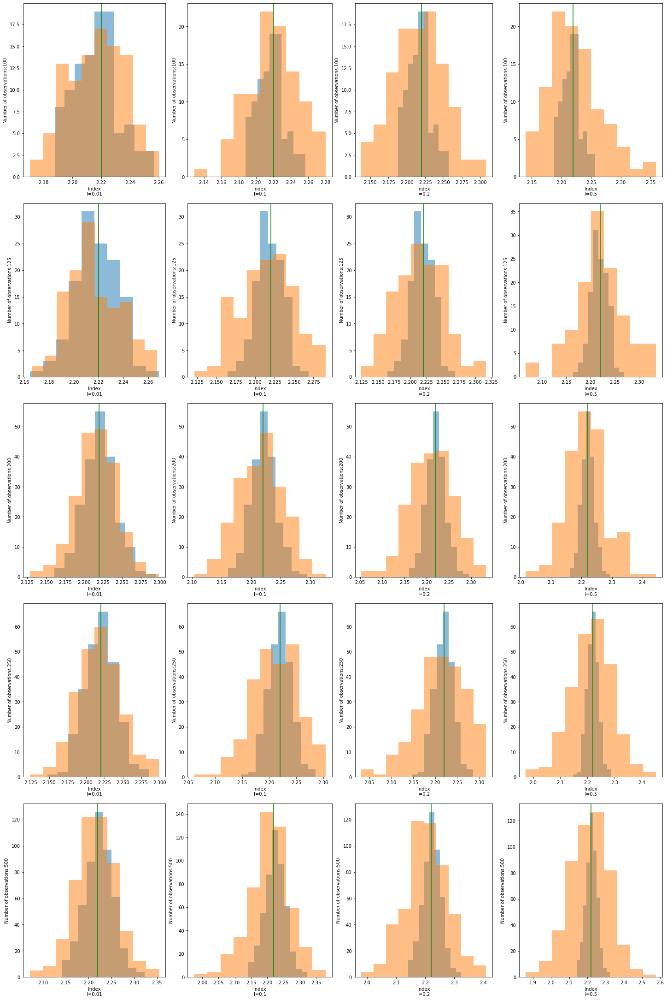

In [23]:
fig = plt.figure(figsize=[20,30],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 4, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[0])
for n in range(5):
    ax = fig.add_subplot(gs1[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.01')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[1])
for n in range(5):
    ax = fig.add_subplot(gs2[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[2])
for n in range(5):
    ax = fig.add_subplot(gs3[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.2')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[3])
for n in range(5):
    ax = fig.add_subplot(gs4[n])
    plt.hist(index[n][0], bins=10, alpha=0.5)
    plt.hist(index[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["index"].value, color="green")
    plt.xlabel('Index\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

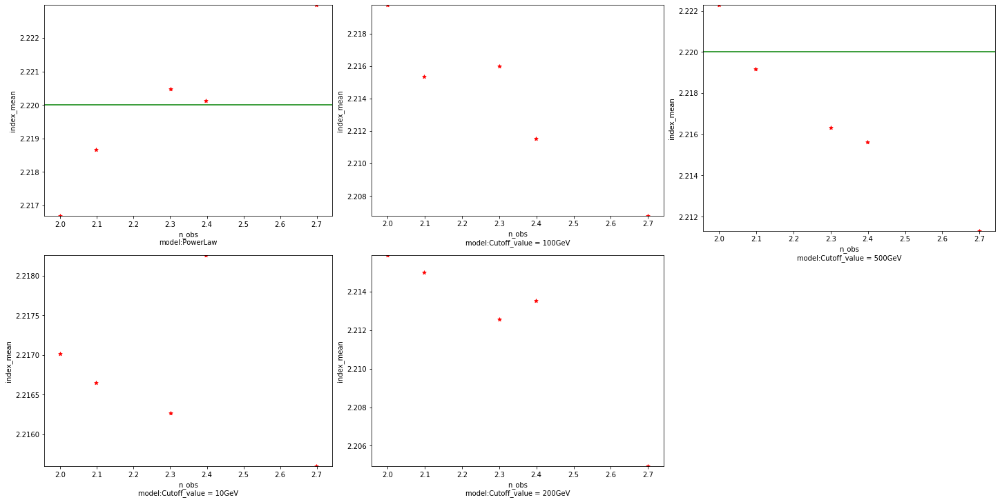

In [24]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('index_mean')
    plt.axhline(y=model_simu.parameters["index"].value, color="green")
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('index_mean')
    plt.axhline(y=model_simu.parameters["index"].value, color="green")
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('index_mean')
    plt.axhline(y=model_simu.parameters["index"].value, color="green")
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

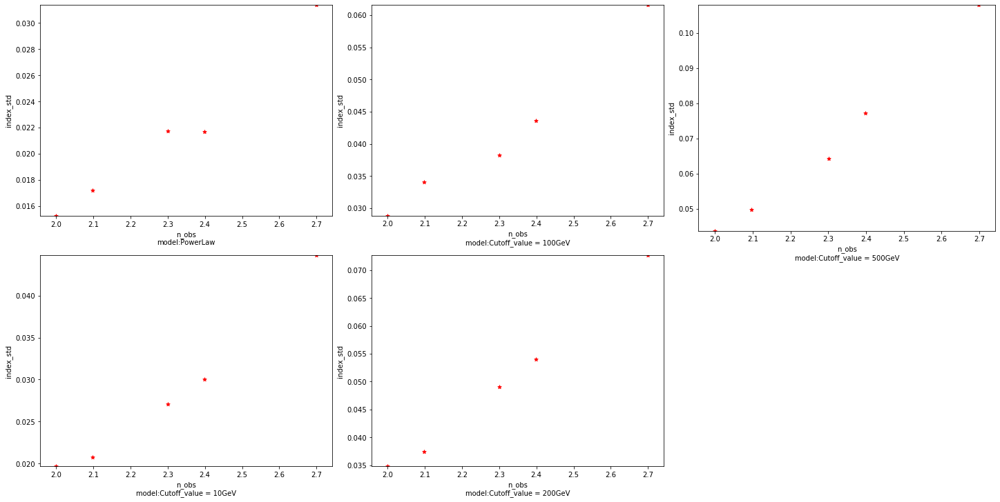

In [25]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('index_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [40]:
for j in range(5):
    print(f"model: {j}")
    for i in range(5):
        mu[i][j]=amplitude[i][j].mean()
        sigma[i][j]=amplitude[i][j].std()
        print(f"amplitude: {amplitude[i][j].mean()} += {amplitude[i][j].std()}")

model: 0
amplitude: 1.2888887052959413e-12 += 3.57959501832845e-14
amplitude: 1.2877199991966106e-12 += 3.561205938471843e-14
amplitude: 1.2857619970255362e-12 += 4.5189513712022054e-14
amplitude: 1.2888102610441641e-12 += 5.3267379774226975e-14
amplitude: 1.2842629374388255e-12 += 7.117945926099253e-14
model: 1
amplitude: 1.290425860660333e-12 += 4.4458513286961385e-14
amplitude: 1.2911065274103796e-12 += 5.046562885240333e-14
amplitude: 1.294144344343764e-12 += 6.379544635622498e-14
amplitude: 1.2939026354537774e-12 += 6.684132491598547e-14
amplitude: 1.299186685091151e-12 += 1.0052989456809088e-13
model: 2
amplitude: 1.2931602083438555e-12 += 7.243818954141991e-14
amplitude: 1.299052832848987e-12 += 7.995573918202133e-14
amplitude: 1.3023215821729956e-12 += 9.054375240533046e-14
amplitude: 1.3122869856086882e-12 += 1.0906040273475626e-13
amplitude: 1.3300431409612436e-12 += 1.5583796008853095e-13
model: 3
amplitude: 1.3005870530493847e-12 += 9.34868467883093e-14
amplitude: 1.3026517

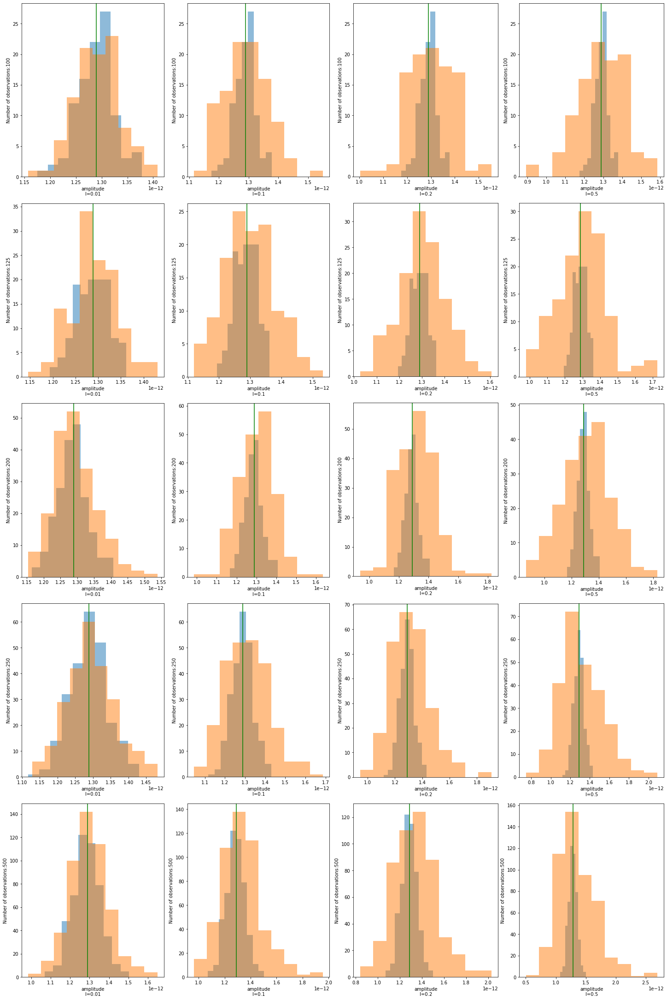

In [41]:
fig = plt.figure(figsize=[20,30],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 4, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[0])
for n in range(5):
    ax = fig.add_subplot(gs1[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][1], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.01')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs2 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[1])
for n in range(5):
    ax = fig.add_subplot(gs2[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][2], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.1')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

gs3 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[2])
for n in range(5):
    ax = fig.add_subplot(gs3[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][3], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.2')
    plt.ylabel(f'Number of observations:{n_obs[n]}')
    
gs4 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[3])
for n in range(5):
    ax = fig.add_subplot(gs4[n])
    plt.hist(amplitude[n][0], bins=10, alpha=0.5)
    plt.hist(amplitude[n][4], bins=10, alpha=0.5)
    plt.axvline(x=model_simu.parameters["amplitude"].value, color="green")
    plt.xlabel('amplitude\nl=0.5')
    plt.ylabel(f'Number of observations:{n_obs[n]}')

plt.show()

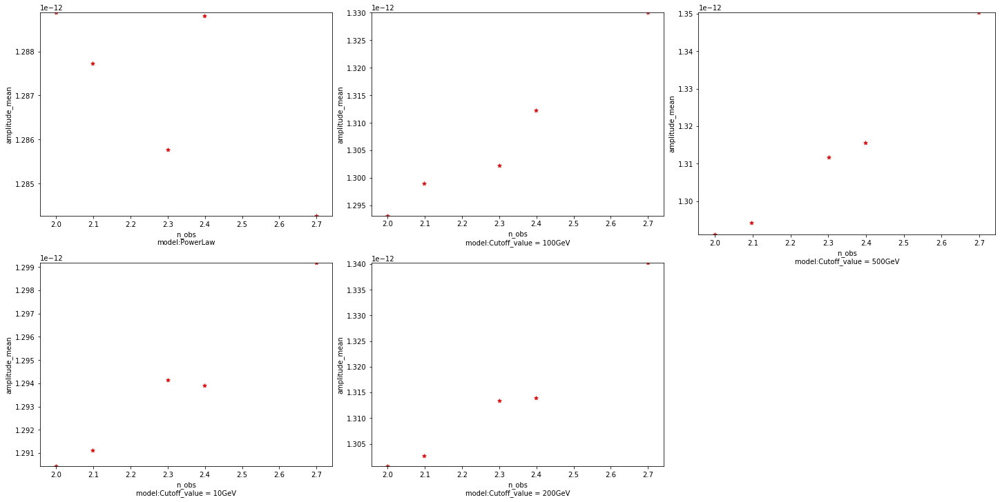

In [42]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('amplitude_mean')
    plt.axhline(y=model_simu.parameters["amplitude"].value, color="green")
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('amplitude_mean')
    plt.axhline(y=model_simu.parameters["amplitude"].value, color="green")
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('amplitude_mean')
    plt.axhline(y=model_simu.parameters["amplitude"].value, color="green")
    plt.ylim(min([row[n+4] for row in mu]),max([row[n+4] for row in mu]))

plt.show()

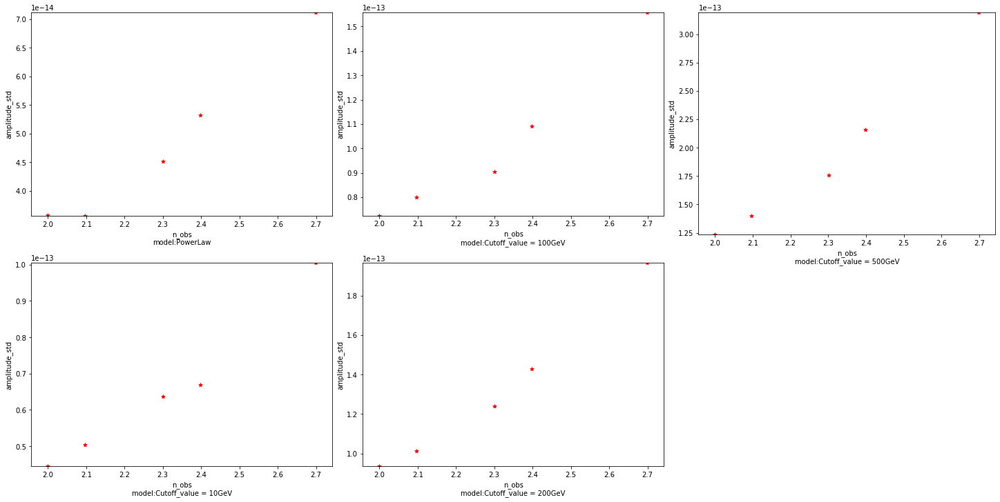

In [43]:
fig = plt.figure(figsize=[20,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 3, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n]}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+2]}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
for n in range(1):
    ax = fig.add_subplot(gs3[n])
    plt.scatter(np.log10(n_obs), [row[n+4] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+4]}')
    plt.ylabel('amplitude_std')
    plt.ylim(min([row[n+4] for row in sigma]),max([row[n+4] for row in sigma]))

plt.show()

In [44]:
for j in range(4):
    print(f"model: {j}")
    for i in range(5):
        mu[i][j]=lambda_[i][j].mean()
        sigma[i][j]=lambda_[i][j].std()
        print(f"lambda_: {lambda_[i][j].mean()} += {lambda_[i][j].std()}")

model: 0
lambda_: 0.010509946233254125 += 0.0051341460205404105
lambda_: 0.011019760791370058 += 0.006360210270854642
lambda_: 0.012327755985205689 += 0.00897221866690156
lambda_: 0.011943299694611227 += 0.010469655034996795
lambda_: 0.015029171632032103 += 0.01629128256488425
model: 1
lambda_: 0.10175645074093595 += 0.01986249934031041
lambda_: 0.10505915857336387 += 0.023551369925986516
lambda_: 0.10545370691069891 += 0.02597685486609018
lambda_: 0.10973955104916071 += 0.03371876192453467
lambda_: 0.11741343633194887 += 0.04650523904217064
model: 2
lambda_: 0.2063533027932767 += 0.032781081474906375
lambda_: 0.20660394223182793 += 0.037256668585932955
lambda_: 0.21225464698555435 += 0.047801710512806926
lambda_: 0.21117212613006023 += 0.055407036346401574
lambda_: 0.2245408713104369 += 0.0772182998335171
model: 3
lambda_: 0.5004663900017365 += 0.07370638062960552
lambda_: 0.5034666721318637 += 0.07820969701639857
lambda_: 0.5128374762715303 += 0.1007190169001281
lambda_: 0.5108237783

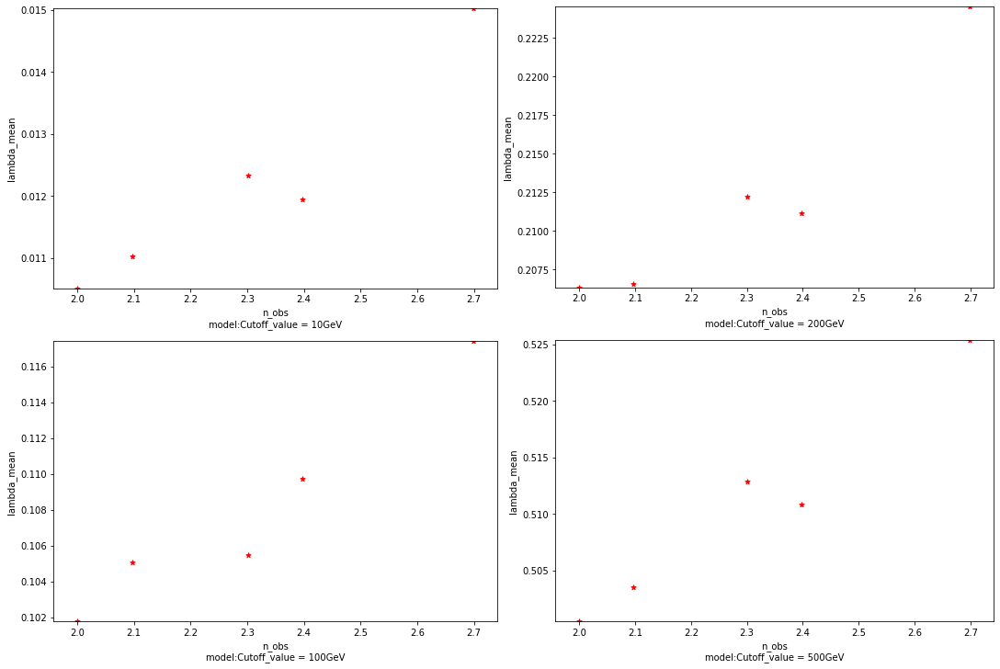

In [45]:
fig = plt.figure(figsize=[15,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 2, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+1]}')
    plt.ylabel('lambda_mean')
    plt.axhline(y=l[n], color="green")
    plt.ylim(min([row[n] for row in mu]),max([row[n] for row in mu]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in mu], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+3]}')
    plt.ylabel('lambda_mean')
    plt.axhline(y=l[n+2], color="green")
    plt.ylim(min([row[n+2] for row in mu]),max([row[n+2] for row in mu]))

plt.show()

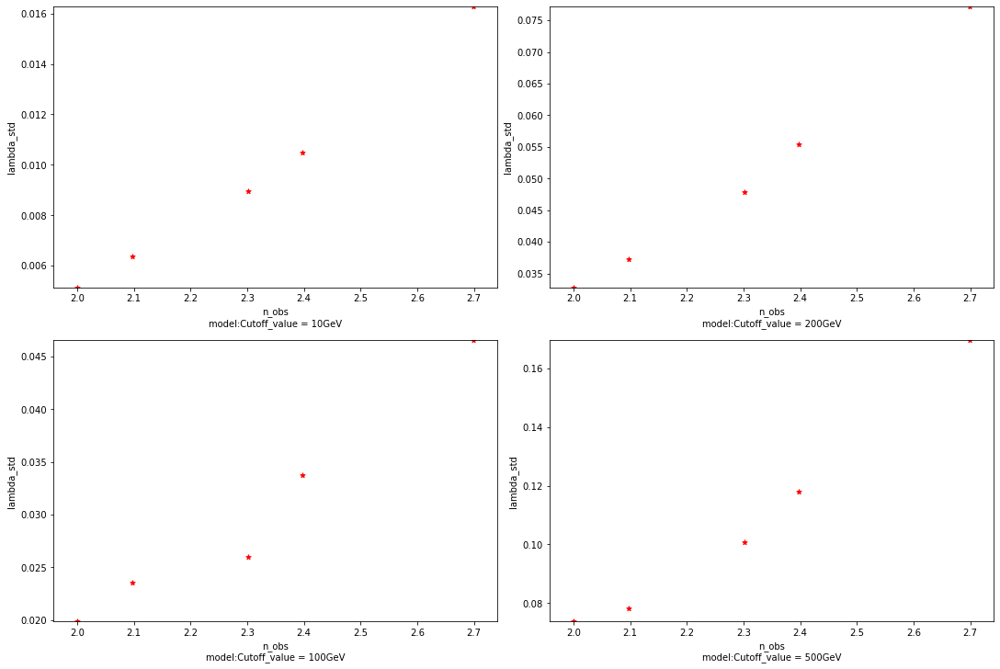

In [46]:
fig = plt.figure(figsize=[15,10],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 2, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
for n in range(2):
    ax = fig.add_subplot(gs1[n])
    plt.scatter(np.log10(n_obs), [row[n] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+1]}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n] for row in sigma]),max([row[n] for row in sigma]))
    
gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
for n in range(2):
    ax = fig.add_subplot(gs2[n])
    plt.scatter(np.log10(n_obs), [row[n+2] for row in sigma], label= "stars", color= "red",  
                marker= "*", s=30)    
    plt.xlabel(f'n_obs\nmodel:{model_name[n+3]}')
    plt.ylabel('lambda_std')
    plt.ylim(min([row[n+2] for row in sigma]),max([row[n+2] for row in sigma]))

plt.show()

In [47]:
sim = [[0 for i in range(cols)] for j in range(rows)]
for i in range(5):
    s = PowerLawSpectralModel(
        index=index[i][0].mean(),
        amplitude=amplitude[i][0].mean() * u.Unit("cm-2 s-1 TeV-1"),
        reference=1 * u.TeV,
    )
    print(s) 
    sim[i][0]=s
    
for j in range(4):
    for i in range(5):
        s = ExpCutoffPowerLawSpectralModel(
            index=index[i][j+1].mean(),
            amplitude=amplitude[i][j+1].mean() * u.Unit("cm-2 s-1 TeV-1"),
            reference=1 * u.TeV,
            lambda_=lambda_[i][j].mean() * u.Unit("TeV-1"),
            alpha = 1,
        )
        print(s)
        sim[i][j+1]=s

PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.217e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.219e+00   nan                nan nan  False
amplitude 1.288e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.286e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
PowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.211e+00   nan                nan nan  False
amplitude 1.350e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.253e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


<function matplotlib.pyplot.show(*args, **kw)>

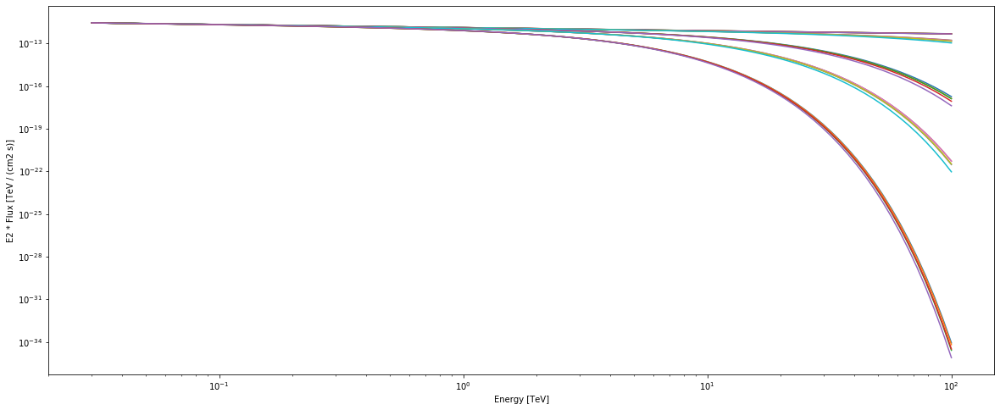

In [48]:
plt.figure(figsize=[20,8])
energy_range = [0.03, 100] * u.TeV
for j in range(5):
    for i in range(5):
        sim[i][j].plot(energy_range=energy_range, energy_power=2)
plt.show

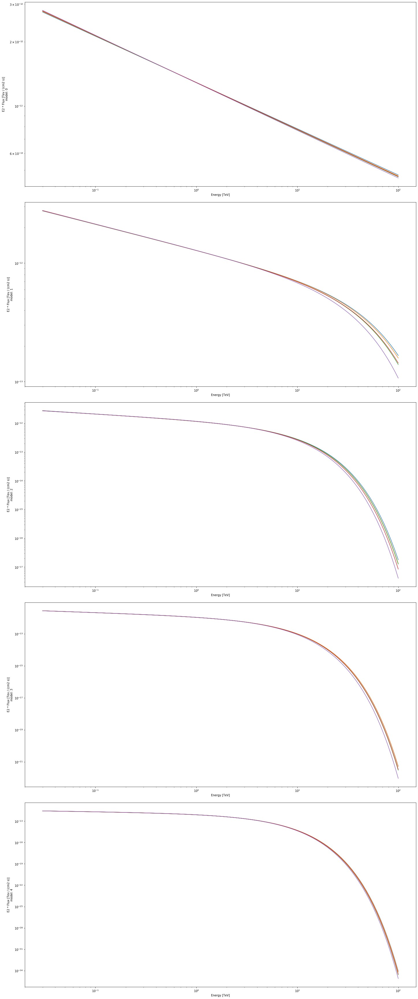

In [49]:
fig = plt.figure(figsize=[20,48],constrained_layout=True)

import matplotlib.gridspec as gridspec

gs0 = gridspec.GridSpec(1, 1, figure=fig)

gs1 = gridspec.GridSpecFromSubplotSpec(5, 1, subplot_spec=gs0[0])
for n in range(5):
    ax = fig.add_subplot(gs1[n])
    for i in range(5):
        sim[i][n].plot(energy_range=energy_range, energy_power=2)
    plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {n}')
    
plt.show()

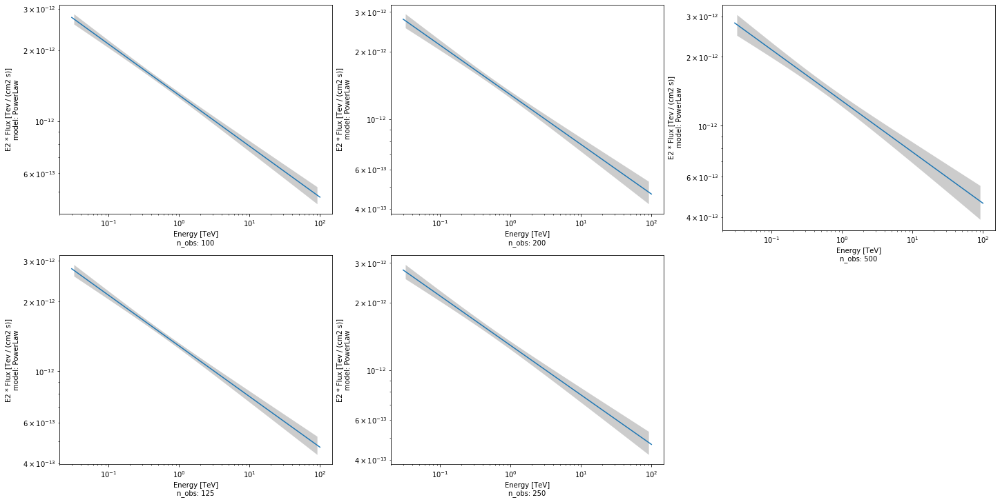

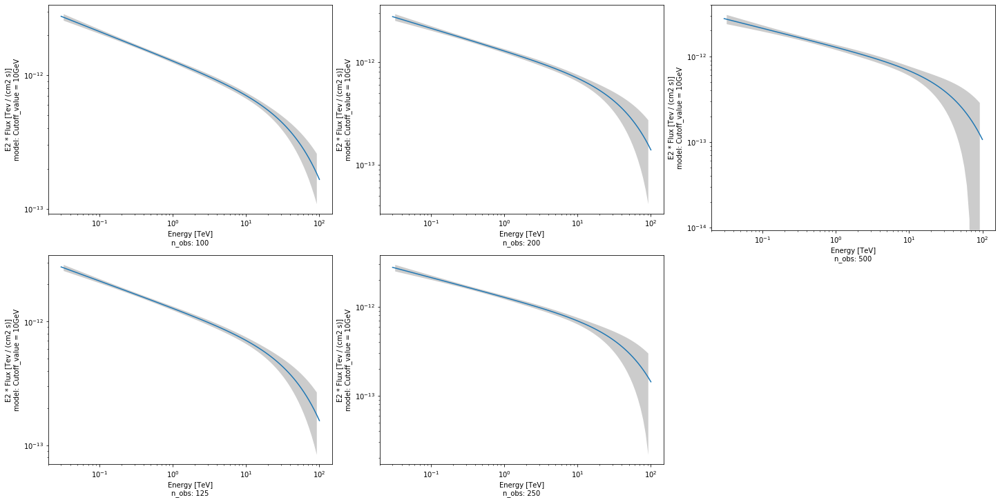

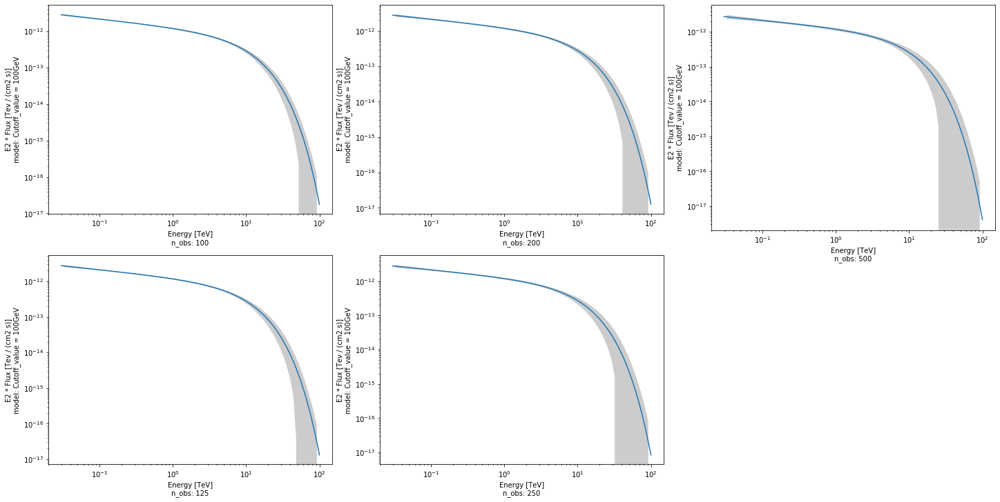

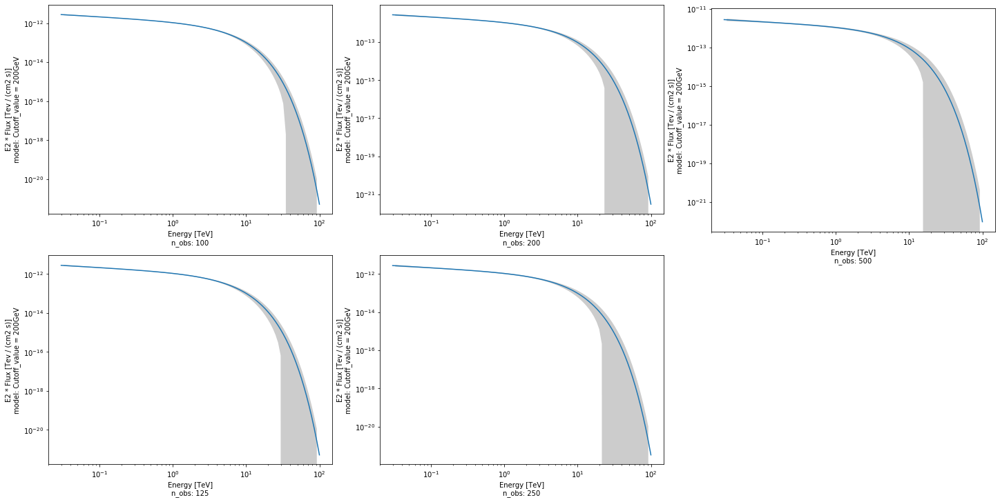

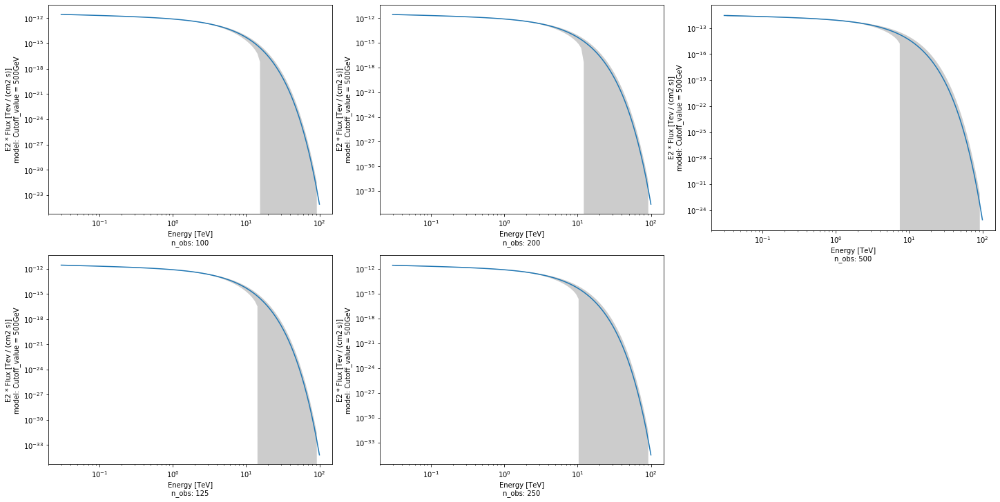

In [50]:
for i in range(5):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i], covar=covar[n][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i], covar=covar[n+2][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][i].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i], covar=covar[n+4][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')


    plt.show()

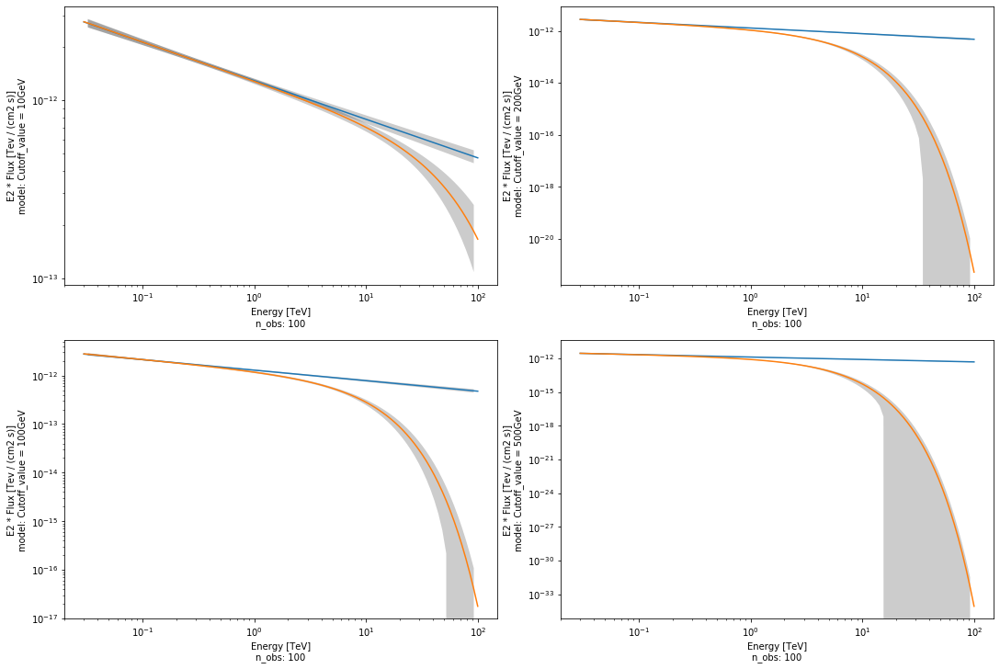

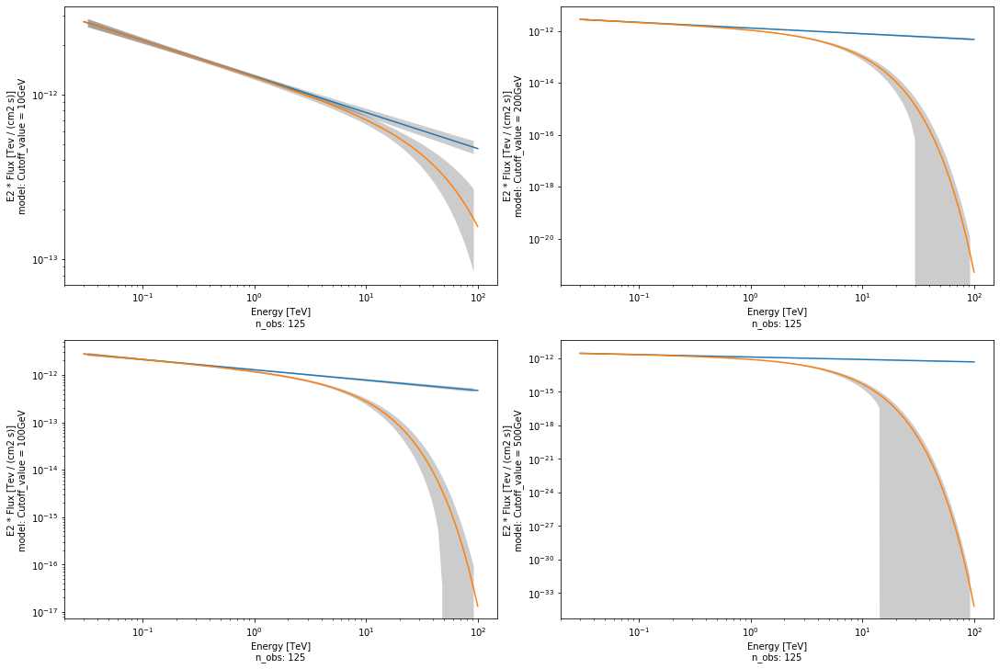

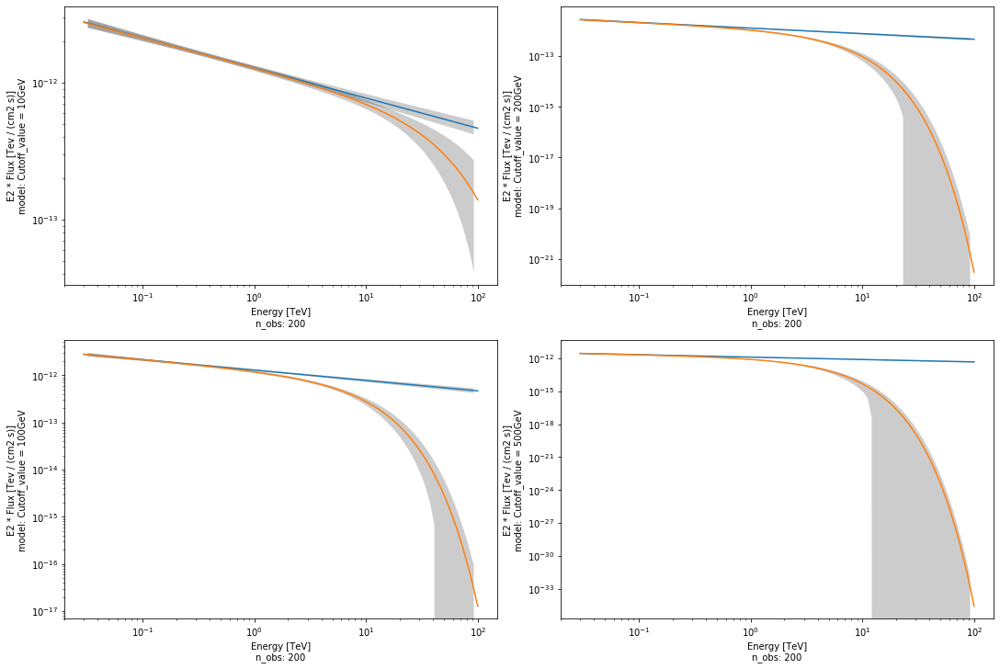

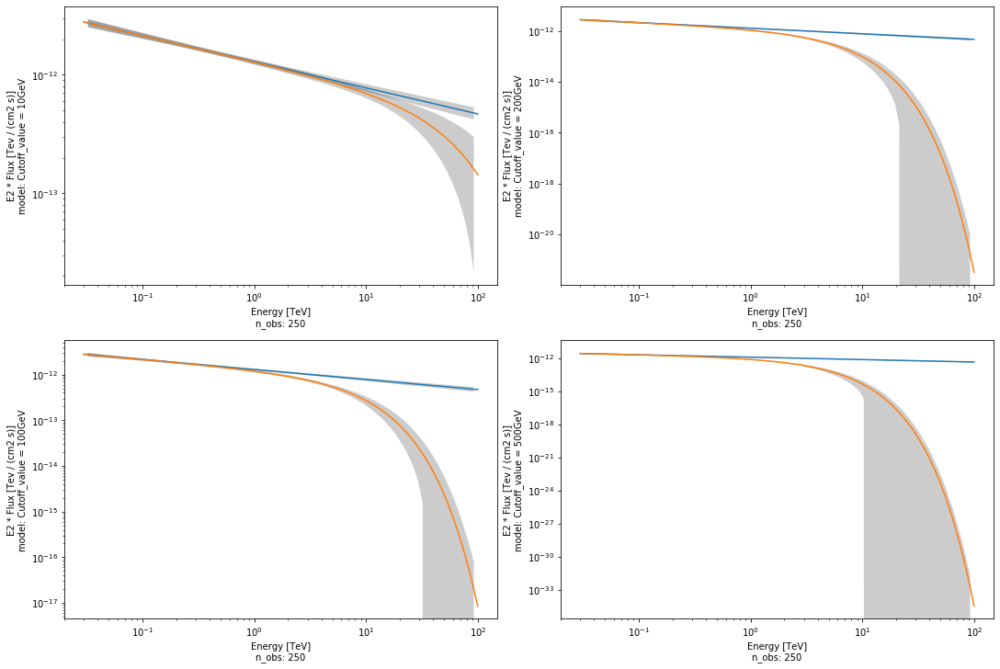

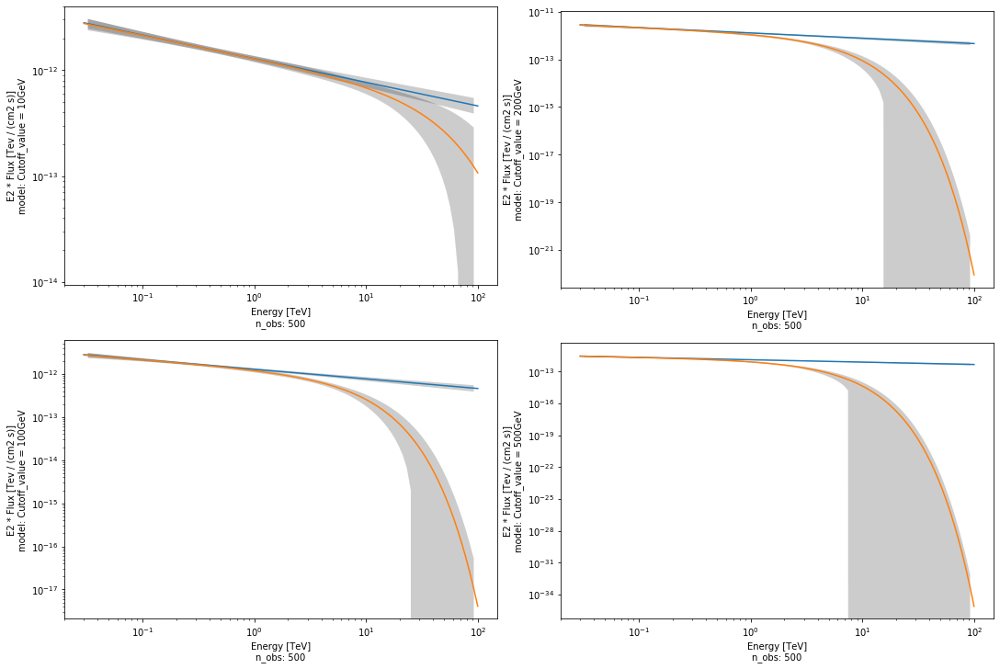

In [51]:
for i in range(5):    
    fig = plt.figure(figsize=[15,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 2, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+1], covar=covar[i][n+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[n+1]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[i][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][0], covar=covar[i][0],energy_range=energy_range, energy_power=2)
        sim[i][n+3].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[i][n+3], covar=covar[i][n+3],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[i]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[n+3]}')


    plt.show()

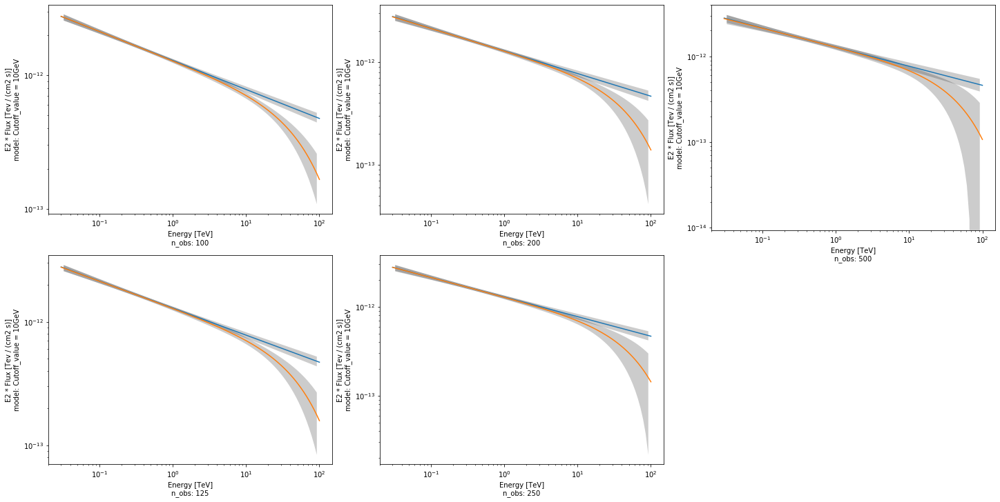

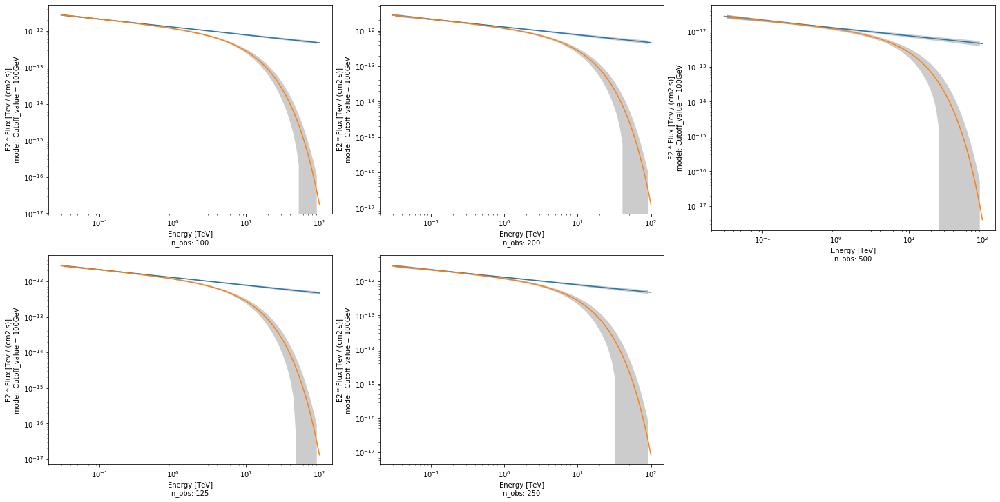

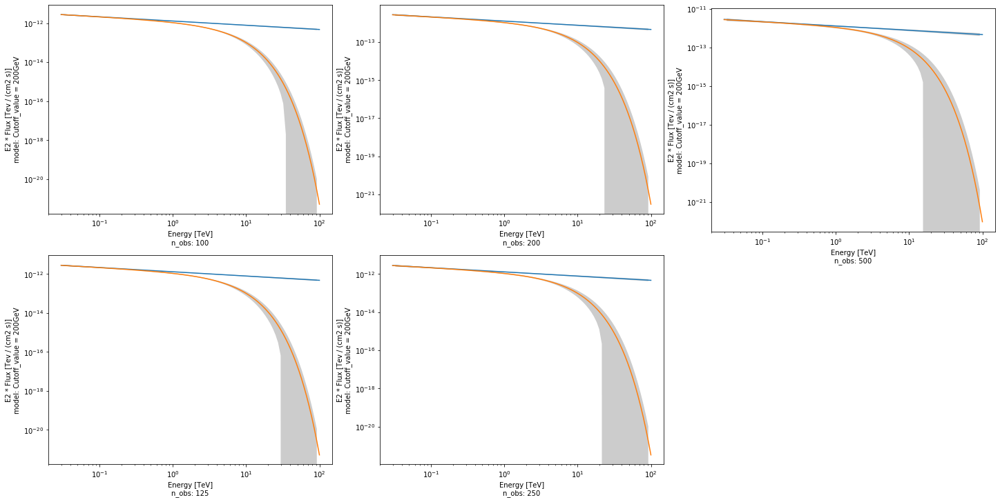

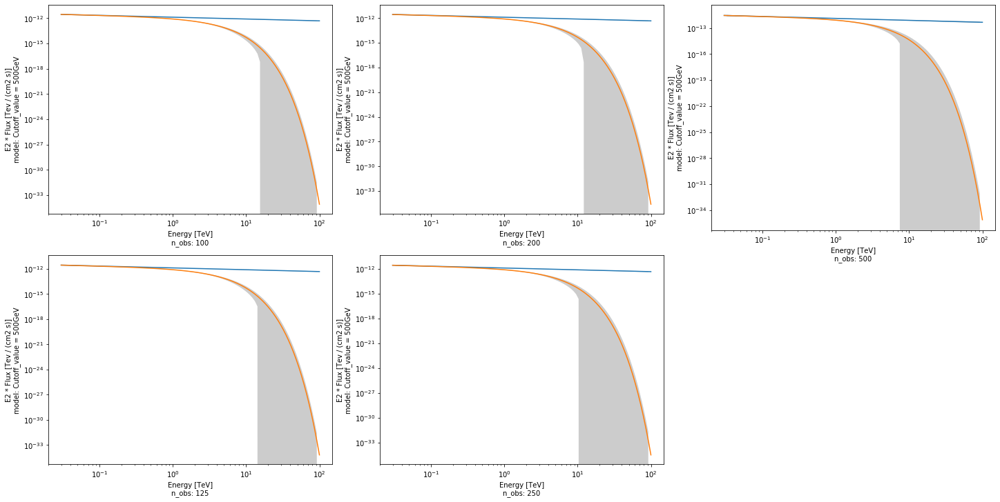

In [52]:
for i in range(4):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][0], covar=covar[n][0],energy_range=energy_range, energy_power=2)
        sim[n][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n][i+1], covar=covar[n][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i+1]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][0], covar=covar[n+2][0],energy_range=energy_range, energy_power=2)
        sim[n+2][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+2][i+1], covar=covar[n+2][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i+1]}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][0].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][0], covar=covar[n+4][0],energy_range=energy_range, energy_power=2)
        sim[n+4][i+1].plot(energy_range=energy_range, energy_power=2)
        plot_error(self=sim[n+4][i+1], covar=covar[n+4][i+1],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i+1]}')


    plt.show()

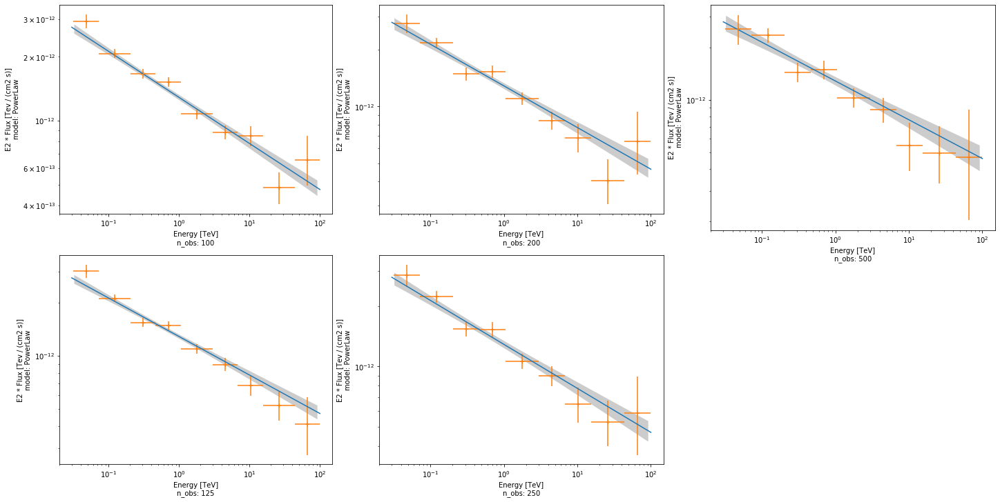

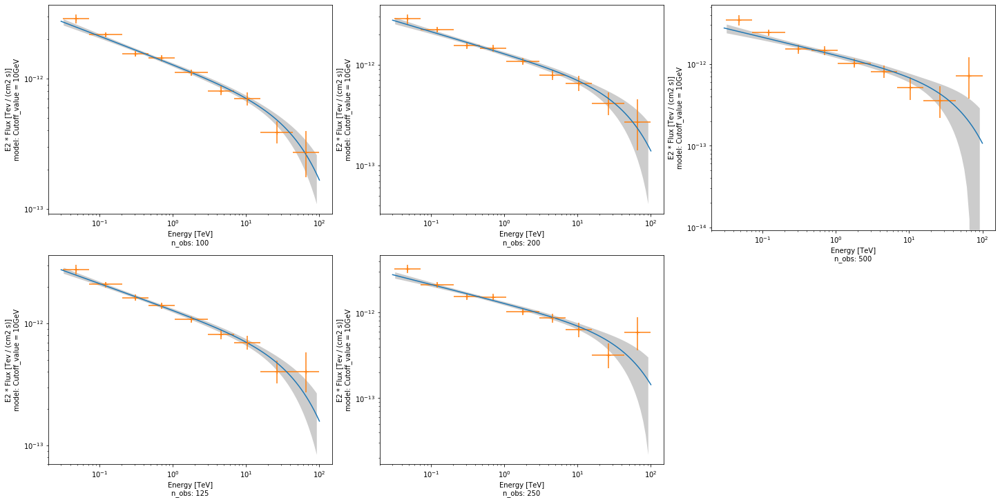

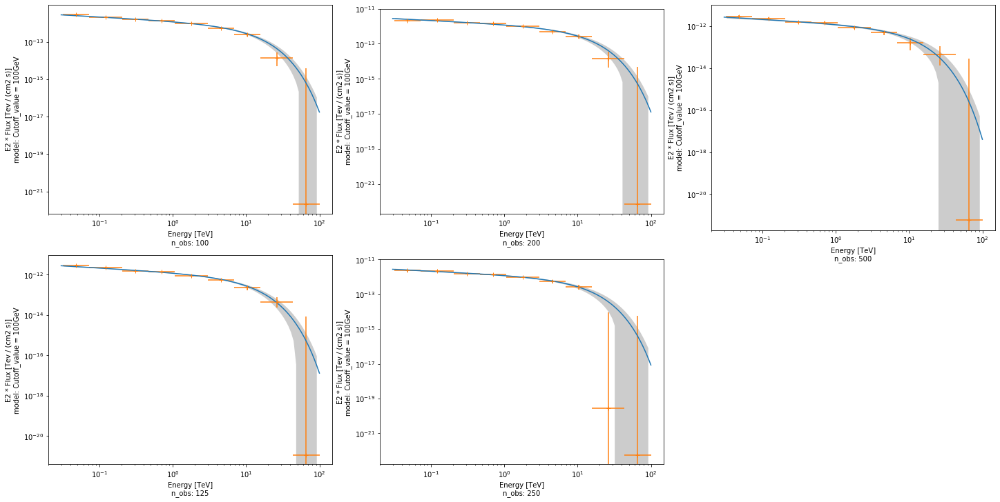

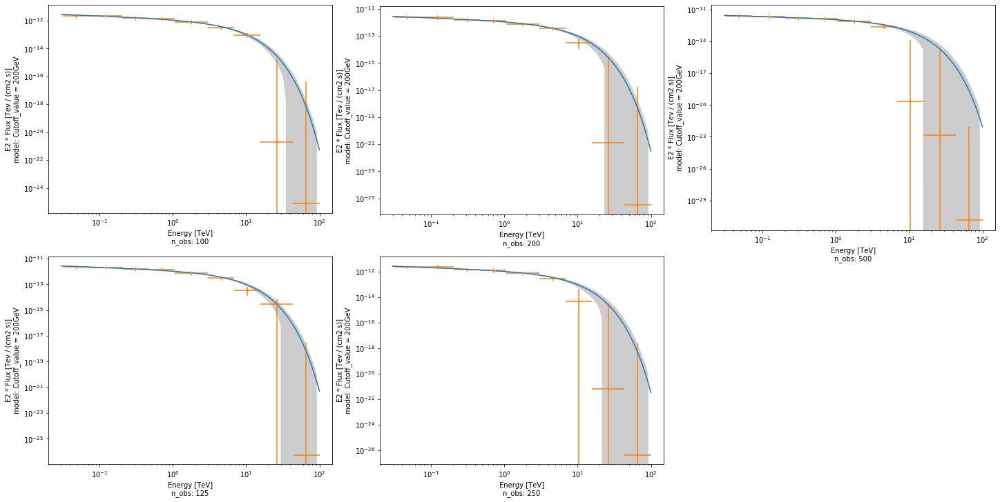

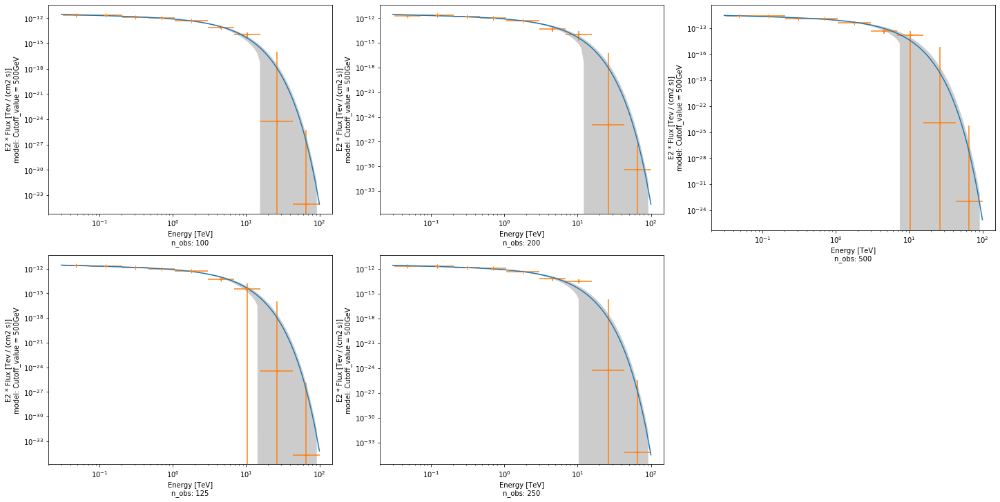

In [53]:
for i in range(5):    
    fig = plt.figure(figsize=[20,10],constrained_layout=True)

    import matplotlib.gridspec as gridspec

    gs0 = gridspec.GridSpec(1, 3, figure=fig)

    gs1 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[0])
    for n in range(2):
        ax = fig.add_subplot(gs1[n])
        sim[n][i].plot(energy_range=energy_range, energy_power=2)
        fpes_all[n][i][0].plot(energy_power=2)
        plot_error(self=sim[n][i], covar=covar[n][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs2 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[1])
    for n in range(2):
        ax = fig.add_subplot(gs2[n])
        sim[n+2][i].plot(energy_range=energy_range, energy_power=2)
        fpes_all[n+2][i][0].plot(energy_power=2)
        plot_error(self=sim[n+2][i], covar=covar[n+2][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+2]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')

    gs3 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=gs0[2])
    for n in range(1):
        ax = fig.add_subplot(gs3[n])
        sim[n+4][i].plot(energy_range=energy_range, energy_power=2)
        fpes_all[n+4][i][0].plot(energy_power=2)
        plot_error(self=sim[n+4][i], covar=covar[n+4][i],energy_range=energy_range, energy_power=2)
        plt.xlabel(f'Energy [TeV]\nn_obs: {n_obs[n+4]}')
        plt.ylabel(f'E2 * Flux [Tev / (cm2 s)]\nmodel: {model_name[i]}')


    plt.show()